# 1. Gompertz Model

In [1]:
import pandas as pd
base_path = ""
gcycles_path = base_path+"gompertz-parameters-per-cycle/"
df_hust_gompertz = pd.read_csv("hust_gompertz_params.csv")

df_hust_gompertz.head()

,file,k,a,b,rul,SoH_above_80,SoH,norm_SoH
0,10-4.csv,0.966029,-4.116644,-16.335186,1811,0.165353,0.965353,0.965353
1,10-6.csv,1.001915,-3.599475,-11.307331,2285,0.186145,0.986145,0.986145
2,9-5.csv,0.981464,-3.618465,-11.454369,2168,0.166389,0.966389,0.966389
3,8-5.csv,0.944335,-4.248935,-22.640850,1348,0.137523,0.937523,0.937523
4,8-4.csv,0.951492,-4.194246,-15.876141,1885,0.146758,0.946758,0.946758


In [2]:
df_hust_gompertz[df_hust_gompertz['file']=='2-3.csv']

,file,k,a,b,rul,SoH_above_80,SoH,norm_SoH
26,2-3.csv,0.966837,-3.957171,-16.188589,1751,0.163437,0.963437,0.963437


In [3]:
df_eg = pd.read_csv(gcycles_path+'2-3-hust_gompertz_params.csv')

df_eg.iloc[::100].head(20)

,Cycle number,k,a,b,rul,max_SoC_above_80,SoH,gompertz-value,gompertz-1st-derivative-value,gompertz-2nd-derivative-value
0,1,1.616522,-0.658601,1.000166,1751,30.795199,0.963437,1.046919e+00,0.454884,-0.257313
100,101,1.677531,-0.559649,1.074348,1651,30.795199,0.949218,1.039549e+00,0.534447,-0.299415
200,201,1.313708,-1.132289,-1.228506,1551,30.795199,0.941313,8.895036e-01,-0.426117,-0.319356
300,301,0.954775,-5.581222,-59.255045,1451,30.795199,0.935665,1.288537e-09,-0.000002,0.001795
400,401,0.966857,-4.167661,-24.672329,1351,30.795199,0.928994,6.263621e-01,-6.708843,-93.665670
500,501,0.999018,-3.047252,-10.509887,1251,30.795199,0.922697,8.370846e-01,-1.555848,-13.460008
600,601,1.059828,-2.242975,-5.282235,1151,30.795199,0.917238,8.721026e-01,-0.898087,-3.819060
700,701,1.097764,-1.957800,-4.094945,1051,30.795199,0.909291,8.835392e-01,-0.785459,-2.518143
800,801,1.073731,-2.127316,-4.750422,951,30.795199,0.901041,8.904167e-01,-0.791850,-3.057427
900,901,1.042271,-2.411027,-6.023780,851,30.795199,0.891861,8.972635e-01,-0.809698,-4.146763


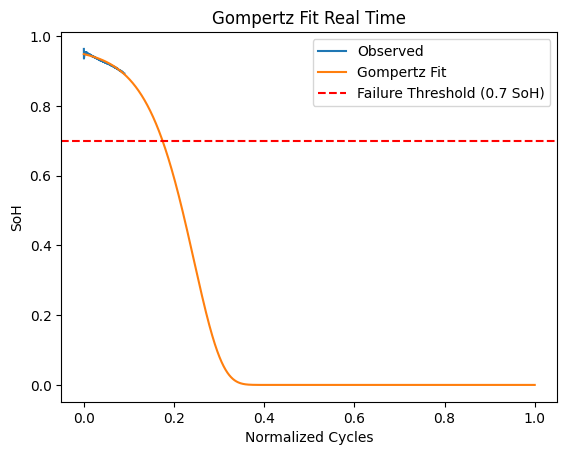

In [4]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

threshold = 900

#Gompertz func
def gompertz_func(x,k,a,b):
    return k*np.exp(-np.exp(a-(b*x)))


x_data = np.array(df_eg['Cycle number'][:threshold].to_list())/10000.0
y_data = np.array(df_eg['SoH'][:threshold].to_list())


# Check input length
assert len(x_data) >= 3 and len(y_data) >= 3, "Need at least 3 data points"

# Initial guess
p0 = [0.966837,-3.957171,-16.188589]

# Fit the curve
#popt, _ = curve_fit(gompertz, x_data, y_data, p0=p0, maxfev=10000)
popt = np.array(p0)#,# _ = curve_fit(gompertz, x_data, y_data, p0=p0, maxfev=10000)
# Predict
x_future = np.linspace(0, 1, 10000)
y_pred = gompertz_func(x_future, *popt)

# Plot
plt.plot(x_data, y_data, label='Observed')
plt.plot(x_future, y_pred, '-', label='Gompertz Fit')
# plt.axhline(0.02, color='red', linestyle='--', label='Threshold')
# plt.legend()
plt.xlabel("Normalized Cycles")
plt.ylabel("SoH")
plt.axhline(y=0.7, color='r', linestyle='--', label=f'Failure Threshold (0.7 SoH)')
plt.title("Gompertz Fit Real Time")
plt.grid(False)
plt.legend()
plt.show()

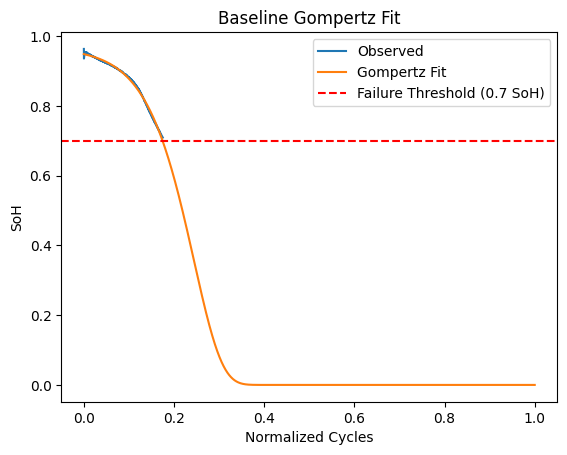

In [5]:
x_data = np.array(df_eg['Cycle number'].to_list())/10000.0
y_data = np.array(df_eg['SoH'].to_list())


# Check input length
assert len(x_data) >= 3 and len(y_data) >= 3, "Need at least 3 data points"

# Initial guess
p0 = [0.966837,-3.957171,-16.188589]

# Fit the curve
#popt, _ = curve_fit(gompertz, x_data, y_data, p0=p0, maxfev=10000)
popt = np.array(p0)#,# _ = curve_fit(gompertz, x_data, y_data, p0=p0, maxfev=10000)
# Predict
x_future = np.linspace(0, 1, 10000)
y_pred = gompertz_func(x_future, *popt)

# Plot
plt.plot(x_data, y_data, label='Observed')
plt.plot(x_future, y_pred, '-', label='Gompertz Fit')
# plt.axhline(0.02, color='red', linestyle='--', label='Threshold')
plt.xlabel("Normalized Cycles")
plt.ylabel("SoH")
plt.axhline(y=0.7, color='r', linestyle='--', label=f'Failure Threshold (0.7 SoH)')
plt.title("Baseline Gompertz Fit")
plt.grid(False)
plt.legend()
plt.show()

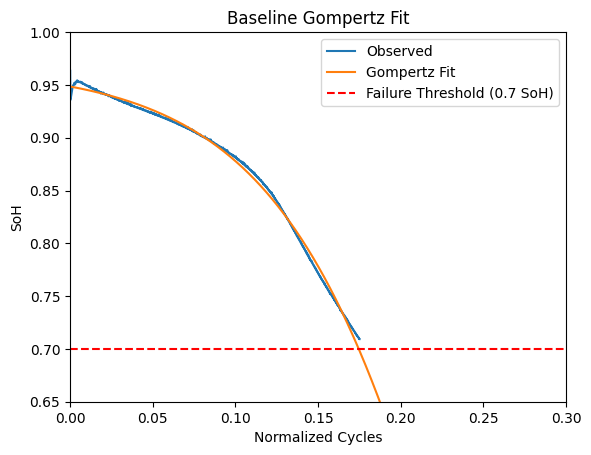

In [6]:
x_data = np.array(df_eg['Cycle number'].to_list())/10000.0
y_data = np.array(df_eg['SoH'].to_list())


# Check input length
assert len(x_data) >= 3 and len(y_data) >= 3, "Need at least 3 data points"

# Initial guess
p0 = [0.966837,-3.957171,-16.188589]

# Fit the curve
#popt, _ = curve_fit(gompertz, x_data, y_data, p0=p0, maxfev=10000)
popt = np.array(p0)#,# _ = curve_fit(gompertz, x_data, y_data, p0=p0, maxfev=10000)
# Predict
x_future = np.linspace(0, 1, 10000)
y_pred = gompertz_func(x_future, *popt)

# Plot
plt.plot(x_data, y_data, label='Observed')
plt.plot(x_future, y_pred, '-', label='Gompertz Fit')
# plt.axhline(0.02, color='red', linestyle='--', label='Threshold')
plt.xlabel("Normalized Cycles")
plt.ylabel("SoH")
plt.axhline(y=0.7, color='r', linestyle='--', label=f'Failure Threshold (0.7 SoH)')
plt.title("Baseline Gompertz Fit")
plt.ylim(0.65,1)
plt.xlim(0,0.3)
plt.grid(False)
plt.legend()
plt.show()

In [7]:
def inverse_gompertz_func(y,k,a,b):
    return (a - np.log(np.log(k/y)))/b

print(f"Estimated RUL (cycle count to reach 70% SoH): {inverse_gompertz_func(0.7,*popt)*10000:.2f} cycles")

Estimated RUL (cycle count to reach 70% SoH): 1746.24 cycles


In [8]:
import numpy as np
from sklearn.metrics import root_mean_squared_error

rmse = root_mean_squared_error([1746], [1751])
rmse

5.0

## 1. a hust target values

In [9]:
df_hust_gompertz.head()

,file,k,a,b,rul,SoH_above_80,SoH,norm_SoH
0,10-4.csv,0.966029,-4.116644,-16.335186,1811,0.165353,0.965353,0.965353
1,10-6.csv,1.001915,-3.599475,-11.307331,2285,0.186145,0.986145,0.986145
2,9-5.csv,0.981464,-3.618465,-11.454369,2168,0.166389,0.966389,0.966389
3,8-5.csv,0.944335,-4.248935,-22.640850,1348,0.137523,0.937523,0.937523
4,8-4.csv,0.951492,-4.194246,-15.876141,1885,0.146758,0.946758,0.946758


In [10]:
list_of_pred_rul = [] #store predicted rul in a list
list_of_rmse = [] #store rmses
print('File : k   a   b   RUL   PRED_RUL     RMSE')
for i, row in df_hust_gompertz.iterrows():
    file,k,a,b,rul = row['file'],row['k'],row['a'],row['b'],row['rul']
    pred_rul = inverse_gompertz_func(0.7,k,a,b)*10000
    list_of_pred_rul.append(pred_rul)
    rmse = root_mean_squared_error([rul], [pred_rul])
    
    list_of_rmse.append(rmse)
    print(file,' : ',k,a,b, rul,pred_rul,rmse)

df_hust_gompertz['gompertz_predicted_rul'] = list_of_pred_rul
df_hust_gompertz['predicted_rul_rmse'] = list_of_rmse

File : k   a   b   RUL   PRED_RUL     RMSE
10-4.csv  :  0.9660292206090124 -4.116644018360366 -16.335185691602785 1811 1826.6051778529343 15.605177852934276
10-6.csv  :  1.0019154296635333 -3.599475413288634 -11.307331305059389 2285 2276.3070012833623 8.692998716637703
9-5.csv  :  0.981464151043511 -3.618464696472205 -11.454368620198496 2168 2211.952744888143 43.952744888143116
8-5.csv  :  0.9443346423887152 -4.248935278939007 -22.6408503927126 1348 1344.0137165253186 3.986283474681386
8-4.csv  :  0.9514917615371856 -4.194246054160375 -15.87614099919125 1885 1897.928408262152 12.928408262152061
4-1.csv  :  0.9748219144504556 -3.372628308385728 -9.707455519054928 2217 2335.852431552869 118.8524315528689
5-3.csv  :  0.9844118914582962 -3.3709065752692604 -8.364139116718416 2689 2743.7711757192583 54.77117571925828
4-6.csv  :  0.9556436359189496 -3.6759504568302033 -17.921463208477554 1380 1399.979154190412 19.97915419041192
9-2.csv  :  0.9868160438257112 -3.552350965523672 -11.4554381726

In [11]:
df_hust_gompertz['predicted_rul_rmse'].mean(),df_hust_gompertz['predicted_rul_rmse'].median(),df_hust_gompertz['rul'].mean()

(27.904524098022396, 19.42275428058724, 1897.6883116883116)

In [12]:
df_hust_gompertz.head()

,file,k,a,b,rul,SoH_above_80,SoH,norm_SoH,gompertz_predicted_rul,predicted_rul_rmse
0,10-4.csv,0.966029,-4.116644,-16.335186,1811,0.165353,0.965353,0.965353,1826.605178,15.605178
1,10-6.csv,1.001915,-3.599475,-11.307331,2285,0.186145,0.986145,0.986145,2276.307001,8.692999
2,9-5.csv,0.981464,-3.618465,-11.454369,2168,0.166389,0.966389,0.966389,2211.952745,43.952745
3,8-5.csv,0.944335,-4.248935,-22.640850,1348,0.137523,0.937523,0.937523,1344.013717,3.986283
4,8-4.csv,0.951492,-4.194246,-15.876141,1885,0.146758,0.946758,0.946758,1897.928408,12.928408


In [13]:
root_mean_squared_error(df_hust_gompertz['rul'].to_list(),df_hust_gompertz['gompertz_predicted_rul'].to_list())

38.338871395900966

In [14]:
# 1. Calculate your standard RMSE 
rmse = root_mean_squared_error(df_hust_gompertz['rul'], df_hust_gompertz['gompertz_predicted_rul'])

# 2. Calculate the mean of the actual RUL
mean_rul = df_hust_gompertz['rul'].mean()

# 3. Calculate RMSE as a percentage (NRMSE)
nrmse_percent = (rmse / mean_rul) * 100

print(f"RMSE: {rmse}")
print(f"RMSE as % of Mean RUL: {nrmse_percent:.2f}%")

RMSE: 38.338871395900966
RMSE as % of Mean RUL: 2.02%


In [15]:
print(f'Proof of concept rmse : {df_hust_gompertz['predicted_rul_rmse'].mean():.2f} %rmse : {df_hust_gompertz['predicted_rul_rmse'].mean()*100/df_hust_gompertz['rul'].mean():.2f} %')

Proof of concept rmse : 27.90 %rmse : 1.47 %


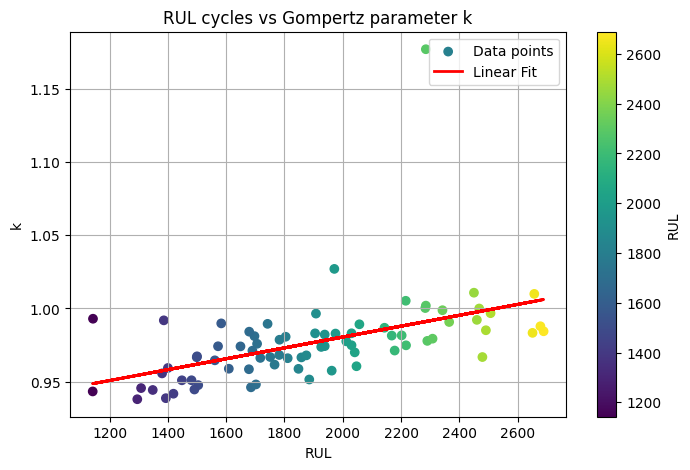

In [16]:
x = df_hust_gompertz['rul']#np.linspace(0, 10, 100)
y = df_hust_gompertz['k']#np.sin(x) + 0.1 * np.random.randn(100)

# Gradient color based on x
colors = x

# Fit a line (1st degree polynomial)
coeffs = np.polyfit(x, y, deg=1)
fit_line = np.poly1d(coeffs)

# Plot
plt.figure(figsize=(8, 5))
scatter = plt.scatter(x, y, c=colors, cmap='viridis', label='Data points')
plt.plot(x, fit_line(x), color='red', linewidth=2, label='Linear Fit')
plt.colorbar(scatter, label='RUL')
plt.xlabel('RUL')
plt.ylabel('k')
plt.title('RUL cycles vs Gompertz parameter k')
plt.legend()
plt.grid(True)
plt.show()

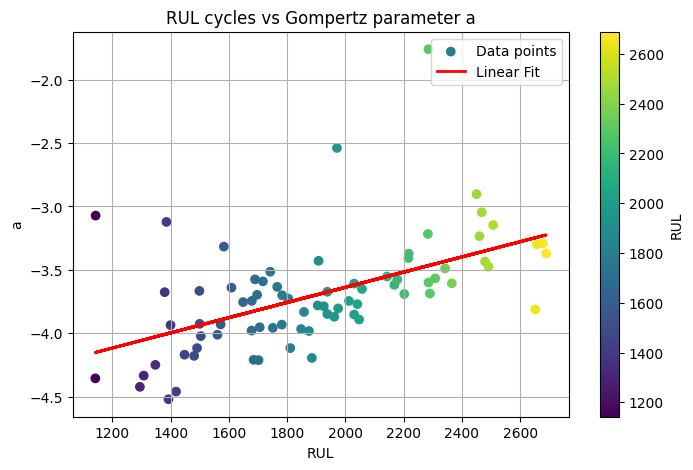

In [17]:
x = df_hust_gompertz['rul']#np.linspace(0, 10, 100)
y = df_hust_gompertz['a']#np.sin(x) + 0.1 * np.random.randn(100)

# Gradient color based on x
colors = x

# Fit a line (1st degree polynomial)
coeffs = np.polyfit(x, y, deg=1)
fit_line = np.poly1d(coeffs)

# Plot
plt.figure(figsize=(8, 5))
scatter = plt.scatter(x, y, c=colors, cmap='viridis', label='Data points')
plt.plot(x, fit_line(x), color='red', linewidth=2, label='Linear Fit')
plt.colorbar(scatter, label='RUL')
plt.xlabel('RUL')
plt.ylabel('a')
plt.title('RUL cycles vs Gompertz parameter a')
plt.legend()
plt.grid(True)
plt.show()

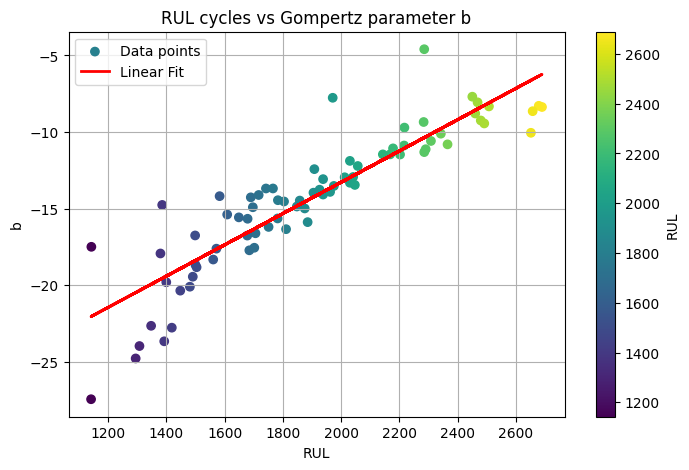

In [18]:
x = df_hust_gompertz['rul']#np.linspace(0, 10, 100)
y = df_hust_gompertz['b']#np.sin(x) + 0.1 * np.random.randn(100)

# Gradient color based on x
colors = x

# Fit a line (1st degree polynomial)
coeffs = np.polyfit(x, y, deg=1)
fit_line = np.poly1d(coeffs)

# Plot
plt.figure(figsize=(8, 5))
scatter = plt.scatter(x, y, c=colors, cmap='viridis', label='Data points')
plt.plot(x, fit_line(x), color='red', linewidth=2, label='Linear Fit')
plt.colorbar(scatter, label='RUL')
plt.xlabel('RUL')
plt.ylabel('b')
plt.title('RUL cycles vs Gompertz parameter b')
plt.legend()
plt.grid(True)
plt.show()

In [19]:
import matplotlib.pyplot as plt
import numpy as np

def multi_battery_bar_plot(battery_data_dict):
    battery_ids = list(battery_data_dict.keys())
    true_ruls = [vals[1] for vals in battery_data_dict.values()]  # y_true
    pred_ruls = [vals[2] for vals in battery_data_dict.values()]  # y_pred

    x = np.arange(len(battery_ids))  # label locations
    width = 0.35  # width of bars

    plt.figure(figsize=(12, 6))
    plt.bar(x - width/2, true_ruls, width, label='True RUL')
    plt.bar(x + width/2, pred_ruls, width, label='Predicted RUL')

    plt.xlabel('Battery ID')
    plt.ylabel('Remaining Useful Life')
    plt.title('Gompertz True vs Predicted RUL per Battery')
    # plt.xticks(x, battery_ids)
    plt.xticks(x, battery_ids, rotation=60)
    plt.legend()
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

def multi_battery_scatter_plot(battery_data_dict):
    battery_ids = list(battery_data_dict.keys())
    true_ruls = [vals[1] for vals in battery_data_dict.values()]  # y_true
    pred_ruls = [vals[2] for vals in battery_data_dict.values()]  # y_pred

    x = np.arange(len(battery_ids))  # Numeric x positions for scatter plot

    plt.figure(figsize=(12, 6))
    plt.scatter(x, true_ruls, color='blue', label='True RUL', marker='o')
    plt.scatter(x, pred_ruls, color='orange', label='Predicted RUL', marker='x')

    plt.xlabel('Battery ID')
    plt.ylabel('Remaining Useful Life')
    plt.title('Gompertz True vs Predicted RUL per Battery')
    plt.xticks(x, battery_ids, rotation=60)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [20]:
battery_data_dict = {}
for i, row in df_hust_gompertz.iterrows():
    battery_data_dict[row['file'].split('.')[0]] = (None,row['rul'],row['gompertz_predicted_rul'])

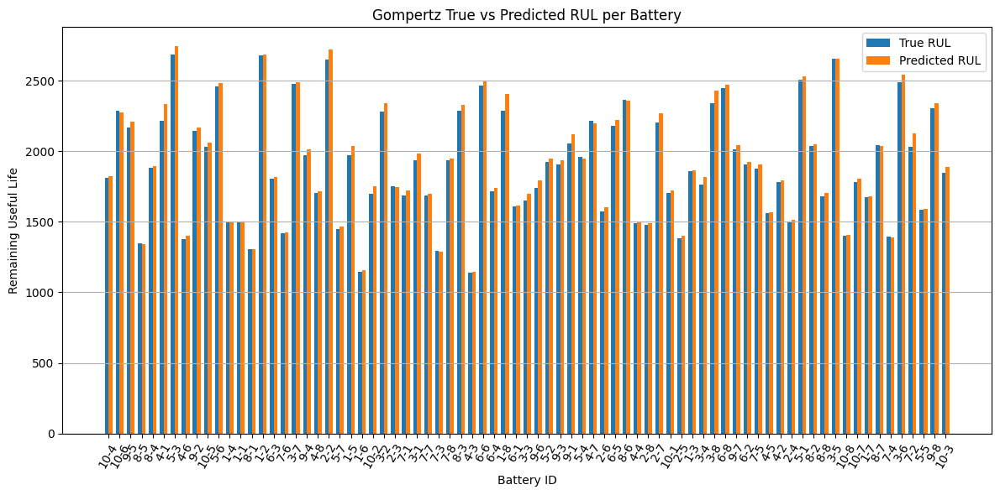

In [21]:
multi_battery_bar_plot(battery_data_dict)

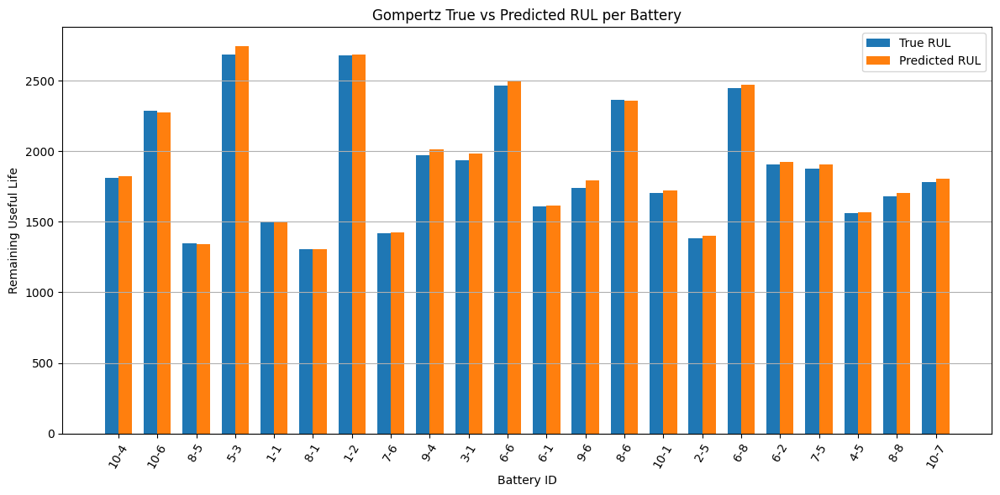

In [22]:
# test = ['7-6.csv','10-5.csv','7-7.csv','7-4.csv','4-7.csv','2-6.csv','10-2.csv','1-6.csv','8-4.csv','2-5.csv','1-1.csv','2-2.csv'] #My initial test csvs

train_ids = [
    '1-3',  '1-4',  '1-5',  '1-6',  '1-7',  '1-8',  '2-2',  '2-3',
    '2-4',  '2-6',  '2-7',  '2-8',  '3-2',  '3-3',  '3-4',  '3-5',
    '3-6',  '3-7',  '3-8',  '4-1',  '4-2',  '4-3',  '4-4',  '4-6',
    '4-7',  '4-8',  '5-1',  '5-2',  '5-4',  '5-5',  '5-6',  '5-7',
    '6-3',  '6-4',  '6-5',  '7-1',  '7-2',  '7-3',  '7-4',  '7-7',
    '7-8',  '8-2',  '8-3',  '8-4',  '8-7',  '9-1',  '9-2',  '9-3',
    '9-5',  '9-7',  '9-8',  '10-2', '10-3', '10-5', '10-8']

test_ids = [
    '1-1',  '1-2',  '2-5',  '3-1',  '4-5',  '5-3',  '6-1',  '6-2',
    '6-6',  '6-8',  '7-5',  '7-6',  '8-1',  '8-5',  '8-6',  '8-8',
    '9-4',  '9-6',  '10-1', '10-4', '10-6', '10-7']

test = [i+'.csv' for i in test_ids] #similar to BatteryML HUST test cells 

battery_data_dict = {}
for i, row in df_hust_gompertz.iterrows():
    if row['file'] in test:
        battery_data_dict[row['file'].split('.')[0]] = (None,row['rul'],row['gompertz_predicted_rul'])

multi_battery_bar_plot(battery_data_dict)

In [23]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import torch
import torch.nn as nn

def multi_battery_bar_plot(battery_data_dict):
    battery_ids = list(battery_data_dict.keys())
    true_ruls = [vals[1] for vals in battery_data_dict.values()]  # y_true
    pred_ruls = [vals[2] for vals in battery_data_dict.values()]  # y_pred

    # Compute losses
    mse = mean_squared_error(true_ruls, pred_ruls)
    mae = mean_absolute_error(true_ruls, pred_ruls)
    
    # For Huber Loss, need tensors
    y_true_tensor = torch.tensor(true_ruls, dtype=torch.float32)
    y_pred_tensor = torch.tensor(pred_ruls, dtype=torch.float32)
    huber_loss_fn = nn.SmoothL1Loss()
    huber = huber_loss_fn(y_pred_tensor, y_true_tensor).item()

    # Print losses
    print(f"Mean Squared Error (MSE): {mse:.4f}")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"Huber Loss: {huber:.4f}")
    print(f"Root Mean Squared Error (RMSE): {np.sqrt(mse):.4f}")

    # Plot
    x = np.arange(len(battery_ids))  # label locations
    width = 0.35  # width of bars

    plt.figure(figsize=(12, 6))
    plt.bar(x - width/2, true_ruls, width, label='True RUL')
    plt.bar(x + width/2, pred_ruls, width, label='Predicted RUL')

    plt.xlabel('Battery ID')
    plt.ylabel('Remaining Useful Life')
    plt.title('Gompertz True vs Predicted RUL per Battery')
    plt.xticks(x, battery_ids, rotation=60)
    plt.legend()
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()
    return mse,mae,huber,np.sqrt(mse)

Mean Squared Error (MSE): 642.0155
Mean Absolute Error (MAE): 19.7571
Huber Loss: 19.2573
Root Mean Squared Error (RMSE): 25.3380


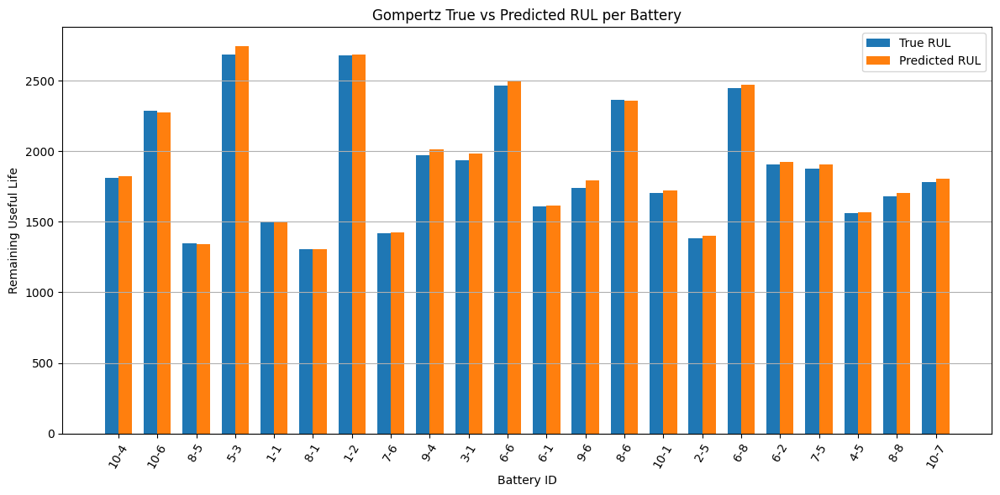

(642.015464452155, 19.757089260914405, 19.257299423217773, 25.338024083423612)

In [24]:
multi_battery_bar_plot(battery_data_dict)

## 1. b per cycle error calculation

In [25]:
import re
import os

files = os.listdir(base_path+"csv-summary/")
#Filter out non-csv files, folders or csv that don't start with a digit

filtered = [f for f in files if re.match(r'^\d', f) and f.endswith('.csv')]

print(len(filtered))

pairs = [re.match(r'^(\d+-\d+)', f).group(1) for f in filtered]

print(pairs)

77
['10-4', '10-6', '9-5', '8-5', '8-4', '4-1', '5-3', '4-6', '9-2', '10-5', '5-6', '1-4', '1-1', '8-1', '1-2', '6-3', '7-6', '3-7', '9-4', '4-8', '2-2', '5-7', '1-5', '1-6', '10-2', '3-2', '2-3', '7-1', '3-1', '7-7', '7-3', '7-8', '8-3', '4-3', '6-6', '6-4', '1-8', '6-1', '3-3', '9-6', '5-2', '9-3', '9-1', '5-4', '4-7', '2-6', '6-5', '8-6', '4-4', '2-8', '2-7', '10-1', '2-5', '1-3', '3-4', '3-8', '6-8', '9-7', '6-2', '7-5', '4-5', '4-2', '2-4', '5-1', '8-2', '8-8', '3-5', '10-8', '10-7', '1-7', '8-7', '7-4', '3-6', '7-2', '5-5', '9-8', '10-3']


In [26]:
cycle_lengths = []
cycle_lengths_sort = {}
#Correlation of k, a and b with cycle number
##Place k, a and b of all cells in all cycles in one dataframe
for choice in pairs:
    gompertz_df_full = pd.read_csv(base_path + 'gompertz-parameters-per-cycle/' + choice + "-hust_gompertz_params.csv")
    cycle_lengths.append(gompertz_df_full.shape[0])
    cycle_lengths_sort[choice] = gompertz_df_full.shape[0]
print(f"Max : {max(cycle_lengths)}, Min : {min(cycle_lengths)}")


#sort pairs by RUL
pairs = sorted(cycle_lengths_sort, key=cycle_lengths_sort.get)
print(pairs)

Max : 2689, Min : 1142
['4-3', '1-6', '7-3', '8-1', '8-5', '4-6', '2-5', '7-4', '10-8', '7-6', '5-7', '2-8', '4-4', '2-4', '1-4', '1-1', '4-5', '2-6', '5-5', '6-1', '3-3', '1-7', '8-8', '7-7', '7-1', '10-2', '10-1', '4-8', '6-4', '9-6', '2-3', '3-4', '4-2', '10-7', '6-3', '10-4', '10-3', '1-3', '7-5', '8-4', '9-3', '6-2', '5-2', '3-1', '7-8', '5-4', '1-5', '9-4', '9-7', '10-5', '7-2', '8-2', '8-7', '9-1', '9-2', '9-5', '6-5', '2-7', '4-7', '4-1', '3-2', '10-6', '1-8', '8-3', '9-8', '3-8', '8-6', '6-8', '5-6', '6-6', '3-7', '3-6', '5-1', '2-2', '3-5', '1-2', '5-3']


In [27]:
# Consolidate k,a,b data per cycle
unified_gompertz = {}
for choice in pairs:
    #get file
    gompertz_df_full = pd.read_csv(base_path + 'gompertz-parameters-per-cycle/' + choice + "-hust_gompertz_params.csv")
    #add cell name
    gompertz_df_full['cell_name'] = choice
    for i in range(1,max(cycle_lengths)+1,1):
        try:
            temp_data = gompertz_df_full[gompertz_df_full["Cycle number"]==i].iloc[0].to_dict()
        except:
            temp_data = {'Cycle number': i, 'k': None, 'a': None,'b': None, 'rul': None, 'max_SoC_above_80': None,'SoH': None, 'cell_name': choice}
        try:
            unified_gompertz[i].append(temp_data)
        except:
            unified_gompertz[i] = []
            unified_gompertz[i].append(temp_data)

In [28]:
unified_gompertz.keys()

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 22

In [29]:
import pickle
#help(pickle)
#save consolidated gompertz per cycle as a pickle file

with open('unified_gompertz.pkl', 'wb') as file:
    pickle.dump(unified_gompertz, file)

In [30]:
unified_gompertz[1143]

[{'Cycle number': 1143,
  'k': None,
  'a': None,
  'b': None,
  'rul': None,
  'max_SoC_above_80': None,
  'SoH': None,
  'cell_name': '4-3'},
 {'Cycle number': 1143,
  'k': 0.9929696410134204,
  'a': -3.0722670186800976,
  'b': -17.48642431981666,
  'rul': 1,
  'max_SoC_above_80': 30.53435391414142,
  'SoH': 0.7081841040843205,
  'gompertz-value': 0.9479511705890352,
  'gompertz-1st-derivative-value': -0.7690911119655145,
  'gompertz-2nd-derivative-value': -12.82467503602524,
  'cell_name': '1-6'},
 {'Cycle number': 1143,
  'k': 0.9362102802506004,
  'a': -4.525392079571028,
  'b': -25.68439420313864,
  'rul': 153,
  'max_SoC_above_80': 27.18392499999986,
  'SoH': 0.7621633618796625,
  'gompertz-value': 0.9213095832428816,
  'gompertz-1st-derivative-value': -0.3796534442085617,
  'gompertz-2nd-derivative-value': -9.594721051575124,
  'cell_name': '7-3'},
 {'Cycle number': 1143,
  'k': 0.9424634527766476,
  'a': -4.509572118006852,
  'b': -25.534641415046536,
  'rul': 166,
  'max_SoC_

In [31]:
#Compute Gompertz RUL prediction per cycle
gompertz_results = {}
for i in unified_gompertz.keys():
    ruls, pred_ruls = [],[]
    for k, j in enumerate(unified_gompertz[i]):
        k,a,b,rul = j['k'],j['a'],j['b'],unified_gompertz[1][k]['rul']
        if k == None: #skip over cells that have reached rul
            continue
        else:
            pred_rul = inverse_gompertz_func(0.7,k,a,b)*10000
            #print(i,j['k'],j['a'],j['b'],j['rul'],pred_rul)
            ruls.append(rul)
            pred_ruls.append(pred_rul)
    gompertz_results[i] = {'ruls':ruls,'pred_ruls':pred_ruls}
    #break

    # 2. Calculate the mean of the actual RUL
    mean_rul = np.mean(ruls)
    
    # 3. Calculate RMSE as a percentage (NRMSE)
    nrmse_percent = (rmse / mean_rul) * 100

In [32]:
gompertz_results[1000]

{'ruls': [1142,
  1143,
  1295,
  1308,
  1348,
  1380,
  1386,
  1393,
  1400,
  1419,
  1448,
  1481,
  1491,
  1499,
  1500,
  1504,
  1561,
  1572,
  1583,
  1609,
  1649,
  1678,
  1679,
  1685,
  1690,
  1697,
  1702,
  1706,
  1717,
  1742,
  1751,
  1766,
  1782,
  1783,
  1804,
  1811,
  1848,
  1858,
  1875,
  1885,
  1905,
  1908,
  1926,
  1938,
  1938,
  1962,
  1971,
  1975,
  2012,
  2030,
  2030,
  2041,
  2047,
  2057,
  2143,
  2168,
  2178,
  2202,
  2216,
  2217,
  2283,
  2285,
  2285,
  2290,
  2308,
  2342,
  2365,
  2450,
  2460,
  2468,
  2479,
  2491,
  2507,
  2651,
  2657,
  2678,
  2689],
 'pred_ruls': [1135.8810379588742,
  1159.4544103956014,
  1303.56276686498,
  1303.1952075998595,
  1324.816293965963,
  1405.4481621458742,
  1377.738681596267,
  1426.5716264845714,
  1414.4292744536729,
  1497.4239354885751,
  1524.207216189814,
  1603.4187057707093,
  1555.0557482549082,
  1537.6368107852354,
  1827.6386505342286,
  1535.2553074527034,
  1724.30936943

In [33]:
cycle_rmse = {}
cycle_nrmse = {}
for i in gompertz_results.keys():
    cycle_rmse[i] = root_mean_squared_error(gompertz_results[i]['ruls'],gompertz_results[i]['pred_ruls'])
    cycle_nrmse[i] = (cycle_rmse[i]/np.mean(gompertz_results[i]['ruls']))*100
print(cycle_rmse)

{1: 6672.6276344377675, 2: 6565.314322092014, 3: 6516.09852008746, 4: 6489.555438153699, 5: 6470.417689844753, 6: 6455.84857631002, 7: 6443.97421903423, 8: 6388.441446151387, 9: 6379.511819077519, 10: 7223.291725966728, 11: 6365.21136507693, 12: 6359.502482539941, 13: 6369.139196091681, 14: 6249.391293824811, 15: 13554.388103697638, 16: 3848.222756653019, 17: 5840.189556802852, 18: 4448.760676762004, 19: 2316.4888755189527, 20: 2191.71739363774, 21: 2093.517297248949, 22: 2069.77732263054, 23: 2080.0080307314074, 24: 2054.2454675374815, 25: 2061.2546571014723, 26: 2079.0718629369985, 27: 2067.0529757170193, 28: 2067.01715731183, 29: 2074.7227817657517, 30: 2075.9200407724925, 31: 2061.0137516627697, 32: 2074.932800839681, 33: 2079.8800359925217, 34: 2090.660871852867, 35: 2090.999314846445, 36: 2091.3192675912273, 37: 2102.354487009119, 38: 2119.6355369217854, 39: 2124.833158340266, 40: 2139.5878390895255, 41: 2147.771423955569, 42: 2162.7049449431993, 43: 2183.3130896800726, 44: 2204.

In [34]:
print(cycle_nrmse)

{1: 351.6187349281478, 2: 345.9637856045531, 3: 343.3703248290705, 4: 341.97161874176015, 5: 340.96314183904275, 6: 340.19541231017337, 7: 339.5696848288661, 8: 336.6433468975629, 9: 336.172794013885, 10: 380.63636064346105, 11: 335.4192216852518, 12: 335.11838816576255, 13: 335.6262014611485, 14: 329.31600280896134, 15: 714.257869441096, 16: 202.7847635963664, 17: 307.75283384693586, 18: 234.43052525333235, 19: 122.06898578924417, 20: 115.494066129745, 21: 110.31934403318398, 22: 109.06834962740146, 23: 109.6074638769784, 24: 108.24988776528251, 25: 108.61924186420482, 26: 109.5581318666244, 27: 108.9247882798008, 28: 108.92290080413005, 29: 109.32895402195624, 30: 109.3920444145864, 31: 108.60654718525156, 32: 109.34002112252463, 33: 109.60071910555848, 34: 110.1688227184618, 35: 110.18665720642768, 36: 110.2035173379262, 37: 110.78502586859076, 38: 111.69566276329196, 39: 111.96955502402135, 40: 112.7470631457915, 41: 113.17830281858915, 42: 113.96523505059221, 43: 115.0511955115352

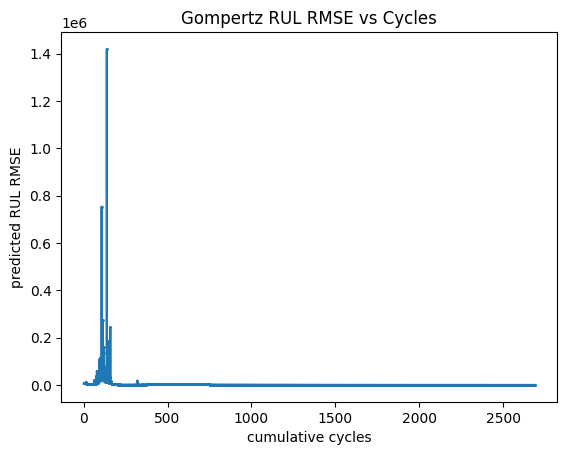

In [35]:
#Plot rmse per cycle
data = cycle_rmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL RMSE')
plt.title('Gompertz RUL RMSE vs Cycles')
plt.grid(False)
plt.show()

In [36]:
# help(plt.yscale)

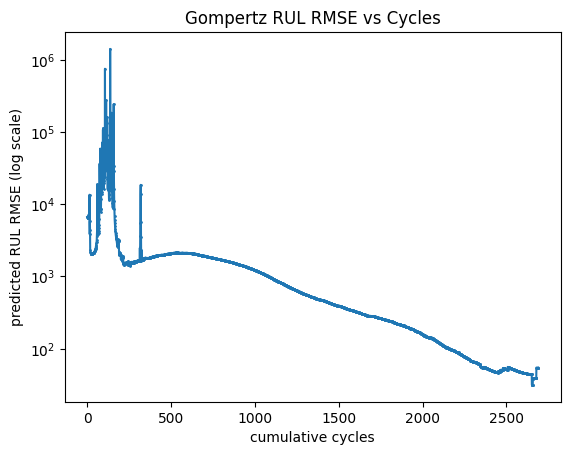

In [37]:
#Plot rmse per cycle use log scale
data = cycle_rmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL RMSE (log scale)')
plt.title('Gompertz RUL RMSE vs Cycles')
plt.yscale('symlog')
plt.grid(False)
plt.show()

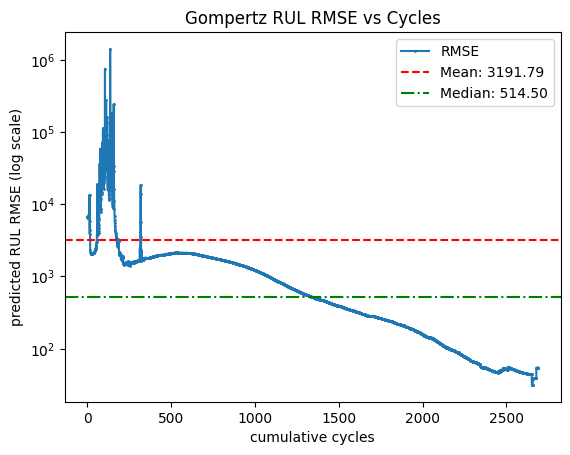

In [38]:
#Plot rmse per cycle use log scale, add mean and median values
data = cycle_rmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)

# Plot
plt.plot(x, y, marker='o', markersize=1, label='RMSE')
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL RMSE (log scale)')
plt.title('Gompertz RUL RMSE vs Cycles')
plt.yscale('symlog')
plt.grid(False)

# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')

# Add legend to display the labels for the lines
plt.legend()

plt.show()

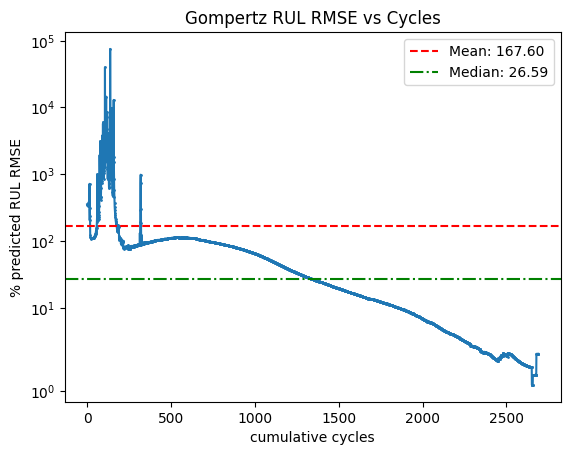

In [39]:
#Plot rmse per cycle
data = cycle_nrmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('% predicted RUL RMSE')
plt.title('Gompertz RUL RMSE vs Cycles')
plt.yscale('symlog')
plt.grid(False)
# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

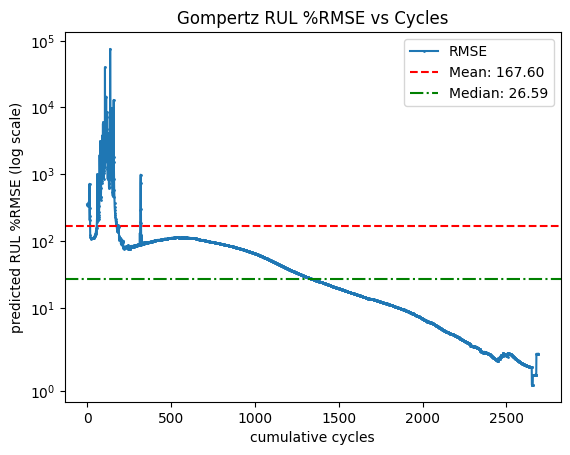

In [40]:
#Plot rmse per cycle use log scale, add mean and median values
data = cycle_nrmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)

# Plot
plt.plot(x, y, marker='o', markersize=1, label='RMSE')
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL %RMSE (log scale)')
plt.title('Gompertz RUL %RMSE vs Cycles')
plt.yscale('symlog')
plt.grid(False)

# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')

# Add legend to display the labels for the lines
plt.legend()

plt.show()

In [41]:
#save gompertz results
with open('gompertz_results.pkl', 'wb') as file:
    pickle.dump(gompertz_results, file)

#save gompertz rmse results
with open('gompertz_rmse_results.pkl', 'wb') as file:
    pickle.dump([cycle_rmse,cycle_nrmse], file)

In [42]:
np.median(y),np.mean(y)

(26.593217444662383, 167.59854449432825)

# 2. NNs

In [43]:
version = '8'
MAX_WINDOW = 2689

### prepare data

In [44]:
WINDOW_SIZES = [100] #[5, 10, 15, 20, 25, 30, 35, 40, 50, 60, 70, 80, 90, 100,500,1000] #[i for i in range (5,100,5)]
print("WINDOW SIZES TO TEST : ",WINDOW_SIZES,len(WINDOW_SIZES))


# Make list of CSV paths
main_files_path = 'gompertz-parameters-per-cycle/'
#/kaggle/input/generate-hust-data-gompertz-k-a-b/1-2-hust_gompertz_params.csv
csv_files = os.listdir(main_files_path)
csv_files = [f for f in csv_files if re.match(r'^\d', f) and f.endswith('-hust_gompertz_params.csv')]

#BatteryML like train-val-test split
csv_files = [f.removesuffix('-hust_gompertz_params.csv') for f in csv_files]
print(csv_files)

train_ids = [
    '1-3',  '1-4',  '1-5',  '1-6',  '1-7',  '1-8',  '2-2',  '2-3',
    '2-4',  '2-6',  '2-7',  '2-8',  '3-2',  '3-3',  '3-4',  '3-5',
    '3-6',  '3-7',  '3-8',  '4-1',  '4-2',  '4-3',  '4-4',  '4-6',
    '4-7',  '4-8',  '5-1',  '5-2',  '5-4',  '5-5',  '5-6',  '5-7',
    '6-3',  '6-4',  '6-5',  '7-1',  '7-2',  '7-3',  '7-4',  '7-7',
    '7-8',  '8-2',  '8-3',  '8-4',  '8-7',  '9-1',  '9-2',  '9-3',
    '9-5',  '9-7',  '9-8',  '10-2', '10-3', '10-5', '10-8']

test_ids = [f for f in csv_files if f not in train_ids]

print(test_ids,len(test_ids))

#csv_paths = [os.path.join(main_files_path, file) for file in csv_files]
#separate according to train, val and test
train_paths = [os.path.join(main_files_path, file+'-hust_gompertz_params.csv') for file in train_ids]

testing_paths = [os.path.join(main_files_path, file+'-hust_gompertz_params.csv') for file in test_ids]

val_paths = testing_paths[:int(len(testing_paths)*0.5)]
test_paths = testing_paths[:int(len(testing_paths))]

print(len(train_paths), len(val_paths), len(test_paths))

WINDOW SIZES TO TEST :  [100] 1
['1-5', '4-5', '6-6', '3-5', '5-2', '4-7', '6-1', '8-7', '8-2', '9-7', '6-2', '1-4', '4-3', '2-2', '4-2', '5-3', '5-5', '1-8', '5-6', '4-4', '10-4', '2-8', '3-2', '2-6', '3-6', '4-1', '1-2', '8-6', '7-8', '1-6', '10-5', '7-2', '4-6', '8-4', '10-7', '3-8', '6-8', '3-7', '6-5', '3-3', '7-3', '7-5', '10-1', '7-4', '9-2', '2-4', '7-1', '10-8', '10-6', '5-1', '1-1', '9-8', '2-7', '9-4', '8-3', '10-2', '9-5', '5-4', '7-7', '10-3', '5-7', '1-3', '6-3', '3-4', '7-6', '4-8', '9-1', '8-8', '3-1', '8-1', '6-4', '1-7', '9-3', '9-6', '8-5', '2-3', '2-5']
['4-5', '6-6', '6-1', '6-2', '5-3', '10-4', '1-2', '8-6', '10-7', '6-8', '7-5', '10-1', '10-6', '1-1', '9-4', '7-6', '8-8', '3-1', '8-1', '9-6', '8-5', '2-5'] 22
55 11 22


## 2a. NNs that predict RUL from SoH

In [45]:
from sklearn.metrics import mean_squared_error, mean_absolute_error , root_mean_squared_error
from torch import nn
from torch.utils.data import DataLoader, TensorDataset

In [46]:
def df_to_X_y_tensor(df, window_size=5,output_size=5,I=0):
    '''
    Converts a time series into (X, y) tensors for LSTM training.
    
    X shape: (num_samples, window_size, 1)
    y shape: (num_samples, 1)
    '''
    X, y = [], []
    
    # X.append(list(df['SoH'])[I:window_size+I])
    
    # y.append(list(df['rul'])[:1])
    X.append(list(df['SoH'])[I:window_size+I])
    y.append(list(df['rul'])[window_size+I:1+I+window_size])
    X,y = np.array(X),np.array(y)
    X_tensor = torch.tensor(X, dtype=torch.float32)
    y_tensor = torch.tensor(y, dtype=torch.float32)
    return X_tensor, y_tensor

def get_x_y_lists(paths):
    X_list,y_list = [],[]
    for path in paths:
        #print(path)
        df = pd.read_csv(path)
        df['Cycle number'] = df['Cycle number']/10000
        df['rul'] = df['rul']/10000
        #normalize SoH
        df['SoH'] =  df['SoH']/soh_normalization_constant
        df.index = df['Cycle number']
        #SoH = df[model_columns]
        X, y = df_to_X_y_tensor(df, window_size=WINDOW_SIZE,output_size=OUTPUT_SIZE,I=I)
        X_list.append(X)
        y_list.append(y)
    return X_list,y_list

def give_paths_get_loaders(paths,data_type,shuffle=False):
        X_list, y_list = get_x_y_lists(paths)
    
        if INPUT_SIZE == 1:
            # Concatenate all X and y
            X_1,y_1 = torch.cat(X_list, dim=0).unsqueeze(-1),torch.cat(y_list, dim=0).view(-1,INPUT_SIZE)
        else:
            X_1,y_1 = torch.cat(X_list, dim=0).squeeze(2),torch.cat(y_list, dim=0).view(-1,INPUT_SIZE)
        
        #print(f"X_{data_type} , y_{data_type} shapes : ",X_1.shape, y_1.shape)
        
        #DataLoader
        #print("load : ")
        loader = DataLoader(TensorDataset(X_1, y_1), batch_size=32, shuffle=shuffle)
        #print(f"{data_type}loader lengths : ",loader.__len__())
        return loader,X_1,y_1

In [47]:
INPUT_SIZE, OUTPUT_SIZE = 1,1
soh_normalization_constant = 1.0
cutoff_soh = 0.70/soh_normalization_constant #set cutoff soh wrt to normalizer
WINDOW_SIZE = 100
I = 0
test_loader,X_test,y_test = give_paths_get_loaders(test_paths,'test')

In [48]:
#initialize model
class LSTMModel(nn.Module):
    def __init__(self, input_size=5, hidden_size=64, output_size=5):
        super(LSTMModel, self).__init__()
        
        # LSTM: input_size=5 match your features
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        
        # Linear Layer: Maps hidden_size (64) -> output_size (5)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        
        # Run LSTM
        lstm_out, _ = self.lstm(x)
        
        # Take the last time step only
        last_time_step = lstm_out[:, -1, :] 
        
        prediction = self.fc(last_time_step)
        
        return prediction
        
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = LSTMModel(input_size=INPUT_SIZE, output_size=OUTPUT_SIZE).to(device)
#load model
# model.load_state_dict(torch.load(f"/kaggle/input/gi-lstm-models/pytorch/default/{version}/SoH-to-RUL-best_lstm_model-window-100.pth",map_location=torch.device(device)))
model.load_state_dict(torch.load(f"models/SoH-to-RUL-best_lstm_model-window-100.pth",map_location=torch.device(device)))
#generate test_loader
test_rmse = 0
for X_test, y_test in test_loader:
    X_test = X_test.to(device)
    y_pred = model(X_test)
    print(y_pred,'\n',y_test)
    #inference for test results
    test_rmse += root_mean_squared_error(y_test, y_pred.cpu().detach().numpy())

print('\n RMSE for 100th cycle : ',test_rmse/len(test_loader)*10000) #multiply by 10,000 because cycle numbers had been normalized using 10000
print('\n Test %RMSE for 100th cycle by SoH to RUL prediction : ',(test_rmse/len(test_loader)*10000)/(np.mean(y_test.cpu().detach().numpy())*10000)*100)
# print(np.mean(y_test.cpu().detach().numpy())*10000)
# print(test_rmse/len(test_loader)*10000)

tensor([[0.1749],
        [0.1906],
        [0.1499],
        [0.1953],
        [0.1860],
        [0.1866],
        [0.1847],
        [0.2030],
        [0.1876],
        [0.1890],
        [0.1855],
        [0.1564],
        [0.2254],
        [0.1459],
        [0.1969],
        [0.1492],
        [0.1937],
        [0.1921],
        [0.1505],
        [0.1947],
        [0.1450],
        [0.1757]], device='cuda:0', grad_fn=<AddmmBackward0>) 
 tensor([[0.1461],
        [0.2368],
        [0.1509],
        [0.1808],
        [0.2589],
        [0.1711],
        [0.2578],
        [0.2265],
        [0.1683],
        [0.2350],
        [0.1775],
        [0.1602],
        [0.2185],
        [0.1404],
        [0.1875],
        [0.1319],
        [0.1579],
        [0.1838],
        [0.1208],
        [0.1642],
        [0.1248],
        [0.1286]])

 RMSE for 100th cycle :  326.42729580402374

 Test %RMSE for 100th cycle by SoH to RUL prediction :  18.28118971878174


In [49]:
def df_to_X_y_tensor(df, window_size=5,output_size=5,I=0):
    '''
    Converts a time series into (X, y) tensors for LSTM training.
    
    X shape: (num_samples, window_size, 1)
    y shape: (num_samples, 1)
    '''
    X, y = [], []
    
    if len(df) >= window_size+I+1:
        X.append(list(df['SoH'])[I:window_size+I])
        y.append(list(df['rul'])[window_size+I:1+I+window_size])
    else:
        pass
    X,y = np.array(X),np.array(y)
    X_tensor = torch.tensor(X, dtype=torch.float32)
    y_tensor = torch.tensor(y, dtype=torch.float32)
    return X_tensor, y_tensor

In [50]:
from tqdm import tqdm
cycle_rmse = {}
cycle_nrmse = {}

#test on per cycle basis
for I in tqdm(range(WINDOW_SIZE,MAX_WINDOW)):
    test_rmse = 0
    test_loader,X_test,y_test = give_paths_get_loaders(test_paths,'test')
    for X_test, y_test in test_loader:
        X_test = X_test.to(device)
        y_pred = model(X_test)
        #print(y_pred,'\n',y_test)
        #inference for test results
        test_rmse += root_mean_squared_error(y_test, y_pred.cpu().detach().numpy())
    
    #print(f'\n Test RMSE for cycle {I} SoH to RUL prediction : ',test_rmse/len(test_loader)*10000) #multiply by 10,000 because cycle numbers had been normalized using 10000
    if len(test_loader) > 0:
        cycle_rmse[I] = test_rmse/len(test_loader)*10000
        cycle_nrmse[I] = (test_rmse/len(test_loader)*10000)/((np.mean(y_test.cpu().detach().numpy())*10000)+I)*100

100%|██████████| 2589/2589 [02:37<00:00, 16.42it/s]


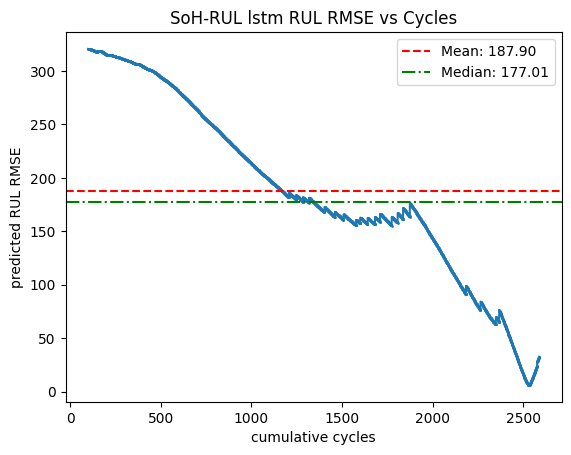

In [51]:
#Plot rmse per cycle use log scale
data = cycle_rmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL RMSE')
plt.title('SoH-RUL lstm RUL RMSE vs Cycles')
#plt.yscale('symlog')
plt.grid(False)
# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

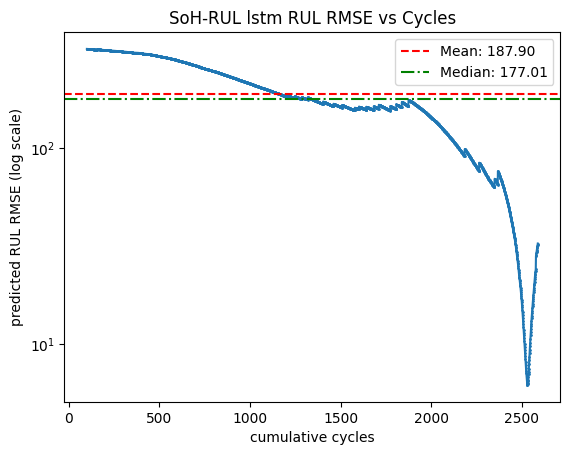

In [52]:
#Plot rmse per cycle use log scale
data = cycle_rmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL RMSE (log scale)')
plt.title('SoH-RUL lstm RUL RMSE vs Cycles')
plt.yscale('symlog')
plt.grid(False)

# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

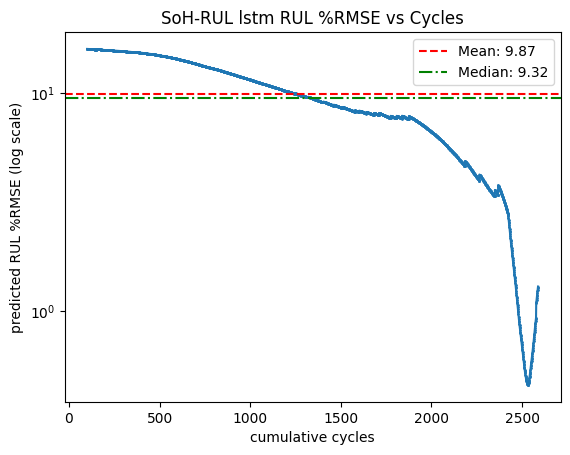

In [53]:
#Plot rmse per cycle use log scale
data = cycle_nrmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL %RMSE (log scale)')
plt.title('SoH-RUL lstm RUL %RMSE vs Cycles')
plt.yscale('symlog')
plt.grid(False)
# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

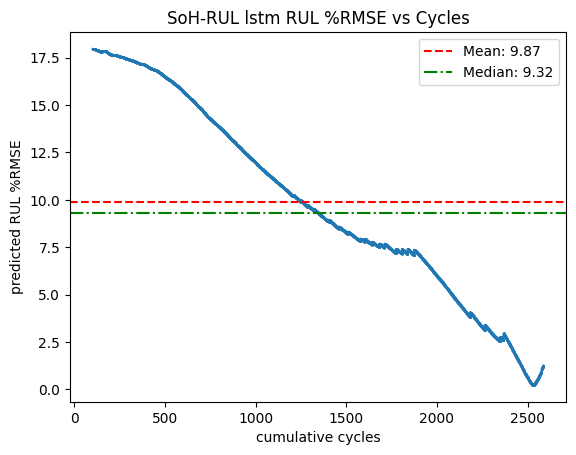

In [54]:
#Plot rmse per cycle use log scale
data = cycle_nrmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL %RMSE')
plt.title('SoH-RUL lstm RUL %RMSE vs Cycles')
#plt.yscale('symlog')
plt.grid(False)
# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

In [55]:
#save SoH to RUL rmse results
with open('SOH_to_RUL_rmse_results.pkl', 'wb') as file:
    pickle.dump([cycle_rmse,cycle_nrmse], file)

## 2b. LSTMs that predict SoH from SoH

In [56]:
def df_to_X_y_tensor(df, window_size=5,output_size=5,i=0):
    '''
    Converts a time series into (X, y) tensors for LSTM training.
    
    X shape: (num_samples, window_size, 1)
    y shape: (num_samples, 1)
    '''
    if isinstance(df, (pd.DataFrame, pd.Series)):
        df_as_np = df.to_numpy()
    else:
        df_as_np = df  # Assume already numpy

    X, y = [], []

    X.append([[val] for val in df_as_np[i:i+window_size]])
    #y.append([df_as_np[i + window_size:i + window_size+output_size]])
    y.append([[val] for val in df_as_np[i + window_size:i + window_size+1]]) #next cycle
    
    X,y = np.array(X),np.array(y)
    X_tensor = torch.tensor(X, dtype=torch.float32)#.squeeze()
    y_tensor = torch.tensor(y, dtype=torch.float32)#.squeeze()
    return X_tensor, y_tensor

def get_x_y_lists(paths):
    X_list,y_list = [],[]
    for path in paths:
        print(path)
        df = pd.read_csv(path)
        df['Cycle number'] = df['Cycle number']/10000
        df['rul'] = df['rul']
        #normalize SoH
        df['SoH'] =  df['SoH']/soh_normalization_constant
        df.index = df['Cycle number']
        SoH = df[model_columns]
        X, y = df_to_X_y_tensor(SoH, window_size=WINDOW_SIZE,output_size=OUTPUT_SIZE,i=I)
        X_list.append(X)
        y_list.append(y)
    return X_list,y_list

def give_paths_get_loaders(paths,data_type,shuffle=False):
    X_list, y_list = get_x_y_lists(paths)

    if INPUT_SIZE == 1:
        # Concatenate all X and y
        X_1,y_1 = torch.cat(X_list, dim=0).squeeze(-1),torch.cat(y_list, dim=0).view(-1,INPUT_SIZE)
    else:
        X_1,y_1 = torch.cat(X_list, dim=0).squeeze(2),torch.cat(y_list, dim=0).view(-1,INPUT_SIZE)
    
    #print(f"X_{data_type} , y_{data_type} shapes : ",X_1.shape, y_1.shape)
    
    #DataLoader
    #print("load : ")
    loader = DataLoader(TensorDataset(X_1, y_1), batch_size=32, shuffle=shuffle)
    #print(f"{data_type}loader lengths : ",loader.__len__())
    return loader,X_1,y_1

In [57]:
INPUT_SIZE, OUTPUT_SIZE = 1,1
soh_normalization_constant = 1.0
cutoff_soh = 0.70/soh_normalization_constant #set cutoff soh wrt to normalizer
WINDOW_SIZE = 100
I = 0
model_columns = ['SoH']
test_loader,X_test,y_test = give_paths_get_loaders(test_paths,'test')

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

In [58]:
## NNs from BatteryML but the input is a particular length of cycles eg 100 (similar to BatteryML)
#initialize model
class LSTMModel(nn.Module):
    def __init__(self, input_size=5, hidden_size=64, output_size=5):
        super(LSTMModel, self).__init__()
        
        # LSTM: input_size=5 match your features
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        
        # Linear Layer: Maps hidden_size (64) -> output_size (5)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # x shape: [32, 10, 5]
        
        # Run LSTM
        # lstm_out shape: [32, 10, 64]
        lstm_out, _ = self.lstm(x)
        
        # Take the last time step only
        last_time_step = lstm_out[:, -1, :] 
        # last_time_step shape: [32, 64]
        
        # Project to 5 output features
        prediction = self.fc(last_time_step)
        # prediction shape: [32, 5]
        
        return prediction
        
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = LSTMModel(input_size=INPUT_SIZE, output_size=OUTPUT_SIZE).to(device)
#load model
# model.load_state_dict(torch.load(f"/kaggle/input/gi-lstm-models/pytorch/default/{version}/SoH-to-SoH-best_lstm_model-window-100.pth",map_location=torch.device(device)))
model.load_state_dict(torch.load(f"models/SoH-to-SoH-best_lstm_model-window-100.pth",map_location=torch.device(device)))
#generate test_loader
test_rmse = 0
for X_test, y_test in test_loader:
    X_test = X_test.to(device)
    y_pred = model(X_test)
    #print(y_pred,'\n',y_test)
    #inference for test results
    test_rmse += root_mean_squared_error(y_test, y_pred.cpu().detach().numpy())

print('\n Test RMSE for SoH to SoH prediction : ',test_rmse/len(test_loader))


 Test RMSE for SoH to SoH prediction :  0.0003580824995879084


In [59]:
# X_test[0],y_test[0],y_pred[0]

In [60]:
# for i in range(100, 3000):
#     for X_test, y_test in test_loader:
#         X_test = X_test.to(device)
#         y_pred = model(X_test)
#         X_test = torch.cat((X_test[0][1:], y_pred[0].detach().view(1, 1)), dim=0)

all_step_predictions = []
current_window = X_test.clone() # Start with the initial X from loader

# Number of steps you want to forecast into the future
forecast_steps = 3000 

for _ in range(forecast_steps):
    # 1. Get prediction for current window
    # y_pred shape: [Batch, 1] (Next Capacity)
    y_pred = model(current_window)
    
    # Store for evaluation
    all_step_predictions.append(y_pred.detach())

    # 2. UPDATE ALL BATCHES AT ONCE
    # Assuming the value you append is the 1st column of your prediction
    # or the only column if predicting capacity directly.
    next_val = y_pred[:, 0:1].unsqueeze(1) # Shape: [Batch, 1, 1]
    
    # Drop index 0, append new value to end
    current_window = torch.cat((current_window[:, 1:, :], next_val.detach()), dim=1)

# Now current_window is updated for the next iteration

In [61]:
all_step_predictions[-1]

tensor([[0.6778],
        [0.6778],
        [0.6778],
        [0.6779],
        [0.6778],
        [0.6778],
        [0.6778],
        [0.6779],
        [0.6778],
        [0.6778],
        [0.6778],
        [0.6778],
        [0.6780],
        [0.6778],
        [0.6779],
        [0.6778],
        [0.6779],
        [0.6778],
        [0.6778],
        [0.6779],
        [0.6778],
        [0.6778]], device='cuda:0')

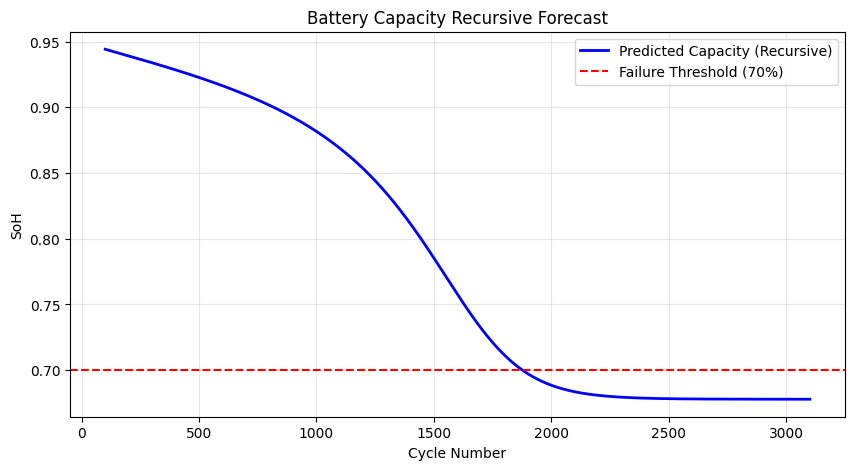

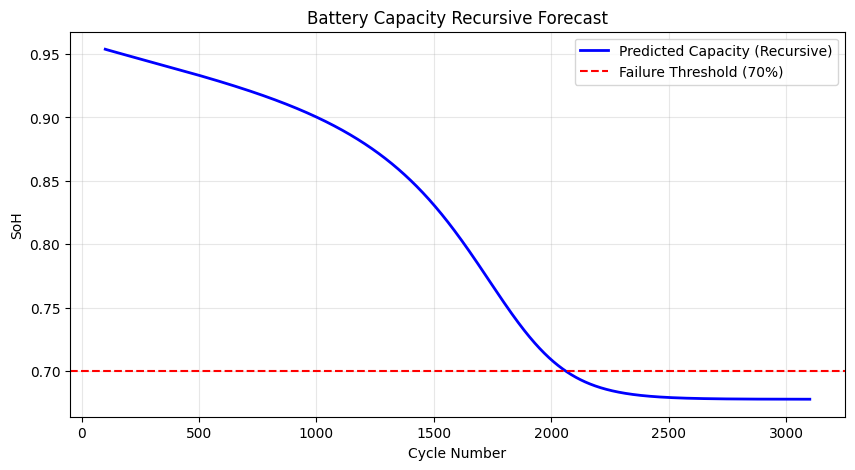

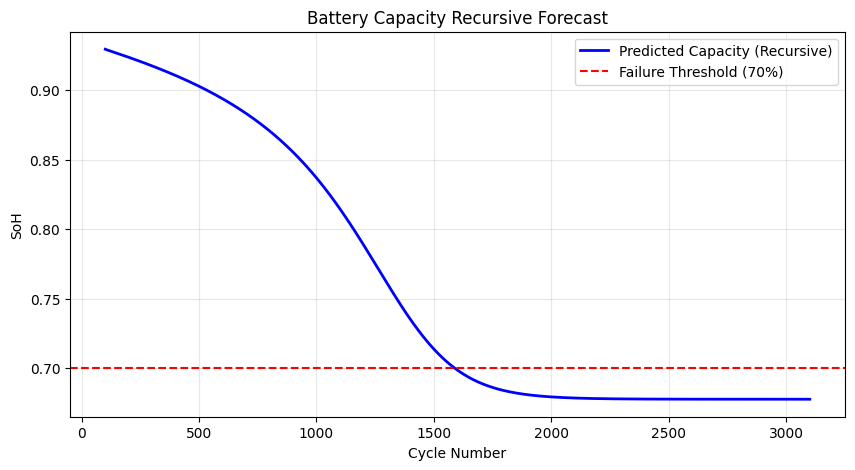

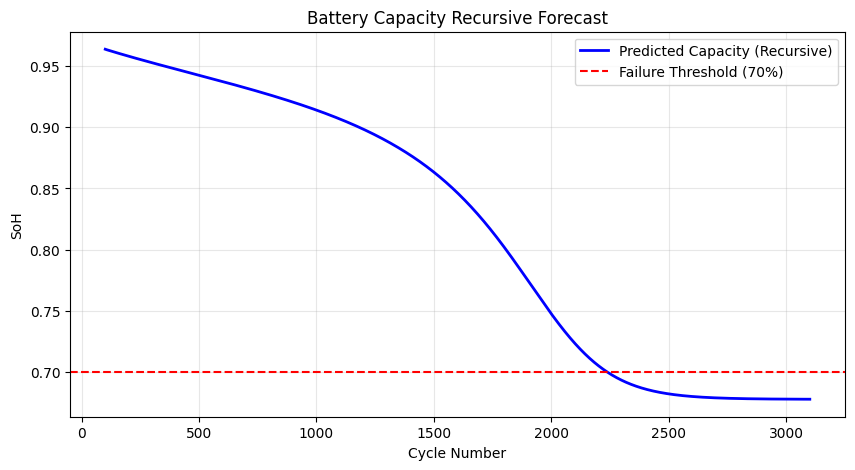

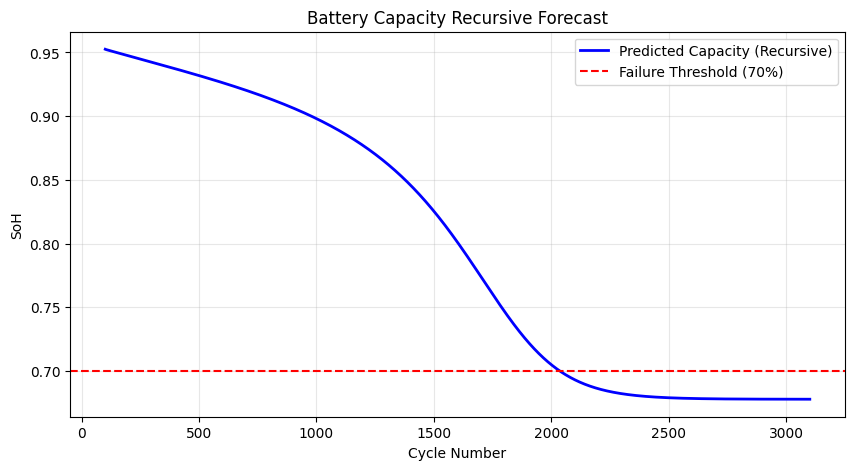

...

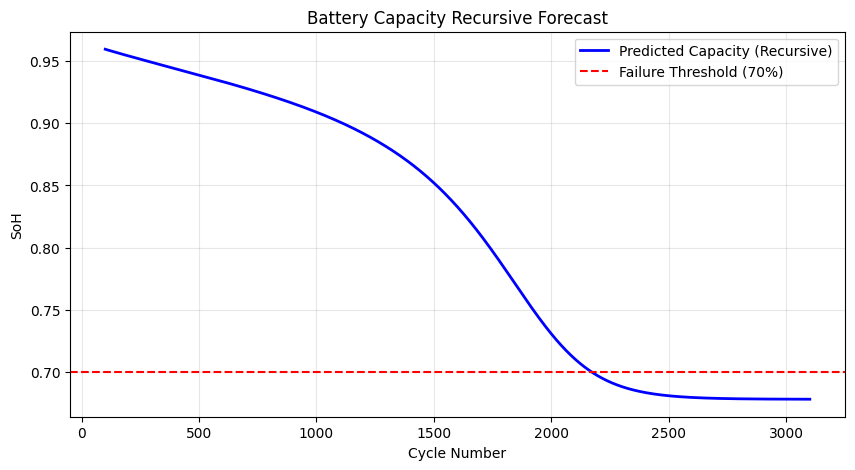

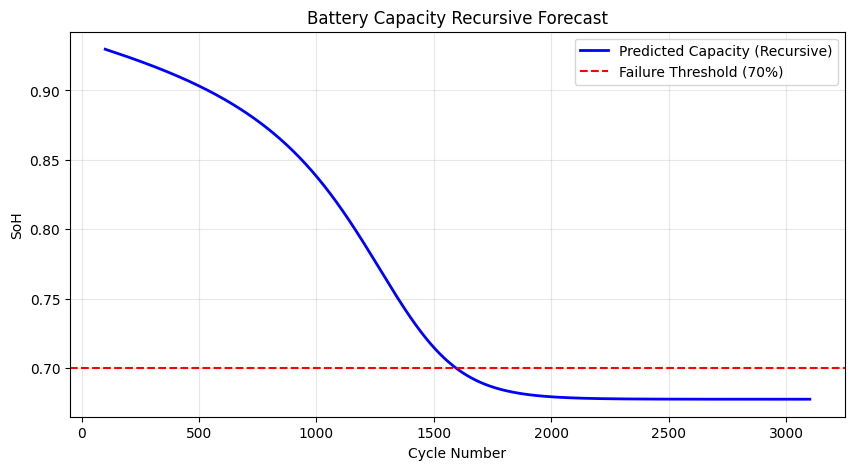

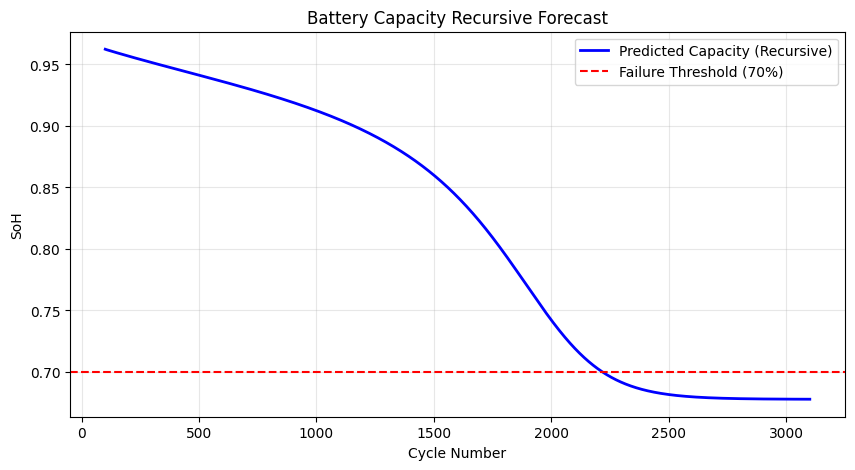

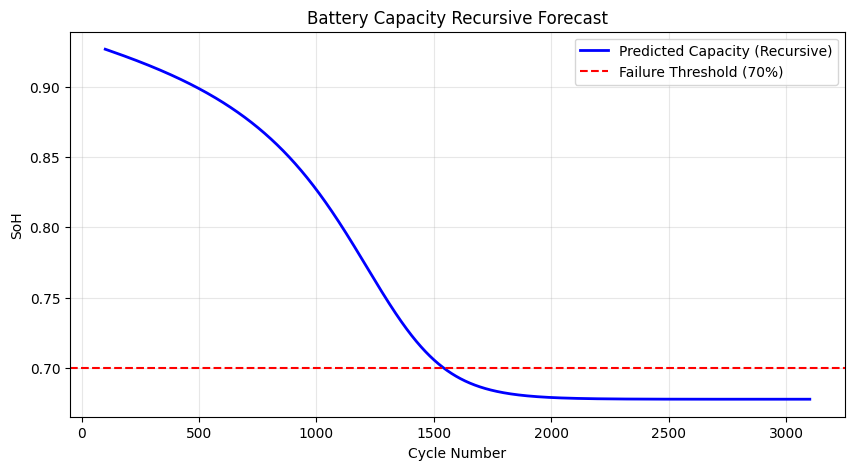

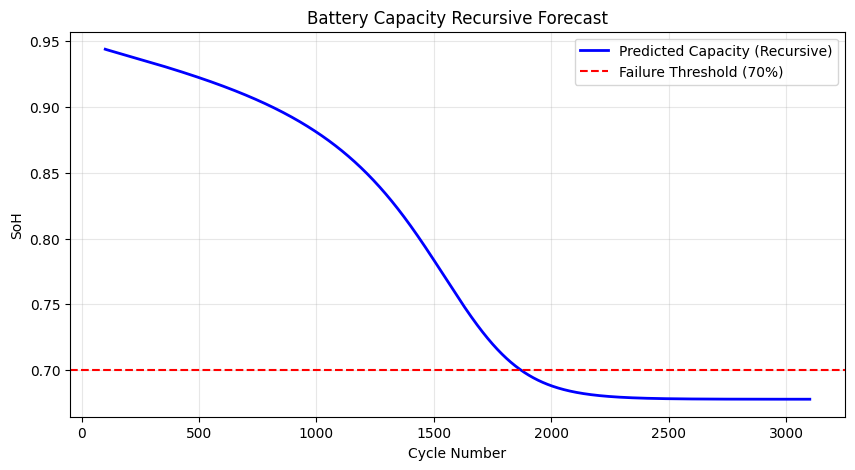

In [62]:
# 1. Stack the list into a single tensor: [Steps, Batch, 4]
all_preds_tensor = torch.stack(all_step_predictions) 
for i in range(0,len(all_step_predictions[-1])):
    # 2. Extract the 1st feature (Capacity) for the 1st battery in the batch (Index 0)
    # Shape will be [Steps]
    first_battery_forecast = all_preds_tensor[:, i, 0].cpu().numpy()
    
    # 3. Create a time/cycle axis for the forecast
    start_cycle = 101 # Assuming your window was 100
    cycles = range(start_cycle, start_cycle + len(first_battery_forecast))
    
    # 4. Plot
    plt.figure(figsize=(10, 5))
    plt.plot(cycles, first_battery_forecast, label='Predicted Capacity (Recursive)', color='blue', linewidth=2)
    plt.axhline(y=0.7, color='red', linestyle='--', label='Failure Threshold (70%)')
    
    plt.title('Battery Capacity Recursive Forecast')
    plt.xlabel('Cycle Number')
    plt.ylabel('SoH')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

In [63]:
# 1. Stack into a single tensor: [Steps, Batch, Features]
# We want to analyze feature 0 (Capacity)
all_preds_tensor = torch.stack(all_step_predictions) 
capacity_forecasts = all_preds_tensor[:, :, 0] # Shape: [Steps, Batch]

# 2. Create a boolean mask where Capacity <= 0.7
# Shape: [Steps, Batch]
is_failed = capacity_forecasts <= 0.7

# 3. Find the first occurrence of True along the 'Steps' dimension (dim 0)
# torch.argmax returns the index of the first 'True' it finds.
# If a cell never hits 0.7, it returns 0 (we will handle this below).
steps_to_failure = torch.argmax(is_failed.to(torch.int), dim=0)

# 4. Handle cells that never reached the threshold
# argmax returns 0 if no True is found. We check if the value at that 
# index is actually <= 0.7 to verify it really failed.
never_failed = ~is_failed.any(dim=0)
steps_to_failure[never_failed] = len(all_step_predictions) # Assign max steps if no failure

# 5. Convert to list or print results
failure_steps_list = steps_to_failure.tolist()

for i, steps in enumerate(failure_steps_list):
    status = "REACHED EoL" if not never_failed[i] else "STILL HEALTHY"
    print(f"Cell {i}: {steps+WINDOW_SIZE+I} steps to reach 0.7 ({status})")

Cell 0: 1876 steps to reach 0.7 (REACHED EoL)
Cell 1: 2061 steps to reach 0.7 (REACHED EoL)
Cell 2: 1589 steps to reach 0.7 (REACHED EoL)
Cell 3: 2238 steps to reach 0.7 (REACHED EoL)
Cell 4: 2035 steps to reach 0.7 (REACHED EoL)
Cell 5: 2055 steps to reach 0.7 (REACHED EoL)
Cell 6: 2015 steps to reach 0.7 (REACHED EoL)
Cell 7: 2246 steps to reach 0.7 (REACHED EoL)
Cell 8: 2090 steps to reach 0.7 (REACHED EoL)
Cell 9: 2092 steps to reach 0.7 (REACHED EoL)
Cell 10: 2046 steps to reach 0.7 (REACHED EoL)
Cell 11: 1661 steps to reach 0.7 (REACHED EoL)
Cell 12: 2381 steps to reach 0.7 (REACHED EoL)
Cell 13: 1550 steps to reach 0.7 (REACHED EoL)
Cell 14: 2242 steps to reach 0.7 (REACHED EoL)
Cell 15: 1583 steps to reach 0.7 (REACHED EoL)
Cell 16: 2199 steps to reach 0.7 (REACHED EoL)
Cell 17: 2169 steps to reach 0.7 (REACHED EoL)
Cell 18: 1595 steps to reach 0.7 (REACHED EoL)
Cell 19: 2217 steps to reach 0.7 (REACHED EoL)
Cell 20: 1541 steps to reach 0.7 (REACHED EoL)
Cell 21: 1870 steps to 

In [64]:
'''
        [[0.1208],
        [0.1642],
        [0.2578],
        [0.1509],
        [0.1808],
        [0.1248],
        [0.2589],
        [0.1286],
        [0.1875],
        [0.1775],
        [0.1404]]
'''
print()

# RMSE per cycle

In [65]:
def df_to_X_y_tensor(df, window_size=5,output_size=5,I=0):
    '''
    Converts a time series into (X, y) tensors for LSTM training.
    
    X shape: (num_samples, window_size, 1)
    y shape: (num_samples, 1)
    '''
    X, y = [], []
    
    if len(df) > window_size+I+1:
        X.append(list(df['SoH'])[I:window_size+I])
        y.append(list(df['rul'])[:1])
        # X.append(list(df['SoH'])[I:window_size+I])
        # y.append(list(df['rul'])[window_size+I:1+I+window_size])
    else:
        pass
    X,y = np.array(X),np.array(y)
    X_tensor = torch.tensor(X, dtype=torch.float32)
    y_tensor = torch.tensor(y, dtype=torch.float32)
    return X_tensor, y_tensor
    
def get_x_y_lists(paths):
    X_list,y_list = [],[]
    for path in paths:
        #print(path)
        df = pd.read_csv(path)
        df['Cycle number'] = df['Cycle number']/10000
        df['rul'] = df['rul']/10000
        #normalize SoH
        df['SoH'] =  df['SoH']/soh_normalization_constant
        df.index = df['Cycle number']
        #SoH = df[model_columns]
        X, y = df_to_X_y_tensor(df, window_size=WINDOW_SIZE,output_size=OUTPUT_SIZE,I=I)
        X_list.append(X)
        y_list.append(y)
    return X_list,y_list

def give_paths_get_loaders(paths,data_type,shuffle=False):
        X_list, y_list = get_x_y_lists(paths)
    
        if INPUT_SIZE == 1:
            # Concatenate all X and y
            X_1,y_1 = torch.cat(X_list, dim=0).unsqueeze(-1),torch.cat(y_list, dim=0).view(-1,INPUT_SIZE)
        else:
            X_1,y_1 = torch.cat(X_list, dim=0).squeeze(2),torch.cat(y_list, dim=0).view(-1,INPUT_SIZE)
        
        #print(f"X_{data_type} , y_{data_type} shapes : ",X_1.shape, y_1.shape)
        
        #DataLoader
        #print("load : ")
        loader = DataLoader(TensorDataset(X_1, y_1), batch_size=32, shuffle=shuffle)
        #print(f"{data_type}loader lengths : ",loader.__len__())
        return loader,X_1,y_1

In [66]:
def forecast_RUL(loader,X_test,y_test,model):
    ## A function to handle the model's recursive nature and compute RUL
    all_step_predictions = []
    current_window = X_test.clone() # Start with the initial X from loader
    
    # Number of steps you want to forecast into the future
    forecast_steps = 3000 
    
    for _ in range(forecast_steps):
        # 1. Get prediction for current window
        # y_pred shape: [Batch, 1] (Next Capacity)
        y_pred = model(current_window)
        
        # Store for evaluation
        all_step_predictions.append(y_pred.detach())
    
        # 2. UPDATE ALL BATCHES AT ONCE
        # Assuming the value you append is the 1st column of your prediction
        # or the only column if predicting capacity directly.
        next_val = y_pred[:, 0:1].unsqueeze(1) # Shape: [Batch, 1, 1]
        
        # Drop index 0, append new value to end
        current_window = torch.cat((current_window[:, 1:, :], next_val.detach()), dim=1)
    
    # Now current_window is updated for the next iteration
    
    # 1. Stack into a single tensor: [Steps, Batch, Features]
    # We want to analyze feature 0 (Capacity)
    all_preds_tensor = torch.stack(all_step_predictions) 
    capacity_forecasts = all_preds_tensor[:, :, 0] # Shape: [Steps, Batch]
    
    # 2. Create a boolean mask where Capacity <= 0.7
    # Shape: [Steps, Batch]
    is_failed = capacity_forecasts <= 0.7
    
    # 3. Find the first occurrence of True along the 'Steps' dimension (dim 0)
    # torch.argmax returns the index of the first 'True' it finds.
    # If a cell never hits 0.7, it returns 0 (we will handle this below).
    steps_to_failure = torch.argmax(is_failed.to(torch.int), dim=0)
    
    # 4. Handle cells that never reached the threshold
    # argmax returns 0 if no True is found. We check if the value at that 
    # index is actually <= 0.7 to verify it really failed.
    never_failed = ~is_failed.any(dim=0)
    steps_to_failure[never_failed] = len(all_step_predictions) # Assign max steps if no failure
    
    # 5. Convert to list or print results
    failure_steps_list = steps_to_failure.tolist()
    RUL_steps = []
    for i, steps in enumerate(failure_steps_list):
        status = "REACHED EoL" if not never_failed[i] else "STILL HEALTHY"
        #print(f"Cell {i}: {steps+WINDOW_SIZE+I} steps to reach 0.7 ({status})")
        RUL_steps.append(steps+WINDOW_SIZE+I)
    return RUL_steps

In [67]:
INPUT_SIZE, OUTPUT_SIZE = 1,1
soh_normalization_constant = 1.0
cutoff_soh = 0.70/soh_normalization_constant #set cutoff soh wrt to normalizer
WINDOW_SIZE = 100
I = 0
model_columns = ['SoH']
test_loader,X_test,y_test = give_paths_get_loaders(test_paths,'test')
for X_test, y_test in test_loader:
    X_test = X_test.to(device)
    break
    # y_pred = model(X_test)
    # #print(y_pred,'\n',y_test)
    # #inference for test results
    # test_rmse += root_mean_squared_error(y_test, y_pred.cpu().detach().numpy())
y_preds = forecast_RUL(test_loader,X_test,y_test,model)
test_rmse = root_mean_squared_error(y_test*10000, y_preds)/len(test_loader)
print('RMSE for 100th cycle : ', test_rmse)
print('% RMSE for 100th cycle : ', test_rmse/(np.mean(y_test.cpu().detach().numpy())*10000)*100,'%')

RMSE for 100th cycle :  342.53520236184306
% RMSE for 100th cycle :  18.165933243422334 %


In [68]:
y_test*10000

tensor([[1561.0000],
        [2468.0000],
        [1609.0000],
        [1908.0000],
        [2689.0000],
        [1811.0000],
        [2678.0000],
        [2365.0000],
        [1782.9999],
        [2450.0000],
        [1875.0000],
        [1702.0000],
        [2285.0000],
        [1504.0000],
        [1975.0000],
        [1419.0000],
        [1679.0000],
        [1938.0000],
        [1307.9999],
        [1742.0000],
        [1348.0000],
        [1386.0001]])

In [69]:
cycle_rmse = {}
cycle_nrmse = {}

#test on per cycle basis
for I in range(WINDOW_SIZE,MAX_WINDOW):
    test_rmse = 0
    test_loader,X_test,y_test = give_paths_get_loaders(test_paths,'test')
    if len(test_loader) > 0:  
        for X_test, y_test in test_loader:
            X_test = X_test.to(device)
            break
        y_preds = forecast_RUL(test_loader,X_test,y_test,model)
        test_rmse = root_mean_squared_error(y_test*10000, y_preds)/len(test_loader)#multiply by 10,000 because cycle numers had been normalized using 10000
        print(f'RMSE for cycle {I} is {test_rmse}')
    
    
        cycle_rmse[I] = test_rmse
        cycle_nrmse[I] = test_rmse/(np.mean(y_test.cpu().detach().numpy())*10000)*100

RMSE for cycle 100 is 326.90059900725987
RMSE for cycle 101 is 326.76187021165856
RMSE for cycle 102 is 326.6983621218868
RMSE for cycle 103 is 326.6523753893131
RMSE for cycle 104 is 326.75540168342883
RMSE for cycle 105 is 326.3608596324317
RMSE for cycle 106 is 325.95433557760504
RMSE for cycle 107 is 326.0493573483814
RMSE for cycle 108 is 326.2845269195343
RMSE for cycle 109 is 326.01791887454976
RMSE for cycle 110 is 326.3616256547632
RMSE for cycle 111 is 326.25554933469215
RMSE for cycle 112 is 326.0665044313171
RMSE for cycle 113 is 325.653680876802
RMSE for cycle 114 is 325.8537762802066
RMSE for cycle 115 is 326.00627694414106
RMSE for cycle 116 is 325.9043388537809
RMSE for cycle 117 is 325.85231166128864
RMSE for cycle 118 is 325.64956339477345
RMSE for cycle 119 is 325.34192080660074
RMSE for cycle 120 is 325.29825755053463
RMSE for cycle 121 is 324.98895369530976
RMSE for cycle 122 is 324.8608121899277
RMSE for cycle 123 is 324.43986979852104
RMSE for cycle 124 is 324.08

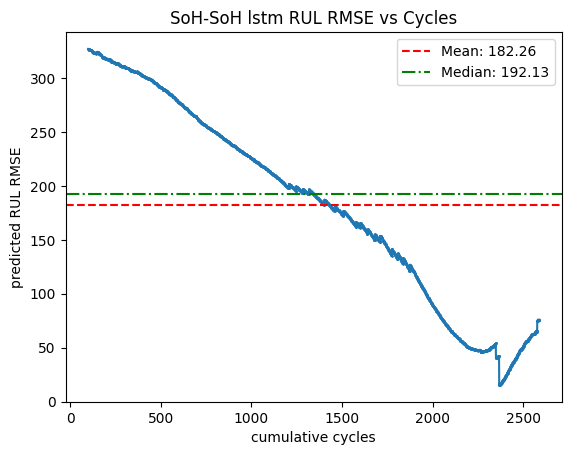

In [70]:
#Plot rmse per cycle use log scale
data = cycle_rmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL RMSE')
plt.title('SoH-SoH lstm RUL RMSE vs Cycles')
#plt.yscale('symlog')
plt.grid(False)
# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

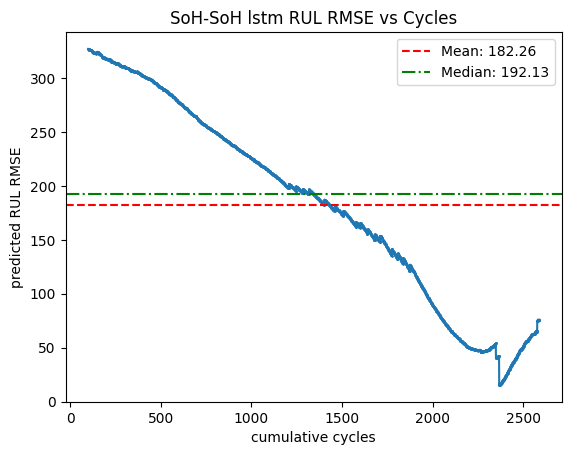

In [71]:
#Plot rmse per cycle use log scale
data = cycle_rmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL RMSE')
plt.title('SoH-SoH lstm RUL RMSE vs Cycles')
#plt.yscale('symlog')
plt.grid(False)
# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

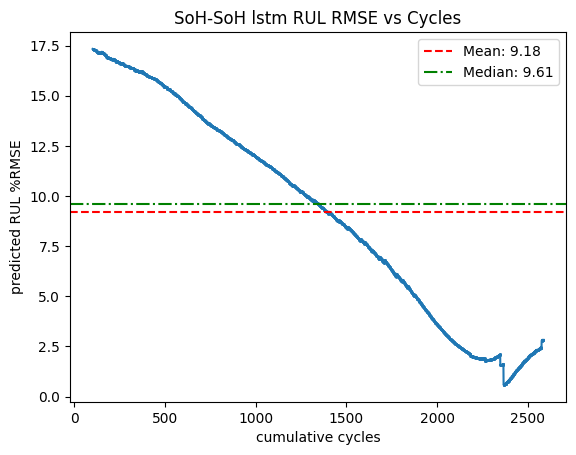

In [72]:
#Plot rmse per cycle use log scale
data = cycle_nrmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL %RMSE')
plt.title('SoH-SoH lstm RUL RMSE vs Cycles')
#plt.yscale('symlog')
plt.grid(False)
# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

In [73]:
model

LSTMModel(
  (lstm): LSTM(1, 64, batch_first=True)
  (fc): Linear(in_features=64, out_features=1, bias=True)
)

In [74]:
#save SoH to SoH RUL rmse results
with open('SOH_to_SoH_RUL_rmse_results.pkl', 'wb') as file:
    pickle.dump([cycle_rmse,cycle_nrmse], file)

# 3. GILSTM

## 3a. LSTMs that predict k,a and b from SoH, then use the inverse gompertz eqn to calculate RUL

In [75]:
model_columns = ['SoH']

print("# B: Setup variables and functions")
# # Set variables
# WINDOW_SIZE = 35
model_type = ['lstm','seq2seq-lstm','pinn'][2]

cutoff_soh = 0.70
# Set Computing Environment
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
INPUT_SIZE = len(model_columns)
OUTPUT_SIZE =3 #RUL #len(model_columns)#1 #controls how many values the lstm outputs
num_epochs = 1000 #60
batch_size = 4 #32 #because the data is little a small batch size is better when training
normalize_soh = False
I = 0
if normalize_soh:
    soh_normalization_constant = 115.0 #115.0 may be better as it allows bounding between 0 and 1
    cutoff_soh = cutoff_soh/soh_normalization_constant #set cutoff soh wrt to normalizer
else:
    soh_normalization_constant = 1.0
    cutoff_soh = cutoff_soh/soh_normalization_constant #set cutoff soh wrt to normalizer

class PhysicsInformedLSTM(nn.Module):
    def __init__(self, input_size=5, hidden_size=128):
        super().__init__()
        # Direct mapping: Input -> LSTM -> FC -> Output
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(128, 3) 
        
    def forward(self, x):
        out, _ = self.lstm(x)
        return self.fc(out[:, -1, :])


def df_to_X_y_tensor(df, window_size=5,output_size=5,i=0):
    '''
    Converts a time series into (X, y) tensors for LSTM training.
    
    X shape: (num_samples, window_size, 1)
    y shape: (num_samples, 1)
    '''
    if isinstance(df, (pd.DataFrame, pd.Series)):
        df_as_np = df.to_numpy()
    else:
        df_as_np = df  # Assume already numpy

    X, y = [], []

    X.append([[val] for val in df_as_np[i:i+window_size]])
    #y.append([df_as_np[i + window_size:i + window_size+output_size]])
    y.append([[val] for val in df_as_np[i + window_size:i + window_size+1]]) #next cycle
    
    X,y = np.array(X),np.array(y)
    X_tensor = torch.tensor(X, dtype=torch.float32)#.squeeze()
    y_tensor = torch.tensor(y, dtype=torch.float32)#.squeeze()
    return X_tensor, y_tensor
    
def df_to_X_y_tensor(df, window_size=5,output_size=5,I=0):
        '''
        Converts a time series into (X, y) tensors for LSTM training.
        
        X shape: (num_samples, window_size, 1)
        y shape: (num_samples, 1)
        '''
        # if isinstance(df, (pd.DataFrame, pd.Series)):
        #     df_as_np = df.to_numpy()
        # else:
        #     df_as_np = df  # Assume already numpy
    
        X, y , y2 = [], [], []
        #for i in range(len(df_as_np) - window_size):
        #for i in range(len(df)-window_size):  
        if len(df) > window_size+I:
            X.append(list(df['SoH'])[I:window_size+I])
            #y.append([df_as_np[i + window_size:i + window_size+output_size]])
            y.append([list(df['k'])[-1],list(df['a'])[-1],list(df['b'])[-1]])
            #append([[val] for val in df_as_np[i + window_size:i + window_size+1]]) #next cycle
            y2.append(list(df['rul'])[:1])
        X,y,y2 = np.array(X),np.array(y), np.array(y2)
        X_tensor = torch.tensor(X, dtype=torch.float32)#.squeeze()
        y_tensor = torch.tensor(y, dtype=torch.float32)#.squeeze()
        y_2_tensor = torch.tensor(y2, dtype=torch.float32)  #bug was here written y instead of y2
        return X_tensor, y_tensor, y_2_tensor
            
    
def get_x_y_lists(paths):
    X_list,y_list,y_target = [],[],[]
    for path in paths:
        print(path)
        df = pd.read_csv(path)
        df['Cycle number'] = df['Cycle number']/10000
        df['rul'] = df['rul']/10000
        #normalize SoH
        df['SoH'] =  df['SoH']/soh_normalization_constant
        df.index = df['Cycle number']
        #SoH = df[model_columns]
        X, y , y1 = df_to_X_y_tensor(df, window_size=WINDOW_SIZE,output_size=OUTPUT_SIZE,I=I)
        # print("X length : ",len(X))
        if len(X) > 0 :
            X_list.append(X)
            y_list.append(y)
            y_target.append(y1) #RUL
    #print("X_list length : ",len(X_list))
    return X_list,y_list, y_target

def give_paths_get_loaders(paths,data_type,shuffle=False):
    X_list, y_list, y_target = get_x_y_lists(paths)
    if len(X_list) > 0:
        batch_size = torch.cat(X_list, dim=0).shape[0]
        
        if INPUT_SIZE == 1:
            # Concatenate all X and y
            X_1,y_1,y_2 = torch.cat(X_list, dim=0).unsqueeze(-1),torch.cat(y_list, dim=0).view(batch_size,-1),torch.cat(y_target, dim=0).view(batch_size,-1)
        else:
            X_1,y_1,y_2 = torch.cat(X_list, dim=0).squeeze(2),torch.cat(y_list, dim=0).view(-1,INPUT_SIZE),torch.cat(y_target, dim=0).view(-1,INPUT_SIZE)
        
        print(f" X_{data_type} shape : {X_1.shape} , y_{data_type} shape : {y_1.shape} ，y_2{data_type} shape: {y_2.shape}" )
        
        #DataLoader
        print("load : ")
        loader = DataLoader(TensorDataset(X_1, y_1, y_2), batch_size=32, shuffle=shuffle)
        print(f"{data_type}loader lengths : ",loader.__len__())
        return loader,X_1,y_1, y_2
    # --- HANDLE EMPTY DATA CASE ---
    print(f"Warning: No data found for {data_type}. Returning empty objects.")
    return [], None, None, None  # Returns an empty list for the loader and None for tensors

data_use = {0:["train"],1:["val"],2:["test"]}

test_loader,X_test,y_test,y_test_target = give_paths_get_loaders(test_paths,data_use[2])
model = PhysicsInformedLSTM(input_size=INPUT_SIZE).to(device)

def inverse_gompertz_func(y,k,a,b):
    return (a - np.log(np.log(k/y)))/b

# B: Setup variables and functions
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-paramete

In [76]:
model.load_state_dict(torch.load(f"models/SoH-to-kab-best_lstm_model-window-100_model_pinn_data_all.pth",map_location=torch.device(device)))

cycle_rmse = {}
cycle_nrmse = {}

#test on per cycle basis
for I in tqdm(range(WINDOW_SIZE,MAX_WINDOW-101)):
    test_rmse = 0
    test_loader,X_test,y_test,y_target = give_paths_get_loaders(test_paths,'test')
    if X_test != None:
        for X_test, y_test, y_target in test_loader:
            X_test = X_test.to(device)
            y_pred = model(X_test)
            
            k_pred = y_pred[:, 0].cpu().detach().numpy()
            a_pred = y_pred[:, 1].cpu().detach().numpy()
            b_pred = y_pred[:, 2].cpu().detach().numpy()
            results = np.round(inverse_gompertz_func(y=0.7, k=k_pred, a=a_pred, b=b_pred), decimals=4)
            #print(results,'\n',y_target)
            #inference for test results
            test_rmse += root_mean_squared_error(results,y_target)
        
        print(f'\n Test RMSE for cycle {I} SoH to k,a,b then RUL prediction : ',test_rmse/len(test_loader)*10000) #multiply by 10,000 because cycle numers had been normalized using 10000
        if len(test_loader) > 0:
            cycle_rmse[I] = test_rmse/len(test_loader)*10000
            cycle_nrmse[I] = (test_rmse/len(test_loader)*10000)/(np.mean(y_target.cpu().detach().numpy())*10000)*100
        #break
        

  0%|          | 0/2488 [00:00<?, ?it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

  0%|          | 1/2488 [00:00<04:09,  9.95it/s]


 Test RMSE for cycle 100 SoH to k,a,b then RUL prediction :  407.94219821691513
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

  0%|          | 3/2488 [00:00<03:27, 11.96it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

  0%|          | 5/2488 [00:00<03:16, 12.61it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 104 SoH to k,a,b then RUL prediction :  408.18266570568085
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

  0%|          | 7/2488 [00:00<03:11, 12.93it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  0%|          | 9/2488 [00:00<03:08, 13.12it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 107 SoH to k,a,b then RUL prediction :  408.1522300839424
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

  0%|          | 11/2488 [00:00<03:07, 13.25it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 110 SoH to k,a,b then RUL prediction :  408.2898050546646
gompe

  1%|          | 13/2488 [00:01<03:05, 13.31it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 111 SoH to k,a,b then RUL prediction :  408.30574929714203
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

  1%|          | 15/2488 [00:01<03:04, 13.37it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 114 SoH to k,a,b then RUL prediction :  408.5402190685272
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

  1%|          | 17/2488 [00:01<03:03, 13.43it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 115 SoH to k,a,b then RUL prediction :  408.4611311554909
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

  1%|          | 19/2488 [00:01<03:03, 13.43it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 118 SoH to k,a,b then RUL prediction :  408.5046425461769
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

  1%|          | 21/2488 [00:01<03:02, 13.50it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

  1%|          | 23/2488 [00:01<03:02, 13.48it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 122 SoH to k,a,b then RUL prediction :  408.68375450372696
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

  1%|          | 25/2488 [00:01<03:01, 13.53it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

  1%|          | 27/2488 [00:02<03:01, 13.55it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 126 SoH to k,a,b then RUL prediction :  408.71690958738327
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

  1%|          | 29/2488 [00:02<03:01, 13.58it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

  1%|          | 31/2488 [00:02<03:00, 13.60it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 129 SoH to k,a,b then RUL prediction :  408.9224711060524
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

  1%|▏         | 33/2488 [00:02<03:00, 13.62it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 132 SoH to k,a,b then RUL prediction :  408.92165154218674
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

  1%|▏         | 35/2488 [00:02<02:59, 13.64it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 133 SoH to k,a,b then RUL prediction :  408.91285985708237
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

  1%|▏         | 37/2488 [00:02<03:00, 13.62it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 136 SoH to k,a,b then RUL prediction :  408.9580476284027
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

  2%|▏         | 39/2488 [00:02<02:59, 13.65it/s]


 Test RMSE for cycle 137 SoH to k,a,b then RUL prediction :  409.0122878551483
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

  2%|▏         | 41/2488 [00:03<02:59, 13.64it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 140 SoH to k,a,b then RUL prediction :  409.1179370880127
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

  2%|▏         | 43/2488 [00:03<02:59, 13.62it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

  2%|▏         | 45/2488 [00:03<02:59, 13.58it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 144 SoH to k,a,b then RUL prediction :  409.21568870544434
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

  2%|▏         | 47/2488 [00:03<02:59, 13.60it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

  2%|▏         | 49/2488 [00:03<02:59, 13.61it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 147 SoH to k,a,b then RUL prediction :  409.3022644519806
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

  2%|▏         | 51/2488 [00:03<02:59, 13.61it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 150

  2%|▏         | 53/2488 [00:03<02:58, 13.61it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 151 SoH to k,a,b then RUL prediction :  409.5061868429184
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

  2%|▏         | 55/2488 [00:04<02:58, 13.64it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 154 SoH to k,a,b then RUL prediction :  409.48521345853806
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

  2%|▏         | 57/2488 [00:04<02:58, 13.64it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 155 SoH to k,a,b then RUL prediction :  409.5372185111046
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

  2%|▏         | 59/2488 [00:04<02:58, 13.63it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 158 SoH to k,a,b then RUL prediction :  409.65791791677475
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

  2%|▏         | 61/2488 [00:04<02:57, 13.65it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

  3%|▎         | 63/2488 [00:04<02:58, 13.62it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 162 SoH to k,a,b then RUL prediction :  409.80279445648193
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

  3%|▎         | 65/2488 [00:04<02:57, 13.62it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

  3%|▎         | 67/2488 [00:04<02:57, 13.62it/s]


 Test RMSE for cycle 166 SoH to k,a,b then RUL prediction :  409.7773879766464
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

  3%|▎         | 69/2488 [00:05<02:57, 13.64it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 168 SoH to k,a,b then RUL prediction :  409.9852219223976
gompe

  3%|▎         | 71/2488 [00:05<02:56, 13.67it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 169 SoH to k,a,b then RUL prediction :  409.989170730114
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompert

  3%|▎         | 73/2488 [00:05<02:56, 13.67it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 172 SoH to k,a,b then RUL prediction :  410.03983467817307
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

  3%|▎         | 75/2488 [00:05<02:56, 13.67it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 173 SoH to k,a,b then RUL prediction :  409.98347103595734
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

  3%|▎         | 77/2488 [00:05<02:56, 13.66it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 176 SoH to k,a,b then RUL prediction :  410.1543501019478
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

  3%|▎         | 79/2488 [00:05<02:56, 13.67it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

  3%|▎         | 81/2488 [00:05<02:56, 13.67it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 180 SoH to k,a,b then RUL prediction :  410.1567715406418
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

  3%|▎         | 83/2488 [00:06<02:56, 13.65it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  3%|▎         | 85/2488 [00:06<02:56, 13.64it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 183 SoH to k,a,b then RUL prediction :  410.2703928947449
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

  3%|▎         | 87/2488 [00:06<02:56, 13.60it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 186 SoH to k,a,b then RUL prediction :  410.38963943719864
gomp

  4%|▎         | 89/2488 [00:06<02:56, 13.62it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 187 SoH to k,a,b then RUL prediction :  410.3242978453636
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

  4%|▎         | 91/2488 [00:06<02:56, 13.60it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 190 SoH to k,a,b then RUL prediction :  410.4873165488243
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

  4%|▎         | 93/2488 [00:06<02:55, 13.62it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 191 SoH to k,a,b then RUL prediction :  410.48813611269
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

  4%|▍         | 95/2488 [00:07<02:56, 13.56it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 194 SoH to k,a,b then RUL prediction :  410.502590239048
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompert

  4%|▍         | 97/2488 [00:07<02:56, 13.55it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

  4%|▍         | 99/2488 [00:07<02:55, 13.59it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 198 SoH to k,a,b then RUL prediction :  410.7064753770828
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

  4%|▍         | 101/2488 [00:07<02:55, 13.60it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

  4%|▍         | 103/2488 [00:07<02:55, 13.61it/s]


 Test RMSE for cycle 202 SoH to k,a,b then RUL prediction :  410.6359928846359
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

  4%|▍         | 105/2488 [00:07<02:55, 13.61it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 204

  4%|▍         | 107/2488 [00:07<02:55, 13.60it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 205 SoH to k,a,b then RUL prediction :  410.82292795181274
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

  4%|▍         | 109/2488 [00:08<02:55, 13.58it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 208 SoH to k,a,b then RUL prediction :  410.8821228146553
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

  4%|▍         | 111/2488 [00:08<02:54, 13.60it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 209 SoH to k,a,b then RUL prediction :  410.8574241399765
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

  5%|▍         | 113/2488 [00:08<02:54, 13.64it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 212 SoH to k,a,b then RUL prediction :  410.99540889263153
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

  5%|▍         | 115/2488 [00:08<02:54, 13.64it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

  5%|▍         | 117/2488 [00:08<02:53, 13.64it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 216 SoH to k,a,b then RUL prediction :  411.05572134256363
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

  5%|▍         | 119/2488 [00:08<02:53, 13.66it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

  5%|▍         | 121/2488 [00:08<02:53, 13.65it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 219 SoH to k,a,b then RUL prediction :  411.188080906868
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompert

  5%|▍         | 123/2488 [00:09<02:53, 13.66it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  5%|▌         | 125/2488 [00:09<02:52, 13.66it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 223 SoH to k,a,b then RUL prediction :  411.2767055630684
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

  5%|▌         | 127/2488 [00:09<02:52, 13.66it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 226 SoH to k,a,b then RUL prediction :  411.389023065567
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz

  5%|▌         | 129/2488 [00:09<02:52, 13.67it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 227 SoH to k,a,b then RUL prediction :  411.39375418424606
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

  5%|▌         | 131/2488 [00:09<02:52, 13.66it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 230 SoH to k,a,b then RUL prediction :  411.49329394102097
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

  5%|▌         | 133/2488 [00:09<02:52, 13.66it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

  5%|▌         | 135/2488 [00:09<02:52, 13.64it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 234 SoH to k,a,b then RUL prediction :  411.53743863105774
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

  6%|▌         | 137/2488 [00:10<02:52, 13.60it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

  6%|▌         | 139/2488 [00:10<02:52, 13.62it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 238 SoH to k,a,b then RUL prediction :  411.7187112569809
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

  6%|▌         | 141/2488 [00:10<02:52, 13.63it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 240 SoH to k,a,b then RUL prediction :  411.8296876549721
gompe

  6%|▌         | 143/2488 [00:10<02:51, 13.65it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 241 SoH to k,a,b then RUL prediction :  411.7931053042412
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

  6%|▌         | 145/2488 [00:10<02:52, 13.60it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 244 SoH to k,a,b then RUL prediction :  411.8119925260544
gompe

  6%|▌         | 147/2488 [00:10<02:51, 13.63it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 245 SoH to k,a,b then RUL prediction :  411.9614139199257
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

  6%|▌         | 149/2488 [00:10<02:51, 13.64it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 248 SoH to k,a,b then RUL prediction :  412.02791035175323
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

  6%|▌         | 151/2488 [00:11<02:51, 13.65it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 249 SoH to k,a,b then RUL prediction :  412.10196912288666
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

  6%|▌         | 153/2488 [00:11<02:51, 13.65it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 252 SoH to k,a,b then RUL prediction :  411.958247423172
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompert

  6%|▌         | 155/2488 [00:11<02:51, 13.60it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

  6%|▋         | 157/2488 [00:11<02:51, 13.61it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 256 SoH to k,a,b then RUL prediction :  412.3431071639061
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

  6%|▋         | 159/2488 [00:11<02:50, 13.63it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

  6%|▋         | 161/2488 [00:11<02:50, 13.65it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 259 SoH to k,a,b then RUL prediction :  412.2411832213402
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

  7%|▋         | 163/2488 [00:12<02:50, 13.65it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 262 SoH to k,a,b then RUL prediction :  412.27221488952637
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

  7%|▋         | 165/2488 [00:12<02:49, 13.68it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 263 SoH to k,a,b then RUL prediction :  412.54568845033646
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

  7%|▋         | 167/2488 [00:12<02:49, 13.67it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 266 SoH to k,a,b then RUL prediction :  412.50985115766525
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

  7%|▋         | 169/2488 [00:12<02:49, 13.67it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

  7%|▋         | 171/2488 [00:12<02:49, 13.69it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 270 SoH to k,a,b then RUL prediction :  412.59709745645523
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

  7%|▋         | 173/2488 [00:12<02:48, 13.70it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

  7%|▋         | 175/2488 [00:12<02:49, 13.67it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 274 SoH to k,a,b then RUL prediction :  412.73728013038635
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

  7%|▋         | 177/2488 [00:13<02:48, 13.68it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 276 SoH to k,a,b then RUL prediction :  412.7804934978485
gompe

  7%|▋         | 179/2488 [00:13<02:48, 13.68it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 277 SoH to k,a,b then RUL prediction :  412.84840553998947
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

  7%|▋         | 181/2488 [00:13<02:48, 13.67it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 280 SoH to k,a,b then RUL prediction :  412.7952829003334
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

  7%|▋         | 183/2488 [00:13<02:48, 13.67it/s]


 Test RMSE for cycle 281 SoH to k,a,b then RUL prediction :  412.9333421587944
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

  7%|▋         | 185/2488 [00:13<02:48, 13.65it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 284 SoH to k,a,b then RUL prediction :  413.09449821710587
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

  8%|▊         | 187/2488 [00:13<02:48, 13.69it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

  8%|▊         | 189/2488 [00:13<02:47, 13.70it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 288 SoH to k,a,b then RUL prediction :  413.01511228084564
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

  8%|▊         | 191/2488 [00:14<02:48, 13.67it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  8%|▊         | 193/2488 [00:14<02:47, 13.69it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 291 SoH to k,a,b then RUL prediction :  413.30188512802124
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

  8%|▊         | 195/2488 [00:14<02:47, 13.66it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  8%|▊         | 197/2488 [00:14<02:47, 13.66it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 295 SoH to k,a,b then RUL prediction :  413.28277438879013
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

  8%|▊         | 199/2488 [00:14<02:47, 13.66it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 298 SoH to k,a,b then RUL prediction :  413.33749890327454
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

  8%|▊         | 201/2488 [00:14<02:47, 13.69it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 299 SoH to k,a,b then RUL prediction :  413.44814002513885
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

  8%|▊         | 203/2488 [00:14<02:46, 13.68it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 302 SoH to k,a,b then RUL prediction :  413.57453912496567
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

  8%|▊         | 205/2488 [00:15<02:46, 13.69it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

  8%|▊         | 207/2488 [00:15<02:46, 13.68it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 306 SoH to k,a,b then RUL prediction :  413.52562606334686
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

  8%|▊         | 209/2488 [00:15<02:46, 13.68it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

  8%|▊         | 211/2488 [00:15<02:46, 13.68it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 310 SoH to k,a,b then RUL prediction :  413.68938982486725
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

  9%|▊         | 213/2488 [00:15<02:46, 13.68it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 312 SoH to k,a,b then RUL prediction :  413.76709938049316
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

  9%|▊         | 215/2488 [00:15<02:46, 13.68it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 313 SoH to k,a,b then RUL prediction :  413.76661509275436
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

  9%|▊         | 217/2488 [00:15<02:45, 13.68it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 316 SoH to k,a,b then RUL prediction :  413.91994804143906
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

  9%|▉         | 219/2488 [00:16<02:45, 13.70it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

  9%|▉         | 221/2488 [00:16<02:45, 13.71it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 320 SoH to k,a,b then RUL prediction :  413.9348119497299
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

  9%|▉         | 223/2488 [00:16<02:45, 13.65it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

  9%|▉         | 225/2488 [00:16<02:46, 13.63it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 324 SoH to k,a,b then RUL prediction :  414.13117200136185
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

  9%|▉         | 227/2488 [00:16<02:45, 13.63it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  9%|▉         | 229/2488 [00:16<02:45, 13.65it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 327 SoH to k,a,b then RUL prediction :  414.16797786951065
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

  9%|▉         | 231/2488 [00:16<02:45, 13.65it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

  9%|▉         | 233/2488 [00:17<02:45, 13.65it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 331 SoH to k,a,b then RUL prediction :  414.2436757683754
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

  9%|▉         | 235/2488 [00:17<02:44, 13.67it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 334 SoH to k,a,b then RUL prediction :  414.34910148382187
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 10%|▉         | 237/2488 [00:17<02:44, 13.70it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 335 SoH to k,a,b then RUL prediction :  414.32101279497147
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 10%|▉         | 239/2488 [00:17<02:43, 13.71it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 338 SoH to k,a,b then RUL prediction :  414.3788665533066
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 10%|▉         | 241/2488 [00:17<02:43, 13.73it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 10%|▉         | 243/2488 [00:17<02:43, 13.71it/s]


 Test RMSE for cycle 342 SoH to k,a,b then RUL prediction :  414.5081713795662
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

 10%|▉         | 245/2488 [00:18<02:43, 13.75it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 10%|▉         | 247/2488 [00:18<02:43, 13.74it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 346 SoH to k,a,b then RUL prediction :  414.62790220975876
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 10%|█         | 249/2488 [00:18<02:42, 13.75it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 348 SoH to k,a,b then RUL prediction :  414.7229716181755
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 10%|█         | 251/2488 [00:18<02:42, 13.79it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 349 SoH to k,a,b then RUL prediction :  414.7230088710785
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 10%|█         | 253/2488 [00:18<02:42, 13.77it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 352 SoH to k,a,b then RUL prediction :  414.7003963589668
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 10%|█         | 255/2488 [00:18<02:42, 13.78it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 10%|█         | 257/2488 [00:18<02:41, 13.78it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 356 SoH to k,a,b then RUL prediction :  414.9244725704193
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 10%|█         | 259/2488 [00:19<02:41, 13.78it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 10%|█         | 261/2488 [00:19<02:41, 13.75it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 360 SoH to k,a,b then RUL prediction :  414.939783513546
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomper

 11%|█         | 263/2488 [00:19<02:41, 13.74it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 362 SoH to k,a,b then RUL prediction :  414.93769735097885
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 11%|█         | 265/2488 [00:19<02:41, 13.80it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 363 SoH to k,a,b then RUL prediction :  415.14772921800613
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 11%|█         | 267/2488 [00:19<02:41, 13.78it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 366 SoH to k,a,b then RUL prediction :  415.19761085510254
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 11%|█         | 269/2488 [00:19<02:41, 13.76it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 11%|█         | 271/2488 [00:19<02:41, 13.76it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 370 SoH to k,a,b then RUL prediction :  415.1689261198044
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 11%|█         | 273/2488 [00:20<02:40, 13.77it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 11%|█         | 275/2488 [00:20<02:40, 13.76it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 374 SoH to k,a,b then RUL prediction :  415.4469445347786
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 11%|█         | 277/2488 [00:20<02:40, 13.76it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 376 SoH to k,a,b then RUL prediction :  415.332168340683
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomper

 11%|█         | 279/2488 [00:20<02:40, 13.75it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 377 SoH to k,a,b then RUL prediction :  415.4008626937866
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 11%|█▏        | 281/2488 [00:20<02:40, 13.71it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 380 SoH to k,a,b then RUL prediction :  415.40082544088364
gomp

 11%|█▏        | 283/2488 [00:20<02:40, 13.73it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 11%|█▏        | 285/2488 [00:20<02:40, 13.69it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 384 SoH to k,a,b then RUL prediction :  415.60206562280655
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 12%|█▏        | 287/2488 [00:21<02:40, 13.72it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 12%|█▏        | 289/2488 [00:21<02:40, 13.73it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 388 SoH to k,a,b then RUL prediction :  415.676087141037
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomper

 12%|█▏        | 291/2488 [00:21<02:39, 13.74it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 390 SoH to k,a,b then RUL prediction :  415.75487703084946
gomp

 12%|█▏        | 293/2488 [00:21<02:39, 13.77it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 391 SoH to k,a,b then RUL prediction :  415.7029464840889
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 12%|█▏        | 295/2488 [00:21<02:39, 13.74it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 394

 12%|█▏        | 297/2488 [00:21<02:39, 13.76it/s]


 Test RMSE for cycle 395 SoH to k,a,b then RUL prediction :  415.84692895412445
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 12%|█▏        | 299/2488 [00:21<02:39, 13.75it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 398 SoH to k,a,b then RUL prediction :  415.9914329648018
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 12%|█▏        | 301/2488 [00:22<02:37, 13.87it/s]


 Test RMSE for cycle 399 SoH to k,a,b then RUL prediction :  415.9697890281677
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

 12%|█▏        | 303/2488 [00:22<02:36, 13.93it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 402 SoH to k,a,b then RUL prediction :  416.0286858677864
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 12%|█▏        | 305/2488 [00:22<02:35, 14.01it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 404 SoH to k,a,b then RUL prediction :  416.00991040468216
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 12%|█▏        | 307/2488 [00:22<02:34, 14.08it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 405 SoH to k,a,b then RUL prediction :  416.07819497585297
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 12%|█▏        | 309/2488 [00:22<02:34, 14.10it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 408 SoH to k,a,b then RUL prediction :  416.208915412426
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz

 12%|█▎        | 311/2488 [00:22<02:34, 14.12it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 13%|█▎        | 313/2488 [00:22<02:33, 14.14it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 411 SoH to k,a,b then RUL prediction :  416.14286601543427
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 13%|█▎        | 315/2488 [00:23<02:33, 14.16it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 414

 13%|█▎        | 317/2488 [00:23<02:33, 14.19it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 13%|█▎        | 319/2488 [00:23<02:32, 14.20it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 418 SoH to k,a,b then RUL prediction :  416.3724184036255
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 13%|█▎        | 321/2488 [00:23<02:32, 14.19it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 13%|█▎        | 323/2488 [00:23<02:32, 14.18it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 421 SoH to k,a,b then RUL prediction :  416.34444147348404
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 13%|█▎        | 325/2488 [00:23<02:32, 14.19it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 424 SoH to k,a,b then RUL prediction :  416.63501411676407
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 13%|█▎        | 327/2488 [00:23<02:32, 14.21it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 425 SoH to k,a,b then RUL prediction :  416.6213423013687
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 13%|█▎        | 329/2488 [00:24<02:32, 14.19it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 428 SoH to k,a,b then RUL prediction :  416.63341224193573
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 13%|█▎        | 331/2488 [00:24<02:31, 14.23it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 430 SoH to k,a,b then RUL prediction :  416.6616126894951
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 13%|█▎        | 333/2488 [00:24<02:31, 14.23it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 431 SoH to k,a,b then RUL prediction :  416.6628420352936
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 13%|█▎        | 335/2488 [00:24<02:31, 14.19it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 434 SoH to k,a,b then RUL prediction :  416.7734831571579
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 14%|█▎        | 337/2488 [00:24<02:31, 14.20it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 14%|█▎        | 339/2488 [00:24<02:31, 14.20it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 437 SoH to k,a,b then RUL prediction :  416.8844223022461
gompe

 14%|█▎        | 341/2488 [00:24<02:31, 14.21it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 14%|█▍        | 343/2488 [00:25<02:30, 14.23it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 14%|█▍        | 345/2488 [00:25<02:30, 14.20it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 444 SoH to k,a,b then RUL prediction :  416.96880012750626
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 14%|█▍        | 347/2488 [00:25<02:30, 14.23it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 14%|█▍        | 349/2488 [00:25<02:30, 14.24it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 14%|█▍        | 351/2488 [00:25<02:30, 14.21it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 450 SoH to k,a,b then RUL prediction :  417.2011464834213
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 14%|█▍        | 353/2488 [00:25<02:29, 14.25it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 451 SoH to k,a,b then RUL prediction :  417.1605035662651
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 14%|█▍        | 355/2488 [00:25<02:29, 14.24it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 454 SoH to k,a,b then RUL prediction :  417.303666472435
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompert

 14%|█▍        | 357/2488 [00:26<02:29, 14.25it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 456 SoH to k,a,b then RUL prediction :  417.42850095033646
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 14%|█▍        | 359/2488 [00:26<02:29, 14.24it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 457 SoH to k,a,b then RUL prediction :  417.42540895938873
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 15%|█▍        | 361/2488 [00:26<02:29, 14.21it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 460 SoH to k,a,b then RUL prediction :  417.2922298312187
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 15%|█▍        | 363/2488 [00:26<02:29, 14.22it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 15%|█▍        | 365/2488 [00:26<02:29, 14.22it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 463

 15%|█▍        | 367/2488 [00:26<02:29, 14.23it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 15%|█▍        | 369/2488 [00:26<02:29, 14.22it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 15%|█▍        | 371/2488 [00:26<02:28, 14.21it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 470 SoH to k,a,b then RUL prediction :  417.5586998462677
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 15%|█▍        | 373/2488 [00:27<02:28, 14.25it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 15%|█▌        | 375/2488 [00:27<02:28, 14.24it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 474 SoH to k,a,b then RUL prediction :  417.68528521060944
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 15%|█▌        | 377/2488 [00:27<02:27, 14.28it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 476 SoH to k,a,b then RUL prediction :  417.8109019994736
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 15%|█▌        | 379/2488 [00:27<02:27, 14.26it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 477 SoH to k,a,b then RUL prediction :  417.8284853696823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 15%|█▌        | 381/2488 [00:27<02:28, 14.22it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 480 SoH to k,a,b then RUL prediction :  417.88890957832336
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 15%|█▌        | 383/2488 [00:27<02:28, 14.19it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 482 SoH to k,a,b then RUL prediction :  417.80736297369003
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 15%|█▌        | 385/2488 [00:27<02:27, 14.23it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 483 SoH to k,a,b then RUL prediction :  417.84152388572693
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 16%|█▌        | 387/2488 [00:28<02:27, 14.26it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 486 SoH to k,a,b then RUL prediction :  418.0334135890007
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 16%|█▌        | 389/2488 [00:28<02:27, 14.26it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 16%|█▌        | 391/2488 [00:28<02:26, 14.28it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 489 SoH to k,a,b then RUL prediction :  418.1135445833206
gompe

 16%|█▌        | 393/2488 [00:28<02:26, 14.27it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 16%|█▌        | 395/2488 [00:28<02:26, 14.27it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 16%|█▌        | 397/2488 [00:28<02:26, 14.28it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 16%|█▌        | 399/2488 [00:28<02:26, 14.29it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 16%|█▌        | 401/2488 [00:29<02:26, 14.28it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 499 SoH to k,a,b then RUL prediction :  418.2795062661171
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 16%|█▌        | 403/2488 [00:29<02:26, 14.27it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 502 SoH to k,a,b then RUL prediction :  418.27723383903503
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 16%|█▋        | 405/2488 [00:29<02:25, 14.29it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 503 SoH to k,a,b then RUL prediction :  418.2412847876549
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 16%|█▋        | 407/2488 [00:29<02:25, 14.29it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 506 SoH to k,a,b then RUL prediction :  418.5168445110321
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 16%|█▋        | 409/2488 [00:29<02:25, 14.31it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 508 SoH to k,a,b then RUL prediction :  418.57391595840454
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 17%|█▋        | 411/2488 [00:29<02:25, 14.27it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 509 SoH to k,a,b then RUL prediction :  418.46051812171936
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 17%|█▋        | 413/2488 [00:29<02:25, 14.24it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 512 SoH to k,a,b then RUL prediction :  418.512225151062
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompert

 17%|█▋        | 415/2488 [00:30<02:25, 14.25it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 514 SoH to k,a,b then RUL prediction :  418.6060279607773
gompe

 17%|█▋        | 417/2488 [00:30<02:25, 14.25it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 515 SoH to k,a,b then RUL prediction :  418.68556290864944
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 17%|█▋        | 419/2488 [00:30<02:25, 14.23it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 518

 17%|█▋        | 421/2488 [00:30<02:24, 14.26it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 17%|█▋        | 423/2488 [00:30<02:24, 14.30it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 17%|█▋        | 425/2488 [00:30<02:24, 14.27it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 17%|█▋        | 427/2488 [00:30<02:24, 14.28it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 17%|█▋        | 429/2488 [00:31<02:24, 14.27it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 528 SoH to k,a,b then RUL prediction :  418.88341307640076
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 17%|█▋        | 431/2488 [00:31<02:23, 14.29it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 529 SoH to k,a,b then RUL prediction :  418.9479723572731
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 17%|█▋        | 433/2488 [00:31<02:23, 14.29it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 532 SoH to k,a,b then RUL prediction :  418.9113900065422
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 17%|█▋        | 435/2488 [00:31<02:23, 14.28it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 534 SoH to k,a,b then RUL prediction :  418.9847782254219
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 18%|█▊        | 437/2488 [00:31<02:23, 14.33it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 535 SoH to k,a,b then RUL prediction :  419.20237243175507
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 18%|█▊        | 439/2488 [00:31<02:23, 14.27it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 538 SoH to k,a,b then RUL prediction :  419.12686079740524
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 18%|█▊        | 441/2488 [00:31<02:23, 14.30it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 540 SoH to k,a,b then RUL prediction :  419.1751033067703
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 18%|█▊        | 443/2488 [00:32<02:22, 14.32it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 541 SoH to k,a,b then RUL prediction :  419.1407561302185
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 18%|█▊        | 445/2488 [00:32<02:23, 14.28it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 544 SoH to k,a,b then RUL prediction :  419.2042350769043
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 18%|█▊        | 447/2488 [00:32<02:23, 14.25it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 18%|█▊        | 449/2488 [00:32<02:23, 14.24it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 18%|█▊        | 451/2488 [00:32<02:23, 14.23it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 18%|█▊        | 453/2488 [00:32<02:22, 14.23it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 18%|█▊        | 455/2488 [00:32<02:22, 14.26it/s]


 Test RMSE for cycle 554 SoH to k,a,b then RUL prediction :  419.37679052352905
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 18%|█▊        | 457/2488 [00:33<02:22, 14.23it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 555 SoH to k,a,b then RUL prediction :  419.3311557173729
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 18%|█▊        | 459/2488 [00:33<02:22, 14.19it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 558 SoH to k,a,b then RUL prediction :  419.6714982390404
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 19%|█▊        | 461/2488 [00:33<02:22, 14.24it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 560 SoH to k,a,b then RUL prediction :  419.6058213710785
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 19%|█▊        | 463/2488 [00:33<02:21, 14.28it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 561 SoH to k,a,b then RUL prediction :  419.6295887231827
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 19%|█▊        | 465/2488 [00:33<02:21, 14.26it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 564 SoH to k,a,b then RUL prediction :  419.6074604988098
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 19%|█▉        | 467/2488 [00:33<02:21, 14.29it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 566 SoH to k,a,b then RUL prediction :  419.6532070636749
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 19%|█▉        | 469/2488 [00:33<02:21, 14.28it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 567 SoH to k,a,b then RUL prediction :  419.90362107753754
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 19%|█▉        | 471/2488 [00:34<02:21, 14.23it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 570 SoH to k,a,b then RUL prediction :  419.83146220445633
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 19%|█▉        | 473/2488 [00:34<02:21, 14.24it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 19%|█▉        | 475/2488 [00:34<02:21, 14.26it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 19%|█▉        | 477/2488 [00:34<02:21, 14.26it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 19%|█▉        | 479/2488 [00:34<02:20, 14.26it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 19%|█▉        | 481/2488 [00:34<02:20, 14.28it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 19%|█▉        | 483/2488 [00:34<02:20, 14.23it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 19%|█▉        | 485/2488 [00:34<02:21, 14.14it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 584 SoH to k,a,b then RUL prediction :  420.106016099453
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomper

 20%|█▉        | 487/2488 [00:35<02:21, 14.16it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 586 SoH to k,a,b then RUL prediction :  420.1553389430046
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 20%|█▉        | 489/2488 [00:35<02:21, 14.15it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 587 SoH to k,a,b then RUL prediction :  420.2335327863693
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 20%|█▉        | 491/2488 [00:35<02:21, 14.16it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 590 SoH to k,a,b then RUL prediction :  420.2229529619217
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 20%|█▉        | 493/2488 [00:35<02:20, 14.15it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 592 SoH to k,a,b then RUL prediction :  420.4162582755089
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 20%|█▉        | 495/2488 [00:35<02:20, 14.17it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 593 SoH to k,a,b then RUL prediction :  420.27879506349564
gomp

 20%|█▉        | 497/2488 [00:35<02:20, 14.20it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 20%|██        | 499/2488 [00:35<02:20, 14.18it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 20%|██        | 501/2488 [00:36<02:19, 14.21it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 20%|██        | 503/2488 [00:36<02:19, 14.23it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 20%|██        | 505/2488 [00:36<02:19, 14.25it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 20%|██        | 507/2488 [00:36<02:19, 14.25it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 20%|██        | 509/2488 [00:36<02:18, 14.26it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 607 SoH to k,a,b then RUL prediction :  420.4951226711273
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 21%|██        | 511/2488 [00:36<02:18, 14.26it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 610 SoH to k,a,b then RUL prediction :  420.74698954820633
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 21%|██        | 513/2488 [00:36<02:18, 14.28it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 612 SoH to k,a,b then RUL prediction :  420.75857520103455
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 21%|██        | 515/2488 [00:37<02:18, 14.30it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 613 SoH to k,a,b then RUL prediction :  420.75835168361664
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 21%|██        | 517/2488 [00:37<02:17, 14.28it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 616 SoH to k,a,b then RUL prediction :  420.7145422697067
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 21%|██        | 519/2488 [00:37<02:17, 14.27it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 618 SoH to k,a,b then RUL prediction :  421.00023478269577
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 21%|██        | 521/2488 [00:37<02:17, 14.28it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 619 SoH to k,a,b then RUL prediction :  420.94748467206955
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 21%|██        | 523/2488 [00:37<02:17, 14.28it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 622

 21%|██        | 525/2488 [00:37<02:17, 14.30it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 624

 21%|██        | 527/2488 [00:37<02:17, 14.31it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 21%|██▏       | 529/2488 [00:38<02:17, 14.30it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 21%|██▏       | 531/2488 [00:38<02:16, 14.30it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 21%|██▏       | 533/2488 [00:38<02:16, 14.29it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 22%|██▏       | 535/2488 [00:38<02:16, 14.26it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 633 SoH to k,a,b then RUL prediction :  421.113446354866
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gomp

 22%|██▏       | 537/2488 [00:38<02:16, 14.25it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 636 SoH to k,a,b then RUL prediction :  421.15673422813416
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 22%|██▏       | 539/2488 [00:38<02:16, 14.24it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 638 SoH to k,a,b then RUL prediction :  421.2738946080208
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 22%|██▏       | 541/2488 [00:38<02:16, 14.22it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 639 SoH to k,a,b then RUL prediction :  421.34154587984085
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 22%|██▏       | 543/2488 [00:39<02:16, 14.21it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 642 SoH to k,a,b then RUL prediction :  421.319380402565
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz

 22%|██▏       | 545/2488 [00:39<02:16, 14.26it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 644 SoH to k,a,b then RUL prediction :  421.4082285761833
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 22%|██▏       | 547/2488 [00:39<02:16, 14.25it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 645 SoH to k,a,b then RUL prediction :  421.37205600738525
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 22%|██▏       | 549/2488 [00:39<02:15, 14.28it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 648 SoH to k,a,b then RUL prediction :  421.433188021183
gomper

 22%|██▏       | 551/2488 [00:39<02:15, 14.28it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 650 SoH to k,a,b then RUL prediction :  421.54133319854736
gomp

 22%|██▏       | 553/2488 [00:39<02:15, 14.25it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 22%|██▏       | 555/2488 [00:39<02:15, 14.25it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 22%|██▏       | 557/2488 [00:40<02:15, 14.27it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 22%|██▏       | 559/2488 [00:40<02:15, 14.28it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 23%|██▎       | 561/2488 [00:40<02:15, 14.21it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 23%|██▎       | 563/2488 [00:40<02:15, 14.22it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 662 SoH to k,a,b then RUL prediction :  421.84315621852875
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 23%|██▎       | 565/2488 [00:40<02:14, 14.26it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 664 SoH to k,a,b then RUL prediction :  421.7328131198883
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 23%|██▎       | 567/2488 [00:40<02:14, 14.28it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 665 SoH to k,a,b then RUL prediction :  421.72543704509735
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 23%|██▎       | 569/2488 [00:40<02:14, 14.25it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 668 SoH to k,a,b then RUL prediction :  422.0474138855934
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 23%|██▎       | 571/2488 [00:41<02:14, 14.25it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 670 SoH to k,a,b then RUL prediction :  422.07278311252594
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 23%|██▎       | 573/2488 [00:41<02:13, 14.30it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 671 SoH to k,a,b then RUL prediction :  422.0343008637428
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 23%|██▎       | 575/2488 [00:41<02:14, 14.27it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 674 SoH to k,a,b then RUL prediction :  421.9808429479599
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 23%|██▎       | 577/2488 [00:41<02:13, 14.30it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 676 SoH to k,a,b then RUL prediction :  422.02815413475037
gomp

 23%|██▎       | 579/2488 [00:41<02:13, 14.27it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 677

 23%|██▎       | 581/2488 [00:41<02:13, 14.27it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 23%|██▎       | 583/2488 [00:41<02:13, 14.29it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 24%|██▎       | 585/2488 [00:42<02:12, 14.32it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 24%|██▎       | 587/2488 [00:42<02:12, 14.30it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 24%|██▎       | 589/2488 [00:42<02:12, 14.29it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 688 SoH to k,a,b then RUL prediction :  422.44117707014084
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 24%|██▍       | 591/2488 [00:42<02:12, 14.32it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 690 SoH to k,a,b then RUL prediction :  422.42761701345444
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 24%|██▍       | 593/2488 [00:42<02:12, 14.34it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 691 SoH to k,a,b then RUL prediction :  422.4564880132675
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 24%|██▍       | 595/2488 [00:42<02:13, 14.22it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 694 SoH to k,a,b then RUL prediction :  422.46323078870773
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 24%|██▍       | 597/2488 [00:42<02:14, 14.09it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 696 SoH to k,a,b then RUL prediction :  422.5057363510132
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 24%|██▍       | 599/2488 [00:42<02:14, 14.03it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 697 SoH to k,a,b then RUL prediction :  422.6607456803322
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 24%|██▍       | 601/2488 [00:43<02:15, 13.95it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 700

 24%|██▍       | 603/2488 [00:43<02:15, 13.94it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 24%|██▍       | 605/2488 [00:43<02:15, 13.88it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 24%|██▍       | 607/2488 [00:43<02:16, 13.82it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 705 SoH to k,a,b then RUL prediction :  422.7212816476822
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 24%|██▍       | 609/2488 [00:43<02:16, 13.80it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 708 SoH to k,a,b then RUL prediction :  422.81433939933777
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 25%|██▍       | 611/2488 [00:43<02:16, 13.79it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 710 SoH to k,a,b then RUL prediction :  422.87323623895645
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 25%|██▍       | 613/2488 [00:44<02:16, 13.78it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 711 SoH to k,a,b then RUL prediction :  422.8813573718071
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 25%|██▍       | 615/2488 [00:44<02:15, 13.79it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 714

 25%|██▍       | 617/2488 [00:44<02:15, 13.80it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 25%|██▍       | 619/2488 [00:44<02:15, 13.77it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 718 SoH to k,a,b then RUL prediction :  423.10528457164764
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 25%|██▍       | 621/2488 [00:44<02:15, 13.80it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 719 SoH to k,a,b then RUL prediction :  423.0863228440285
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 25%|██▌       | 623/2488 [00:44<02:15, 13.77it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 722 SoH to k,a,b then RUL prediction :  423.15445840358734
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 25%|██▌       | 625/2488 [00:44<02:15, 13.75it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 724 SoH to k,a,b then RUL prediction :  423.0744391679764
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 25%|██▌       | 627/2488 [00:45<02:15, 13.74it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 725 SoH to k,a,b then RUL prediction :  423.08997362852097
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 25%|██▌       | 629/2488 [00:45<02:15, 13.75it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 25%|██▌       | 631/2488 [00:45<02:15, 13.75it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 25%|██▌       | 633/2488 [00:45<02:14, 13.75it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 732 SoH to k,a,b then RUL prediction :  423.3058914542198
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 26%|██▌       | 635/2488 [00:45<02:14, 13.77it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 733 SoH to k,a,b then RUL prediction :  423.35662990808487
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 26%|██▌       | 637/2488 [00:45<02:14, 13.76it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 736 SoH to k,a,b then RUL prediction :  423.5897958278656
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 26%|██▌       | 639/2488 [00:45<02:14, 13.74it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 738 SoH to k,a,b then RUL prediction :  423.58919978141785
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 26%|██▌       | 641/2488 [00:46<02:14, 13.76it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 739 SoH to k,a,b then RUL prediction :  423.530749976635
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomper

 26%|██▌       | 643/2488 [00:46<02:14, 13.74it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 26%|██▌       | 645/2488 [00:46<02:13, 13.78it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 26%|██▌       | 647/2488 [00:46<02:13, 13.77it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 746 SoH to k,a,b then RUL prediction :  423.77177625894547
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 26%|██▌       | 649/2488 [00:46<02:13, 13.80it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 747 SoH to k,a,b then RUL prediction :  423.8630086183548
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 26%|██▌       | 651/2488 [00:46<02:13, 13.78it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 750 SoH to k,a,b then RUL prediction :  423.75653982162476
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 26%|██▌       | 653/2488 [00:46<02:12, 13.80it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 752 SoH to k,a,b then RUL prediction :  423.8489270210266
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 26%|██▋       | 655/2488 [00:47<02:13, 13.73it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 753 SoH to k,a,b then RUL prediction :  423.92224073410034
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 26%|██▋       | 657/2488 [00:47<02:13, 13.67it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 26%|██▋       | 659/2488 [00:47<02:13, 13.66it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 757 SoH to k,a,b then RUL prediction :  424.04182255268097
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 27%|██▋       | 661/2488 [00:47<02:13, 13.68it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 760 SoH to k,a,b then RUL prediction :  424.09777641296387
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 27%|██▋       | 663/2488 [00:47<02:13, 13.67it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 761 SoH to k,a,b then RUL prediction :  424.1710901260376
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 27%|██▋       | 665/2488 [00:47<02:13, 13.67it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 764 SoH to k,a,b then RUL prediction :  424.0964353084564
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 27%|██▋       | 667/2488 [00:47<02:13, 13.67it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 27%|██▋       | 669/2488 [00:48<02:12, 13.68it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 767

 27%|██▋       | 671/2488 [00:48<02:13, 13.66it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 27%|██▋       | 673/2488 [00:48<02:13, 13.63it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 772 SoH to k,a,b then RUL prediction :  424.35575276613235
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 27%|██▋       | 675/2488 [00:48<02:12, 13.67it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 774 SoH to k,a,b then RUL prediction :  424.38484728336334
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 27%|██▋       | 677/2488 [00:48<02:11, 13.72it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 775 SoH to k,a,b then RUL prediction :  424.4735836982727
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 27%|██▋       | 679/2488 [00:48<02:11, 13.71it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 778 SoH to k,a,b then RUL prediction :  424.66629296541214
gomp

 27%|██▋       | 681/2488 [00:48<02:11, 13.75it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 27%|██▋       | 683/2488 [00:49<02:11, 13.71it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 782 SoH to k,a,b then RUL prediction :  424.6659204363823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 28%|██▊       | 685/2488 [00:49<02:11, 13.72it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 783 SoH to k,a,b then RUL prediction :  424.627922475338
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gomp

 28%|██▊       | 687/2488 [00:49<02:11, 13.72it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 786 SoH to k,a,b then RUL prediction :  424.97407644987106
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 28%|██▊       | 689/2488 [00:49<02:10, 13.75it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 788 SoH to k,a,b then RUL prediction :  424.86265301704407
gomp

 28%|██▊       | 691/2488 [00:49<02:10, 13.76it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 789 SoH to k,a,b then RUL prediction :  424.845814704895
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompert

 28%|██▊       | 693/2488 [00:49<02:10, 13.78it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 28%|██▊       | 695/2488 [00:49<02:10, 13.78it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 28%|██▊       | 697/2488 [00:50<02:09, 13.79it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 796 SoH to k,a,b then RUL prediction :  425.1384362578392
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 28%|██▊       | 699/2488 [00:50<02:10, 13.75it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 797 SoH to k,a,b then RUL prediction :  425.0480607151985
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 28%|██▊       | 701/2488 [00:50<02:09, 13.75it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 800 SoH to k,a,b then RUL prediction :  425.19208043813705
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 28%|██▊       | 703/2488 [00:50<02:09, 13.77it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 802 SoH to k,a,b then RUL prediction :  425.4705086350441
gompe

 28%|██▊       | 705/2488 [00:50<02:09, 13.77it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 803 SoH to k,a,b then RUL prediction :  425.4162684082985
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 28%|██▊       | 707/2488 [00:50<02:09, 13.79it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 28%|██▊       | 709/2488 [00:50<02:09, 13.78it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 29%|██▊       | 711/2488 [00:51<02:09, 13.76it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 810 SoH to k,a,b then RUL prediction :  425.56948959827423
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 29%|██▊       | 713/2488 [00:51<02:08, 13.80it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 811 SoH to k,a,b then RUL prediction :  425.6808012723923
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 29%|██▊       | 715/2488 [00:51<02:08, 13.81it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 814 SoH to k,a,b then RUL prediction :  425.71380734443665
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 29%|██▉       | 717/2488 [00:51<02:07, 13.84it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 816 SoH to k,a,b then RUL prediction :  425.71980506181717
gomp

 29%|██▉       | 719/2488 [00:51<02:07, 13.87it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 817 SoH to k,a,b then RUL prediction :  425.8248582482338
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 29%|██▉       | 721/2488 [00:51<02:07, 13.86it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 29%|██▉       | 723/2488 [00:52<02:07, 13.88it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 29%|██▉       | 725/2488 [00:52<02:06, 13.89it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 824 SoH to k,a,b then RUL prediction :  426.02986097335815
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 29%|██▉       | 727/2488 [00:52<02:07, 13.85it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 825 SoH to k,a,b then RUL prediction :  426.0672256350517
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 29%|██▉       | 729/2488 [00:52<02:07, 13.81it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 828 SoH to k,a,b then RUL prediction :  426.30765587091446
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 29%|██▉       | 731/2488 [00:52<02:07, 13.83it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 830 SoH to k,a,b then RUL prediction :  426.2464866042137
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 29%|██▉       | 733/2488 [00:52<02:06, 13.84it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 831 SoH to k,a,b then RUL prediction :  426.22651904821396
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 30%|██▉       | 735/2488 [00:52<02:06, 13.87it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 834

 30%|██▉       | 737/2488 [00:53<02:05, 13.91it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 30%|██▉       | 739/2488 [00:53<02:05, 13.90it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 838 SoH to k,a,b then RUL prediction :  426.50651186704636
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 30%|██▉       | 741/2488 [00:53<02:05, 13.89it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 30%|██▉       | 743/2488 [00:53<02:05, 13.88it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 842 SoH to k,a,b then RUL prediction :  426.66006833314896
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 30%|██▉       | 745/2488 [00:53<02:05, 13.84it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 844 SoH to k,a,b then RUL prediction :  426.7222061753273
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 30%|███       | 747/2488 [00:53<02:05, 13.84it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 845 SoH to k,a,b then RUL prediction :  426.84342712163925
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 30%|███       | 749/2488 [00:53<02:05, 13.84it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 848 SoH to k,a,b then RUL prediction :  426.98077857494354
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 30%|███       | 751/2488 [00:54<02:05, 13.84it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 30%|███       | 753/2488 [00:54<02:05, 13.88it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 852 SoH to k,a,b then RUL prediction :  427.01613157987595
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 30%|███       | 755/2488 [00:54<02:04, 13.88it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 30%|███       | 757/2488 [00:54<02:04, 13.91it/s]


 Test RMSE for cycle 856 SoH to k,a,b then RUL prediction :  427.2354766726494
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

 31%|███       | 759/2488 [00:54<02:04, 13.90it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 858 SoH to k,a,b then RUL prediction :  427.25492268800735
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 31%|███       | 761/2488 [00:54<02:03, 13.96it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 859 SoH to k,a,b then RUL prediction :  427.24836617708206
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 31%|███       | 763/2488 [00:54<02:03, 13.91it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 862 SoH to k,a,b then RUL prediction :  427.3025318980217
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 31%|███       | 765/2488 [00:55<02:03, 13.94it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 31%|███       | 767/2488 [00:55<02:03, 13.94it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 866 SoH to k,a,b then RUL prediction :  427.54150927066803
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 31%|███       | 769/2488 [00:55<02:03, 13.94it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 31%|███       | 771/2488 [00:55<02:03, 13.93it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 869 SoH to k,a,b then RUL prediction :  427.59425938129425
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 31%|███       | 773/2488 [00:55<02:03, 13.93it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 872 SoH to k,a,b then RUL prediction :  427.8009384870529
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 31%|███       | 775/2488 [00:55<02:02, 13.94it/s]


 Test RMSE for cycle 873 SoH to k,a,b then RUL prediction :  427.86579579114914
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 31%|███       | 777/2488 [00:55<02:02, 13.94it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 876 SoH to k,a,b then RUL prediction :  427.9710352420807
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 31%|███▏      | 779/2488 [00:56<02:02, 13.96it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 31%|███▏      | 781/2488 [00:56<02:02, 13.96it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 879 SoH to k,a,b then RUL prediction :  428.02322655916214
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 31%|███▏      | 783/2488 [00:56<02:02, 13.92it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 882 SoH to k,a,b then RUL prediction :  428.1608387827873
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 32%|███▏      | 785/2488 [00:56<02:02, 13.92it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 883 SoH to k,a,b then RUL prediction :  428.15834283828735
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 32%|███▏      | 787/2488 [00:56<02:02, 13.91it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 886 SoH to k,a,b then RUL prediction :  428.229495882988
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompert

 32%|███▏      | 789/2488 [00:56<02:01, 13.94it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 32%|███▏      | 791/2488 [00:56<02:01, 13.92it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 890 SoH to k,a,b then RUL prediction :  428.45048010349274
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 32%|███▏      | 793/2488 [00:57<02:01, 13.92it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 32%|███▏      | 795/2488 [00:57<02:01, 13.98it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 893 SoH to k,a,b then RUL prediction :  428.5668209195137
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 32%|███▏      | 797/2488 [00:57<02:01, 13.93it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 896 SoH to k,a,b then RUL prediction :  428.71393263339996
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 32%|███▏      | 799/2488 [00:57<02:01, 13.96it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 897 SoH to k,a,b then RUL prediction :  428.7046194076538
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 32%|███▏      | 801/2488 [00:57<02:00, 13.95it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 900 SoH to k,a,b then RUL prediction :  428.88522148132324
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 32%|███▏      | 803/2488 [00:57<02:00, 14.00it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 32%|███▏      | 805/2488 [00:57<02:00, 14.00it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 903 SoH to k,a,b then RUL prediction :  428.9519414305687
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 32%|███▏      | 807/2488 [00:58<01:59, 14.02it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 906 SoH to k,a,b then RUL prediction :  429.05695736408234
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 33%|███▎      | 809/2488 [00:58<01:59, 14.07it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 907 SoH to k,a,b then RUL prediction :  429.13056910037994
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 33%|███▎      | 811/2488 [00:58<01:59, 14.04it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 910 SoH to k,a,b then RUL prediction :  429.3268173933029
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 33%|███▎      | 813/2488 [00:58<01:59, 14.04it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 33%|███▎      | 815/2488 [00:58<01:59, 14.02it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 913 SoH to k,a,b then RUL prediction :  429.396815598011
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompert

 33%|███▎      | 817/2488 [00:58<01:59, 14.00it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 916

 33%|███▎      | 819/2488 [00:58<01:59, 14.00it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 917 SoH to k,a,b then RUL prediction :  429.53167110681534
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 33%|███▎      | 821/2488 [00:59<01:59, 13.98it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 920 SoH to k,a,b then RUL prediction :  429.6299070119858
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 33%|███▎      | 823/2488 [00:59<01:59, 13.96it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 33%|███▎      | 825/2488 [00:59<01:59, 13.91it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 924 SoH to k,a,b then RUL prediction :  429.8076778650284
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 33%|███▎      | 827/2488 [00:59<01:59, 13.93it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 926

 33%|███▎      | 829/2488 [00:59<01:58, 13.94it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 927 SoH to k,a,b then RUL prediction :  429.992713034153
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompert

 33%|███▎      | 831/2488 [00:59<01:58, 13.94it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 930 SoH to k,a,b then RUL prediction :  430.0859570503235
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 33%|███▎      | 833/2488 [00:59<01:58, 13.96it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 34%|███▎      | 835/2488 [01:00<01:58, 14.00it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 934 SoH to k,a,b then RUL prediction :  430.35995215177536
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 34%|███▎      | 837/2488 [01:00<01:57, 13.99it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 34%|███▎      | 839/2488 [01:00<01:57, 14.00it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 937 SoH to k,a,b then RUL prediction :  430.41687458753586
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 34%|███▍      | 841/2488 [01:00<01:57, 14.02it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 940 SoH to k,a,b then RUL prediction :  430.4499924182892
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 34%|███▍      | 843/2488 [01:00<01:57, 14.02it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 941 SoH to k,a,b then RUL prediction :  430.5991902947426
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 34%|███▍      | 845/2488 [01:00<01:57, 14.02it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 944 SoH to k,a,b then RUL prediction :  430.73203414678574
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 34%|███▍      | 847/2488 [01:00<01:56, 14.04it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 34%|███▍      | 849/2488 [01:01<01:56, 14.06it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 947 SoH to k,a,b then RUL prediction :  430.77558279037476
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 34%|███▍      | 851/2488 [01:01<01:56, 14.07it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 950 SoH to k,a,b then RUL prediction :  430.9752583503723
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 34%|███▍      | 853/2488 [01:01<01:56, 14.08it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 951 SoH to k,a,b then RUL prediction :  431.0514032840729
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 34%|███▍      | 855/2488 [01:01<01:56, 14.06it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 954 SoH to k,a,b then RUL prediction :  431.13507330417633
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 34%|███▍      | 857/2488 [01:01<01:56, 14.06it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 35%|███▍      | 859/2488 [01:01<01:55, 14.06it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 957 SoH to k,a,b then RUL prediction :  431.3802719116211
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 35%|███▍      | 861/2488 [01:01<01:55, 14.03it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 960 SoH to k,a,b then RUL prediction :  431.4899817109108
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 35%|███▍      | 863/2488 [01:02<01:55, 14.03it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 961 SoH to k,a,b then RUL prediction :  431.5014183521271
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 35%|███▍      | 865/2488 [01:02<01:55, 14.07it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 964 SoH to k,a,b then RUL prediction :  431.7096248269081
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 35%|███▍      | 867/2488 [01:02<01:55, 14.07it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 35%|███▍      | 869/2488 [01:02<01:55, 14.06it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 967 SoH to k,a,b then RUL prediction :  431.80104345083237
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 35%|███▌      | 871/2488 [01:02<01:54, 14.06it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 970 SoH to k,a,b then RUL prediction :  431.9671541452408
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 35%|███▌      | 873/2488 [01:02<01:54, 14.07it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 971 SoH to k,a,b then RUL prediction :  432.1043938398361
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 35%|███▌      | 875/2488 [01:02<01:54, 14.10it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 974 SoH to k,a,b then RUL prediction :  432.08304792642593
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 35%|███▌      | 877/2488 [01:03<01:54, 14.08it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 35%|███▌      | 879/2488 [01:03<01:54, 14.10it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 977 SoH to k,a,b then RUL prediction :  432.36639350652695
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 35%|███▌      | 881/2488 [01:03<01:54, 14.08it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 980 SoH to k,a,b then RUL prediction :  432.4690252542496
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 35%|███▌      | 883/2488 [01:03<01:53, 14.10it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 981 SoH to k,a,b then RUL prediction :  432.50933289527893
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 36%|███▌      | 885/2488 [01:03<01:53, 14.09it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 984 SoH to k,a,b then RUL prediction :  432.77159333229065
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 36%|███▌      | 887/2488 [01:03<01:53, 14.13it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 36%|███▌      | 889/2488 [01:03<01:53, 14.15it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 987 SoH to k,a,b then RUL prediction :  432.9114407300949
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 36%|███▌      | 891/2488 [01:04<01:53, 14.13it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 990 SoH to k,a,b then RUL prediction :  432.9392686486244
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 36%|███▌      | 893/2488 [01:04<01:53, 14.11it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 991 SoH to k,a,b then RUL prediction :  432.9974576830864
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 36%|███▌      | 895/2488 [01:04<01:53, 14.07it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 994 SoH to k,a,b then RUL prediction :  433.25867503881454
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 36%|███▌      | 897/2488 [01:04<01:52, 14.08it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 36%|███▌      | 899/2488 [01:04<01:52, 14.09it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 997 SoH to k,a,b then RUL prediction :  433.339923620224
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz

 36%|███▌      | 901/2488 [01:04<01:52, 14.07it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1000 SoH to k,a,b then RUL prediction :  433.548204600811
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 36%|███▋      | 903/2488 [01:04<01:52, 14.09it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1001 SoH to k,a,b then RUL prediction :  433.6700215935707
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 36%|███▋      | 905/2488 [01:05<01:52, 14.08it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1004 SoH to k,a,b then RUL prediction :  433.79250913858414
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 36%|███▋      | 907/2488 [01:05<01:52, 14.11it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 37%|███▋      | 909/2488 [01:05<01:51, 14.14it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1007 SoH to k,a,b then RUL prediction :  433.9585453271866
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 37%|███▋      | 911/2488 [01:05<01:51, 14.12it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1010 SoH to k,a,b then RUL prediction :  434.1321811079979
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 37%|███▋      | 913/2488 [01:05<01:51, 14.15it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1011 SoH to k,a,b then RUL prediction :  434.19986963272095
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
g

 37%|███▋      | 915/2488 [01:05<01:51, 14.11it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1014 SoH to k,a,b then RUL prediction :  434.4366490840912
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 37%|███▋      | 917/2488 [01:05<01:51, 14.09it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 37%|███▋      | 919/2488 [01:06<01:51, 14.08it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1017 SoH to k,a,b then RUL prediction :  434.5313459634781
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 37%|███▋      | 921/2488 [01:06<01:51, 14.07it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1020 SoH to k,a,b then RUL prediction :  434.72684919834137
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gom

 37%|███▋      | 923/2488 [01:06<01:51, 14.06it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1021 SoH to k,a,b then RUL prediction :  434.72789227962494
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
g

 37%|███▋      | 925/2488 [01:06<01:51, 14.07it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1024 SoH to k,a,b then RUL prediction :  434.92503464221954
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 37%|███▋      | 927/2488 [01:06<01:50, 14.09it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 37%|███▋      | 929/2488 [01:06<01:50, 14.08it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1027 SoH to k,a,b then RUL prediction :  435.1884499192238
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 37%|███▋      | 931/2488 [01:06<01:50, 14.09it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1030 SoH to k,a,b then RUL prediction :  435.31276285648346
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gom

 38%|███▊      | 933/2488 [01:07<01:50, 14.12it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1031 SoH to k,a,b then RUL prediction :  435.3823885321617
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 38%|███▊      | 935/2488 [01:07<01:49, 14.12it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1034 SoH to k,a,b then RUL prediction :  435.48304587602615
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gom

 38%|███▊      | 937/2488 [01:07<01:50, 14.09it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 38%|███▊      | 939/2488 [01:07<01:49, 14.11it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1037 SoH to k,a,b then RUL prediction :  435.72288006544113
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomp

 38%|███▊      | 941/2488 [01:07<01:49, 14.07it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1040 SoH to k,a,b then RUL prediction :  435.8915239572525
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 38%|███▊      | 943/2488 [01:07<01:49, 14.10it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1041 SoH to k,a,b then RUL prediction :  435.96431612968445
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
go

 38%|███▊      | 945/2488 [01:07<01:49, 14.14it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1044 SoH to k,a,b then RUL prediction :  436.15587055683136
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 38%|███▊      | 947/2488 [01:07<01:49, 14.11it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 38%|███▊      | 949/2488 [01:08<01:49, 14.09it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1047 SoH to k,a,b then RUL prediction :  436.3507404923439
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 38%|███▊      | 951/2488 [01:08<01:48, 14.11it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1050 SoH to k,a,b then RUL prediction :  436.45381927490234
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gom

 38%|███▊      | 953/2488 [01:08<01:48, 14.11it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 38%|███▊      | 955/2488 [01:08<01:48, 14.11it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1054 SoH to k,a,b then RUL prediction :  436.8264973163605
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 38%|███▊      | 957/2488 [01:08<01:48, 14.16it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 39%|███▊      | 959/2488 [01:08<01:47, 14.19it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1057 SoH to k,a,b then RUL prediction :  436.929389834404
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 39%|███▊      | 961/2488 [01:08<01:47, 14.15it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1060 SoH to k,a,b then RUL prediction :  437.0194301009178
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 39%|███▊      | 963/2488 [01:09<01:47, 14.13it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 39%|███▉      | 965/2488 [01:09<01:47, 14.17it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1064 SoH to k,a,b then RUL prediction :  437.4784231185913
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 39%|███▉      | 967/2488 [01:09<01:47, 14.13it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 106

 39%|███▉      | 969/2488 [01:09<01:47, 14.15it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1067 SoH to k,a,b then RUL prediction :  437.54272162914276
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 39%|███▉      | 971/2488 [01:09<01:47, 14.15it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1070 SoH to k,a,b then RUL prediction :  437.8316178917885
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 39%|███▉      | 973/2488 [01:09<01:47, 14.15it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 39%|███▉      | 975/2488 [01:09<01:46, 14.16it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1074 SoH to k,a,b then RUL prediction :  438.00055980682373
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
g

 39%|███▉      | 977/2488 [01:10<01:46, 14.19it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1076 SoH to k,a,b then RUL prediction :  438.2993280887604
gomp

 39%|███▉      | 979/2488 [01:10<01:46, 14.20it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1077 SoH to k,a,b then RUL prediction :  438.36094439029694
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gom

 39%|███▉      | 981/2488 [01:10<01:46, 14.16it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1080 SoH to k,a,b then RUL prediction :  438.4872317314148
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 40%|███▉      | 983/2488 [01:10<01:46, 14.15it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 40%|███▉      | 985/2488 [01:10<01:45, 14.18it/s]


 Test RMSE for cycle 1084 SoH to k,a,b then RUL prediction :  438.8811066746712
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 40%|███▉      | 987/2488 [01:10<01:45, 14.18it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1086 SoH to k,a,b then RUL prediction :  438.9945790171623
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 40%|███▉      | 989/2488 [01:10<01:45, 14.20it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1087 SoH to k,a,b then RUL prediction :  439.03231620788574
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gom

 40%|███▉      | 991/2488 [01:11<01:45, 14.17it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1090 SoH to k,a,b then RUL prediction :  439.29167091846466
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomp

 40%|███▉      | 993/2488 [01:11<01:45, 14.18it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 40%|███▉      | 995/2488 [01:11<01:45, 14.15it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1093 SoH to k,a,b then RUL prediction :  439.42891061306
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz

 40%|████      | 997/2488 [01:11<01:45, 14.13it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1096 SoH to k,a,b then RUL prediction :  439.6665096282959
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 40%|████      | 999/2488 [01:11<01:45, 14.17it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1097 SoH to k,a,b then RUL prediction :  439.7612065076828
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 40%|████      | 1001/2488 [01:11<01:45, 14.14it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1100 SoH to k,a,b then RUL prediction :  439.89911675453186
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gom

 40%|████      | 1003/2488 [01:11<01:45, 14.10it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 40%|████      | 1005/2488 [01:12<01:45, 14.07it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1103 SoH to k,a,b then RUL prediction :  440.19732624292374
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomp

 40%|████      | 1007/2488 [01:12<01:45, 14.08it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1106 SoH to k,a,b then RUL prediction :  440.46252965927124
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomp

 41%|████      | 1009/2488 [01:12<01:44, 14.12it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1107 SoH to k,a,b then RUL prediction :  440.5548423528671
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 41%|████      | 1011/2488 [01:12<01:44, 14.08it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1110 SoH to k,a,b then RUL prediction :  440.6258836388588
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 41%|████      | 1013/2488 [01:12<01:44, 14.08it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 41%|████      | 1015/2488 [01:12<01:44, 14.10it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1113 SoH to k,a,b then RUL prediction :  441.0407692193985
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 41%|████      | 1017/2488 [01:12<01:44, 14.08it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 111

 41%|████      | 1019/2488 [01:13<01:43, 14.14it/s]


 Test RMSE for cycle 1117 SoH to k,a,b then RUL prediction :  441.1773756146431
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 41%|████      | 1021/2488 [01:13<01:43, 14.13it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1120 SoH to k,a,b then RUL prediction :  441.574789583683
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 41%|████      | 1023/2488 [01:13<01:43, 14.16it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 41%|████      | 1025/2488 [01:13<01:43, 14.17it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1123 SoH to k,a,b then RUL prediction :  441.70863926410675
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomp

 41%|████▏     | 1027/2488 [01:13<01:43, 14.13it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1126 SoH to k,a,b then RUL prediction :  442.0612007379532
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 41%|████▏     | 1029/2488 [01:13<01:43, 14.15it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1127 SoH to k,a,b then RUL prediction :  442.18044728040695
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 41%|████▏     | 1031/2488 [01:13<01:43, 14.12it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1130 SoH to k,a,b then RUL prediction :  442.33307242393494
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 42%|████▏     | 1033/2488 [01:14<01:43, 14.10it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 42%|████▏     | 1035/2488 [01:14<01:43, 14.10it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1133 SoH to k,a,b then RUL prediction :  442.4738883972168
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 42%|████▏     | 1037/2488 [01:14<01:42, 14.10it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1136 SoH to k,a,b then RUL prediction :  442.84887611866
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomper

 42%|████▏     | 1039/2488 [01:14<01:42, 14.12it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 42%|████▏     | 1041/2488 [01:14<01:42, 14.15it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1140 SoH to k,a,b then RUL prediction :  443.10878962278366
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 42%|████▏     | 1043/2488 [01:14<01:41, 14.17it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 42%|████▏     | 1045/2488 [01:14<01:41, 14.16it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1143 SoH to k,a,b then RUL prediction :  443.4618726372719
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 42%|████▏     | 1047/2488 [01:15<01:42, 14.12it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1146 SoH to k,a,b then RUL prediction :  443.6076432466507
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 42%|████▏     | 1049/2488 [01:15<01:41, 14.14it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1147 SoH to k,a,b then RUL prediction :  443.70856136083603
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
go

 42%|████▏     | 1051/2488 [01:15<01:41, 14.15it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1150 SoH to k,a,b then RUL prediction :  444.0414160490036
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 42%|████▏     | 1053/2488 [01:15<01:41, 14.16it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 42%|████▏     | 1055/2488 [01:15<01:41, 14.14it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1153 SoH to k,a,b then RUL prediction :  444.18368488550186
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 42%|████▏     | 1057/2488 [01:15<01:41, 14.15it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1156 SoH to k,a,b then RUL prediction :  444.6037486195564
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 43%|████▎     | 1059/2488 [01:15<01:40, 14.17it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 43%|████▎     | 1061/2488 [01:16<01:41, 14.05it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1160 SoH to k,a,b then RUL prediction :  444.80230659246445
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gom

 43%|████▎     | 1063/2488 [01:16<01:41, 14.05it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 43%|████▎     | 1065/2488 [01:16<01:40, 14.10it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1163 SoH to k,a,b then RUL prediction :  445.2091455459595
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 43%|████▎     | 1067/2488 [01:16<01:40, 14.09it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1166 SoH to k,a,b then RUL prediction :  445.4098641872406
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 43%|████▎     | 1069/2488 [01:16<01:40, 14.10it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1167 SoH to k,a,b then RUL prediction :  445.4771801829338
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 43%|████▎     | 1071/2488 [01:16<01:40, 14.13it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1170 SoH to k,a,b then RUL prediction :  445.79561799764633
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 43%|████▎     | 1073/2488 [01:16<01:39, 14.17it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 43%|████▎     | 1075/2488 [01:17<01:39, 14.16it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1173 SoH to k,a,b then RUL prediction :  445.9882155060768
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 43%|████▎     | 1077/2488 [01:17<01:39, 14.12it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1176 SoH to k,a,b then RUL prediction :  446.28988951444626
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gom

 43%|████▎     | 1079/2488 [01:17<01:39, 14.17it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 43%|████▎     | 1081/2488 [01:17<01:39, 14.14it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1180 SoH to k,a,b then RUL prediction :  446.54373079538345
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 44%|████▎     | 1083/2488 [01:17<01:39, 14.13it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 44%|████▎     | 1085/2488 [01:17<01:39, 14.15it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1183 SoH to k,a,b then RUL prediction :  446.9544067978859
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 44%|████▎     | 1087/2488 [01:17<01:38, 14.16it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1186 SoH to k,a,b then RUL prediction :  447.2023621201515
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 44%|████▍     | 1089/2488 [01:18<01:38, 14.17it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1187 SoH to k,a,b then RUL prediction :  447.3157972097397
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 44%|████▍     | 1091/2488 [01:18<01:38, 14.14it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1190 SoH to k,a,b then RUL prediction :  447.61691242456436
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 44%|████▍     | 1093/2488 [01:18<01:38, 14.18it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 44%|████▍     | 1095/2488 [01:18<01:37, 14.23it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1193 SoH to k,a,b then RUL prediction :  447.8207603096962
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 44%|████▍     | 1097/2488 [01:18<01:37, 14.23it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1196 SoH to k,a,b then RUL prediction :  448.1722041964531
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 44%|████▍     | 1099/2488 [01:18<01:37, 14.22it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 44%|████▍     | 1101/2488 [01:18<01:37, 14.19it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1200 SoH to k,a,b then RUL prediction :  448.4730586409569
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 44%|████▍     | 1103/2488 [01:19<01:37, 14.23it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 120

 44%|████▍     | 1105/2488 [01:19<01:37, 14.25it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1203 SoH to k,a,b then RUL prediction :  448.8563910126686
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 44%|████▍     | 1107/2488 [01:19<01:37, 14.20it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1206 SoH to k,a,b then RUL prediction :  449.112169444561
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 45%|████▍     | 1109/2488 [01:19<01:37, 14.20it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 45%|████▍     | 1111/2488 [01:19<01:36, 14.23it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1209 SoH to k,a,b then RUL prediction :  458.34459364414215
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 45%|████▍     | 1113/2488 [01:19<01:36, 14.27it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1212 SoH to k,a,b then RUL prediction :  458.69629830121994
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomp

 45%|████▍     | 1115/2488 [01:19<01:36, 14.30it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1213 SoH to k,a,b then RUL prediction :  458.72762799263
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomper

 45%|████▍     | 1117/2488 [01:20<01:36, 14.28it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1216 SoH to k,a,b then RUL prediction :  459.09348875284195
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 45%|████▍     | 1119/2488 [01:20<01:35, 14.28it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 121

 45%|████▌     | 1121/2488 [01:20<01:35, 14.28it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1219 SoH to k,a,b then RUL prediction :  459.44835990667343
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 45%|████▌     | 1123/2488 [01:20<01:35, 14.28it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1222 SoH to k,a,b then RUL prediction :  459.73822474479675
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomp

 45%|████▌     | 1125/2488 [01:20<01:35, 14.30it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 45%|████▌     | 1127/2488 [01:20<01:35, 14.31it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1225 SoH to k,a,b then RUL prediction :  460.03613620996475
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gom

 45%|████▌     | 1129/2488 [01:20<01:35, 14.28it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 122

 45%|████▌     | 1131/2488 [01:20<01:34, 14.29it/s]

 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1229 SoH to k,a,b then RUL prediction :  460.5124145746231
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 46%|████▌     | 1133/2488 [01:21<01:34, 14.28it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1232 SoH to k,a,b then RUL prediction :  460.92845499515533
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 46%|████▌     | 1135/2488 [01:21<01:34, 14.32it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 46%|████▌     | 1137/2488 [01:21<01:34, 14.30it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1235 SoH to k,a,b then RUL prediction :  461.2259566783905
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 46%|████▌     | 1139/2488 [01:21<01:34, 14.30it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1238 SoH to k,a,b then RUL prediction :  461.48553490638733
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomp

 46%|████▌     | 1141/2488 [01:21<01:34, 14.32it/s]

 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1239 SoH to k,a,b then RUL prediction :  461.5931957960129
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 46%|████▌     | 1143/2488 [01:21<01:33, 14.32it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1242 SoH to k,a,b then RUL prediction :  462.07066625356674
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 46%|████▌     | 1145/2488 [01:21<01:33, 14.32it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1244 SoH to k,a,b then RUL prediction :  462.1964693069458
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 46%|████▌     | 1147/2488 [01:22<01:33, 14.34it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1245 SoH to k,a,b then RUL prediction :  462.3165726661682
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 46%|████▌     | 1149/2488 [01:22<01:33, 14.35it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1248 SoH to k,a,b then RUL prediction :  473.0401188135147
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 46%|████▋     | 1151/2488 [01:22<01:33, 14.37it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1]

 46%|████▋     | 1153/2488 [01:22<01:32, 14.38it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1251 SoH to k,a,b then RUL prediction :  473.6006632447243
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 46%|████▋     | 1155/2488 [01:22<01:32, 14.34it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1254 SoH to k,a,b then RUL prediction :  473.82257878780365
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gom

 47%|████▋     | 1157/2488 [01:22<01:32, 14.32it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 47%|████▋     | 1159/2488 [01:22<01:32, 14.38it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1257 SoH to k,a,b then RUL prediction :  474.1061106324196
gomp

 47%|████▋     | 1161/2488 [01:23<01:32, 14.37it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1]

 47%|████▋     | 1163/2488 [01:23<01:32, 14.39it/s]

 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1261 SoH to k,a,b then RUL prediction :  474.80516135692596
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
g

 47%|████▋     | 1165/2488 [01:23<01:31, 14.39it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1264 SoH to k,a,b then RUL prediction :  475.03504902124405
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 47%|████▋     | 1167/2488 [01:23<01:32, 14.31it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 47%|████▋     | 1169/2488 [01:23<01:32, 14.31it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1267 SoH to k,a,b then RUL prediction :  475.37487000226974
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 47%|████▋     | 1171/2488 [01:23<01:32, 14.28it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1270 SoH to k,a,b then RUL prediction :  475.92584043741226
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 47%|████▋     | 1173/2488 [01:23<01:32, 14.29it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1271 SoH to k,a,b then RUL prediction :  475.99926590919495
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gom

 47%|████▋     | 1175/2488 [01:24<01:32, 14.27it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1274 SoH to k,a,b then RUL prediction :  476.2982204556465
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 47%|████▋     | 1177/2488 [01:24<01:31, 14.29it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1276 SoH to k,a,b then RUL prediction :  476.55481845140457
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gom

 47%|████▋     | 1179/2488 [01:24<01:31, 14.31it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1277 SoH to k,a,b then RUL prediction :  476.85466706752777
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 47%|████▋     | 1181/2488 [01:24<01:31, 14.31it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1280 SoH to k,a,b then RUL prediction :  477.08097845315933
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gom

 48%|████▊     | 1183/2488 [01:24<01:30, 14.34it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test sha

 48%|████▊     | 1185/2488 [01:24<01:31, 14.20it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1283 SoH to k,a,b then RUL prediction :  477.46825963258743
gom

 48%|████▊     | 1187/2488 [01:24<01:31, 14.22it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test sha

 48%|████▊     | 1189/2488 [01:25<01:31, 14.24it/s]

 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1287 SoH to k,a,b then RUL prediction :  489.9175092577934
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 48%|████▊     | 1191/2488 [01:25<01:30, 14.26it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1290 SoH to k,a,b then RUL prediction :  490.2449995279312
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 48%|████▊     | 1193/2488 [01:25<01:30, 14.29it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 48%|████▊     | 1195/2488 [01:25<01:30, 14.34it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1293 SoH to k,a,b then RUL prediction :  490.6429350376129
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 48%|████▊     | 1197/2488 [01:25<01:29, 14.39it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1296 SoH to k,a,b then RUL prediction :  491.0648986697197
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 48%|████▊     | 1199/2488 [01:25<01:29, 14.41it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1297 SoH to k,a,b then RUL prediction :  491.24859273433685
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 48%|████▊     | 1201/2488 [01:25<01:29, 14.43it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1300 SoH to k,a,b then RUL prediction :  491.4981871843338
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 48%|████▊     | 1203/2488 [01:26<01:28, 14.47it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1302 SoH to k,a,b then RUL prediction :  491.8857291340828
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 48%|████▊     | 1205/2488 [01:26<01:28, 14.49it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1303 SoH to k,a,b then RUL prediction :  492.0333996415138
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 49%|████▊     | 1207/2488 [01:26<01:28, 14.51it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1306 SoH to k,a,b then RUL prediction :  492.4347624182701
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 49%|████▊     | 1209/2488 [01:26<01:28, 14.53it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1308 SoH to k,a,b then RUL prediction :  492.67102032899857
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gom

 49%|████▊     | 1211/2488 [01:26<01:28, 14.49it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1309 SoH to k,a,b then RUL prediction :  492.8097128868103
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 49%|████▉     | 1213/2488 [01:26<01:28, 14.46it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1312 SoH to k,a,b then RUL prediction :  493.23979765176773
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gom

 49%|████▉     | 1215/2488 [01:26<01:27, 14.50it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 131

 49%|████▉     | 1217/2488 [01:26<01:27, 14.51it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1315 SoH to k,a,b then RUL prediction :  493.6865344643593
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 49%|████▉     | 1219/2488 [01:27<01:27, 14.49it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1318 SoH to k,a,b then RUL prediction :  493.98135393857956
gom

 49%|████▉     | 1221/2488 [01:27<01:27, 14.54it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test sha

 49%|████▉     | 1223/2488 [01:27<01:27, 14.52it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 132

 49%|████▉     | 1225/2488 [01:27<01:26, 14.53it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1]

 49%|████▉     | 1227/2488 [01:27<01:26, 14.55it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 49%|████▉     | 1229/2488 [01:27<01:26, 14.58it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test sha

 49%|████▉     | 1231/2488 [01:27<01:26, 14.56it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 50%|████▉     | 1233/2488 [01:28<01:25, 14.63it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 50%|████▉     | 1235/2488 [01:28<01:25, 14.64it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 50%|████▉     | 1237/2488 [01:28<01:25, 14.67it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 50%|████▉     | 1239/2488 [01:28<01:25, 14.66it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 50%|████▉     | 1241/2488 [01:28<01:25, 14.65it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 50%|████▉     | 1243/2488 [01:28<01:25, 14.63it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 50%|█████     | 1245/2488 [01:28<01:24, 14.64it/s]


 Test RMSE for cycle 1343 SoH to k,a,b then RUL prediction :  510.95902919769287
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle

 50%|█████     | 1247/2488 [01:29<01:24, 14.61it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1346 SoH to k,a,b then RUL prediction :  511.5606263279915
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 50%|█████     | 1249/2488 [01:29<01:24, 14.64it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 50%|█████     | 1251/2488 [01:29<01:24, 14.64it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1349 SoH to k,a,b then RUL prediction :  511.94045692682266
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 50%|█████     | 1253/2488 [01:29<01:24, 14.65it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1352 SoH to k,a,b then RUL prediction :  512.4573037028313
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 50%|█████     | 1255/2488 [01:29<01:24, 14.62it/s]


 Test RMSE for cycle 1353 SoH to k,a,b then RUL prediction :  512.6073583960533
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 51%|█████     | 1257/2488 [01:29<01:24, 14.64it/s]

 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1356 SoH to k,a,b then RUL prediction :  513.1874978542328
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 51%|█████     | 1259/2488 [01:29<01:23, 14.66it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1358 SoH to k,a,b then RUL prediction :  513.346828520298
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 51%|█████     | 1261/2488 [01:29<01:23, 14.64it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1359 SoH to k,a,b then RUL prediction :  513.4885013103485
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 51%|█████     | 1263/2488 [01:30<01:23, 14.66it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1362 SoH to k,a,b then RUL prediction :  513.96194845438
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomper

 51%|█████     | 1265/2488 [01:30<01:23, 14.60it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1364 SoH to k,a,b then RUL prediction :  514.407716691494
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 51%|█████     | 1267/2488 [01:30<01:23, 14.63it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1365 SoH to k,a,b then RUL prediction :  514.4718289375305
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 51%|█████     | 1269/2488 [01:30<01:23, 14.63it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1368 SoH to k,a,b then RUL prediction :  514.8952826857567
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 51%|█████     | 1271/2488 [01:30<01:23, 14.63it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1370 SoH to k,a,b then RUL prediction :  515.2251943945885
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 51%|█████     | 1273/2488 [01:30<01:23, 14.60it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1371 SoH to k,a,b then RUL prediction :  515.3052881360054
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 51%|█████     | 1275/2488 [01:30<01:23, 14.57it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1374 SoH to k,a,b then RUL prediction :  515.8424749970436
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 51%|█████▏    | 1277/2488 [01:31<01:22, 14.60it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1376 SoH to k,a,b then RUL prediction :  516.1255225539207
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 51%|█████▏    | 1279/2488 [01:31<01:22, 14.62it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1377 SoH to k,a,b then RUL prediction :  516.2106454372406
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 51%|█████▏    | 1281/2488 [01:31<01:22, 14.61it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1380 SoH to k,a,b then RUL prediction :  516.7966708540916
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 52%|█████▏    | 1283/2488 [01:31<01:22, 14.60it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1382 SoH to k,a,b then RUL prediction :  517.0521512627602
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 52%|█████▏    | 1285/2488 [01:31<01:22, 14.60it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1383 SoH to k,a,b then RUL prediction :  517.1389505267143
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 52%|█████▏    | 1287/2488 [01:31<01:22, 14.63it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1386 SoH to k,a,b then RUL prediction :  517.6885426044464
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 52%|█████▏    | 1289/2488 [01:31<01:21, 14.67it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1388 SoH to k,a,b then RUL prediction :  518.0101841688156
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 52%|█████▏    | 1291/2488 [01:32<01:21, 14.67it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1389 SoH to k,a,b then RUL prediction :  518.3551460504532
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 52%|█████▏    | 1293/2488 [01:32<01:21, 14.66it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1392 SoH to k,a,b then RUL prediction :  518.6610668897629
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 52%|█████▏    | 1295/2488 [01:32<01:21, 14.64it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1394 SoH to k,a,b then RUL prediction :  519.0854892134666
gomp

 52%|█████▏    | 1297/2488 [01:32<01:21, 14.65it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1395 SoH to k,a,b then RUL prediction :  519.1763490438461
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 52%|█████▏    | 1299/2488 [01:32<01:21, 14.65it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1398 SoH to k,a,b then RUL prediction :  519.568920135498
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 52%|█████▏    | 1301/2488 [01:32<01:21, 14.63it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 140

 52%|█████▏    | 1303/2488 [01:32<01:21, 14.62it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1401 SoH to k,a,b then RUL prediction :  520.082637667656
gompe

 52%|█████▏    | 1305/2488 [01:32<01:20, 14.61it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 140

 53%|█████▎    | 1307/2488 [01:33<01:20, 14.67it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1]

 53%|█████▎    | 1309/2488 [01:33<01:20, 14.70it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 140

 53%|█████▎    | 1311/2488 [01:33<01:20, 14.71it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 141

 53%|█████▎    | 1313/2488 [01:33<01:19, 14.71it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1]

 53%|█████▎    | 1315/2488 [01:33<01:19, 14.79it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 141

 53%|█████▎    | 1317/2488 [01:33<01:19, 14.78it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 141

 53%|█████▎    | 1319/2488 [01:33<01:19, 14.77it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1]

 53%|█████▎    | 1321/2488 [01:34<01:18, 14.78it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 141

 53%|█████▎    | 1323/2488 [01:34<01:18, 14.76it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 142

 53%|█████▎    | 1325/2488 [01:34<01:18, 14.76it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1]

 53%|█████▎    | 1327/2488 [01:34<01:18, 14.84it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 142

 53%|█████▎    | 1329/2488 [01:34<01:18, 14.84it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1428 SoH to k,a,b then RUL prediction :  539.6592244505882
gomp

 53%|█████▎    | 1331/2488 [01:34<01:18, 14.79it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 143

 54%|█████▎    | 1333/2488 [01:34<01:18, 14.78it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1431 SoH to k,a,b then RUL prediction :  540.1517078280449
gomp

 54%|█████▎    | 1335/2488 [01:35<01:18, 14.77it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1434 SoH to k,a,b then RUL prediction :  540.6603962182999
gomp

 54%|█████▎    | 1337/2488 [01:35<01:17, 14.77it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 143

 54%|█████▍    | 1339/2488 [01:35<01:17, 14.81it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1437 SoH to k,a,b then RUL prediction :  541.1430448293686
gomp

 54%|█████▍    | 1341/2488 [01:35<01:17, 14.78it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1440 SoH to k,a,b then RUL prediction :  541.5281653404236
gomp

 54%|█████▍    | 1343/2488 [01:35<01:17, 14.80it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 144

 54%|█████▍    | 1345/2488 [01:35<01:17, 14.78it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1443 SoH to k,a,b then RUL prediction :  542.2317236661911
gomp

 54%|█████▍    | 1347/2488 [01:35<01:17, 14.75it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1446 SoH to k,a,b then RUL prediction :  542.6380783319473
gomp

 54%|█████▍    | 1349/2488 [01:35<01:17, 14.74it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 144

 54%|█████▍    | 1351/2488 [01:36<01:17, 14.75it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1449 SoH to k,a,b then RUL prediction :  543.1194603443146
gomp

 54%|█████▍    | 1353/2488 [01:36<01:17, 14.72it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1452 SoH to k,a,b then RUL prediction :  543.7437444925308
gomp

 54%|█████▍    | 1355/2488 [01:36<01:16, 14.75it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 145

 55%|█████▍    | 1357/2488 [01:36<01:16, 14.75it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1455 SoH to k,a,b then RUL prediction :  544.2548170685768
gomp

 55%|█████▍    | 1359/2488 [01:36<01:16, 14.76it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1458 SoH to k,a,b then RUL prediction :  544.7125807404518
gomp

 55%|█████▍    | 1361/2488 [01:36<01:16, 14.78it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 146

 55%|█████▍    | 1363/2488 [01:36<01:15, 14.84it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1461 SoH to k,a,b then RUL prediction :  561.688132584095
gompe

 55%|█████▍    | 1365/2488 [01:37<01:15, 14.87it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1464 SoH to k,a,b then RUL prediction :  562.1690675616264
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 55%|█████▍    | 1367/2488 [01:37<01:15, 14.91it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1466 SoH to k,a,b then RUL prediction :  562.5905469059944
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 55%|█████▌    | 1369/2488 [01:37<01:15, 14.90it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1467 SoH to k,a,b then RUL prediction :  562.8026649355888
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 55%|█████▌    | 1371/2488 [01:37<01:14, 14.89it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1470 SoH to k,a,b then RUL prediction :  563.2469058036804
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 55%|█████▌    | 1373/2488 [01:37<01:14, 14.92it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1472 SoH to k,a,b then RUL prediction :  563.6785924434662
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 55%|█████▌    | 1375/2488 [01:37<01:14, 14.94it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1473 SoH to k,a,b then RUL prediction :  563.7817457318306
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 55%|█████▌    | 1377/2488 [01:37<01:14, 14.93it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1476 SoH to k,a,b then RUL prediction :  564.2222613096237
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 55%|█████▌    | 1379/2488 [01:37<01:14, 14.94it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1478 SoH to k,a,b then RUL prediction :  564.739853143692
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 56%|█████▌    | 1381/2488 [01:38<01:14, 14.88it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1479 SoH to k,a,b then RUL prediction :  564.8992955684662
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 56%|█████▌    | 1383/2488 [01:38<01:14, 14.88it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1482 SoH to k,a,b then RUL prediction :  565.4360353946686
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 56%|█████▌    | 1385/2488 [01:38<01:13, 14.91it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1484 SoH to k,a,b then RUL prediction :  565.7747387886047
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 56%|█████▌    | 1387/2488 [01:38<01:13, 14.91it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1485 SoH to k,a,b then RUL prediction :  565.8299848437309
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 56%|█████▌    | 1389/2488 [01:38<01:13, 14.92it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1488 SoH to k,a,b then RUL prediction :  566.4542317390442
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 56%|█████▌    | 1391/2488 [01:38<01:13, 14.93it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1490 SoH to k,a,b then RUL prediction :  566.8767169117928
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 56%|█████▌    | 1393/2488 [01:38<01:13, 14.96it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1491 SoH to k,a,b then RUL prediction :  566.934384405613
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 56%|█████▌    | 1395/2488 [01:39<01:13, 14.95it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1494 SoH to k,a,b then RUL prediction :  567.4207583069801
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 56%|█████▌    | 1397/2488 [01:39<01:13, 14.94it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1496 SoH to k,a,b then RUL prediction :  567.85948574543
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompert

 56%|█████▌    | 1399/2488 [01:39<01:12, 14.93it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1497 SoH to k,a,b then RUL prediction :  568.1607872247696
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 56%|█████▋    | 1401/2488 [01:39<01:12, 14.96it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1500 SoH to k,a,b then RUL prediction :  568.5904622077942
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 56%|█████▋    | 1403/2488 [01:39<01:12, 14.96it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1502 SoH to k,a,b then RUL prediction :  568.8488855957985
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 56%|█████▋    | 1405/2488 [01:39<01:12, 14.97it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1503 SoH to k,a,b then RUL prediction :  569.1190809011459
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 57%|█████▋    | 1407/2488 [01:39<01:12, 14.97it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1506 SoH to k,a,b then RUL prediction :  569.6599185466766
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 57%|█████▋    | 1409/2488 [01:39<01:12, 14.96it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1508 SoH to k,a,b then RUL prediction :  570.1049417257309
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 57%|█████▋    | 1411/2488 [01:40<01:11, 15.03it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1509 SoH to k,a,b then RUL prediction :  587.9533663392067
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 57%|█████▋    | 1413/2488 [01:40<01:11, 15.00it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1512 SoH to k,a,b then RUL prediction :  588.5619297623634
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 57%|█████▋    | 1415/2488 [01:40<01:11, 15.00it/s]

 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1514 SoH to k,a,b then RUL prediction :  588.9946222305298
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 57%|█████▋    | 1417/2488 [01:40<01:11, 15.00it/s]

 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1515 SoH to k,a,b then RUL prediction :  589.1897156834602
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 57%|█████▋    | 1419/2488 [01:40<01:11, 15.03it/s]


 Test RMSE for cycle 1517 SoH to k,a,b then RUL prediction :  589.3697962164879
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 57%|█████▋    | 1421/2488 [01:40<01:10, 15.06it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 57%|█████▋    | 1423/2488 [01:40<01:10, 15.02it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 57%|█████▋    | 1425/2488 [01:41<01:10, 15.05it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 57%|█████▋    | 1427/2488 [01:41<01:10, 15.05it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 57%|█████▋    | 1429/2488 [01:41<01:10, 15.02it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 58%|█████▊    | 1431/2488 [01:41<01:10, 15.02it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 58%|█████▊    | 1433/2488 [01:41<01:10, 15.02it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 58%|█████▊    | 1435/2488 [01:41<01:09, 15.08it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test sha

 58%|█████▊    | 1437/2488 [01:41<01:09, 15.11it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1]

 58%|█████▊    | 1439/2488 [01:41<01:09, 15.12it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1]

 58%|█████▊    | 1441/2488 [01:42<01:09, 15.08it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 154

 58%|█████▊    | 1443/2488 [01:42<01:09, 15.07it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1542 SoH to k,a,b then RUL prediction :  594.2098423838615
gomp

 58%|█████▊    | 1445/2488 [01:42<01:08, 15.15it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1543 SoH to k,a,b then RUL prediction :  594.4026634097099
gomp

 58%|█████▊    | 1447/2488 [01:42<01:08, 15.13it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1546 SoH to k,a,b then RUL prediction :  594.8660150170326
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 58%|█████▊    | 1449/2488 [01:42<01:08, 15.10it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1548 SoH to k,a,b then RUL prediction :  595.3948944807053
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 58%|█████▊    | 1451/2488 [01:42<01:08, 15.11it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1549 SoH to k,a,b then RUL prediction :  595.5357104539871
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 58%|█████▊    | 1453/2488 [01:42<01:08, 15.11it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1552 SoH to k,a,b then RUL prediction :  595.9393829107285
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 58%|█████▊    | 1455/2488 [01:43<01:08, 15.11it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1554 SoH to k,a,b then RUL prediction :  596.4390560984612
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 59%|█████▊    | 1457/2488 [01:43<01:08, 15.10it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1555 SoH to k,a,b then RUL prediction :  596.7400968074799
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 59%|█████▊    | 1459/2488 [01:43<01:08, 15.11it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1558 SoH to k,a,b then RUL prediction :  597.0374122262001
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 59%|█████▊    | 1461/2488 [01:43<01:08, 15.07it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1560 SoH to k,a,b then RUL prediction :  597.5789949297905
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 59%|█████▉    | 1463/2488 [01:43<01:08, 14.95it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1561 SoH to k,a,b then RUL prediction :  597.601905465126
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 59%|█████▉    | 1465/2488 [01:43<01:08, 14.84it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1564 SoH to k,a,b then RUL prediction :  598.3534455299377
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 59%|█████▉    | 1467/2488 [01:43<01:09, 14.78it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1566 SoH to k,a,b then RUL prediction :  598.6427143216133
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 59%|█████▉    | 1469/2488 [01:43<01:09, 14.76it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1567 SoH to k,a,b then RUL prediction :  598.8994613289833
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 59%|█████▉    | 1471/2488 [01:44<01:09, 14.73it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1570 SoH to k,a,b then RUL prediction :  599.5523929595947
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 59%|█████▉    | 1473/2488 [01:44<01:08, 14.73it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1572 SoH to k,a,b then RUL prediction :  599.8926609754562
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 59%|█████▉    | 1475/2488 [01:44<01:08, 14.72it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1573 SoH to k,a,b then RUL prediction :  600.0335514545441
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 59%|█████▉    | 1477/2488 [01:44<01:08, 14.67it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1576 SoH to k,a,b then RUL prediction :  600.6156653165817
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 59%|█████▉    | 1479/2488 [01:44<01:09, 14.62it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1578 SoH to k,a,b then RUL prediction :  600.9708344936371
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 60%|█████▉    | 1481/2488 [01:44<01:08, 14.61it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1579 SoH to k,a,b then RUL prediction :  620.2832609415054
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 60%|█████▉    | 1483/2488 [01:44<01:08, 14.59it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1582 SoH to k,a,b then RUL prediction :  620.647519826889
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 60%|█████▉    | 1485/2488 [01:45<01:08, 14.61it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1584 SoH to k,a,b then RUL prediction :  621.2319061160088
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 60%|█████▉    | 1487/2488 [01:45<01:08, 14.64it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1585 SoH to k,a,b then RUL prediction :  621.265359222889
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 60%|█████▉    | 1489/2488 [01:45<01:08, 14.65it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1588 SoH to k,a,b then RUL prediction :  621.8017637729645
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 60%|█████▉    | 1491/2488 [01:45<01:07, 14.68it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1590 SoH to k,a,b then RUL prediction :  622.292198240757
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 60%|██████    | 1493/2488 [01:45<01:07, 14.70it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1591 SoH to k,a,b then RUL prediction :  622.4820762872696
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 60%|██████    | 1495/2488 [01:45<01:07, 14.65it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1594 SoH to k,a,b then RUL prediction :  622.9855492711067
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 60%|██████    | 1497/2488 [01:45<01:07, 14.61it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1596 SoH to k,a,b then RUL prediction :  623.512864112854
gompe

 60%|██████    | 1499/2488 [01:46<01:07, 14.60it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1597 SoH to k,a,b then RUL prediction :  623.6285343766212
gomp

 60%|██████    | 1501/2488 [01:46<01:07, 14.62it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1600 SoH to k,a,b then RUL prediction :  624.1010129451752
gomp

 60%|██████    | 1503/2488 [01:46<01:07, 14.65it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 160

 60%|██████    | 1505/2488 [01:46<01:06, 14.70it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1603 SoH to k,a,b then RUL prediction :  645.5919146537781
gomp

 61%|██████    | 1507/2488 [01:46<01:06, 14.67it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1606 SoH to k,a,b then RUL prediction :  646.156445145607
gompe

 61%|██████    | 1509/2488 [01:46<01:06, 14.69it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1]

 61%|██████    | 1511/2488 [01:46<01:06, 14.70it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1609 SoH to k,a,b then RUL prediction :  646.851509809494
gompe

 61%|██████    | 1513/2488 [01:46<01:06, 14.68it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 161

 61%|██████    | 1515/2488 [01:47<01:06, 14.72it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1]

 61%|██████    | 1517/2488 [01:47<01:06, 14.71it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 161

 61%|██████    | 1519/2488 [01:47<01:05, 14.68it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 161

 61%|██████    | 1521/2488 [01:47<01:05, 14.69it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1]

 61%|██████    | 1523/2488 [01:47<01:05, 14.64it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1]

 61%|██████▏   | 1525/2488 [01:47<01:06, 14.54it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 61%|██████▏   | 1527/2488 [01:47<01:06, 14.54it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 61%|██████▏   | 1529/2488 [01:48<01:05, 14.55it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 62%|██████▏   | 1531/2488 [01:48<01:05, 14.54it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 62%|██████▏   | 1533/2488 [01:48<01:05, 14.56it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 62%|██████▏   | 1535/2488 [01:48<01:05, 14.59it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 62%|██████▏   | 1537/2488 [01:48<01:05, 14.59it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 62%|██████▏   | 1539/2488 [01:48<01:05, 14.54it/s]

 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1637 SoH to k,a,b then RUL prediction :  652.3404270410538
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 62%|██████▏   | 1541/2488 [01:48<01:04, 14.58it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1640 SoH to k,a,b then RUL prediction :  652.9498845338821
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 62%|██████▏   | 1543/2488 [01:49<01:04, 14.63it/s]

 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1641 SoH to k,a,b then RUL prediction :  653.1527638435364
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 62%|██████▏   | 1545/2488 [01:49<01:04, 14.65it/s]

 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1644 SoH to k,a,b then RUL prediction :  676.300898194313
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 62%|██████▏   | 1547/2488 [01:49<01:03, 14.71it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1646 SoH to k,a,b then RUL prediction :  676.8656522035599
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 62%|██████▏   | 1549/2488 [01:49<01:03, 14.72it/s]

 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1647 SoH to k,a,b then RUL prediction :  676.9531965255737
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 62%|██████▏   | 1551/2488 [01:49<01:03, 14.74it/s]

 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1650 SoH to k,a,b then RUL prediction :  677.5257736444473
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 62%|██████▏   | 1553/2488 [01:49<01:03, 14.74it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1652 SoH to k,a,b then RUL prediction :  677.9670715332031
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 62%|██████▎   | 1555/2488 [01:49<01:03, 14.80it/s]

 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1653 SoH to k,a,b then RUL prediction :  678.2613694667816
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 63%|██████▎   | 1557/2488 [01:49<01:03, 14.76it/s]

 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1656 SoH to k,a,b then RUL prediction :  678.8921356201172
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 63%|██████▎   | 1559/2488 [01:50<01:02, 14.78it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1658 SoH to k,a,b then RUL prediction :  679.095983505249
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 63%|██████▎   | 1561/2488 [01:50<01:02, 14.80it/s]

 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1659 SoH to k,a,b then RUL prediction :  679.2329996824265
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 63%|██████▎   | 1563/2488 [01:50<01:02, 14.77it/s]

 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1662 SoH to k,a,b then RUL prediction :  679.8280030488968
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 63%|██████▎   | 1565/2488 [01:50<01:02, 14.76it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1664 SoH to k,a,b then RUL prediction :  680.4081052541733
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 63%|██████▎   | 1567/2488 [01:50<01:02, 14.82it/s]

 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1665 SoH to k,a,b then RUL prediction :  680.4608553647995
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 63%|██████▎   | 1569/2488 [01:50<01:02, 14.80it/s]

 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1668 SoH to k,a,b then RUL prediction :  681.0882687568665
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 63%|██████▎   | 1571/2488 [01:50<01:01, 14.81it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1670 SoH to k,a,b then RUL prediction :  681.5065443515778
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 63%|██████▎   | 1573/2488 [01:51<01:01, 14.82it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1671 SoH to k,a,b then RUL prediction :  681.7822158336639
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 63%|██████▎   | 1575/2488 [01:51<01:01, 14.80it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1674 SoH to k,a,b then RUL prediction :  682.4144721031189
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 63%|██████▎   | 1577/2488 [01:51<01:01, 14.78it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1676 SoH to k,a,b then RUL prediction :  682.8872859477997
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 63%|██████▎   | 1579/2488 [01:51<01:01, 14.79it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1677 SoH to k,a,b then RUL prediction :  682.9262524843216
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 64%|██████▎   | 1581/2488 [01:51<01:01, 14.74it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1680 SoH to k,a,b then RUL prediction :  683.4807991981506
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 64%|██████▎   | 1583/2488 [01:51<01:01, 14.77it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1682 SoH to k,a,b then RUL prediction :  684.1142475605011
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 64%|██████▎   | 1585/2488 [01:51<01:00, 14.82it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1683 SoH to k,a,b then RUL prediction :  708.9300453662872
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 64%|██████▍   | 1587/2488 [01:52<01:00, 14.85it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1686 SoH to k,a,b then RUL prediction :  709.378719329834
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 64%|██████▍   | 1589/2488 [01:52<01:00, 14.86it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1688 SoH to k,a,b then RUL prediction :  709.8975777626038
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 64%|██████▍   | 1591/2488 [01:52<01:00, 14.90it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1689 SoH to k,a,b then RUL prediction :  710.1425528526306
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 64%|██████▍   | 1593/2488 [01:52<01:00, 14.90it/s]

 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1692 SoH to k,a,b then RUL prediction :  710.6637954711914
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 64%|██████▍   | 1595/2488 [01:52<00:59, 14.88it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1694 SoH to k,a,b then RUL prediction :  711.1106812953949
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 64%|██████▍   | 1597/2488 [01:52<00:59, 14.92it/s]


 Test RMSE for cycle 1695 SoH to k,a,b then RUL prediction :  711.2593203783035
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 64%|██████▍   | 1599/2488 [01:52<00:59, 14.96it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1697 SoH to k,a,b then RUL prediction :  711.7685675621033
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 64%|██████▍   | 1601/2488 [01:52<00:59, 14.96it/s]


 Test RMSE for cycle 1700 SoH to k,a,b then RUL prediction :  712.0738178491592
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 64%|██████▍   | 1603/2488 [01:53<00:59, 14.96it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 65%|██████▍   | 1605/2488 [01:53<00:59, 14.94it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 65%|██████▍   | 1607/2488 [01:53<00:58, 14.99it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 65%|██████▍   | 1609/2488 [01:53<00:58, 15.04it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 65%|██████▍   | 1611/2488 [01:53<00:58, 14.98it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 65%|██████▍   | 1613/2488 [01:53<00:58, 15.04it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 65%|██████▍   | 1615/2488 [01:53<00:57, 15.07it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 65%|██████▍   | 1617/2488 [01:54<00:57, 15.07it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 65%|██████▌   | 1619/2488 [01:54<00:57, 15.10it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1]

 65%|██████▌   | 1621/2488 [01:54<00:57, 15.10it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1720 SoH to k,a,b then RUL prediction :  743.861198425293
gompe

 65%|██████▌   | 1623/2488 [01:54<00:57, 15.16it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1722 SoH to k,a,b then RUL prediction :  744.2180067300797
gomp

 65%|██████▌   | 1625/2488 [01:54<00:56, 15.14it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1723 SoH to k,a,b then RUL prediction :  744.4455474615097
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 65%|██████▌   | 1627/2488 [01:54<00:56, 15.12it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1726 SoH to k,a,b then RUL prediction :  745.1260089874268
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 65%|██████▌   | 1629/2488 [01:54<00:56, 15.14it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1728 SoH to k,a,b then RUL prediction :  745.5364614725113
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 66%|██████▌   | 1631/2488 [01:54<00:56, 15.15it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1729 SoH to k,a,b then RUL prediction :  745.5909997224808
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 66%|██████▌   | 1633/2488 [01:55<00:56, 15.08it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1732 SoH to k,a,b then RUL prediction :  746.2172955274582
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 66%|██████▌   | 1635/2488 [01:55<00:56, 15.08it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1734 SoH to k,a,b then RUL prediction :  746.7454671859741
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 66%|██████▌   | 1637/2488 [01:55<00:56, 15.08it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1735 SoH to k,a,b then RUL prediction :  746.7454671859741
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 66%|██████▌   | 1639/2488 [01:55<00:56, 15.09it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1738 SoH to k,a,b then RUL prediction :  747.4268227815628
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 66%|██████▌   | 1641/2488 [01:55<00:56, 15.10it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1740 SoH to k,a,b then RUL prediction :  747.9488104581833
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 66%|██████▌   | 1643/2488 [01:55<00:56, 15.09it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1741 SoH to k,a,b then RUL prediction :  748.0526715517044
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 66%|██████▌   | 1645/2488 [01:55<00:55, 15.09it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1744 SoH to k,a,b then RUL prediction :  748.7473636865616
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 66%|██████▌   | 1647/2488 [01:56<00:55, 15.12it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1746 SoH to k,a,b then RUL prediction :  748.9059865474701
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 66%|██████▋   | 1649/2488 [01:56<00:55, 15.13it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1747 SoH to k,a,b then RUL prediction :  749.2167502641678
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 66%|██████▋   | 1651/2488 [01:56<00:55, 15.12it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 66%|██████▋   | 1653/2488 [01:56<00:55, 15.13it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 67%|██████▋   | 1655/2488 [01:56<00:54, 15.16it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 67%|██████▋   | 1657/2488 [01:56<00:54, 15.17it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 67%|██████▋   | 1659/2488 [01:56<00:54, 15.16it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 67%|██████▋   | 1661/2488 [01:56<00:54, 15.13it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 67%|██████▋   | 1663/2488 [01:57<00:54, 15.13it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 67%|██████▋   | 1665/2488 [01:57<00:54, 15.12it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1]

 67%|██████▋   | 1667/2488 [01:57<00:54, 15.11it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 176

 67%|██████▋   | 1669/2488 [01:57<00:54, 15.11it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 176

 67%|██████▋   | 1671/2488 [01:57<00:53, 15.15it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1769 SoH to k,a,b then RUL prediction :  753.6326348781586
gomp

 67%|██████▋   | 1673/2488 [01:57<00:53, 15.12it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1772 SoH to k,a,b then RUL prediction :  754.2163133621216
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 67%|██████▋   | 1675/2488 [01:57<00:53, 15.12it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1774 SoH to k,a,b then RUL prediction :  754.6262443065643
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 67%|██████▋   | 1677/2488 [01:57<00:53, 15.18it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1775 SoH to k,a,b then RUL prediction :  784.8075032234192
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 67%|██████▋   | 1679/2488 [01:58<00:53, 15.15it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1778 SoH to k,a,b then RUL prediction :  785.5061441659927
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 68%|██████▊   | 1681/2488 [01:58<00:53, 15.19it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1780 SoH to k,a,b then RUL prediction :  785.8205586671829
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 68%|██████▊   | 1683/2488 [01:58<00:52, 15.24it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1781 SoH to k,a,b then RUL prediction :  786.0565930604935
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 68%|██████▊   | 1685/2488 [01:58<00:52, 15.26it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1784 SoH to k,a,b then RUL prediction :  786.6211980581284
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 68%|██████▊   | 1687/2488 [01:58<00:52, 15.25it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1786 SoH to k,a,b then RUL prediction :  787.0081067085266
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 68%|██████▊   | 1689/2488 [01:58<00:52, 15.24it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1787 SoH to k,a,b then RUL prediction :  787.1337980031967
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 68%|██████▊   | 1693/2488 [01:59<00:51, 15.29it/s]

 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1790 SoH to k,a,b then RUL prediction :  787.8091186285019
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 68%|██████▊   | 1695/2488 [01:59<00:51, 15.29it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 68%|██████▊   | 1697/2488 [01:59<00:51, 15.31it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 68%|██████▊   | 1699/2488 [01:59<00:51, 15.31it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 68%|██████▊   | 1701/2488 [01:59<00:51, 15.27it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shap

 68%|██████▊   | 1703/2488 [01:59<00:51, 15.31it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1802 SoH to k,a,b then RUL prediction :  790.0543510913849
gompert

 69%|██████▊   | 1705/2488 [01:59<00:51, 15.32it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1803 S

 69%|██████▊   | 1707/2488 [01:59<00:51, 15.30it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1806 SoH to k,a,b then RUL prediction :  790.9847795963287
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 69%|██████▊   | 1709/2488 [02:00<00:50, 15.33it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1808 SoH to k,a,b then RUL prediction :  825.7368952035904
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 69%|██████▉   | 1711/2488 [02:00<00:50, 15.35it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1809 SoH to k,a,b then RUL prediction :  826.0343968868256
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 69%|██████▉   | 1713/2488 [02:00<00:50, 15.37it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1812 SoH to k,a,b then RUL prediction :  826.699361205101
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-

 69%|██████▉   | 1715/2488 [02:00<00:50, 15.38it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1814 SoH to k,a,b then RUL prediction :  826.958566904068
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz

 69%|██████▉   | 1717/2488 [02:00<00:49, 15.45it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1815 SoH to k,a,b then RUL prediction :  827.2559195756912
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 69%|██████▉   | 1721/2488 [02:00<00:49, 15.48it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 69%|██████▉   | 1723/2488 [02:00<00:49, 15.44it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 69%|██████▉   | 1725/2488 [02:01<00:49, 15.46it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
l

 69%|██████▉   | 1727/2488 [02:01<00:49, 15.46it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 69%|██████▉   | 1729/2488 [02:01<00:49, 15.45it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1828 S

 70%|██████▉   | 1731/2488 [02:01<00:48, 15.47it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1830 SoH to k,a,b then RUL prediction :  830.2172273397446
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 70%|██████▉   | 1733/2488 [02:01<00:48, 15.52it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1831 SoH to k,a,b then RUL prediction :  830.2172273397446
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 70%|██████▉   | 1735/2488 [02:01<00:48, 15.49it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1834 SoH to k,a,b then RUL prediction :  831.1804383993149
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 70%|██████▉   | 1737/2488 [02:01<00:48, 15.50it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1836 SoH to k,a,b then RUL prediction :  831.2525600194931
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 70%|██████▉   | 1739/2488 [02:02<00:48, 15.53it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1837 SoH to k,a,b then RUL prediction :  831.3728868961334
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 70%|███████   | 1743/2488 [02:02<00:47, 15.57it/s]


 Test RMSE for cycle 1840 SoH to k,a,b then RUL prediction :  873.0453252792358
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 70%|███████   | 1745/2488 [02:02<00:47, 15.58it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 70%|███████   | 1747/2488 [02:02<00:47, 15.61it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1846 S

 70%|███████   | 1749/2488 [02:02<00:47, 15.62it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
l

 70%|███████   | 1751/2488 [02:02<00:47, 15.56it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1850 SoH to k,a,b then RUL prediction :  874.9513328075409
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 70%|███████   | 1753/2488 [02:02<00:47, 15.59it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1852 SoH to k,a,b then RUL prediction :  875.326544046402
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-

 71%|███████   | 1755/2488 [02:03<00:46, 15.63it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1853 SoH to k,a,b then RUL prediction :  875.326544046402
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-p

 71%|███████   | 1759/2488 [02:03<00:46, 15.67it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1856 SoH to k,a,b then RUL prediction :  876.3022720813751
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 71%|███████   | 1761/2488 [02:03<00:46, 15.66it/s]


 Test RMSE for cycle 1859 SoH to k,a,b then RUL prediction :  876.6330778598785
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 71%|███████   | 1763/2488 [02:03<00:46, 15.66it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shap

 71%|███████   | 1765/2488 [02:03<00:46, 15.62it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 71%|███████   | 1767/2488 [02:03<00:46, 15.61it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
l

 71%|███████   | 1769/2488 [02:03<00:45, 15.65it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1868 SoH to k,a,b then RUL prediction :  878.5847574472427
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 71%|███████   | 1771/2488 [02:04<00:45, 15.65it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1869 SoH to k,a,b then RUL prediction :  878.664180636406
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz

 71%|███████▏  | 1773/2488 [02:04<00:45, 15.65it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1872 SoH to k,a,b then RUL prediction :  879.2378008365631
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 71%|███████▏  | 1775/2488 [02:04<00:45, 15.71it/s]

 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1874 SoH to k,a,b then RUL prediction :  879.640206694603
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gomper

 71%|███████▏  | 1777/2488 [02:04<00:45, 15.71it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1875 SoH to k,a,b then RUL prediction :  928.8226068019867
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 72%|███████▏  | 1779/2488 [02:04<00:44, 15.76it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 72%|███████▏  | 1781/2488 [02:04<00:44, 15.81it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 72%|███████▏  | 1783/2488 [02:04<00:44, 15.86it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 72%|███████▏  | 1785/2488 [02:04<00:44, 15.81it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1884 SoH to k,a,b then RUL prediction :  930.6410700082779
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 72%|███████▏  | 1787/2488 [02:05<00:44, 15.85it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1885 SoH to k,a,b then RUL prediction :  930.9488534927368
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 72%|███████▏  | 1791/2488 [02:05<00:43, 15.89it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1888 SoH to k,a,b then RUL prediction :  931.2764555215836
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 72%|███████▏  | 1793/2488 [02:05<00:43, 15.86it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1891 SoH to k,a,b then RUL prediction :  932.0727735757828
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 72%|███████▏  | 1795/2488 [02:05<00:43, 15.86it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 72%|███████▏  | 1797/2488 [02:05<00:43, 15.84it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 72%|███████▏  | 1799/2488 [02:05<00:43, 15.84it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
l

 72%|███████▏  | 1801/2488 [02:05<00:43, 15.83it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1900 SoH to k,a,b then RUL prediction :  933.7307512760162
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 72%|███████▏  | 1803/2488 [02:06<00:43, 15.85it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1901 SoH to k,a,b then RUL prediction :  933.8916093111038
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 73%|███████▎  | 1807/2488 [02:06<00:42, 15.85it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1904 SoH to k,a,b then RUL prediction :  934.5272183418274
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 73%|███████▎  | 1809/2488 [02:06<00:42, 15.83it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1907 SoH to k,a,b then RUL prediction :  935.0278228521347
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 73%|███████▎  | 1811/2488 [02:06<00:42, 15.83it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 73%|███████▎  | 1813/2488 [02:06<00:42, 15.85it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 73%|███████▎  | 1815/2488 [02:06<00:42, 15.84it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1914 S

 73%|███████▎  | 1817/2488 [02:06<00:42, 15.86it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1916 SoH to k,a,b then RUL prediction :  936.848372220993
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-

 73%|███████▎  | 1819/2488 [02:07<00:42, 15.87it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1917 SoH to k,a,b then RUL prediction :  936.9820356369019
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 73%|███████▎  | 1823/2488 [02:07<00:41, 15.92it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1920 SoH to k,a,b then RUL prediction :  937.645211815834
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz

 73%|███████▎  | 1825/2488 [02:07<00:41, 15.87it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 73%|███████▎  | 1827/2488 [02:07<00:41, 15.89it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
l

 74%|███████▎  | 1829/2488 [02:07<00:41, 15.88it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
l

 74%|███████▎  | 1831/2488 [02:07<00:41, 15.87it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1930 SoH to k,a,b then RUL prediction :  939.1093999147415
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 74%|███████▎  | 1833/2488 [02:07<00:41, 15.88it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1932 SoH to k,a,b then RUL prediction :  939.7605061531067
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 74%|███████▍  | 1835/2488 [02:08<00:41, 15.91it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1933 SoH to k,a,b then RUL prediction :  940.1002526283264
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 74%|███████▍  | 1839/2488 [02:08<00:40, 15.87it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1936 SoH to k,a,b then RUL prediction :  940.428152680397
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gomper

 74%|███████▍  | 1841/2488 [02:08<00:40, 15.87it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 74%|███████▍  | 1843/2488 [02:08<00:40, 15.90it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1942 S

 74%|███████▍  | 1845/2488 [02:08<00:40, 15.84it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1943 S

 74%|███████▍  | 1847/2488 [02:08<00:40, 15.84it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1946 SoH to k,a,b then RUL prediction :  942.4099326133728
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 74%|███████▍  | 1849/2488 [02:08<00:40, 15.85it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1948 SoH to k,a,b then RUL prediction :  942.5559639930725
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 74%|███████▍  | 1851/2488 [02:09<00:40, 15.83it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1949 SoH to k,a,b then RUL prediction :  942.8791701793671
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 74%|███████▍  | 1853/2488 [02:09<00:40, 15.85it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 75%|███████▍  | 1855/2488 [02:09<00:39, 15.93it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 75%|███████▍  | 1857/2488 [02:09<00:39, 15.88it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 75%|███████▍  | 1859/2488 [02:09<00:39, 15.92it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1958 SoH to k,a,b then RUL prediction :  944.5378184318542
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 75%|███████▍  | 1861/2488 [02:09<00:39, 15.91it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1959 SoH to k,a,b then RUL prediction :  944.6720033884048
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 75%|███████▍  | 1863/2488 [02:09<00:39, 15.87it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1962 SoH to k,a,b then RUL prediction :  945.5288201570511
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 75%|███████▍  | 1865/2488 [02:09<00:39, 15.90it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1964 SoH to k,a,b then RUL prediction :  945.6630051136017
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 75%|███████▌  | 1867/2488 [02:10<00:39, 15.91it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1965 SoH to k,a,b then RUL prediction :  945.6630051136017
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 75%|███████▌  | 1869/2488 [02:10<00:38, 15.91it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 75%|███████▌  | 1871/2488 [02:10<00:38, 15.92it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 75%|███████▌  | 1873/2488 [02:10<00:38, 15.93it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1972 S

 75%|███████▌  | 1875/2488 [02:10<00:38, 15.91it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1974 SoH to k,a,b then RUL prediction :  947.6450830698013
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 75%|███████▌  | 1877/2488 [02:10<00:38, 15.91it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1975 SoH to k,a,b then RUL prediction :  947.791263461113
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-p

 76%|███████▌  | 1881/2488 [02:10<00:38, 15.86it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1978 SoH to k,a,b then RUL prediction :  948.4754502773285
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 76%|███████▌  | 1883/2488 [02:11<00:38, 15.83it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 76%|███████▌  | 1885/2488 [02:11<00:37, 15.88it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 76%|███████▌  | 1887/2488 [02:11<00:37, 15.90it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 76%|███████▌  | 1889/2488 [02:11<00:37, 15.88it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1988 SoH to k,a,b then RUL prediction :  950.1016139984131
gompert

 76%|███████▌  | 1891/2488 [02:11<00:37, 15.90it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1990 SoH to k,a,b then RUL prediction :  950.6039321422577
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 76%|███████▌  | 1893/2488 [02:11<00:37, 15.87it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1991 SoH to k,a,b then RUL prediction :  950.6039321422577
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 76%|███████▌  | 1897/2488 [02:12<00:37, 15.84it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1994 SoH to k,a,b then RUL prediction :  951.2390941381454
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 76%|███████▋  | 1899/2488 [02:12<00:37, 15.75it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 76%|███████▋  | 1901/2488 [02:12<00:37, 15.78it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 76%|███████▋  | 1903/2488 [02:12<00:36, 15.83it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 77%|███████▋  | 1905/2488 [02:12<00:36, 15.80it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2004 SoH to k,a,b then RUL prediction :  953.0279785394669
gompert

 77%|███████▋  | 1907/2488 [02:12<00:36, 15.82it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2006 SoH to k,a,b then RUL prediction :  953.415110707283
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-

 77%|███████▋  | 1909/2488 [02:12<00:36, 15.84it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2007 SoH to k,a,b then RUL prediction :  953.7120163440704
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 77%|███████▋  | 1913/2488 [02:13<00:36, 15.86it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2010 SoH to k,a,b then RUL prediction :  954.2457014322281
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 77%|███████▋  | 1915/2488 [02:13<00:36, 15.84it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 77%|███████▋  | 1917/2488 [02:13<00:36, 15.86it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
l

 77%|███████▋  | 1919/2488 [02:13<00:35, 15.89it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 77%|███████▋  | 1921/2488 [02:13<00:35, 15.89it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2020 SoH to k,a,b then RUL prediction :  956.0345858335495
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 77%|███████▋  | 1923/2488 [02:13<00:35, 15.95it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2022 SoH to k,a,b then RUL prediction :  956.3629329204559
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 77%|███████▋  | 1925/2488 [02:13<00:35, 15.93it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2023 SoH to k,a,b then RUL prediction :  956.5095603466034
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 78%|███████▊  | 1929/2488 [02:14<00:35, 15.93it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2026 SoH to k,a,b then RUL prediction :  957.2193771600723
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 78%|███████▊  | 1931/2488 [02:14<00:34, 15.93it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 78%|███████▊  | 1933/2488 [02:14<00:34, 15.90it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2032 SoH to k,a,b then RUL prediction :  958.4921598434448
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 78%|███████▊  | 1935/2488 [02:14<00:34, 15.91it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2033 S

 78%|███████▊  | 1937/2488 [02:14<00:34, 15.91it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2036 SoH to k,a,b then RUL prediction :  958.4921598434448
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 78%|███████▊  | 1939/2488 [02:14<00:34, 15.84it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2038 SoH to k,a,b then RUL prediction :  959.4834595918655
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 78%|███████▊  | 1941/2488 [02:14<00:34, 15.88it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2039 SoH to k,a,b then RUL prediction :  959.4834595918655
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 78%|███████▊  | 1943/2488 [02:14<00:34, 15.91it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 78%|███████▊  | 1945/2488 [02:15<00:34, 15.93it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 78%|███████▊  | 1947/2488 [02:15<00:33, 15.92it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
l

 78%|███████▊  | 1949/2488 [02:15<00:33, 15.96it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2048 SoH to k,a,b then RUL prediction :  961.1435234546661
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 78%|███████▊  | 1951/2488 [02:15<00:33, 15.95it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2049 SoH to k,a,b then RUL prediction :  961.3057225942612
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 79%|███████▊  | 1955/2488 [02:15<00:33, 15.96it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2052 SoH to k,a,b then RUL prediction :  961.6012871265411
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 79%|███████▊  | 1957/2488 [02:15<00:33, 15.98it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 79%|███████▊  | 1959/2488 [02:15<00:33, 15.97it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 79%|███████▉  | 1961/2488 [02:16<00:32, 15.99it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 79%|███████▉  | 1963/2488 [02:16<00:32, 15.97it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2062 SoH to k,a,b then RUL prediction :  963.4236991405487
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 79%|███████▉  | 1965/2488 [02:16<00:32, 15.99it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2064 SoH to k,a,b then RUL prediction :  963.9245271682739
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 79%|███████▉  | 1967/2488 [02:16<00:32, 15.95it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2065 SoH to k,a,b then RUL prediction :  964.1176462173462
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 79%|███████▉  | 1971/2488 [02:16<00:32, 15.97it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2068 SoH to k,a,b then RUL prediction :  964.5621478557587
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 79%|███████▉  | 1973/2488 [02:16<00:32, 15.99it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 79%|███████▉  | 1975/2488 [02:16<00:32, 15.97it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2074 SoH to k,a,b then RUL prediction :  965.7470136880875
gompert

 79%|███████▉  | 1977/2488 [02:17<00:31, 16.02it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2075 SoH to k,a,b then RUL prediction :  965.7470136880875
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 80%|███████▉  | 1979/2488 [02:17<00:31, 16.01it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2078 SoH to k,a,b then RUL prediction :  966.3829207420349
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 80%|███████▉  | 1981/2488 [02:17<00:31, 15.98it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2080 SoH to k,a,b then RUL prediction :  966.7384624481201
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 80%|███████▉  | 1983/2488 [02:17<00:31, 16.01it/s]


 Test RMSE for cycle 2081 SoH to k,a,b then RUL prediction :  966.9315814971924
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 80%|███████▉  | 1985/2488 [02:17<00:31, 15.99it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 80%|███████▉  | 1987/2488 [02:17<00:31, 16.03it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 80%|███████▉  | 1989/2488 [02:17<00:31, 15.95it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2088 SoH to k,a,b then RUL prediction :  968.2056307792664
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 80%|████████  | 1991/2488 [02:17<00:31, 15.95it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2090 SoH to k,a,b then RUL prediction :  968.3659672737122
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 80%|████████  | 1993/2488 [02:18<00:30, 16.01it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2091 SoH to k,a,b then RUL prediction :  968.7214344739914
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 80%|████████  | 1997/2488 [02:18<00:30, 16.03it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2094 SoH to k,a,b then RUL prediction :  969.197154045105
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gomper

 80%|████████  | 1999/2488 [02:18<00:30, 16.01it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 80%|████████  | 2001/2488 [02:18<00:30, 16.00it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
l

 81%|████████  | 2003/2488 [02:18<00:30, 16.03it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2101 SoH to k,a,b then RUL prediction :  970.3819453716278
gompert

 81%|████████  | 2005/2488 [02:18<00:30, 16.05it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2104 SoH to k,a,b then RUL prediction :  971.1802750825882
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 81%|████████  | 2007/2488 [02:18<00:29, 16.07it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2106 SoH to k,a,b then RUL prediction :  971.1802750825882
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 81%|████████  | 2009/2488 [02:19<00:29, 16.07it/s]


 Test RMSE for cycle 2107 SoH to k,a,b then RUL prediction :  971.3735431432724
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 81%|████████  | 2011/2488 [02:19<00:29, 16.06it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 81%|████████  | 2013/2488 [02:19<00:29, 16.10it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 81%|████████  | 2015/2488 [02:19<00:29, 16.09it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2114 SoH to k,a,b then RUL prediction :  973.0031341314316
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 81%|████████  | 2017/2488 [02:19<00:29, 16.02it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2116 SoH to k,a,b then RUL prediction :  973.1633961200714
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 81%|████████  | 2019/2488 [02:19<00:29, 16.03it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2117 SoH to k,a,b then RUL prediction :  973.1633961200714
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 81%|████████▏ | 2023/2488 [02:19<00:28, 16.09it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2120 SoH to k,a,b then RUL prediction :  973.9948064088821
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 81%|████████▏ | 2025/2488 [02:20<00:28, 16.10it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 81%|████████▏ | 2027/2488 [02:20<00:28, 16.09it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2126 SoH to k,a,b then RUL prediction :  974.9864041805267
gompert

 82%|████████▏ | 2029/2488 [02:20<00:28, 16.13it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2127 SoH to k,a,b then RUL prediction :  974.9864041805267
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 82%|████████▏ | 2031/2488 [02:20<00:28, 16.12it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2130 SoH to k,a,b then RUL prediction :  975.6229817867279
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 82%|████████▏ | 2033/2488 [02:20<00:28, 16.14it/s]


 Test RMSE for cycle 2132 SoH to k,a,b then RUL prediction :  975.9780764579773
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 82%|████████▏ | 2035/2488 [02:20<00:28, 16.10it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 82%|████████▏ | 2037/2488 [02:20<00:28, 16.07it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 82%|████████▏ | 2039/2488 [02:20<00:27, 16.08it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 82%|████████▏ | 2041/2488 [02:21<00:27, 16.06it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2140 SoH to k,a,b then RUL prediction :  977.298766374588
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz

 82%|████████▏ | 2043/2488 [02:21<00:27, 16.05it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2142 SoH to k,a,b then RUL prediction :  977.6391088962555
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 82%|████████▏ | 2045/2488 [02:21<00:27, 16.09it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2143 SoH to k,a,b then RUL prediction :  977.6391088962555
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 82%|████████▏ | 2047/2488 [02:21<00:27, 16.09it/s]


 Test RMSE for cycle 2145 SoH to k,a,b then RUL prediction :  977.9614210128784
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 82%|████████▏ | 2049/2488 [02:21<00:27, 16.05it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 82%|████████▏ | 2051/2488 [02:21<00:27, 15.99it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 83%|████████▎ | 2053/2488 [02:21<00:27, 16.02it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2152 SoH to k,a,b then RUL prediction :  979.4296324253082
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 83%|████████▎ | 2055/2488 [02:21<00:27, 16.03it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2153 SoH to k,a,b then RUL prediction :  979.6224534511566
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 83%|████████▎ | 2057/2488 [02:22<00:26, 16.02it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2156 SoH to k,a,b then RUL prediction :  979.9207001924515
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 83%|████████▎ | 2059/2488 [02:22<00:26, 16.04it/s]


 Test RMSE for cycle 2158 SoH to k,a,b then RUL prediction :  980.6142002344131
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 83%|████████▎ | 2061/2488 [02:22<00:26, 16.09it/s]


 Test RMSE for cycle 2159 SoH to k,a,b then RUL prediction :  980.6142002344131
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 83%|████████▎ | 2063/2488 [02:22<00:26, 16.12it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 83%|████████▎ | 2065/2488 [02:22<00:26, 16.15it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 83%|████████▎ | 2067/2488 [02:22<00:26, 16.13it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2166 SoH to k,a,b then RUL prediction :  981.6059470176697
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 83%|████████▎ | 2069/2488 [02:22<00:26, 16.08it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2168 SoH to k,a,b then RUL prediction :  982.0972383022308
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 83%|████████▎ | 2071/2488 [02:22<00:25, 16.12it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2169 SoH to k,a,b then RUL prediction :  982.4376553297043
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 83%|████████▎ | 2073/2488 [02:23<00:25, 16.11it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 83%|████████▎ | 2075/2488 [02:23<00:25, 16.07it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 83%|████████▎ | 2077/2488 [02:23<00:25, 16.07it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
l

 84%|████████▎ | 2079/2488 [02:23<00:25, 16.05it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2178 SoH to k,a,b then RUL prediction :  983.5655242204666
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 84%|████████▎ | 2081/2488 [02:23<00:25, 16.08it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2179 SoH to k,a,b then RUL prediction :  983.7255626916885
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 84%|████████▍ | 2085/2488 [02:23<00:25, 16.11it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2182 SoH to k,a,b then RUL prediction :  984.4211488962173
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 84%|████████▍ | 2087/2488 [02:23<00:24, 16.18it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 84%|████████▍ | 2089/2488 [02:23<00:24, 16.24it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2188 SoH to k,a,b then RUL prediction :  1017.6646709442139
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomper

 84%|████████▍ | 2091/2488 [02:24<00:24, 16.26it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2189 SoH to k,a,b then RUL prediction :  1017.6646709442139
gomper

 84%|████████▍ | 2095/2488 [02:24<00:24, 16.24it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2192 SoH to k,a,b then RUL prediction :  1018.4730589389801
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompert

 84%|████████▍ | 2097/2488 [02:24<00:24, 16.22it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 84%|████████▍ | 2099/2488 [02:24<00:23, 16.22it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2198 S

 84%|████████▍ | 2101/2488 [02:24<00:24, 16.01it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
l

 85%|████████▍ | 2103/2488 [02:24<00:24, 15.90it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2202 SoH to k,a,b then RUL prediction :  1019.8774933815002
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomper

 85%|████████▍ | 2105/2488 [02:24<00:24, 15.90it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2204 SoH to k,a,b then RUL prediction :  1020.2731192111969
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompert

 85%|████████▍ | 2107/2488 [02:25<00:24, 15.86it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2205 SoH to k,a,b then RUL prediction :  1020.4616189002991
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompert

 85%|████████▍ | 2111/2488 [02:25<00:23, 15.88it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2208 SoH to k,a,b then RUL prediction :  1021.0957378149033
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomper

 85%|████████▍ | 2113/2488 [02:25<00:23, 15.81it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 85%|████████▌ | 2115/2488 [02:25<00:23, 15.84it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
l

 85%|████████▌ | 2117/2488 [02:25<00:23, 15.86it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shap

 85%|████████▌ | 2119/2488 [02:25<00:23, 15.82it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2218 SoH to k,a,b then RUL prediction :  1022.4501043558121
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomper

 85%|████████▌ | 2121/2488 [02:26<00:23, 15.86it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2220 SoH to k,a,b then RUL prediction :  1022.898331284523
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 85%|████████▌ | 2123/2488 [02:26<00:23, 15.84it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2221 SoH to k,a,b then RUL prediction :  1023.0700671672821
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompert

 85%|████████▌ | 2127/2488 [02:26<00:22, 15.92it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2224 SoH to k,a,b then RUL prediction :  1023.4443843364716
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompe

 86%|████████▌ | 2129/2488 [02:26<00:22, 15.86it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 86%|████████▌ | 2131/2488 [02:26<00:22, 15.90it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2230 SoH to k,a,b then RUL prediction :  1024.438813328743
gompert

 86%|████████▌ | 2133/2488 [02:26<00:22, 15.86it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
l

 86%|████████▌ | 2135/2488 [02:26<00:22, 15.86it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2234 SoH to k,a,b then RUL prediction :  1025.058627128601
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 86%|████████▌ | 2137/2488 [02:27<00:22, 15.90it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2236 SoH to k,a,b then RUL prediction :  1025.2472758293152
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomper

 86%|████████▌ | 2139/2488 [02:27<00:21, 15.94it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2237 SoH to k,a,b then RUL prediction :  1025.6954282522202
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompert

 86%|████████▌ | 2143/2488 [02:27<00:21, 15.91it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 86%|████████▌ | 2145/2488 [02:27<00:21, 15.93it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 86%|████████▋ | 2147/2488 [02:27<00:21, 15.94it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2246 SoH to k,a,b then RUL prediction :  1027.047261595726
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 86%|████████▋ | 2149/2488 [02:27<00:21, 15.90it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2247 SoH to k,a,b then RUL prediction :  1027.047261595726
gompert

 86%|████████▋ | 2151/2488 [02:27<00:21, 15.87it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2250 SoH to k,a,b then RUL prediction :  1027.6838392019272
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz

 87%|████████▋ | 2153/2488 [02:28<00:21, 15.89it/s]


 Test RMSE for cycle 2252 SoH to k,a,b then RUL prediction :  1028.0415415763855
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle

 87%|████████▋ | 2155/2488 [02:28<00:20, 15.92it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2253 SoH to k,a,b then RUL prediction :  1028.0415415763855
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomper

 87%|████████▋ | 2157/2488 [02:28<00:20, 15.94it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 87%|████████▋ | 2159/2488 [02:28<00:20, 15.92it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 87%|████████▋ | 2161/2488 [02:28<00:20, 15.88it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
l

 87%|████████▋ | 2163/2488 [02:28<00:20, 15.84it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2262 SoH to k,a,b then RUL prediction :  1029.6724736690521
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompert

 87%|████████▋ | 2165/2488 [02:28<00:20, 15.90it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2263 SoH to k,a,b then RUL prediction :  1029.6724736690521
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomper

 87%|████████▋ | 2169/2488 [02:29<00:19, 16.06it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2266 SoH to k,a,b then RUL prediction :  1063.0392283201218
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomper

 87%|████████▋ | 2171/2488 [02:29<00:19, 16.03it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 87%|████████▋ | 2173/2488 [02:29<00:19, 16.06it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2272 SoH to k,a,b then RUL prediction :  1064.0351474285126
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomper

 87%|████████▋ | 2175/2488 [02:29<00:19, 16.10it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
l

 88%|████████▊ | 2179/2488 [02:29<00:19, 16.18it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2276 SoH to k,a,b then RUL prediction :  1064.7598654031754
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz

 88%|████████▊ | 2181/2488 [02:29<00:18, 16.16it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2279 SoH to k,a,b then RUL prediction :  1065.3026401996613
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompe

 88%|████████▊ | 2183/2488 [02:29<00:18, 16.14it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shap

 88%|████████▊ | 2185/2488 [02:30<00:18, 16.21it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 88%|████████▊ | 2187/2488 [02:30<00:18, 16.18it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2286 SoH to k,a,b then RUL prediction :  1066.5269941091537
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomper

 88%|████████▊ | 2189/2488 [02:30<00:18, 16.18it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2288 SoH to k,a,b then RUL prediction :  1066.7983442544937
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomper

 88%|████████▊ | 2191/2488 [02:30<00:18, 16.18it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2289 SoH to k,a,b then RUL prediction :  1066.7983442544937
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompert

 88%|████████▊ | 2193/2488 [02:30<00:18, 16.18it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 88%|████████▊ | 2195/2488 [02:30<00:18, 16.15it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 88%|████████▊ | 2197/2488 [02:30<00:18, 16.12it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shap

 88%|████████▊ | 2199/2488 [02:30<00:17, 16.09it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2298 SoH to k,a,b then RUL prediction :  1068.2904720306396
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz

 88%|████████▊ | 2201/2488 [02:31<00:17, 16.11it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2299 SoH to k,a,b then RUL prediction :  1068.5189813375473
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomper

 89%|████████▊ | 2205/2488 [02:31<00:17, 16.13it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2302 SoH to k,a,b then RUL prediction :  1068.7902569770813
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompert

 89%|████████▊ | 2207/2488 [02:31<00:17, 16.13it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 89%|████████▉ | 2209/2488 [02:31<00:17, 16.18it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2308 SoH to k,a,b then RUL prediction :  1069.786250591278
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 89%|████████▉ | 2211/2488 [02:31<00:17, 16.13it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
l

 89%|████████▉ | 2215/2488 [02:31<00:16, 16.19it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2312 SoH to k,a,b then RUL prediction :  1070.5574601888657
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompert

 89%|████████▉ | 2217/2488 [02:31<00:16, 16.19it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2315 SoH to k,a,b then RUL prediction :  1070.7821696996689
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomper

 89%|████████▉ | 2219/2488 [02:32<00:16, 16.21it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
l

 89%|████████▉ | 2221/2488 [02:32<00:16, 16.26it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 89%|████████▉ | 2223/2488 [02:32<00:16, 16.19it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2322 SoH to k,a,b then RUL prediction :  1071.7782378196716
gomper

 89%|████████▉ | 2225/2488 [02:32<00:16, 16.18it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2324 SoH to k,a,b then RUL prediction :  1072.5494474172592
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomper

 90%|████████▉ | 2227/2488 [02:32<00:16, 16.16it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2325 SoH to k,a,b then RUL prediction :  1072.5494474172592
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompert

 90%|████████▉ | 2231/2488 [02:32<00:15, 16.20it/s]

 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2328 SoH to k,a,b then RUL prediction :  1072.5494474172592
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gomp

 90%|████████▉ | 2233/2488 [02:32<00:15, 16.15it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 90%|████████▉ | 2235/2488 [02:33<00:15, 16.11it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2334 SoH to k,a,b then RUL prediction :  1073.545515537262
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 90%|████████▉ | 2237/2488 [02:33<00:15, 16.13it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2335 SoH to k,a,b then RUL prediction :  1074.088141322136
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 90%|█████████ | 2241/2488 [02:33<00:15, 16.17it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2338 SoH to k,a,b then RUL prediction :  1074.5415091514587
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompert

 90%|█████████ | 2243/2488 [02:33<00:15, 16.17it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 90%|█████████ | 2245/2488 [02:33<00:15, 16.14it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2344 SoH to k,a,b then RUL prediction :  1075.0841349363327
gomper

 90%|█████████ | 2247/2488 [02:33<00:14, 16.15it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
l

 90%|█████████ | 2249/2488 [02:33<00:14, 16.12it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2348 SoH to k,a,b then RUL prediction :  1076.0801285505295
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz

 90%|█████████ | 2251/2488 [02:34<00:14, 16.14it/s]

 X_test shape : torch.Size([3, 100, 1]) , y_test shape : torch.Size([3, 3]) ，y_2test shape: torch.Size([3, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2350 SoH to k,a,b then RUL prediction :  1110.0607365369797
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gomp

 91%|█████████ | 2253/2488 [02:34<00:14, 16.21it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([3, 100, 1]) , y_test shape : torch.Size([3, 3]) ，y_2test shape: torch.Size([3, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2351 SoH to k,a,b then RUL prediction :  1110.0607365369797
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomper

 91%|█████████ | 2255/2488 [02:34<00:14, 16.29it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([3, 100, 1]) , y_test shap

 91%|█████████ | 2257/2488 [02:34<00:14, 16.30it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 91%|█████████ | 2259/2488 [02:34<00:14, 16.33it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([3, 100, 1]) , y_test shape : torch.Size([3, 3]) ，y_2test shape: torch.Size([3, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2358 SoH to k,a,b then RUL prediction :  1111.4084720611572
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompert

 91%|█████████ | 2261/2488 [02:34<00:13, 16.35it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([3, 100, 1]) , y_test shape : torch.Size([3, 3]) ，y_2test shape: torch.Size([3, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2360 SoH to k,a,b then RUL prediction :  1111.7039620876312
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompe

 91%|█████████ | 2263/2488 [02:34<00:13, 16.36it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([3, 100, 1]) , y_test shape : torch.Size([3, 3]) ，y_2test shape: torch.Size([3, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2361 SoH to k,a,b then RUL prediction :  1112.0545864105225
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomper

 91%|█████████ | 2265/2488 [02:34<00:13, 16.37it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 91%|█████████ | 2267/2488 [02:35<00:13, 16.41it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 91%|█████████ | 2269/2488 [02:35<00:13, 16.42it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2368 SoH to k,a,b then RUL prediction :  1171.0000038146973
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomper

 91%|█████████▏| 2271/2488 [02:35<00:13, 16.46it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2370 SoH to k,a,b then RUL prediction :  1171.5000867843628
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompe

 91%|█████████▏| 2273/2488 [02:35<00:13, 16.50it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2371 SoH to k,a,b then RUL prediction :  1171.5000867843628
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomper

 91%|█████████▏| 2275/2488 [02:35<00:12, 16.56it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shap

 92%|█████████▏| 2277/2488 [02:35<00:12, 16.57it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 92%|█████████▏| 2281/2488 [02:35<00:12, 16.64it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2378 SoH to k,a,b then RUL prediction :  1172.500103712082
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 92%|█████████▏| 2283/2488 [02:36<00:12, 16.62it/s]

 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2381 SoH to k,a,b then RUL prediction :  1173.0000376701355
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gomp

 92%|█████████▏| 2285/2488 [02:36<00:12, 16.60it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2384 S

 92%|█████████▏| 2287/2488 [02:36<00:12, 16.58it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
l

 92%|█████████▏| 2291/2488 [02:36<00:11, 16.56it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2388 SoH to k,a,b then RUL prediction :  1174.5001375675201
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompert

 92%|█████████▏| 2293/2488 [02:36<00:11, 16.53it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 92%|█████████▏| 2295/2488 [02:36<00:11, 16.50it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2394 SoH to k,a,b then RUL prediction :  1175.0004440546036
gomper

 92%|█████████▏| 2297/2488 [02:36<00:11, 16.55it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
l

 92%|█████████▏| 2301/2488 [02:37<00:11, 16.61it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2398 SoH to k,a,b then RUL prediction :  1175.5001544952393
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompert

 93%|█████████▎| 2303/2488 [02:37<00:11, 16.64it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 93%|█████████▎| 2305/2488 [02:37<00:10, 16.67it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2404 SoH to k,a,b then RUL prediction :  1176.5002459287643
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompert

 93%|█████████▎| 2307/2488 [02:37<00:10, 16.69it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2405 SoH to k,a,b then RUL prediction :  1176.5002459287643
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomper

 93%|█████████▎| 2311/2488 [02:37<00:10, 16.67it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2408 SoH to k,a,b then RUL prediction :  1177.0005524158478
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomper

 93%|█████████▎| 2313/2488 [02:37<00:10, 16.65it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 93%|█████████▎| 2315/2488 [02:37<00:10, 16.66it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2414 SoH to k,a,b then RUL prediction :  1178.000569343567
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 93%|█████████▎| 2317/2488 [02:38<00:10, 16.65it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2415 SoH to k,a,b then RUL prediction :  1178.5001307725906
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz

 93%|█████████▎| 2321/2488 [02:38<00:10, 16.70it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 93%|█████████▎| 2323/2488 [02:38<00:09, 16.60it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
l

 93%|█████████▎| 2325/2488 [02:38<00:09, 16.64it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2424 SoH to k,a,b then RUL prediction :  1179.5000731945038
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompert

 94%|█████████▎| 2327/2488 [02:38<00:09, 16.69it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2425 SoH to k,a,b then RUL prediction :  1180.0004541873932
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompert

 94%|█████████▎| 2329/2488 [02:38<00:09, 16.72it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 94%|█████████▎| 2331/2488 [02:38<00:09, 16.66it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 94%|█████████▍| 2333/2488 [02:39<00:09, 16.61it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2432 SoH to k,a,b then RUL prediction :  1181.0004711151123
gomper

 94%|█████████▍| 2335/2488 [02:39<00:09, 16.64it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2434 SoH to k,a,b then RUL prediction :  1181.0004711151123
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomper

 94%|█████████▍| 2337/2488 [02:39<00:09, 16.66it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2435 SoH to k,a,b then RUL prediction :  1181.0004711151123
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomper

 94%|█████████▍| 2339/2488 [02:39<00:08, 16.72it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shap

 94%|█████████▍| 2341/2488 [02:39<00:08, 16.73it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 94%|█████████▍| 2345/2488 [02:39<00:08, 16.74it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2442 SoH to k,a,b then RUL prediction :  1182.0004135370255
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz

 94%|█████████▍| 2347/2488 [02:39<00:08, 16.69it/s]


 Test RMSE for cycle 2445 SoH to k,a,b then RUL prediction :  1183.0005049705505
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle

 94%|█████████▍| 2349/2488 [02:39<00:08, 16.69it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2448 SoH to k,a,b then RUL prediction :  1183.0005049705505
gomper

 94%|█████████▍| 2351/2488 [02:40<00:08, 16.71it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
l

 95%|█████████▍| 2355/2488 [02:40<00:07, 16.73it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2452 SoH to k,a,b then RUL prediction :  1184.0004473924637
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompert

 95%|█████████▍| 2357/2488 [02:40<00:07, 16.76it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 95%|█████████▍| 2359/2488 [02:40<00:07, 16.70it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2458 SoH to k,a,b then RUL prediction :  1185.0005388259888
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompert

 95%|█████████▍| 2361/2488 [02:40<00:07, 16.69it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2459 SoH to k,a,b then RUL prediction :  1185.0005388259888
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomper

 95%|█████████▌| 2365/2488 [02:40<00:07, 16.75it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2462 SoH to k,a,b then RUL prediction :  1185.0005388259888
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomper

 95%|█████████▌| 2367/2488 [02:41<00:07, 16.71it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shap

 95%|█████████▌| 2369/2488 [02:41<00:07, 16.70it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2468 SoH to k,a,b then RUL prediction :  1186.0005557537079
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompert

 95%|█████████▌| 2371/2488 [02:41<00:07, 16.71it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2469 SoH to k,a,b then RUL prediction :  1186.5010857582092
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz

 95%|█████████▌| 2373/2488 [02:41<00:06, 16.73it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 95%|█████████▌| 2375/2488 [02:41<00:06, 16.75it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 96%|█████████▌| 2377/2488 [02:41<00:06, 16.78it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2476 SoH to k,a,b then RUL prediction :  1187.5009536743164
gomper

 96%|█████████▌| 2379/2488 [02:41<00:06, 16.77it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2478 SoH to k,a,b then RUL prediction :  1187.5009536743164
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompe

 96%|█████████▌| 2381/2488 [02:41<00:06, 16.76it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2479 SoH to k,a,b then RUL prediction :  1187.5009536743164
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomper

 96%|█████████▌| 2383/2488 [02:42<00:06, 16.71it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shap

 96%|█████████▌| 2385/2488 [02:42<00:06, 16.67it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 96%|█████████▌| 2389/2488 [02:42<00:05, 16.67it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2486 SoH to k,a,b then RUL prediction :  1188.5009706020355
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompert

 96%|█████████▌| 2391/2488 [02:42<00:05, 16.71it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2489 SoH to k,a,b then RUL prediction :  1189.5009875297546
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompe

 96%|█████████▌| 2393/2488 [02:42<00:05, 16.67it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2492 S

 96%|█████████▋| 2395/2488 [02:42<00:05, 16.73it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
l

 96%|█████████▋| 2399/2488 [02:42<00:05, 16.76it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2496 SoH to k,a,b then RUL prediction :  1190.5010044574738
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompert

 97%|█████████▋| 2401/2488 [02:43<00:05, 16.80it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 97%|█████████▋| 2403/2488 [02:43<00:05, 16.83it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2502 SoH to k,a,b then RUL prediction :  1191.5010213851929
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz

 97%|█████████▋| 2405/2488 [02:43<00:04, 16.87it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2503 SoH to k,a,b then RUL prediction :  1191.5010213851929
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz

 97%|█████████▋| 2407/2488 [02:43<00:04, 16.84it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 97%|█████████▋| 2409/2488 [02:43<00:04, 16.81it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 97%|█████████▋| 2411/2488 [02:43<00:04, 16.74it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
l

 97%|█████████▋| 2413/2488 [02:43<00:04, 16.73it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2512 SoH to k,a,b then RUL prediction :  1192.500963807106
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 97%|█████████▋| 2415/2488 [02:43<00:04, 16.80it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2513 SoH to k,a,b then RUL prediction :  1192.500963807106
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 97%|█████████▋| 2417/2488 [02:44<00:04, 16.80it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 97%|█████████▋| 2419/2488 [02:44<00:04, 16.86it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 97%|█████████▋| 2423/2488 [02:44<00:03, 16.83it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2520 SoH to k,a,b then RUL prediction :  1194.0018087625504
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz

 97%|█████████▋| 2425/2488 [02:44<00:03, 16.83it/s]


 Test RMSE for cycle 2523 SoH to k,a,b then RUL prediction :  1194.0018087625504
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle

 98%|█████████▊| 2427/2488 [02:44<00:03, 16.84it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2526 SoH to k,a,b then RUL prediction :  1195.0017511844635
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomper

 98%|█████████▊| 2429/2488 [02:44<00:03, 16.85it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2527 S

 98%|█████████▊| 2433/2488 [02:45<00:03, 16.91it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2530 SoH to k,a,b then RUL prediction :  1195.0017511844635
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomper

 98%|█████████▊| 2435/2488 [02:45<00:03, 16.86it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 98%|█████████▊| 2437/2488 [02:45<00:03, 16.91it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2536 SoH to k,a,b then RUL prediction :  1196.0016936063766
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompert

 98%|█████████▊| 2439/2488 [02:45<00:02, 16.94it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2537 SoH to k,a,b then RUL prediction :  1196.0016936063766
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz

 98%|█████████▊| 2441/2488 [02:45<00:02, 16.87it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 98%|█████████▊| 2443/2488 [02:45<00:02, 16.88it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 98%|█████████▊| 2447/2488 [02:45<00:02, 16.90it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2544 SoH to k,a,b then RUL prediction :  1197.0016360282898
gomper

 98%|█████████▊| 2449/2488 [02:45<00:02, 16.86it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2547 SoH to k,a,b then RUL prediction :  1198.001652956009
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 99%|█████████▊| 2451/2488 [02:46<00:02, 16.87it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2550 SoH to k,a,b then RUL prediction :  1198.001652956009
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 99%|█████████▊| 2453/2488 [02:46<00:02, 16.86it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shap

 99%|█████████▉| 2457/2488 [02:46<00:01, 16.87it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2554 SoH to k,a,b then RUL prediction :  1198.502629995346
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 99%|█████████▉| 2459/2488 [02:46<00:01, 16.91it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 99%|█████████▉| 2461/2488 [02:46<00:01, 16.89it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2560 SoH to k,a,b then RUL prediction :  1199.5026469230652
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompert

 99%|█████████▉| 2463/2488 [02:46<00:01, 16.90it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2561 SoH to k,a,b then RUL prediction :  1199.5026469230652
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomper

 99%|█████████▉| 2467/2488 [02:47<00:01, 16.94it/s]

 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2564 SoH to k,a,b then RUL prediction :  1200.0016868114471
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gomp

 99%|█████████▉| 2469/2488 [02:47<00:01, 16.93it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2568 S

 99%|█████████▉| 2471/2488 [02:47<00:01, 16.95it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 99%|█████████▉| 2473/2488 [02:47<00:00, 16.95it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2571 SoH to k,a,b then RUL prediction :  1201.0017782449722
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomper

 99%|█████████▉| 2475/2488 [02:47<00:00, 16.96it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2574 SoH to k,a,b then RUL prediction :  1201.5026807785034
gomper

100%|█████████▉| 2477/2488 [02:47<00:00, 16.96it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

100%|█████████▉| 2481/2488 [02:47<00:00, 17.05it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([1, 100, 1]) , y_test shape : torch.Size([1, 3]) ，y_2test shape: torch.Size([1, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2578 SoH to k,a,b then RUL prediction :  1205.0001323223114
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompert

100%|█████████▉| 2483/2488 [02:47<00:00, 17.07it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

100%|█████████▉| 2485/2488 [02:48<00:00, 17.13it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([1, 100, 1]) , y_test shape : torch.Size([1, 3]) ，y_2test shape: torch.Size([1, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2584 SoH to k,a,b then RUL prediction :  1206.0000002384186
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomper

100%|██████████| 2488/2488 [02:48<00:00, 14.79it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([1, 100, 1]) , y_test shape : torch.Size([1, 3]) ，y_2test shape: torch.Size([1, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2585 SoH to k,a,b then RUL prediction :  1206.0000002384186
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz

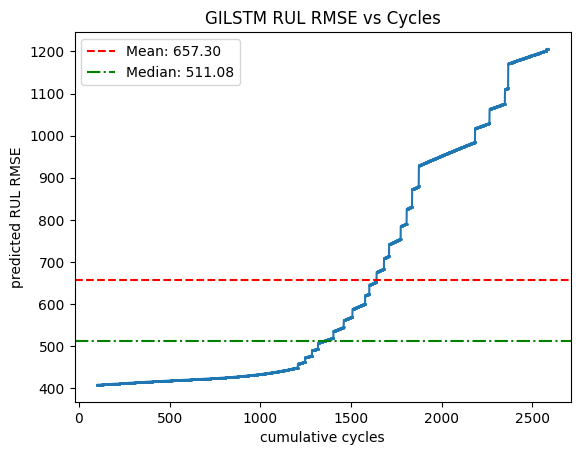

In [77]:
#Plot rmse per cycle use log scale
data = cycle_rmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL RMSE')
plt.title('GILSTM RUL RMSE vs Cycles')
#plt.yscale('symlog')
plt.grid(False)
# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

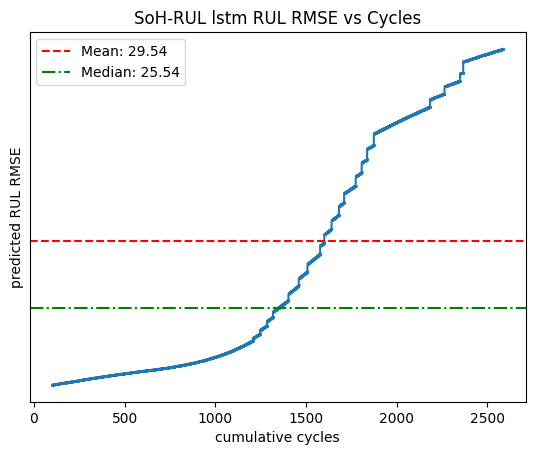

In [78]:
#Plot rmse per cycle use log scale
data = cycle_nrmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL RMSE')
plt.title('SoH-RUL lstm RUL RMSE vs Cycles')
plt.yscale('symlog')
plt.grid(False)
# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

In [79]:
#save SoH to RUL rmse results
with open('GILSTM_1_rmse_results.pkl', 'wb') as file:
    pickle.dump([cycle_rmse,cycle_nrmse], file)

## 3b. GILSTM cycle_to_cycle that predict k,a and b from SoH, then use the inverse gompertz eqn to calculate RUL

In [80]:
model_columns = ['SoH']

print("# B: Setup variables and functions")
# # Set variables
# WINDOW_SIZE = 35
model_type = ['lstm','seq2seq-lstm','pinn'][2]

cutoff_soh = 0.70
# Set Computing Environment
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
INPUT_SIZE = len(model_columns)
OUTPUT_SIZE =3 #RUL #len(model_columns)#1 #controls how many values the lstm outputs
num_epochs = 1000 #60
batch_size = 4 #32 #because the data is little a small batch size is better when training
normalize_soh = False
I = 0
if normalize_soh:
    soh_normalization_constant = 115.0 #115.0 may be better as it allows bounding between 0 and 1
    cutoff_soh = cutoff_soh/soh_normalization_constant #set cutoff soh wrt to normalizer
else:
    soh_normalization_constant = 1.0
    cutoff_soh = cutoff_soh/soh_normalization_constant #set cutoff soh wrt to normalizer

class PhysicsInformedLSTM(nn.Module):
    def __init__(self, input_size=5, hidden_size=128):
        super().__init__()
        # Direct mapping: Input -> LSTM -> FC -> Output
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(128, 3) 
        
    def forward(self, x):
        out, _ = self.lstm(x)
        return self.fc(out[:, -1, :])


def df_to_X_y_tensor(df, window_size=5,output_size=5,i=0):
    '''
    Converts a time series into (X, y) tensors for LSTM training.
    
    X shape: (num_samples, window_size, 1)
    y shape: (num_samples, 1)
    '''
    if isinstance(df, (pd.DataFrame, pd.Series)):
        df_as_np = df.to_numpy()
    else:
        df_as_np = df  # Assume already numpy

    X, y = [], []

    X.append([[val] for val in df_as_np[i:i+window_size]])
    #y.append([df_as_np[i + window_size:i + window_size+output_size]])
    y.append([[val] for val in df_as_np[i + window_size:i + window_size+1]]) #next cycle
    
    X,y = np.array(X),np.array(y)
    X_tensor = torch.tensor(X, dtype=torch.float32)#.squeeze()
    y_tensor = torch.tensor(y, dtype=torch.float32)#.squeeze()
    return X_tensor, y_tensor
    
def df_to_X_y_tensor(df, window_size=5,output_size=5,I=0):
        '''
        Converts a time series into (X, y) tensors for LSTM training.
        
        X shape: (num_samples, window_size, 1)
        y shape: (num_samples, 1)
        '''
        # if isinstance(df, (pd.DataFrame, pd.Series)):
        #     df_as_np = df.to_numpy()
        # else:
        #     df_as_np = df  # Assume already numpy
    
        X, y , y2 = [], [], []
        #for i in range(len(df_as_np) - window_size):
        #for i in range(len(df)-window_size):  
        if len(df) > window_size+I:
            X.append(list(df['SoH'])[I:window_size+I])
            #y.append([df_as_np[i + window_size:i + window_size+output_size]])
            y.append([list(df['k'])[-1],list(df['a'])[-1],list(df['b'])[-1]])
            #append([[val] for val in df_as_np[i + window_size:i + window_size+1]]) #next cycle
            y2.append(list(df['rul'])[:1])
        X,y,y2 = np.array(X),np.array(y), np.array(y2)
        X_tensor = torch.tensor(X, dtype=torch.float32)#.squeeze()
        y_tensor = torch.tensor(y, dtype=torch.float32)#.squeeze()
        y_2_tensor = torch.tensor(y2, dtype=torch.float32)  #bug was here written y instead of y2
        return X_tensor, y_tensor, y_2_tensor
            
    
# def get_x_y_lists(paths):
#     X_list,y_list,y_target = [],[],[]
#     for path in paths:
#         print(path)
#         df = pd.read_csv(path)
#         df['Cycle number'] = df['Cycle number']/10000
#         df['rul'] = df['rul']/10000
#         #normalize SoH
#         df['SoH'] =  df['SoH']/soh_normalization_constant
#         df.index = df['Cycle number']
#         #SoH = df[model_columns]
#         X, y , y1 = df_to_X_y_tensor(df, window_size=WINDOW_SIZE,output_size=OUTPUT_SIZE,I=I)
#         X_list.append(X)
#         y_list.append(y)
#         y_target.append(y1) #RUL
#     return X_list,y_list, y_target

# def give_paths_get_loaders(paths,data_type,shuffle=False):
#     X_list, y_list, y_target = get_x_y_lists(paths)

#     batch_size = torch.cat(X_list, dim=0).shape[0]
    
#     if INPUT_SIZE == 1:
#         # Concatenate all X and y
#         X_1,y_1,y_2 = torch.cat(X_list, dim=0).unsqueeze(-1),torch.cat(y_list, dim=0).view(batch_size,-1),torch.cat(y_target, dim=0).view(batch_size,-1)
#     else:
#         X_1,y_1,y_2 = torch.cat(X_list, dim=0).squeeze(2),torch.cat(y_list, dim=0).view(-1,INPUT_SIZE),torch.cat(y_target, dim=0).view(-1,INPUT_SIZE)
    
#     print(f" X_{data_type} shape : {X_1.shape} , y_{data_type} shape : {y_1.shape} ，y_2{data_type} shape: {y_2.shape}" )
    
#     #DataLoader
#     print("load : ")
#     loader = DataLoader(TensorDataset(X_1, y_1, y_2), batch_size=32, shuffle=shuffle)
#     print(f"{data_type}loader lengths : ",loader.__len__())
#     return loader,X_1,y_1, y_2

def get_x_y_lists(paths):
    X_list,y_list,y_target = [],[],[]
    for path in paths:
        print(path)
        df = pd.read_csv(path)
        df['Cycle number'] = df['Cycle number']/10000
        df['rul'] = df['rul']/10000
        #normalize SoH
        df['SoH'] =  df['SoH']/soh_normalization_constant
        df.index = df['Cycle number']
        #SoH = df[model_columns]
        X, y , y1 = df_to_X_y_tensor(df, window_size=WINDOW_SIZE,output_size=OUTPUT_SIZE,I=I)
        # print("X length : ",len(X))
        if len(X) > 0 :
            X_list.append(X)
            y_list.append(y)
            y_target.append(y1) #RUL
    #print("X_list length : ",len(X_list))
    return X_list,y_list, y_target

def give_paths_get_loaders(paths,data_type,shuffle=False):
    X_list, y_list, y_target = get_x_y_lists(paths)
    if len(X_list) > 0:
        batch_size = torch.cat(X_list, dim=0).shape[0]
        
        if INPUT_SIZE == 1:
            # Concatenate all X and y
            X_1,y_1,y_2 = torch.cat(X_list, dim=0).unsqueeze(-1),torch.cat(y_list, dim=0).view(batch_size,-1),torch.cat(y_target, dim=0).view(batch_size,-1)
        else:
            X_1,y_1,y_2 = torch.cat(X_list, dim=0).squeeze(2),torch.cat(y_list, dim=0).view(-1,INPUT_SIZE),torch.cat(y_target, dim=0).view(-1,INPUT_SIZE)
        
        print(f" X_{data_type} shape : {X_1.shape} , y_{data_type} shape : {y_1.shape} ，y_2{data_type} shape: {y_2.shape}" )
        
        #DataLoader
        print("load : ")
        loader = DataLoader(TensorDataset(X_1, y_1, y_2), batch_size=32, shuffle=shuffle)
        print(f"{data_type}loader lengths : ",loader.__len__())
        return loader,X_1,y_1, y_2
    # --- HANDLE EMPTY DATA CASE ---
    print(f"Warning: No data found for {data_type}. Returning empty objects.")
    return [], None, None, None  # Returns an empty list for the loader and None for tensors

data_use = {0:["train"],1:["val"],2:["test"]}

test_loader,X_test,y_test,y_test_target = give_paths_get_loaders(test_paths,data_use[2])
model = PhysicsInformedLSTM(input_size=INPUT_SIZE).to(device)

def inverse_gompertz_func(y,k,a,b):
    return (a - np.log(np.log(k/y)))/b

# B: Setup variables and functions
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-paramete

In [81]:
model.load_state_dict(torch.load(f"models/best_lstm_model-window-100_model_pinn_data_all_cycle_to_cycle.pth",map_location=torch.device(device)))

cycle_rmse = {}
cycle_nrmse = {}

#test on per cycle basis
for I in tqdm(range(WINDOW_SIZE,MAX_WINDOW-101)):
    test_rmse = 0
    test_loader,X_test,y_test,y_target = give_paths_get_loaders(test_paths,'test')
    if X_test != None:
        for X_test, y_test, y_target in test_loader:
            X_test = X_test.to(device)
            y_pred = model(X_test)
            
            k_pred = y_pred[:, 0].cpu().detach().numpy()
            a_pred = y_pred[:, 1].cpu().detach().numpy()
            b_pred = y_pred[:, 2].cpu().detach().numpy()
            results = np.round(inverse_gompertz_func(y=0.7, k=k_pred, a=a_pred, b=b_pred), decimals=4)
            #print(results,'\n',y_target)
            #inference for test results
            test_rmse += root_mean_squared_error(results,y_target)
        
        print(f'\n Test RMSE for cycle {I} SoH to k,a,b then RUL prediction : ',test_rmse/len(test_loader)*10000) #multiply by 10,000 because cycle numers had been normalized using 10000
        if len(test_loader) > 0:
            cycle_rmse[I] = test_rmse/len(test_loader)*10000
            cycle_nrmse[I] = (test_rmse/len(test_loader)*10000)/(np.mean(y_target.cpu().detach().numpy())*10000)*100
        #break
    

  0%|          | 0/2488 [00:00<?, ?it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

  0%|          | 2/2488 [00:00<03:04, 13.50it/s]


 Test RMSE for cycle 100 SoH to k,a,b then RUL prediction :  431.2555864453316
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

  0%|          | 4/2488 [00:00<03:02, 13.59it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 103 SoH to k,a,b then RUL prediction :  430.72715401649475
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

  0%|          | 6/2488 [00:00<03:01, 13.67it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 105 SoH to k,a,b then RUL prediction :  430.2399605512619
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

  0%|          | 8/2488 [00:00<03:01, 13.66it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 106 SoH to k,a,b then RUL prediction :  429.98500168323517
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

  0%|          | 10/2488 [00:00<03:01, 13.68it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

  0%|          | 12/2488 [00:00<03:00, 13.73it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

  1%|          | 14/2488 [00:01<02:59, 13.76it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 113 SoH to k,a,b then RUL prediction :  428.43472212553024
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

  1%|          | 16/2488 [00:01<02:59, 13.78it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 114 SoH to k,a,b then RUL prediction :  428.15182358026505
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

  1%|          | 18/2488 [00:01<02:58, 13.83it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 117 SoH to k,a,b then RUL prediction :  427.57589370012283
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

  1%|          | 20/2488 [00:01<02:58, 13.86it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 119 SoH to k,a,b then RUL prediction :  427.18246579170227
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

  1%|          | 22/2488 [00:01<02:58, 13.84it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 120 SoH to k,a,b then RUL prediction :  426.79693549871445
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

  1%|          | 24/2488 [00:01<02:58, 13.84it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 123

  1%|          | 26/2488 [00:01<02:57, 13.85it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

  1%|          | 28/2488 [00:02<02:57, 13.88it/s]


 Test RMSE for cycle 127 SoH to k,a,b then RUL prediction :  425.1585155725479
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

  1%|          | 30/2488 [00:02<02:57, 13.86it/s]


 Test RMSE for cycle 128 SoH to k,a,b then RUL prediction :  424.9654710292816
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

  1%|▏         | 32/2488 [00:02<02:57, 13.86it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 131 SoH to k,a,b then RUL prediction :  424.3503510951996
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

  1%|▏         | 34/2488 [00:02<02:56, 13.89it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 133 SoH to k,a,b then RUL prediction :  423.7869009375572
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

  1%|▏         | 36/2488 [00:02<02:56, 13.88it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 134 SoH to k,a,b then RUL prediction :  423.6363619565964
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

  2%|▏         | 38/2488 [00:02<02:56, 13.89it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 137 SoH to k,a,b then RUL prediction :  423.02045971155167
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

  2%|▏         | 40/2488 [00:02<02:55, 13.92it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

  2%|▏         | 42/2488 [00:03<02:55, 13.95it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  2%|▏         | 44/2488 [00:03<02:55, 13.94it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

  2%|▏         | 46/2488 [00:03<02:55, 13.92it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 145 SoH to k,a,b then RUL prediction :  421.14511132240295
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

  2%|▏         | 48/2488 [00:03<02:55, 13.90it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 147 SoH to k,a,b then RUL prediction :  420.67859321832657
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

  2%|▏         | 50/2488 [00:03<02:55, 13.90it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 148 SoH to k,a,b then RUL prediction :  420.4116761684418
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

  2%|▏         | 52/2488 [00:03<02:55, 13.92it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 151 SoH to k,a,b then RUL prediction :  419.5726662874222
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

  2%|▏         | 54/2488 [00:03<02:54, 13.91it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 153

  2%|▏         | 56/2488 [00:04<02:54, 13.93it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 154 SoH to k,a,b then RUL prediction :  419.0302640199661
gompe

  2%|▏         | 58/2488 [00:04<02:54, 13.90it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

  2%|▏         | 60/2488 [00:04<02:54, 13.92it/s]


 Test RMSE for cycle 158 SoH to k,a,b then RUL prediction :  418.0523380637169
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

  2%|▏         | 62/2488 [00:04<02:54, 13.93it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 161 SoH to k,a,b then RUL prediction :  417.33402758836746
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

  3%|▎         | 64/2488 [00:04<02:53, 13.96it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 162 SoH to k,a,b then RUL prediction :  417.12433099746704
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

  3%|▎         | 66/2488 [00:04<02:53, 13.94it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 165 SoH to k,a,b then RUL prediction :  416.40203446149826
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

  3%|▎         | 68/2488 [00:04<02:53, 13.95it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 167 SoH to k,a,b then RUL prediction :  416.1331057548523
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

  3%|▎         | 70/2488 [00:05<02:53, 13.96it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 168 SoH to k,a,b then RUL prediction :  415.93611240386963
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

  3%|▎         | 72/2488 [00:05<02:53, 13.93it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  3%|▎         | 74/2488 [00:05<02:53, 13.93it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

  3%|▎         | 76/2488 [00:05<02:53, 13.92it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 175 SoH to k,a,b then RUL prediction :  414.42539542913437
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

  3%|▎         | 78/2488 [00:05<02:52, 13.95it/s]


 Test RMSE for cycle 176 SoH to k,a,b then RUL prediction :  414.11496698856354
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

  3%|▎         | 80/2488 [00:05<02:52, 13.98it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 179 SoH to k,a,b then RUL prediction :  413.5076701641083
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

  3%|▎         | 82/2488 [00:05<02:52, 13.96it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 181 SoH to k,a,b then RUL prediction :  413.0276292562485
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

  3%|▎         | 84/2488 [00:06<02:52, 13.97it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 182 SoH to k,a,b then RUL prediction :  412.81145066022873
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

  3%|▎         | 86/2488 [00:06<02:53, 13.84it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 185 SoH to k,a,b then RUL prediction :  412.1934622526169
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

  4%|▎         | 88/2488 [00:06<02:53, 13.86it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

  4%|▎         | 90/2488 [00:06<02:52, 13.90it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

  4%|▎         | 92/2488 [00:06<02:52, 13.93it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

  4%|▍         | 94/2488 [00:06<02:52, 13.88it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 193 SoH to k,a,b then RUL prediction :  410.73471307754517
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

  4%|▍         | 96/2488 [00:06<02:52, 13.89it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 195 SoH to k,a,b then RUL prediction :  410.27192026376724
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

  4%|▍         | 98/2488 [00:07<02:51, 13.90it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 196 SoH to k,a,b then RUL prediction :  410.18854826688766
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

  4%|▍         | 100/2488 [00:07<02:51, 13.89it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 199 SoH to k,a,b then RUL prediction :  409.6022993326187
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

  4%|▍         | 102/2488 [00:07<02:51, 13.91it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  4%|▍         | 104/2488 [00:07<02:50, 13.94it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  4%|▍         | 106/2488 [00:07<02:50, 13.94it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

  4%|▍         | 108/2488 [00:07<02:50, 13.94it/s]


 Test RMSE for cycle 207 SoH to k,a,b then RUL prediction :  408.14273059368134
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

  4%|▍         | 110/2488 [00:07<02:50, 13.93it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 209 SoH to k,a,b then RUL prediction :  407.8420624136925
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

  5%|▍         | 112/2488 [00:08<02:50, 13.95it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 210 SoH to k,a,b then RUL prediction :  407.6137766242027
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

  5%|▍         | 114/2488 [00:08<02:50, 13.95it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 213 SoH to k,a,b then RUL prediction :  406.9996252655983
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

  5%|▍         | 116/2488 [00:08<02:50, 13.93it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 215 SoH to k,a,b then RUL prediction :  406.6675156354904
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

  5%|▍         | 118/2488 [00:08<02:50, 13.92it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 216 SoH to k,a,b then RUL prediction :  406.50323033332825
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

  5%|▍         | 120/2488 [00:08<02:49, 13.96it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  5%|▍         | 122/2488 [00:08<02:49, 13.98it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

  5%|▍         | 124/2488 [00:08<02:49, 13.93it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 223 SoH to k,a,b then RUL prediction :  405.3103178739548
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

  5%|▌         | 126/2488 [00:09<02:49, 13.96it/s]


 Test RMSE for cycle 224 SoH to k,a,b then RUL prediction :  405.2376374602318
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

  5%|▌         | 128/2488 [00:09<02:48, 13.99it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 227 SoH to k,a,b then RUL prediction :  404.65097874403
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

  5%|▌         | 130/2488 [00:09<02:48, 14.02it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 229 SoH to k,a,b then RUL prediction :  404.33604270219803
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

  5%|▌         | 132/2488 [00:09<02:47, 14.04it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 230 SoH to k,a,b then RUL prediction :  404.2043164372444
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

  5%|▌         | 134/2488 [00:09<02:48, 13.98it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 233 SoH to k,a,b then RUL prediction :  403.60860526561737
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

  5%|▌         | 136/2488 [00:09<02:47, 14.01it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  6%|▌         | 138/2488 [00:09<02:48, 13.96it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 236

  6%|▌         | 140/2488 [00:10<02:48, 13.95it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

  6%|▌         | 142/2488 [00:10<02:48, 13.96it/s]


 Test RMSE for cycle 240 SoH to k,a,b then RUL prediction :  402.4586081504822
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

  6%|▌         | 144/2488 [00:10<02:47, 14.00it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 243 SoH to k,a,b then RUL prediction :  402.1774232387543
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

  6%|▌         | 146/2488 [00:10<02:47, 14.01it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 244 SoH to k,a,b then RUL prediction :  401.9296169281006
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

  6%|▌         | 148/2488 [00:10<02:46, 14.03it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 247 SoH to k,a,b then RUL prediction :  401.47535502910614
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

  6%|▌         | 150/2488 [00:10<02:46, 14.01it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 249 SoH to k,a,b then RUL prediction :  401.1417180299759
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

  6%|▌         | 152/2488 [00:10<02:46, 14.01it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 250 SoH to k,a,b then RUL prediction :  400.96379816532135
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

  6%|▌         | 154/2488 [00:11<02:46, 13.98it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 253

  6%|▋         | 156/2488 [00:11<02:47, 13.95it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

  6%|▋         | 158/2488 [00:11<02:47, 13.94it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 257 SoH to k,a,b then RUL prediction :  399.88506585359573
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

  6%|▋         | 160/2488 [00:11<02:46, 13.99it/s]


 Test RMSE for cycle 258 SoH to k,a,b then RUL prediction :  399.6970131993294
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

  7%|▋         | 162/2488 [00:11<02:45, 14.02it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 261 SoH to k,a,b then RUL prediction :  399.2362692952156
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

  7%|▋         | 164/2488 [00:11<02:45, 14.04it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 263 SoH to k,a,b then RUL prediction :  398.98958057165146
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

  7%|▋         | 166/2488 [00:11<02:45, 14.04it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 264 SoH to k,a,b then RUL prediction :  398.88784289360046
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

  7%|▋         | 168/2488 [00:12<02:45, 14.02it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 267 SoH to k,a,b then RUL prediction :  398.4466567635536
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

  7%|▋         | 170/2488 [00:12<02:45, 14.02it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  7%|▋         | 172/2488 [00:12<02:44, 14.05it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 270

  7%|▋         | 174/2488 [00:12<02:44, 14.07it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

  7%|▋         | 176/2488 [00:12<02:45, 14.01it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

  7%|▋         | 178/2488 [00:12<02:45, 13.99it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 277 SoH to k,a,b then RUL prediction :  397.13092148303986
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

  7%|▋         | 180/2488 [00:12<02:44, 13.99it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 278 SoH to k,a,b then RUL prediction :  397.2005099058151
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

  7%|▋         | 182/2488 [00:13<02:44, 13.99it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 281 SoH to k,a,b then RUL prediction :  396.73086255788803
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

  7%|▋         | 184/2488 [00:13<02:44, 14.00it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 283 SoH to k,a,b then RUL prediction :  396.42512798309326
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

  7%|▋         | 186/2488 [00:13<02:44, 14.01it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 284 SoH to k,a,b then RUL prediction :  396.28900587558746
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

  8%|▊         | 188/2488 [00:13<02:43, 14.03it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 287 SoH to k,a,b then RUL prediction :  395.96062153577805
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

  8%|▊         | 190/2488 [00:13<02:43, 14.06it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

  8%|▊         | 192/2488 [00:13<02:43, 14.05it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  8%|▊         | 194/2488 [00:13<02:43, 14.02it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

  8%|▊         | 196/2488 [00:14<02:43, 14.05it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 294 SoH to k,a,b then RUL prediction :  395.20755410194397
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

  8%|▊         | 198/2488 [00:14<02:43, 14.04it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 297 SoH to k,a,b then RUL prediction :  394.85760033130646
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

  8%|▊         | 200/2488 [00:14<02:42, 14.06it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 298 SoH to k,a,b then RUL prediction :  394.69268172979355
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

  8%|▊         | 202/2488 [00:14<02:42, 14.03it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 301 SoH to k,a,b then RUL prediction :  394.4336250424385
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

  8%|▊         | 204/2488 [00:14<02:43, 14.00it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 303 SoH to k,a,b then RUL prediction :  394.2396864295006
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

  8%|▊         | 206/2488 [00:14<02:43, 13.96it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 304 SoH to k,a,b then RUL prediction :  394.0492123365402
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

  8%|▊         | 208/2488 [00:14<02:43, 13.96it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 307

  8%|▊         | 210/2488 [00:15<02:42, 14.00it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

  9%|▊         | 212/2488 [00:15<02:42, 13.98it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 311 SoH to k,a,b then RUL prediction :  393.2575508952141
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

  9%|▊         | 214/2488 [00:15<02:42, 14.00it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

  9%|▊         | 216/2488 [00:15<02:42, 13.98it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 315 SoH to k,a,b then RUL prediction :  393.0293023586273
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

  9%|▉         | 218/2488 [00:15<02:42, 14.00it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 317 SoH to k,a,b then RUL prediction :  392.7924856543541
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

  9%|▉         | 220/2488 [00:15<02:41, 14.00it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 318 SoH to k,a,b then RUL prediction :  392.6510736346245
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

  9%|▉         | 222/2488 [00:15<02:41, 14.01it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 321 SoH to k,a,b then RUL prediction :  392.38668978214264
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

  9%|▉         | 224/2488 [00:16<02:41, 14.01it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

  9%|▉         | 226/2488 [00:16<02:41, 14.00it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 324 SoH to k,a,b then RUL prediction :  392.0234739780426
gompe

  9%|▉         | 228/2488 [00:16<02:41, 14.02it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

  9%|▉         | 230/2488 [00:16<02:40, 14.04it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

  9%|▉         | 232/2488 [00:16<02:40, 14.02it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 331 SoH to k,a,b then RUL prediction :  391.48032665252686
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

  9%|▉         | 234/2488 [00:16<02:40, 14.03it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 332 SoH to k,a,b then RUL prediction :  391.5043920278549
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

  9%|▉         | 236/2488 [00:16<02:40, 14.00it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 335 SoH to k,a,b then RUL prediction :  391.11047983169556
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 10%|▉         | 238/2488 [00:17<02:40, 13.98it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 337 SoH to k,a,b then RUL prediction :  391.0396248102188
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 10%|▉         | 240/2488 [00:17<02:40, 13.99it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 338 SoH to k,a,b then RUL prediction :  391.1256417632103
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 10%|▉         | 242/2488 [00:17<02:40, 14.02it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 341 SoH to k,a,b then RUL prediction :  390.7296434044838
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 10%|▉         | 244/2488 [00:17<02:40, 14.02it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 10%|▉         | 246/2488 [00:17<02:40, 14.00it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 10%|▉         | 248/2488 [00:17<02:40, 13.99it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 10%|█         | 250/2488 [00:17<02:40, 13.97it/s]


 Test RMSE for cycle 349 SoH to k,a,b then RUL prediction :  390.198789536953
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-

 10%|█         | 252/2488 [00:18<02:39, 13.99it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 351 SoH to k,a,b then RUL prediction :  390.0647908449173
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 10%|█         | 254/2488 [00:18<02:39, 13.99it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 352 SoH to k,a,b then RUL prediction :  389.9747505784035
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 10%|█         | 256/2488 [00:18<02:39, 13.98it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 355 SoH to k,a,b then RUL prediction :  389.89800959825516
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 10%|█         | 258/2488 [00:18<02:39, 13.97it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 357

 10%|█         | 260/2488 [00:18<02:39, 13.96it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 358 SoH to k,a,b then RUL prediction :  389.7654637694359
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 11%|█         | 262/2488 [00:18<02:39, 13.95it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 11%|█         | 264/2488 [00:18<02:39, 13.97it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 11%|█         | 266/2488 [00:19<02:38, 13.98it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 365 SoH to k,a,b then RUL prediction :  389.24507796764374
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 11%|█         | 268/2488 [00:19<02:38, 13.98it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 11%|█         | 270/2488 [00:19<02:38, 13.98it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 369 SoH to k,a,b then RUL prediction :  389.09927010536194
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 11%|█         | 272/2488 [00:19<02:38, 13.98it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 371 SoH to k,a,b then RUL prediction :  389.0550509095192
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 11%|█         | 274/2488 [00:19<02:38, 14.00it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 372 SoH to k,a,b then RUL prediction :  388.96556943655014
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 11%|█         | 276/2488 [00:19<02:38, 13.99it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 375 SoH to k,a,b then RUL prediction :  388.78433406352997
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 11%|█         | 278/2488 [00:19<02:37, 14.02it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 11%|█▏        | 280/2488 [00:20<02:37, 14.05it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 378

 11%|█▏        | 282/2488 [00:20<02:37, 14.03it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 11%|█▏        | 284/2488 [00:20<02:37, 14.02it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 382 SoH to k,a,b then RUL prediction :  388.4420916438103
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 11%|█▏        | 286/2488 [00:20<02:37, 14.02it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 385 SoH to k,a,b then RUL prediction :  388.4727507829666
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 12%|█▏        | 288/2488 [00:20<02:36, 14.02it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 386 SoH to k,a,b then RUL prediction :  388.3706405758858
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 12%|█▏        | 290/2488 [00:20<02:36, 14.01it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 389 SoH to k,a,b then RUL prediction :  388.2668539881706
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 12%|█▏        | 292/2488 [00:20<02:36, 13.99it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 391 SoH to k,a,b then RUL prediction :  388.1244361400604
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 12%|█▏        | 294/2488 [00:21<02:36, 13.99it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 392 SoH to k,a,b then RUL prediction :  388.1661966443062
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 12%|█▏        | 296/2488 [00:21<02:36, 14.01it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 395 SoH to k,a,b then RUL prediction :  388.1041705608368
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 12%|█▏        | 298/2488 [00:21<02:36, 14.02it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 12%|█▏        | 300/2488 [00:21<02:36, 14.02it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 12%|█▏        | 302/2488 [00:21<02:36, 14.00it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 12%|█▏        | 304/2488 [00:21<02:36, 13.96it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 403 SoH to k,a,b then RUL prediction :  387.76129484176636
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 12%|█▏        | 306/2488 [00:21<02:35, 14.02it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 405 SoH to k,a,b then RUL prediction :  387.70291954278946
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 12%|█▏        | 308/2488 [00:22<02:35, 14.06it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 406 SoH to k,a,b then RUL prediction :  387.7977654337883
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 12%|█▏        | 310/2488 [00:22<02:35, 14.03it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 409 SoH to k,a,b then RUL prediction :  387.6323997974396
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 13%|█▎        | 312/2488 [00:22<02:35, 14.03it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 411

 13%|█▎        | 314/2488 [00:22<02:34, 14.05it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 412 SoH to k,a,b then RUL prediction :  387.4821588397026
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 13%|█▎        | 316/2488 [00:22<02:34, 14.02it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 13%|█▎        | 318/2488 [00:22<02:35, 13.99it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 13%|█▎        | 320/2488 [00:22<02:34, 14.02it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 419 SoH to k,a,b then RUL prediction :  387.4174878001213
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 13%|█▎        | 322/2488 [00:23<02:34, 14.03it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 13%|█▎        | 324/2488 [00:23<02:34, 14.01it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 423 SoH to k,a,b then RUL prediction :  387.35929876565933
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 13%|█▎        | 326/2488 [00:23<02:34, 14.02it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 425 SoH to k,a,b then RUL prediction :  387.2709348797798
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 13%|█▎        | 328/2488 [00:23<02:34, 14.02it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 426 SoH to k,a,b then RUL prediction :  387.2612491250038
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 13%|█▎        | 330/2488 [00:23<02:33, 14.01it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 429 SoH to k,a,b then RUL prediction :  387.2827813029289
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 13%|█▎        | 332/2488 [00:23<02:33, 14.03it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 13%|█▎        | 334/2488 [00:23<02:33, 14.00it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 432

 14%|█▎        | 336/2488 [00:24<02:33, 14.00it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 14%|█▎        | 338/2488 [00:24<02:33, 14.02it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 436 SoH to k,a,b then RUL prediction :  387.2879222035408
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 14%|█▎        | 340/2488 [00:24<02:33, 14.02it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 439 SoH to k,a,b then RUL prediction :  387.32506334781647
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 14%|█▎        | 342/2488 [00:24<02:32, 14.03it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 440 SoH to k,a,b then RUL prediction :  387.44885474443436
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 14%|█▍        | 344/2488 [00:24<02:33, 13.99it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 443 SoH to k,a,b then RUL prediction :  387.35732436180115
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 14%|█▍        | 346/2488 [00:24<02:32, 14.00it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 445 SoH to k,a,b then RUL prediction :  387.23841309547424
gomp

 14%|█▍        | 348/2488 [00:24<02:32, 14.01it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 446 SoH to k,a,b then RUL prediction :  387.2724622488022
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 14%|█▍        | 350/2488 [00:25<02:32, 13.98it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 449 SoH to k,a,b then RUL prediction :  387.2692957520485
gompe

 14%|█▍        | 352/2488 [00:25<02:32, 13.98it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 14%|█▍        | 354/2488 [00:25<02:32, 13.98it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 453 SoH to k,a,b then RUL prediction :  387.3448073863983
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 14%|█▍        | 356/2488 [00:25<02:32, 14.02it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 14%|█▍        | 358/2488 [00:25<02:32, 14.01it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 457 SoH to k,a,b then RUL prediction :  387.48182356357574
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 14%|█▍        | 360/2488 [00:25<02:32, 13.99it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 459 SoH to k,a,b then RUL prediction :  387.42542266845703
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 15%|█▍        | 362/2488 [00:25<02:31, 13.99it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 460 SoH to k,a,b then RUL prediction :  387.4918445944786
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 15%|█▍        | 364/2488 [00:26<02:32, 13.94it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 463 SoH to k,a,b then RUL prediction :  387.3797506093979
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 15%|█▍        | 366/2488 [00:26<02:32, 13.87it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 15%|█▍        | 368/2488 [00:26<02:32, 13.92it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 466

 15%|█▍        | 370/2488 [00:26<02:32, 13.91it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 15%|█▍        | 372/2488 [00:26<02:31, 13.96it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 470 SoH to k,a,b then RUL prediction :  387.6592591404915
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 15%|█▌        | 374/2488 [00:26<02:30, 14.00it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 473 SoH to k,a,b then RUL prediction :  387.5439241528511
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 15%|█▌        | 376/2488 [00:26<02:30, 14.01it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 474 SoH to k,a,b then RUL prediction :  387.4659165740013
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 15%|█▌        | 378/2488 [00:27<02:30, 13.98it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 477 SoH to k,a,b then RUL prediction :  387.5209018588066
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 15%|█▌        | 380/2488 [00:27<02:30, 14.00it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 479 SoH to k,a,b then RUL prediction :  387.56005465984344
gomp

 15%|█▌        | 382/2488 [00:27<02:30, 14.01it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 480 SoH to k,a,b then RUL prediction :  387.63023912906647
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 15%|█▌        | 384/2488 [00:27<02:30, 14.01it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 483 SoH to k,a,b then RUL prediction :  387.71580904722214
gomp

 16%|█▌        | 386/2488 [00:27<02:29, 14.02it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 16%|█▌        | 388/2488 [00:27<02:29, 14.01it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 487 SoH to k,a,b then RUL prediction :  387.8333047032356
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 16%|█▌        | 390/2488 [00:27<02:29, 14.01it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 16%|█▌        | 392/2488 [00:28<02:29, 14.01it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 491 SoH to k,a,b then RUL prediction :  387.89432495832443
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 16%|█▌        | 394/2488 [00:28<02:29, 13.98it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 493 SoH to k,a,b then RUL prediction :  387.8885507583618
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 16%|█▌        | 396/2488 [00:28<02:29, 14.00it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 494 SoH to k,a,b then RUL prediction :  388.0798816680908
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 16%|█▌        | 398/2488 [00:28<02:28, 14.03it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 497 SoH to k,a,b then RUL prediction :  388.15557956695557
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 16%|█▌        | 400/2488 [00:28<02:29, 14.01it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 16%|█▌        | 402/2488 [00:28<02:29, 13.99it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 500 SoH to k,a,b then RUL prediction :  388.2518410682678
gompe

 16%|█▌        | 404/2488 [00:28<02:28, 14.01it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 16%|█▋        | 406/2488 [00:29<02:28, 14.05it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 504 SoH to k,a,b then RUL prediction :  388.212688267231
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gomp

 16%|█▋        | 408/2488 [00:29<02:28, 14.02it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 507 SoH to k,a,b then RUL prediction :  388.35685700178146
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 16%|█▋        | 410/2488 [00:29<02:27, 14.05it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 508 SoH to k,a,b then RUL prediction :  388.4553909301758
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 17%|█▋        | 412/2488 [00:29<02:28, 14.01it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 511 SoH to k,a,b then RUL prediction :  388.6372968554497
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 17%|█▋        | 414/2488 [00:29<02:27, 14.02it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 513 SoH to k,a,b then RUL prediction :  388.6358439922333
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 17%|█▋        | 416/2488 [00:29<02:27, 14.06it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 514 SoH to k,a,b then RUL prediction :  388.72625678777695
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 17%|█▋        | 418/2488 [00:29<02:27, 14.06it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 517 SoH to k,a,b then RUL prediction :  388.6899724602699
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 17%|█▋        | 420/2488 [00:30<02:27, 14.05it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 17%|█▋        | 422/2488 [00:30<02:26, 14.07it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 520

 17%|█▋        | 424/2488 [00:30<02:26, 14.06it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 17%|█▋        | 426/2488 [00:30<02:26, 14.06it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 524 SoH to k,a,b then RUL prediction :  389.0956938266754
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 17%|█▋        | 428/2488 [00:30<02:26, 14.04it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 527 SoH to k,a,b then RUL prediction :  389.18450474739075
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 17%|█▋        | 430/2488 [00:30<02:26, 14.07it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 528 SoH to k,a,b then RUL prediction :  389.06510919332504
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 17%|█▋        | 432/2488 [00:30<02:26, 14.07it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 531 SoH to k,a,b then RUL prediction :  389.28136229515076
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 17%|█▋        | 434/2488 [00:31<02:26, 14.06it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 533 SoH to k,a,b then RUL prediction :  389.375276863575
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomper

 18%|█▊        | 436/2488 [00:31<02:25, 14.06it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 534 SoH to k,a,b then RUL prediction :  389.3646225333214
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 18%|█▊        | 438/2488 [00:31<02:25, 14.08it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 537 SoH to k,a,b then RUL prediction :  389.5013779401779
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 18%|█▊        | 440/2488 [00:31<02:25, 14.09it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 18%|█▊        | 442/2488 [00:31<02:25, 14.11it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 540

 18%|█▊        | 444/2488 [00:31<02:24, 14.14it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 18%|█▊        | 446/2488 [00:31<02:24, 14.09it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 544 SoH to k,a,b then RUL prediction :  389.7801414132118
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 18%|█▊        | 448/2488 [00:32<02:24, 14.11it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 547 SoH to k,a,b then RUL prediction :  389.95739072561264
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 18%|█▊        | 450/2488 [00:32<02:24, 14.07it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 548 SoH to k,a,b then RUL prediction :  389.89778608083725
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 18%|█▊        | 452/2488 [00:32<02:25, 14.03it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 551 SoH to k,a,b then RUL prediction :  389.9795934557915
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 18%|█▊        | 454/2488 [00:32<02:25, 14.03it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 553 SoH to k,a,b then RUL prediction :  390.0683671236038
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 18%|█▊        | 456/2488 [00:32<02:24, 14.03it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 554 SoH to k,a,b then RUL prediction :  390.1318088173866
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 18%|█▊        | 458/2488 [00:32<02:24, 14.04it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 557 SoH to k,a,b then RUL prediction :  390.3558477759361
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 18%|█▊        | 460/2488 [00:32<02:24, 14.06it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 19%|█▊        | 462/2488 [00:33<02:24, 14.04it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 19%|█▊        | 464/2488 [00:33<02:23, 14.06it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 19%|█▊        | 466/2488 [00:33<02:23, 14.06it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 564 SoH to k,a,b then RUL prediction :  390.71783423423767
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 19%|█▉        | 468/2488 [00:33<02:23, 14.03it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 567 SoH to k,a,b then RUL prediction :  390.74547588825226
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 19%|█▉        | 470/2488 [00:33<02:23, 14.03it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 568 SoH to k,a,b then RUL prediction :  390.80992341041565
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 19%|█▉        | 472/2488 [00:33<02:23, 14.03it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 571 SoH to k,a,b then RUL prediction :  391.0128027200699
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 19%|█▉        | 474/2488 [00:33<02:23, 14.05it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 573 SoH to k,a,b then RUL prediction :  391.1493346095085
gompe

 19%|█▉        | 476/2488 [00:34<02:23, 14.02it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 574 SoH to k,a,b then RUL prediction :  391.1960870027542
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 19%|█▉        | 478/2488 [00:34<02:23, 14.04it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 577

 19%|█▉        | 480/2488 [00:34<02:22, 14.05it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 19%|█▉        | 482/2488 [00:34<02:22, 14.10it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 581 SoH to k,a,b then RUL prediction :  391.4403170347214
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 19%|█▉        | 484/2488 [00:34<02:22, 14.07it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 20%|█▉        | 486/2488 [00:34<02:23, 14.00it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 585 SoH to k,a,b then RUL prediction :  391.6195034980774
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 20%|█▉        | 488/2488 [00:34<02:22, 13.99it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 587 SoH to k,a,b then RUL prediction :  391.82983338832855
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 20%|█▉        | 490/2488 [00:35<02:22, 13.98it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 588 SoH to k,a,b then RUL prediction :  391.97735488414764
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 20%|█▉        | 492/2488 [00:35<02:23, 13.90it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 591 SoH to k,a,b then RUL prediction :  392.0098766684532
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 20%|█▉        | 494/2488 [00:35<02:23, 13.86it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 20%|█▉        | 496/2488 [00:35<02:23, 13.83it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 20%|██        | 498/2488 [00:35<02:24, 13.82it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 20%|██        | 500/2488 [00:35<02:24, 13.80it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 599 SoH to k,a,b then RUL prediction :  392.4087807536125
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 20%|██        | 502/2488 [00:35<02:23, 13.80it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 601 SoH to k,a,b then RUL prediction :  392.65137165784836
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 20%|██        | 504/2488 [00:36<02:23, 13.81it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 602 SoH to k,a,b then RUL prediction :  392.6173970103264
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 20%|██        | 506/2488 [00:36<02:23, 13.76it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 605 SoH to k,a,b then RUL prediction :  392.87228137254715
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 20%|██        | 508/2488 [00:36<02:24, 13.75it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 20%|██        | 510/2488 [00:36<02:24, 13.73it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 609 SoH to k,a,b then RUL prediction :  392.98921823501587
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 21%|██        | 512/2488 [00:36<02:23, 13.75it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 21%|██        | 514/2488 [00:36<02:23, 13.71it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 613 SoH to k,a,b then RUL prediction :  393.2839632034302
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 21%|██        | 516/2488 [00:36<02:23, 13.74it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 615 SoH to k,a,b then RUL prediction :  393.33291351795197
gomp

 21%|██        | 518/2488 [00:37<02:23, 13.69it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 616 SoH to k,a,b then RUL prediction :  393.43494921922684
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 21%|██        | 520/2488 [00:37<02:23, 13.68it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 619 SoH to k,a,b then RUL prediction :  393.4842720627785
gompe

 21%|██        | 522/2488 [00:37<02:23, 13.71it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 620 SoH to k,a,b then RUL prediction :  393.7004506587982
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 21%|██        | 524/2488 [00:37<02:23, 13.71it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 623 SoH to k,a,b then RUL prediction :  393.68879050016403
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 21%|██        | 526/2488 [00:37<02:23, 13.71it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 21%|██        | 528/2488 [00:37<02:22, 13.71it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 627 SoH to k,a,b then RUL prediction :  393.96394044160843
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 21%|██▏       | 530/2488 [00:37<02:22, 13.74it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 629

 21%|██▏       | 532/2488 [00:38<02:22, 13.76it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 630 SoH to k,a,b then RUL prediction :  394.185371696949
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz

 21%|██▏       | 534/2488 [00:38<02:22, 13.71it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 633

 22%|██▏       | 536/2488 [00:38<02:22, 13.72it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 634 SoH to k,a,b then RUL prediction :  394.3720832467079
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 22%|██▏       | 538/2488 [00:38<02:22, 13.72it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 637 SoH to k,a,b then RUL prediction :  394.5034369826317
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 22%|██▏       | 540/2488 [00:38<02:22, 13.68it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 638 SoH to k,a,b then RUL prediction :  394.5058211684227
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 22%|██▏       | 542/2488 [00:38<02:22, 13.69it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 641 SoH to k,a,b then RUL prediction :  394.8350250720978
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 22%|██▏       | 544/2488 [00:38<02:21, 13.75it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 22%|██▏       | 546/2488 [00:39<02:21, 13.71it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 644 SoH to k,a,b then RUL prediction :  395.0198367238045
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 22%|██▏       | 548/2488 [00:39<02:22, 13.66it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 22%|██▏       | 550/2488 [00:39<02:22, 13.63it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 649 SoH to k,a,b then RUL prediction :  395.2246159315109
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 22%|██▏       | 552/2488 [00:39<02:21, 13.67it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 651 SoH to k,a,b then RUL prediction :  395.2624276280403
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 22%|██▏       | 554/2488 [00:39<02:21, 13.71it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 652 SoH to k,a,b then RUL prediction :  395.2738270163536
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 22%|██▏       | 556/2488 [00:39<02:21, 13.64it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 655 SoH to k,a,b then RUL prediction :  395.58935910463333
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 22%|██▏       | 558/2488 [00:40<02:21, 13.65it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 23%|██▎       | 560/2488 [00:40<02:21, 13.66it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 659 SoH to k,a,b then RUL prediction :  395.6800699234009
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 23%|██▎       | 562/2488 [00:40<02:21, 13.64it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 23%|██▎       | 564/2488 [00:40<02:20, 13.66it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 663 SoH to k,a,b then RUL prediction :  395.9130495786667
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 23%|██▎       | 566/2488 [00:40<02:20, 13.65it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 665 SoH to k,a,b then RUL prediction :  395.9885984659195
gompe

 23%|██▎       | 568/2488 [00:40<02:20, 13.68it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 666 SoH to k,a,b then RUL prediction :  396.13060653209686
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 23%|██▎       | 570/2488 [00:40<02:19, 13.71it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 669

 23%|██▎       | 572/2488 [00:41<02:19, 13.74it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 23%|██▎       | 574/2488 [00:41<02:19, 13.71it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 673 SoH to k,a,b then RUL prediction :  396.4962810277939
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 23%|██▎       | 576/2488 [00:41<02:19, 13.74it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 674 SoH to k,a,b then RUL prediction :  396.46584540605545
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 23%|██▎       | 578/2488 [00:41<02:19, 13.73it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 677 SoH to k,a,b then RUL prediction :  396.58699184656143
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 23%|██▎       | 580/2488 [00:41<02:19, 13.69it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 679

 23%|██▎       | 582/2488 [00:41<02:19, 13.71it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 680 SoH to k,a,b then RUL prediction :  396.75794541835785
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 23%|██▎       | 584/2488 [00:41<02:19, 13.69it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 24%|██▎       | 586/2488 [00:42<02:19, 13.65it/s]


 Test RMSE for cycle 685 SoH to k,a,b then RUL prediction :  397.09094911813736
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 24%|██▎       | 588/2488 [00:42<02:19, 13.66it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 687 SoH to k,a,b then RUL prediction :  397.1179202198982
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 24%|██▎       | 590/2488 [00:42<02:18, 13.67it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 688 SoH to k,a,b then RUL prediction :  397.0789909362793
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 24%|██▍       | 592/2488 [00:42<02:19, 13.62it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 691 SoH to k,a,b then RUL prediction :  397.31666445732117
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 24%|██▍       | 594/2488 [00:42<02:18, 13.63it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 24%|██▍       | 596/2488 [00:42<02:18, 13.62it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 695 SoH to k,a,b then RUL prediction :  397.4313661456108
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 24%|██▍       | 598/2488 [00:42<02:18, 13.67it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 24%|██▍       | 600/2488 [00:43<02:17, 13.68it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 699 SoH to k,a,b then RUL prediction :  397.62847125530243
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 24%|██▍       | 602/2488 [00:43<02:17, 13.70it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 701 SoH to k,a,b then RUL prediction :  397.818461060524
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomper

 24%|██▍       | 604/2488 [00:43<02:17, 13.70it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 702 SoH to k,a,b then RUL prediction :  397.88179099559784
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 24%|██▍       | 606/2488 [00:43<02:17, 13.68it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 705 SoH to k,a,b then RUL prediction :  397.9030251502991
gompe

 24%|██▍       | 608/2488 [00:43<02:17, 13.69it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 25%|██▍       | 610/2488 [00:43<02:17, 13.68it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 709 SoH to k,a,b then RUL prediction :  398.0475664138794
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 25%|██▍       | 612/2488 [00:43<02:16, 13.70it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 710 SoH to k,a,b then RUL prediction :  398.2340171933174
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 25%|██▍       | 614/2488 [00:44<02:17, 13.66it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 713 SoH to k,a,b then RUL prediction :  398.4443098306656
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 25%|██▍       | 616/2488 [00:44<02:16, 13.67it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 25%|██▍       | 618/2488 [00:44<02:16, 13.68it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 716 SoH to k,a,b then RUL prediction :  398.47638458013535
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 25%|██▍       | 620/2488 [00:44<02:16, 13.67it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 25%|██▌       | 622/2488 [00:44<02:16, 13.67it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 720 SoH to k,a,b then RUL prediction :  398.6142575740814
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 25%|██▌       | 624/2488 [00:44<02:16, 13.66it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 723 SoH to k,a,b then RUL prediction :  398.85126054286957
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 25%|██▌       | 626/2488 [00:44<02:16, 13.69it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 724 SoH to k,a,b then RUL prediction :  398.84552359580994
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 25%|██▌       | 628/2488 [00:45<02:16, 13.67it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 727 SoH to k,a,b then RUL prediction :  399.0364074707031
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 25%|██▌       | 630/2488 [00:45<02:15, 13.67it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 25%|██▌       | 632/2488 [00:45<02:20, 13.19it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 731 SoH to k,a,b then RUL prediction :  398.9866375923157
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 25%|██▌       | 634/2488 [00:45<02:21, 13.13it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 732 SoH to k,a,b then RUL prediction :  399.03879165649414
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 26%|██▌       | 636/2488 [00:45<02:21, 13.13it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 735 SoH to k,a,b then RUL prediction :  399.34616535902023
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 26%|██▌       | 638/2488 [00:45<02:20, 13.20it/s]


 Test RMSE for cycle 736 SoH to k,a,b then RUL prediction :  399.446077644825
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-

 26%|██▌       | 640/2488 [00:46<02:19, 13.22it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 739 SoH to k,a,b then RUL prediction :  399.52948689460754
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 26%|██▌       | 642/2488 [00:46<02:19, 13.26it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 740 SoH to k,a,b then RUL prediction :  399.5969519019127
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 26%|██▌       | 644/2488 [00:46<02:18, 13.30it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 743 SoH to k,a,b then RUL prediction :  399.6489569544792
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 26%|██▌       | 646/2488 [00:46<02:18, 13.33it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 26%|██▌       | 648/2488 [00:46<02:17, 13.35it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 747 SoH to k,a,b then RUL prediction :  399.8163342475891
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 26%|██▌       | 650/2488 [00:46<02:16, 13.44it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 26%|██▌       | 652/2488 [00:46<02:16, 13.43it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 751 SoH to k,a,b then RUL prediction :  400.11052042245865
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 26%|██▋       | 654/2488 [00:47<02:16, 13.46it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 26%|██▋       | 656/2488 [00:47<02:16, 13.39it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 755 SoH to k,a,b then RUL prediction :  400.1382738351822
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 26%|██▋       | 658/2488 [00:47<02:16, 13.42it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 27%|██▋       | 660/2488 [00:47<02:15, 13.44it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 758 SoH to k,a,b then RUL prediction :  400.41495114564896
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 27%|██▋       | 662/2488 [00:47<02:15, 13.46it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 761 SoH to k,a,b then RUL prediction :  400.5429893732071
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 27%|██▋       | 664/2488 [00:47<02:15, 13.50it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 762 SoH to k,a,b then RUL prediction :  400.50942450761795
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 27%|██▋       | 666/2488 [00:47<02:14, 13.53it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 765 SoH to k,a,b then RUL prediction :  400.54667741060257
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 27%|██▋       | 668/2488 [00:48<02:14, 13.55it/s]


 Test RMSE for cycle 766 SoH to k,a,b then RUL prediction :  400.7050022482872
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

 27%|██▋       | 670/2488 [00:48<02:14, 13.50it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 769 SoH to k,a,b then RUL prediction :  400.8011519908905
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 27%|██▋       | 672/2488 [00:48<02:14, 13.52it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 27%|██▋       | 674/2488 [00:48<02:15, 13.41it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 773 SoH to k,a,b then RUL prediction :  401.0622948408127
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 27%|██▋       | 676/2488 [00:48<02:15, 13.41it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 27%|██▋       | 678/2488 [00:48<02:15, 13.39it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 777 SoH to k,a,b then RUL prediction :  401.1956602334976
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 27%|██▋       | 680/2488 [00:49<02:14, 13.49it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 27%|██▋       | 682/2488 [00:49<02:13, 13.54it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 781 SoH to k,a,b then RUL prediction :  401.36363357305527
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 27%|██▋       | 684/2488 [00:49<02:12, 13.58it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 783 SoH to k,a,b then RUL prediction :  401.5134274959564
gompe

 28%|██▊       | 686/2488 [00:49<02:11, 13.65it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 784 SoH to k,a,b then RUL prediction :  401.53712034225464
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 28%|██▊       | 688/2488 [00:49<02:11, 13.71it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 787 SoH to k,a,b then RUL prediction :  401.5999659895897
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 28%|██▊       | 690/2488 [00:49<02:10, 13.76it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 28%|██▊       | 692/2488 [00:49<02:10, 13.77it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 791 SoH to k,a,b then RUL prediction :  401.91158652305603
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 28%|██▊       | 694/2488 [00:50<02:10, 13.79it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 28%|██▊       | 696/2488 [00:50<02:10, 13.76it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 795 SoH to k,a,b then RUL prediction :  401.9568860530853
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompe

 28%|██▊       | 698/2488 [00:50<02:09, 13.79it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 797 SoH to k,a,b then RUL prediction :  402.05564349889755
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 28%|██▊       | 700/2488 [00:50<02:09, 13.80it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 798 SoH to k,a,b then RUL prediction :  402.21579372882843
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 28%|██▊       | 702/2488 [00:50<02:09, 13.79it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 801 SoH to k,a,b then RUL prediction :  402.31209248304367
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 28%|██▊       | 704/2488 [00:50<02:09, 13.80it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 28%|██▊       | 706/2488 [00:50<02:08, 13.82it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 805 SoH to k,a,b then RUL prediction :  402.41915732622147
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 28%|██▊       | 708/2488 [00:51<02:08, 13.82it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 29%|██▊       | 710/2488 [00:51<02:08, 13.84it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 809 SoH to k,a,b then RUL prediction :  402.58150547742844
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 29%|██▊       | 712/2488 [00:51<02:08, 13.86it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 811 SoH to k,a,b then RUL prediction :  402.73837745189667
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 29%|██▊       | 714/2488 [00:51<02:07, 13.88it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 812 SoH to k,a,b then RUL prediction :  402.8746858239174
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 29%|██▉       | 716/2488 [00:51<02:07, 13.87it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 815 SoH to k,a,b then RUL prediction :  402.88958698511124
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 29%|██▉       | 718/2488 [00:51<02:07, 13.88it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 29%|██▉       | 720/2488 [00:51<02:07, 13.89it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 819 SoH to k,a,b then RUL prediction :  402.9986262321472
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 29%|██▉       | 722/2488 [00:52<02:07, 13.90it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 29%|██▉       | 724/2488 [00:52<02:06, 13.90it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 823 SoH to k,a,b then RUL prediction :  403.1737521290779
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 29%|██▉       | 726/2488 [00:52<02:06, 13.91it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 825 SoH to k,a,b then RUL prediction :  403.1851515173912
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 29%|██▉       | 728/2488 [00:52<02:06, 13.92it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 826 SoH to k,a,b then RUL prediction :  403.36720645427704
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 29%|██▉       | 730/2488 [00:52<02:06, 13.91it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 829 SoH to k,a,b then RUL prediction :  403.5120829939842
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 29%|██▉       | 732/2488 [00:52<02:06, 13.90it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 30%|██▉       | 734/2488 [00:52<02:06, 13.91it/s]


 Test RMSE for cycle 833 SoH to k,a,b then RUL prediction :  403.58051657676697
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 30%|██▉       | 736/2488 [00:53<02:06, 13.87it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 30%|██▉       | 738/2488 [00:53<02:06, 13.88it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 836 SoH to k,a,b then RUL prediction :  403.6249965429306
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 30%|██▉       | 740/2488 [00:53<02:05, 13.88it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 839 SoH to k,a,b then RUL prediction :  403.7744924426079
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 30%|██▉       | 742/2488 [00:53<02:05, 13.91it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 840 SoH to k,a,b then RUL prediction :  403.8409888744354
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 30%|██▉       | 744/2488 [00:53<02:05, 13.90it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 843 SoH to k,a,b then RUL prediction :  403.94116193056107
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 30%|██▉       | 746/2488 [00:53<02:05, 13.89it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 30%|███       | 748/2488 [00:53<02:04, 13.93it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 846 SoH to k,a,b then RUL prediction :  404.0133208036423
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 30%|███       | 750/2488 [00:54<02:04, 13.92it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 849

 30%|███       | 752/2488 [00:54<02:04, 13.93it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 850 SoH to k,a,b then RUL prediction :  404.135100543499
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomper

 30%|███       | 754/2488 [00:54<02:04, 13.90it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 853 SoH to k,a,b then RUL prediction :  404.1764512658119
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 30%|███       | 756/2488 [00:54<02:04, 13.89it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 30%|███       | 758/2488 [00:54<02:04, 13.90it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 857 SoH to k,a,b then RUL prediction :  404.2793810367584
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 31%|███       | 760/2488 [00:54<02:04, 13.89it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 31%|███       | 762/2488 [00:54<02:04, 13.86it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 860 SoH to k,a,b then RUL prediction :  404.39583361148834
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 31%|███       | 764/2488 [00:55<02:04, 13.88it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 863 SoH to k,a,b then RUL prediction :  404.48568761348724
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 31%|███       | 766/2488 [00:55<02:03, 13.89it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 864 SoH to k,a,b then RUL prediction :  404.52104061841965
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 31%|███       | 768/2488 [00:55<02:04, 13.83it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 867 SoH to k,a,b then RUL prediction :  404.48807179927826
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 31%|███       | 770/2488 [00:55<02:04, 13.76it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 31%|███       | 772/2488 [00:55<02:04, 13.75it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 871 SoH to k,a,b then RUL prediction :  404.74027395248413
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 31%|███       | 774/2488 [00:55<02:04, 13.78it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 31%|███       | 776/2488 [00:55<02:04, 13.79it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 874 SoH to k,a,b then RUL prediction :  404.7553613781929
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 31%|███▏      | 778/2488 [00:56<02:03, 13.80it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 877 SoH to k,a,b then RUL prediction :  404.80107069015503
gomp

 31%|███▏      | 780/2488 [00:56<02:03, 13.78it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 878 SoH to k,a,b then RUL prediction :  404.8372805118561
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomp

 31%|███▏      | 782/2488 [00:56<02:03, 13.79it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 881 SoH to k,a,b then RUL prediction :  404.8265144228935
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 32%|███▏      | 784/2488 [00:56<02:03, 13.81it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 32%|███▏      | 786/2488 [00:56<02:02, 13.85it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 885 SoH to k,a,b then RUL prediction :  404.912531375885
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomper

 32%|███▏      | 788/2488 [00:56<02:02, 13.86it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 887

 32%|███▏      | 790/2488 [00:56<02:02, 13.87it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 888 SoH to k,a,b then RUL prediction :  405.01371026039124
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 32%|███▏      | 792/2488 [00:57<02:02, 13.87it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 891 SoH to k,a,b then RUL prediction :  405.10013699531555
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 32%|███▏      | 794/2488 [00:57<02:02, 13.84it/s]


 Test RMSE for cycle 892 SoH to k,a,b then RUL prediction :  405.0832614302635
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

 32%|███▏      | 796/2488 [00:57<02:02, 13.79it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 895 SoH to k,a,b then RUL prediction :  405.0138220191002
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 32%|███▏      | 798/2488 [00:57<02:02, 13.80it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 32%|███▏      | 800/2488 [00:57<02:02, 13.81it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 899 SoH to k,a,b then RUL prediction :  405.04295378923416
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 32%|███▏      | 802/2488 [00:57<02:01, 13.84it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 901

 32%|███▏      | 804/2488 [00:57<02:01, 13.87it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 902 SoH to k,a,b then RUL prediction :  405.208095908165
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompert

 32%|███▏      | 806/2488 [00:58<02:01, 13.84it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 905 SoH to k,a,b then RUL prediction :  405.30964732170105
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 32%|███▏      | 808/2488 [00:58<02:02, 13.76it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 906 SoH to k,a,b then RUL prediction :  405.3550586104393
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 33%|███▎      | 810/2488 [00:58<02:02, 13.74it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 909 SoH to k,a,b then RUL prediction :  405.3410142660141
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 33%|███▎      | 812/2488 [00:58<02:01, 13.76it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 33%|███▎      | 814/2488 [00:58<02:01, 13.76it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 913 SoH to k,a,b then RUL prediction :  405.2767902612686
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 33%|███▎      | 816/2488 [00:58<02:01, 13.76it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 915

 33%|███▎      | 818/2488 [00:58<02:01, 13.79it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 916 SoH to k,a,b then RUL prediction :  405.2472114562988
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompert

 33%|███▎      | 820/2488 [00:59<02:01, 13.78it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 919

 33%|███▎      | 822/2488 [00:59<02:01, 13.76it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 920 SoH to k,a,b then RUL prediction :  405.46964854002
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 33%|███▎      | 824/2488 [00:59<02:00, 13.78it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 923 SoH to k,a,b then RUL prediction :  405.4565355181694
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 33%|███▎      | 826/2488 [00:59<02:01, 13.73it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 924 SoH to k,a,b then RUL prediction :  405.4699093103409
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gom

 33%|███▎      | 828/2488 [00:59<02:01, 13.71it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 927 SoH to k,a,b then RUL prediction :  405.4592549800873
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 33%|███▎      | 830/2488 [00:59<02:01, 13.70it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 33%|███▎      | 832/2488 [01:00<02:04, 13.33it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 931 SoH to k,a,b then RUL prediction :  405.49248456954956
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 34%|███▎      | 834/2488 [01:00<02:03, 13.36it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 34%|███▎      | 836/2488 [01:00<02:02, 13.45it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 935 SoH to k,a,b then RUL prediction :  405.65285831689835
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 34%|███▎      | 838/2488 [01:00<02:02, 13.52it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 937 SoH to k,a,b then RUL prediction :  405.65285831689835
gomp

 34%|███▍      | 840/2488 [01:00<02:00, 13.62it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 938 SoH to k,a,b then RUL prediction :  405.57749569416046
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 34%|███▍      | 842/2488 [01:00<02:01, 13.60it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 941

 34%|███▍      | 844/2488 [01:00<02:00, 13.63it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 942 SoH to k,a,b then RUL prediction :  405.498631298542
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompe

 34%|███▍      | 846/2488 [01:01<01:59, 13.75it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 945 SoH to k,a,b then RUL prediction :  405.68456053733826
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 34%|███▍      | 848/2488 [01:01<01:58, 13.83it/s]


 Test RMSE for cycle 946 SoH to k,a,b then RUL prediction :  405.6822881102562
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

 34%|███▍      | 850/2488 [01:01<01:58, 13.87it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 949 SoH to k,a,b then RUL prediction :  405.6703671813011
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 34%|███▍      | 852/2488 [01:01<01:57, 13.90it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 951 SoH to k,a,b then RUL prediction :  405.6776687502861
gompe

 34%|███▍      | 854/2488 [01:01<01:57, 13.96it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 952 SoH to k,a,b then RUL prediction :  405.7169705629349
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 34%|███▍      | 856/2488 [01:01<01:56, 14.02it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 955 SoH to k,a,b then RUL prediction :  405.6455194950104
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompe

 34%|███▍      | 858/2488 [01:01<01:55, 14.07it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 35%|███▍      | 860/2488 [01:02<01:55, 14.07it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 959 SoH to k,a,b then RUL prediction :  405.60901165008545
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 35%|███▍      | 862/2488 [01:02<01:55, 14.11it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 35%|███▍      | 864/2488 [01:02<01:54, 14.15it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 962 SoH to k,a,b then RUL prediction :  405.8368131518364
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompe

 35%|███▍      | 866/2488 [01:02<01:54, 14.15it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 965 SoH to k,a,b then RUL prediction :  405.7189077138901
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomper

 35%|███▍      | 868/2488 [01:02<01:54, 14.14it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 35%|███▍      | 870/2488 [01:02<01:54, 14.16it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 969 SoH to k,a,b then RUL prediction :  405.726321041584
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomper

 35%|███▌      | 872/2488 [01:02<01:53, 14.18it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 971 SoH to k,a,b then RUL prediction :  405.75481951236725
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 35%|███▌      | 874/2488 [01:03<01:53, 14.19it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 972 SoH to k,a,b then RUL prediction :  405.7092219591141
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 35%|███▌      | 876/2488 [01:03<01:53, 14.21it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 975 SoH to k,a,b then RUL prediction :  405.7031497359276
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 35%|███▌      | 878/2488 [01:03<01:53, 14.23it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 35%|███▌      | 880/2488 [01:03<01:53, 14.21it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 978 SoH to k,a,b then RUL prediction :  405.8166965842247
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomper

 35%|███▌      | 882/2488 [01:03<01:52, 14.27it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 981 SoH to k,a,b then RUL prediction :  405.7878628373146
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompe

 36%|███▌      | 884/2488 [01:03<01:52, 14.23it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 36%|███▌      | 886/2488 [01:03<01:52, 14.19it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 985 SoH to k,a,b then RUL prediction :  405.73514997959137
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 36%|███▌      | 888/2488 [01:04<01:52, 14.19it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 36%|███▌      | 890/2488 [01:04<01:52, 14.22it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 988 SoH to k,a,b then RUL prediction :  405.8714956045151
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 36%|███▌      | 892/2488 [01:04<01:52, 14.19it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 991 SoH to k,a,b then RUL prediction :  405.76010942459106
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 36%|███▌      | 894/2488 [01:04<01:52, 14.23it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 36%|███▌      | 896/2488 [01:04<01:52, 14.19it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 995 SoH to k,a,b then RUL prediction :  405.82481771707535
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 36%|███▌      | 898/2488 [01:04<01:51, 14.20it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 997 SoH to k,a,b then RUL prediction :  405.791737139225
gomper

 36%|███▌      | 900/2488 [01:04<01:51, 14.22it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 998 SoH to k,a,b then RUL prediction :  405.791737139225
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompert

 36%|███▋      | 902/2488 [01:04<01:51, 14.18it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1001 SoH to k,a,b then RUL prediction :  405.83182126283646
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 36%|███▋      | 904/2488 [01:05<01:51, 14.21it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 36%|███▋      | 906/2488 [01:05<01:51, 14.20it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1004 SoH to k,a,b then RUL prediction :  405.7932272553444
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 36%|███▋      | 908/2488 [01:05<01:51, 14.16it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 100

 37%|███▋      | 910/2488 [01:05<01:51, 14.19it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1008 SoH to k,a,b then RUL prediction :  405.87320923805237
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 37%|███▋      | 912/2488 [01:05<01:51, 14.18it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1011 SoH to k,a,b then RUL prediction :  405.7497903704643
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 37%|███▋      | 914/2488 [01:05<01:50, 14.21it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 37%|███▋      | 916/2488 [01:05<01:50, 14.18it/s]


 Test RMSE for cycle 1015 SoH to k,a,b then RUL prediction :  405.80570697784424
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle

 37%|███▋      | 918/2488 [01:06<01:50, 14.15it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1017 SoH to k,a,b then RUL prediction :  405.8331623673439
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 37%|███▋      | 920/2488 [01:06<01:50, 14.15it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1018 SoH to k,a,b then RUL prediction :  405.8418422937393
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 37%|███▋      | 922/2488 [01:06<01:50, 14.15it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1021 SoH to k,a,b then RUL prediction :  405.87786585092545
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomp

 37%|███▋      | 924/2488 [01:06<01:50, 14.19it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 37%|███▋      | 926/2488 [01:06<01:50, 14.17it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1024 SoH to k,a,b then RUL prediction :  405.75750172138214
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomp

 37%|███▋      | 928/2488 [01:06<01:49, 14.19it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1027 SoH to k,a,b then RUL prediction :  405.7680815458298
gomp

 37%|███▋      | 930/2488 [01:06<01:49, 14.19it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 37%|███▋      | 932/2488 [01:07<01:49, 14.18it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1031 SoH to k,a,b then RUL prediction :  405.7644307613373
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 38%|███▊      | 934/2488 [01:07<01:49, 14.13it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 38%|███▊      | 936/2488 [01:07<01:49, 14.13it/s]


 Test RMSE for cycle 1035 SoH to k,a,b then RUL prediction :  405.80742061138153
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle

 38%|███▊      | 938/2488 [01:07<01:49, 14.13it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1037 SoH to k,a,b then RUL prediction :  405.80742061138153
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 38%|███▊      | 940/2488 [01:07<01:49, 14.09it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1038 SoH to k,a,b then RUL prediction :  405.733622610569
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompe

 38%|███▊      | 942/2488 [01:07<01:49, 14.08it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1041 SoH to k,a,b then RUL prediction :  405.85245937108994
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomp

 38%|███▊      | 944/2488 [01:07<01:49, 14.09it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 38%|███▊      | 946/2488 [01:08<01:49, 14.07it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1044 SoH to k,a,b then RUL prediction :  405.7976230978966
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 38%|███▊      | 948/2488 [01:08<01:49, 14.07it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 104

 38%|███▊      | 950/2488 [01:08<01:49, 14.07it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 38%|███▊      | 952/2488 [01:08<01:49, 14.00it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1051 SoH to k,a,b then RUL prediction :  405.76037019491196
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gom

 38%|███▊      | 954/2488 [01:08<01:49, 13.97it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 38%|███▊      | 956/2488 [01:08<01:49, 13.95it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1055 SoH to k,a,b then RUL prediction :  405.80589324235916
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gom

 39%|███▊      | 958/2488 [01:08<01:49, 13.98it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1057 SoH to k,a,b then RUL prediction :  405.7607427239418
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 39%|███▊      | 960/2488 [01:09<01:49, 13.94it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1058 SoH to k,a,b then RUL prediction :  405.70780634880066
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomp

 39%|███▊      | 962/2488 [01:09<01:49, 13.95it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1061 SoH to k,a,b then RUL prediction :  405.7718440890312
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 39%|███▊      | 964/2488 [01:09<01:49, 13.92it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 39%|███▉      | 966/2488 [01:09<01:49, 13.90it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1065 SoH to k,a,b then RUL prediction :  405.75530380010605
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 39%|███▉      | 968/2488 [01:09<01:49, 13.90it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 39%|███▉      | 970/2488 [01:09<01:49, 13.91it/s]

 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1069 SoH to k,a,b then RUL prediction :  405.63181042671204
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
g

 39%|███▉      | 972/2488 [01:09<01:48, 13.92it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1071 SoH to k,a,b then RUL prediction :  405.7871922850609
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 39%|███▉      | 974/2488 [01:10<01:48, 13.94it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1072 SoH to k,a,b then RUL prediction :  405.8287665247917
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 39%|███▉      | 976/2488 [01:10<01:48, 13.94it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1075 SoH to k,a,b then RUL prediction :  405.8065637946129
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 39%|███▉      | 978/2488 [01:10<01:48, 13.94it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 39%|███▉      | 980/2488 [01:10<01:47, 13.97it/s]


 Test RMSE for cycle 1079 SoH to k,a,b then RUL prediction :  405.63810616731644
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle

 39%|███▉      | 982/2488 [01:10<01:48, 13.93it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 40%|███▉      | 984/2488 [01:10<01:47, 13.97it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1082 SoH to k,a,b then RUL prediction :  405.6515544652939
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 40%|███▉      | 986/2488 [01:10<01:47, 13.95it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1085 SoH to k,a,b then RUL prediction :  405.67751973867416
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 40%|███▉      | 988/2488 [01:11<01:47, 13.93it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1086 SoH to k,a,b then RUL prediction :  405.67751973867416
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 40%|███▉      | 990/2488 [01:11<01:47, 13.94it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1089 SoH to k,a,b then RUL prediction :  405.65989911556244
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomp

 40%|███▉      | 992/2488 [01:11<01:47, 13.93it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 40%|███▉      | 994/2488 [01:11<01:48, 13.81it/s]


 Test RMSE for cycle 1093 SoH to k,a,b then RUL prediction :  405.7623818516731
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 40%|████      | 996/2488 [01:11<01:48, 13.80it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 40%|████      | 998/2488 [01:11<01:47, 13.87it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1096 SoH to k,a,b then RUL prediction :  405.62789887189865
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 40%|████      | 1000/2488 [01:11<01:46, 13.95it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1099 SoH to k,a,b then RUL prediction :  405.5314138531685
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 40%|████      | 1002/2488 [01:12<01:45, 14.04it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1100 SoH to k,a,b then RUL prediction :  405.58263659477234
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 40%|████      | 1004/2488 [01:12<01:45, 14.05it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1103 SoH to k,a,b then RUL prediction :  405.5994376540184
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 40%|████      | 1006/2488 [01:12<01:45, 14.08it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 110

 41%|████      | 1008/2488 [01:12<01:44, 14.11it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1106 SoH to k,a,b then RUL prediction :  405.59642016887665
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 41%|████      | 1010/2488 [01:12<01:44, 14.09it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1109 SoH to k,a,b then RUL prediction :  405.58725595474243
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gom

 41%|████      | 1012/2488 [01:12<01:45, 14.00it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 41%|████      | 1014/2488 [01:12<01:46, 13.82it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1113 SoH to k,a,b then RUL prediction :  405.49449622631073
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 41%|████      | 1016/2488 [01:13<01:46, 13.83it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 41%|████      | 1018/2488 [01:13<01:46, 13.81it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1117 SoH to k,a,b then RUL prediction :  405.59105575084686
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gom

 41%|████      | 1020/2488 [01:13<01:46, 13.84it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1119 SoH to k,a,b then RUL prediction :  405.634380877018
gompe

 41%|████      | 1022/2488 [01:13<01:45, 13.86it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1120 SoH to k,a,b then RUL prediction :  405.6267440319061
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 41%|████      | 1024/2488 [01:13<01:45, 13.88it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1123 SoH to k,a,b then RUL prediction :  405.60323745012283
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gom

 41%|████      | 1026/2488 [01:13<01:45, 13.91it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 41%|████▏     | 1028/2488 [01:13<01:44, 13.92it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1127 SoH to k,a,b then RUL prediction :  405.3592309355736
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 41%|████▏     | 1030/2488 [01:14<01:44, 13.98it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 41%|████▏     | 1032/2488 [01:14<01:44, 13.98it/s]


 Test RMSE for cycle 1131 SoH to k,a,b then RUL prediction :  405.4504632949829
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 42%|████▏     | 1034/2488 [01:14<01:44, 13.97it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1133 SoH to k,a,b then RUL prediction :  405.48495948314667
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomp

 42%|████▏     | 1036/2488 [01:14<01:43, 14.00it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1134 SoH to k,a,b then RUL prediction :  405.50023317337036
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 42%|████▏     | 1038/2488 [01:14<01:43, 14.02it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1137 SoH to k,a,b then RUL prediction :  405.6381434202194
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 42%|████▏     | 1040/2488 [01:14<01:43, 14.02it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 42%|████▏     | 1042/2488 [01:14<01:43, 14.03it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1140 SoH to k,a,b then RUL prediction :  405.5868089199066
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 42%|████▏     | 1044/2488 [01:15<01:43, 14.01it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 114

 42%|████▏     | 1046/2488 [01:15<01:42, 14.00it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1144 SoH to k,a,b then RUL prediction :  405.42222559452057
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 42%|████▏     | 1048/2488 [01:15<01:43, 13.97it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1147 SoH to k,a,b then RUL prediction :  405.3986817598343
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 42%|████▏     | 1050/2488 [01:15<01:42, 14.01it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 42%|████▏     | 1052/2488 [01:15<01:42, 14.01it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1151 SoH to k,a,b then RUL prediction :  405.3635150194168
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 42%|████▏     | 1054/2488 [01:15<01:42, 14.00it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 115

 42%|████▏     | 1056/2488 [01:15<01:41, 14.07it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1154 SoH to k,a,b then RUL prediction :  405.43366223573685
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 43%|████▎     | 1058/2488 [01:16<01:41, 14.07it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1157 SoH to k,a,b then RUL prediction :  405.36876767873764
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 43%|████▎     | 1060/2488 [01:16<01:41, 14.07it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 43%|████▎     | 1062/2488 [01:16<01:41, 14.08it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1161 SoH to k,a,b then RUL prediction :  405.4371640086174
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 43%|████▎     | 1064/2488 [01:16<01:41, 14.07it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 43%|████▎     | 1066/2488 [01:16<01:41, 14.07it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1164 SoH to k,a,b then RUL prediction :  405.42226284742355
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 43%|████▎     | 1068/2488 [01:16<01:41, 14.05it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1167 SoH to k,a,b then RUL prediction :  405.4098203778267
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 43%|████▎     | 1070/2488 [01:16<01:40, 14.06it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 43%|████▎     | 1072/2488 [01:17<01:40, 14.09it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1171 SoH to k,a,b then RUL prediction :  405.3862392902374
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 43%|████▎     | 1074/2488 [01:17<01:40, 14.09it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 43%|████▎     | 1076/2488 [01:17<01:39, 14.12it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1174 SoH to k,a,b then RUL prediction :  405.3404927253723
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 43%|████▎     | 1078/2488 [01:17<01:40, 14.08it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1177 SoH to k,a,b then RUL prediction :  405.25205433368683
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 43%|████▎     | 1080/2488 [01:17<01:39, 14.10it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 43%|████▎     | 1082/2488 [01:17<01:39, 14.09it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1181 SoH to k,a,b then RUL prediction :  405.2884876728058
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 44%|████▎     | 1084/2488 [01:17<01:39, 14.10it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 44%|████▎     | 1086/2488 [01:18<01:39, 14.09it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1184 SoH to k,a,b then RUL prediction :  405.316986143589
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomper

 44%|████▎     | 1088/2488 [01:18<01:39, 14.10it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1187 SoH to k,a,b then RUL prediction :  405.4487496614456
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 44%|████▍     | 1090/2488 [01:18<01:39, 14.07it/s]


 Test RMSE for cycle 1188 SoH to k,a,b then RUL prediction :  405.37722408771515
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle

 44%|████▍     | 1092/2488 [01:18<01:39, 14.06it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1191 SoH to k,a,b then RUL prediction :  405.2957147359848
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 44%|████▍     | 1094/2488 [01:18<01:39, 14.03it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1]

 44%|████▍     | 1096/2488 [01:18<01:38, 14.07it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1194 SoH to k,a,b then RUL prediction :  405.186265707016
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomper

 44%|████▍     | 1098/2488 [01:18<01:38, 14.06it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1197 SoH to k,a,b then RUL prediction :  405.1496833562851
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 44%|████▍     | 1100/2488 [01:19<01:38, 14.08it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 44%|████▍     | 1102/2488 [01:19<01:38, 14.12it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1201 SoH to k,a,b then RUL prediction :  405.22366762161255
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 44%|████▍     | 1104/2488 [01:19<01:37, 14.13it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test sha

 44%|████▍     | 1106/2488 [01:19<01:37, 14.14it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1204 SoH to k,a,b then RUL prediction :  405.1242768764496
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 45%|████▍     | 1108/2488 [01:19<01:37, 14.15it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([22, 100, 1]) , y_test shape : torch.Size([22, 3]) ，y_2test shape: torch.Size([22, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1207 SoH to k,a,b then RUL prediction :  405.14037013053894
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 45%|████▍     | 1110/2488 [01:19<01:37, 14.13it/s]


 Test RMSE for cycle 1208 SoH to k,a,b then RUL prediction :  397.44947105646133
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle

 45%|████▍     | 1112/2488 [01:19<01:37, 14.15it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1211 SoH to k,a,b then RUL prediction :  397.5289687514305
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 45%|████▍     | 1114/2488 [01:20<01:36, 14.18it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1213 SoH to k,a,b then RUL prediction :  397.53731340169907
gom

 45%|████▍     | 1116/2488 [01:20<01:36, 14.15it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1214 SoH to k,a,b then RUL prediction :  397.53731340169907
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 45%|████▍     | 1118/2488 [01:20<01:36, 14.14it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1217 SoH to k,a,b then RUL prediction :  397.5093364715576
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 45%|████▌     | 1120/2488 [01:20<01:36, 14.17it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 45%|████▌     | 1122/2488 [01:20<01:36, 14.10it/s]

 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1221 SoH to k,a,b then RUL prediction :  397.5152224302292
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 45%|████▌     | 1124/2488 [01:20<01:36, 14.13it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 122

 45%|████▌     | 1126/2488 [01:20<01:36, 14.12it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1224 SoH to k,a,b then RUL prediction :  397.46154099702835
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 45%|████▌     | 1128/2488 [01:21<01:36, 14.09it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1227 SoH to k,a,b then RUL prediction :  397.40312844514847
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 45%|████▌     | 1130/2488 [01:21<01:36, 14.13it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 45%|████▌     | 1132/2488 [01:21<01:35, 14.15it/s]

 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1231 SoH to k,a,b then RUL prediction :  397.47219532728195
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
g

 46%|████▌     | 1134/2488 [01:21<01:35, 14.18it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1233 SoH to k,a,b then RUL prediction :  397.41162210702896
gom

 46%|████▌     | 1136/2488 [01:21<01:35, 14.15it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1234 SoH to k,a,b then RUL prediction :  397.41162210702896
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 46%|████▌     | 1138/2488 [01:21<01:35, 14.11it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1237 SoH to k,a,b then RUL prediction :  397.4534943699837
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 46%|████▌     | 1140/2488 [01:21<01:35, 14.10it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 46%|████▌     | 1142/2488 [01:22<01:35, 14.10it/s]


 Test RMSE for cycle 1241 SoH to k,a,b then RUL prediction :  397.416353225708
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7

 46%|████▌     | 1144/2488 [01:22<01:35, 14.10it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 124

 46%|████▌     | 1146/2488 [01:22<01:35, 14.11it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1244 SoH to k,a,b then RUL prediction :  397.4264860153198
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 46%|████▌     | 1148/2488 [01:22<01:34, 14.12it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([21, 100, 1]) , y_test shape : torch.Size([21, 3]) ，y_2test shape: torch.Size([21, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1247 SoH to k,a,b then RUL prediction :  397.5291922688484
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 46%|████▌     | 1150/2488 [01:22<01:34, 14.17it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 46%|████▋     | 1152/2488 [01:22<01:33, 14.21it/s]


 Test RMSE for cycle 1251 SoH to k,a,b then RUL prediction :  391.5371745824814
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 46%|████▋     | 1154/2488 [01:22<01:33, 14.27it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1253 SoH to k,a,b then RUL prediction :  391.6030377149582
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 46%|████▋     | 1156/2488 [01:23<01:33, 14.25it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1254 SoH to k,a,b then RUL prediction :  391.5434703230858
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 47%|████▋     | 1158/2488 [01:23<01:33, 14.27it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1257 SoH to k,a,b then RUL prediction :  391.47626608610153
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 47%|████▋     | 1160/2488 [01:23<01:32, 14.30it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test sha

 47%|████▋     | 1162/2488 [01:23<01:32, 14.30it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1260 SoH to k,a,b then RUL prediction :  391.45488291978836
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomp

 47%|████▋     | 1164/2488 [01:23<01:32, 14.29it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1263 SoH to k,a,b then RUL prediction :  391.4044424891472
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 47%|████▋     | 1166/2488 [01:23<01:32, 14.32it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 47%|████▋     | 1168/2488 [01:23<01:32, 14.32it/s]


 Test RMSE for cycle 1267 SoH to k,a,b then RUL prediction :  391.5098309516907
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 47%|████▋     | 1170/2488 [01:24<01:32, 14.31it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1269 SoH to k,a,b then RUL prediction :  391.5390744805336
gomp

 47%|████▋     | 1172/2488 [01:24<01:31, 14.34it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1270 SoH to k,a,b then RUL prediction :  391.5224224328995
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 47%|████▋     | 1174/2488 [01:24<01:31, 14.37it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1273 SoH to k,a,b then RUL prediction :  391.5296122431755
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 47%|████▋     | 1176/2488 [01:24<01:31, 14.36it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 47%|████▋     | 1178/2488 [01:24<01:31, 14.34it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1276 SoH to k,a,b then RUL prediction :  391.5981203317642
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 47%|████▋     | 1180/2488 [01:24<01:31, 14.33it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1279 SoH to k,a,b then RUL prediction :  391.60285145044327
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 48%|████▊     | 1182/2488 [01:24<01:31, 14.32it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 48%|████▊     | 1184/2488 [01:25<01:32, 14.16it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1283 SoH to k,a,b then RUL prediction :  391.6064277291298
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 48%|████▊     | 1186/2488 [01:25<01:32, 14.13it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([20, 100, 1]) , y_test shape : torch.Size([20, 3]) ，y_2test shape: torch.Size([20, 1]

 48%|████▊     | 1188/2488 [01:25<01:32, 14.01it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1286 SoH to k,a,b then RUL prediction :  387.3302787542343
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 48%|████▊     | 1190/2488 [01:25<01:33, 13.94it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1289 SoH to k,a,b then RUL prediction :  387.2833400964737
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 48%|████▊     | 1192/2488 [01:25<01:32, 13.97it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1290 SoH to k,a,b then RUL prediction :  387.27130740880966
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 48%|████▊     | 1194/2488 [01:25<01:32, 14.00it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1293 SoH to k,a,b then RUL prediction :  387.2232139110565
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 48%|████▊     | 1196/2488 [01:25<01:32, 14.04it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 48%|████▊     | 1198/2488 [01:26<01:32, 13.98it/s]


 Test RMSE for cycle 1297 SoH to k,a,b then RUL prediction :  387.34667003154755
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle

 48%|████▊     | 1200/2488 [01:26<01:31, 14.04it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 129

 48%|████▊     | 1202/2488 [01:26<01:31, 14.08it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1300 SoH to k,a,b then RUL prediction :  387.37546652555466
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gom

 48%|████▊     | 1204/2488 [01:26<01:31, 14.09it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1303 SoH to k,a,b then RUL prediction :  387.40023970603943
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomp

 48%|████▊     | 1206/2488 [01:26<01:31, 14.07it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 49%|████▊     | 1208/2488 [01:26<01:31, 14.04it/s]

 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1307 SoH to k,a,b then RUL prediction :  387.45295256376266
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
g

 49%|████▊     | 1210/2488 [01:26<01:30, 14.08it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1309 SoH to k,a,b then RUL prediction :  387.5448554754257
gomp

 49%|████▊     | 1212/2488 [01:27<01:30, 14.11it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1310 SoH to k,a,b then RUL prediction :  387.52250373363495
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 49%|████▉     | 1214/2488 [01:27<01:30, 14.15it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1313 SoH to k,a,b then RUL prediction :  387.52250373363495
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomp

 49%|████▉     | 1216/2488 [01:27<01:30, 14.10it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 49%|████▉     | 1218/2488 [01:27<01:30, 14.07it/s]

 X_test shape : torch.Size([19, 100, 1]) , y_test shape : torch.Size([19, 3]) ，y_2test shape: torch.Size([19, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1317 SoH to k,a,b then RUL prediction :  387.4664008617401
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 49%|████▉     | 1220/2488 [01:27<01:29, 14.09it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1319 SoH to k,a,b then RUL prediction :  384.7983106970787
gomp

 49%|████▉     | 1222/2488 [01:27<01:29, 14.11it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1320 SoH to k,a,b then RUL prediction :  384.78486239910126
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 49%|████▉     | 1224/2488 [01:27<01:29, 14.11it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1323 SoH to k,a,b then RUL prediction :  385.0207105278969
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 49%|████▉     | 1226/2488 [01:28<01:28, 14.20it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 49%|████▉     | 1228/2488 [01:28<01:28, 14.25it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1326 SoH to k,a,b then RUL prediction :  384.9663957953453
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 49%|████▉     | 1230/2488 [01:28<01:28, 14.27it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1329 SoH to k,a,b then RUL prediction :  384.9898651242256
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 50%|████▉     | 1232/2488 [01:28<01:28, 14.27it/s]


 Test RMSE for cycle 1330 SoH to k,a,b then RUL prediction :  384.9898651242256
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 50%|████▉     | 1234/2488 [01:28<01:28, 14.24it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1333 SoH to k,a,b then RUL prediction :  385.1034864783287
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 50%|████▉     | 1236/2488 [01:28<01:27, 14.24it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test sha

 50%|████▉     | 1238/2488 [01:28<01:27, 14.24it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1336 SoH to k,a,b then RUL prediction :  385.1070627570152
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 50%|████▉     | 1240/2488 [01:28<01:27, 14.24it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1339 SoH to k,a,b then RUL prediction :  385.16897708177567
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 50%|████▉     | 1242/2488 [01:29<01:27, 14.26it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 50%|█████     | 1244/2488 [01:29<01:27, 14.25it/s]


 Test RMSE for cycle 1343 SoH to k,a,b then RUL prediction :  385.1437196135521
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 50%|█████     | 1246/2488 [01:29<01:26, 14.29it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1345 SoH to k,a,b then RUL prediction :  385.1931169629097
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 50%|█████     | 1248/2488 [01:29<01:26, 14.30it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1346 SoH to k,a,b then RUL prediction :  385.20198315382004
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 50%|█████     | 1250/2488 [01:29<01:26, 14.29it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1349 SoH to k,a,b then RUL prediction :  385.31873375177383
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 50%|█████     | 1252/2488 [01:29<01:26, 14.31it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test sha

 50%|█████     | 1254/2488 [01:29<01:26, 14.30it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1352 SoH to k,a,b then RUL prediction :  385.37561893463135
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 50%|█████     | 1256/2488 [01:30<01:26, 14.30it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1355 SoH to k,a,b then RUL prediction :  385.3148967027664
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 51%|█████     | 1258/2488 [01:30<01:25, 14.31it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 51%|█████     | 1260/2488 [01:30<01:25, 14.31it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 51%|█████     | 1262/2488 [01:30<01:25, 14.29it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 136

 51%|█████     | 1264/2488 [01:30<01:25, 14.32it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1362 SoH to k,a,b then RUL prediction :  385.21338254213333
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 51%|█████     | 1266/2488 [01:30<01:25, 14.28it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1365 SoH to k,a,b then RUL prediction :  385.33609360456467
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 51%|█████     | 1268/2488 [01:30<01:25, 14.31it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 51%|█████     | 1270/2488 [01:31<01:25, 14.32it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1368 SoH to k,a,b then RUL prediction :  385.5898231267929
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 51%|█████     | 1272/2488 [01:31<01:24, 14.31it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1371 SoH to k,a,b then RUL prediction :  385.60472428798676
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomp

 51%|█████     | 1274/2488 [01:31<01:24, 14.30it/s]

 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1372 SoH to k,a,b then RUL prediction :  385.56233048439026
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
g

 51%|█████▏    | 1276/2488 [01:31<01:24, 14.35it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1375 SoH to k,a,b then RUL prediction :  385.6255114078522
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 51%|█████▏    | 1278/2488 [01:31<01:24, 14.34it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1377 SoH to k,a,b then RUL prediction :  385.5673596262932
gomp

 51%|█████▏    | 1280/2488 [01:31<01:24, 14.34it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1378 SoH to k,a,b then RUL prediction :  385.5462372303009
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 52%|█████▏    | 1282/2488 [01:31<01:24, 14.34it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1381 SoH to k,a,b then RUL prediction :  385.6033831834793
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 52%|█████▏    | 1284/2488 [01:32<01:24, 14.31it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 52%|█████▏    | 1286/2488 [01:32<01:23, 14.32it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1384 SoH to k,a,b then RUL prediction :  385.6125473976135
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 52%|█████▏    | 1288/2488 [01:32<01:23, 14.29it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1387 SoH to k,a,b then RUL prediction :  385.5947405099869
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 52%|█████▏    | 1290/2488 [01:32<01:23, 14.32it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 52%|█████▏    | 1292/2488 [01:32<01:23, 14.31it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1391 SoH to k,a,b then RUL prediction :  385.64104586839676
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
go

 52%|█████▏    | 1294/2488 [01:32<01:23, 14.32it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1]

 52%|█████▏    | 1296/2488 [01:32<01:23, 14.32it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1394 SoH to k,a,b then RUL prediction :  385.6382891535759
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 52%|█████▏    | 1298/2488 [01:33<01:23, 14.31it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1397 SoH to k,a,b then RUL prediction :  385.87339222431183
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomp

 52%|█████▏    | 1300/2488 [01:33<01:22, 14.32it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 52%|█████▏    | 1302/2488 [01:33<01:22, 14.32it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1400 SoH to k,a,b then RUL prediction :  385.9386220574379
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 52%|█████▏    | 1304/2488 [01:33<01:22, 14.32it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([18, 100, 1]) , y_test shape : torch.Size([18, 3]) ，y_2test shape: torch.Size([18, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1403 SoH to k,a,b then RUL prediction :  385.9386220574379
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 52%|█████▏    | 1306/2488 [01:33<01:22, 14.34it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1404 SoH to k,a,b then RUL prediction :  388.1511837244034
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 53%|█████▎    | 1308/2488 [01:33<01:22, 14.38it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1407 SoH to k,a,b then RUL prediction :  388.12369108200073
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gom

 53%|█████▎    | 1310/2488 [01:33<01:21, 14.40it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 140

 53%|█████▎    | 1312/2488 [01:34<01:21, 14.40it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1410 SoH to k,a,b then RUL prediction :  388.1431743502617
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 53%|█████▎    | 1314/2488 [01:34<01:21, 14.44it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1413 SoH to k,a,b then RUL prediction :  388.20426911115646
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomp

 53%|█████▎    | 1316/2488 [01:34<01:21, 14.45it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 53%|█████▎    | 1318/2488 [01:34<01:20, 14.48it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1416 SoH to k,a,b then RUL prediction :  388.2379084825516
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 53%|█████▎    | 1320/2488 [01:34<01:20, 14.47it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1419 SoH to k,a,b then RUL prediction :  388.2379084825516
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 53%|█████▎    | 1322/2488 [01:34<01:20, 14.45it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 53%|█████▎    | 1324/2488 [01:34<01:20, 14.40it/s]


 Test RMSE for cycle 1423 SoH to k,a,b then RUL prediction :  388.2020339369774
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 53%|█████▎    | 1326/2488 [01:34<01:20, 14.43it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 142

 53%|█████▎    | 1328/2488 [01:35<01:20, 14.46it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1426 SoH to k,a,b then RUL prediction :  388.40223103761673
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
go

 53%|█████▎    | 1330/2488 [01:35<01:20, 14.44it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1429 SoH to k,a,b then RUL prediction :  388.49107921123505
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gom

 54%|█████▎    | 1332/2488 [01:35<01:20, 14.40it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 54%|█████▎    | 1334/2488 [01:35<01:20, 14.38it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1432 SoH to k,a,b then RUL prediction :  388.47967982292175
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomp

 54%|█████▎    | 1336/2488 [01:35<01:20, 14.39it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1435 SoH to k,a,b then RUL prediction :  388.47722113132477
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 54%|█████▍    | 1338/2488 [01:35<01:19, 14.42it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 54%|█████▍    | 1340/2488 [01:35<01:19, 14.45it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1438 SoH to k,a,b then RUL prediction :  388.62936198711395
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomp

 54%|█████▍    | 1342/2488 [01:36<01:19, 14.46it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1441 SoH to k,a,b then RUL prediction :  388.6021673679352
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 54%|█████▍    | 1344/2488 [01:36<01:20, 14.20it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1442 SoH to k,a,b then RUL prediction :  388.6039927601814
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 54%|█████▍    | 1346/2488 [01:36<01:20, 14.16it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1445 SoH to k,a,b then RUL prediction :  388.62064480781555
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomp

 54%|█████▍    | 1348/2488 [01:36<01:20, 14.17it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 54%|█████▍    | 1350/2488 [01:36<01:20, 14.19it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1448 SoH to k,a,b then RUL prediction :  388.62161338329315
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 54%|█████▍    | 1352/2488 [01:36<01:20, 14.17it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1451 SoH to k,a,b then RUL prediction :  388.6584937572479
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 54%|█████▍    | 1354/2488 [01:36<01:20, 14.16it/s]

 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1452 SoH to k,a,b then RUL prediction :  388.6738419532776
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 55%|█████▍    | 1356/2488 [01:37<01:19, 14.16it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1455 SoH to k,a,b then RUL prediction :  388.75095546245575
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 55%|█████▍    | 1358/2488 [01:37<01:19, 14.19it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 55%|█████▍    | 1360/2488 [01:37<01:19, 14.20it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([17, 100, 1]) , y_test shape : torch.Size([17, 3]) ，y_2test shape: torch.Size([17, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1458 SoH to k,a,b then RUL prediction :  388.8963535428047
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 55%|█████▍    | 1362/2488 [01:37<01:19, 14.09it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1461 SoH to k,a,b then RUL prediction :  394.31706070899963
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gom

 55%|█████▍    | 1364/2488 [01:37<01:19, 14.09it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1462 SoH to k,a,b then RUL prediction :  394.31706070899963
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 55%|█████▍    | 1366/2488 [01:37<01:19, 14.14it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1465 SoH to k,a,b then RUL prediction :  394.31706070899963
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 55%|█████▍    | 1368/2488 [01:37<01:18, 14.19it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test sha

 55%|█████▌    | 1370/2488 [01:38<01:18, 14.24it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1468 SoH to k,a,b then RUL prediction :  394.3058103322983
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 55%|█████▌    | 1372/2488 [01:38<01:18, 14.25it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1471 SoH to k,a,b then RUL prediction :  394.50056850910187
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomp

 55%|█████▌    | 1374/2488 [01:38<01:18, 14.22it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 55%|█████▌    | 1376/2488 [01:38<01:18, 14.23it/s]

 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1475 SoH to k,a,b then RUL prediction :  394.54396814107895
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
g

 55%|█████▌    | 1378/2488 [01:38<01:17, 14.24it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1]

 55%|█████▌    | 1380/2488 [01:38<01:17, 14.23it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1478 SoH to k,a,b then RUL prediction :  394.52672004699707
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 56%|█████▌    | 1382/2488 [01:38<01:17, 14.24it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1481 SoH to k,a,b then RUL prediction :  394.6199268102646
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 56%|█████▌    | 1384/2488 [01:39<01:17, 14.26it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 56%|█████▌    | 1386/2488 [01:39<01:17, 14.26it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1484 SoH to k,a,b then RUL prediction :  394.6733847260475
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 56%|█████▌    | 1388/2488 [01:39<01:17, 14.27it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1487 SoH to k,a,b then RUL prediction :  394.6610912680626
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 56%|█████▌    | 1390/2488 [01:39<01:16, 14.28it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1488 SoH to k,a,b then RUL prediction :  394.6610912680626
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 56%|█████▌    | 1392/2488 [01:39<01:16, 14.29it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1491 SoH to k,a,b then RUL prediction :  394.8918357491493
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 56%|█████▌    | 1394/2488 [01:39<01:16, 14.30it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1]

 56%|█████▌    | 1396/2488 [01:39<01:16, 14.30it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1494 SoH to k,a,b then RUL prediction :  394.870787858963
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 56%|█████▌    | 1398/2488 [01:40<01:16, 14.29it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1497 SoH to k,a,b then RUL prediction :  394.8817774653435
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 56%|█████▋    | 1400/2488 [01:40<01:16, 14.29it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 56%|█████▋    | 1402/2488 [01:40<01:16, 14.25it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 56%|█████▋    | 1404/2488 [01:40<01:15, 14.28it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 150

 57%|█████▋    | 1406/2488 [01:40<01:15, 14.30it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1504 SoH to k,a,b then RUL prediction :  394.88326758146286
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 57%|█████▋    | 1408/2488 [01:40<01:15, 14.29it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([16, 100, 1]) , y_test shape : torch.Size([16, 3]) ，y_2test shape: torch.Size([16, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1507 SoH to k,a,b then RUL prediction :  395.0073570013046
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 57%|█████▋    | 1410/2488 [01:40<01:15, 14.32it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 57%|█████▋    | 1412/2488 [01:41<01:14, 14.35it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1510 SoH to k,a,b then RUL prediction :  403.44178676605225
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomp

 57%|█████▋    | 1414/2488 [01:41<01:14, 14.35it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1513 SoH to k,a,b then RUL prediction :  403.4128040075302
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 57%|█████▋    | 1416/2488 [01:41<01:14, 14.38it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 57%|█████▋    | 1418/2488 [01:41<01:14, 14.35it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1517 SoH to k,a,b then RUL prediction :  403.43180298805237
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
go

 57%|█████▋    | 1420/2488 [01:41<01:14, 14.36it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1519 SoH to k,a,b then RUL prediction :  403.43351662158966
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gom

 57%|█████▋    | 1422/2488 [01:41<01:14, 14.37it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1520 SoH to k,a,b then RUL prediction :  403.56460958719254
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 57%|█████▋    | 1424/2488 [01:41<01:13, 14.40it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1523 SoH to k,a,b then RUL prediction :  403.6315903067589
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 57%|█████▋    | 1426/2488 [01:41<01:13, 14.41it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1]

 57%|█████▋    | 1428/2488 [01:42<01:13, 14.45it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1526 SoH to k,a,b then RUL prediction :  403.6891832947731
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 57%|█████▋    | 1430/2488 [01:42<01:13, 14.45it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1529 SoH to k,a,b then RUL prediction :  403.6639630794525
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 58%|█████▊    | 1432/2488 [01:42<01:13, 14.43it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 58%|█████▊    | 1434/2488 [01:42<01:13, 14.42it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1532 SoH to k,a,b then RUL prediction :  403.7298634648323
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gomp

 58%|█████▊    | 1436/2488 [01:42<01:12, 14.43it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1535 SoH to k,a,b then RUL prediction :  403.8391634821892
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 58%|█████▊    | 1438/2488 [01:42<01:12, 14.44it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 58%|█████▊    | 1440/2488 [01:42<01:12, 14.50it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1538 SoH to k,a,b then RUL prediction :  403.8485512137413
gomp

 58%|█████▊    | 1442/2488 [01:43<01:12, 14.51it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 154

 58%|█████▊    | 1444/2488 [01:43<01:11, 14.52it/s]

 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1542 SoH to k,a,b then RUL prediction :  404.0578380227089
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 58%|█████▊    | 1446/2488 [01:43<01:12, 14.45it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1545 SoH to k,a,b then RUL prediction :  404.02665734291077
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gom

 58%|█████▊    | 1448/2488 [01:43<01:11, 14.47it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 58%|█████▊    | 1450/2488 [01:43<01:11, 14.49it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1548 SoH to k,a,b then RUL prediction :  404.1065648198128
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 58%|█████▊    | 1452/2488 [01:43<01:11, 14.44it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1551 SoH to k,a,b then RUL prediction :  404.1840508580208
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 58%|█████▊    | 1454/2488 [01:43<01:11, 14.47it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 59%|█████▊    | 1456/2488 [01:44<01:11, 14.47it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1554 SoH to k,a,b then RUL prediction :  404.198095202446
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompert

 59%|█████▊    | 1458/2488 [01:44<01:11, 14.49it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1557 SoH to k,a,b then RUL prediction :  404.35999631881714
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 59%|█████▊    | 1460/2488 [01:44<01:11, 14.47it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1558 SoH to k,a,b then RUL prediction :  404.3598473072052
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 59%|█████▉    | 1462/2488 [01:44<01:11, 14.45it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1561 SoH to k,a,b then RUL prediction :  404.3775796890259
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gomp

 59%|█████▉    | 1464/2488 [01:44<01:11, 14.40it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1563 SoH to k,a,b then RUL prediction :  404.44422513246536
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gom

 59%|█████▉    | 1466/2488 [01:44<01:11, 14.39it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1564 SoH to k,a,b then RUL prediction :  404.5242443680763
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompe

 59%|█████▉    | 1468/2488 [01:44<01:10, 14.39it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1567 SoH to k,a,b then RUL prediction :  404.5242443680763
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 59%|█████▉    | 1470/2488 [01:45<01:10, 14.39it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1]

 59%|█████▉    | 1472/2488 [01:45<01:10, 14.39it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1570 SoH to k,a,b then RUL prediction :  404.4831171631813
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 59%|█████▉    | 1474/2488 [01:45<01:10, 14.35it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([15, 100, 1]) , y_test shape : torch.Size([15, 3]) ，y_2test shape: torch.Size([15, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1573 SoH to k,a,b then RUL prediction :  404.61793541908264
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gom

 59%|█████▉    | 1476/2488 [01:45<01:10, 14.33it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 59%|█████▉    | 1478/2488 [01:45<01:10, 14.30it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 59%|█████▉    | 1480/2488 [01:45<01:10, 14.31it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1]

 60%|█████▉    | 1482/2488 [01:45<01:10, 14.34it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1580 SoH to k,a,b then RUL prediction :  416.5142774581909
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 60%|█████▉    | 1484/2488 [01:46<01:09, 14.38it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1583 SoH to k,a,b then RUL prediction :  416.58125817775726
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 60%|█████▉    | 1486/2488 [01:46<01:09, 14.43it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 60%|█████▉    | 1488/2488 [01:46<01:09, 14.44it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1586 SoH to k,a,b then RUL prediction :  416.6646674275398
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 60%|█████▉    | 1490/2488 [01:46<01:09, 14.46it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1589 SoH to k,a,b then RUL prediction :  416.67744517326355
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomp

 60%|█████▉    | 1492/2488 [01:46<01:08, 14.50it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 60%|██████    | 1494/2488 [01:46<01:08, 14.52it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1592 SoH to k,a,b then RUL prediction :  416.8260470032692
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 60%|██████    | 1496/2488 [01:46<01:08, 14.51it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1595 SoH to k,a,b then RUL prediction :  416.8182611465454
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompe

 60%|██████    | 1498/2488 [01:46<01:08, 14.53it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 60%|██████    | 1500/2488 [01:47<01:08, 14.47it/s]

 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1599 SoH to k,a,b then RUL prediction :  416.8369993567467
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
go

 60%|██████    | 1502/2488 [01:47<01:07, 14.51it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([14, 100, 1]) , y_test shape : torch.Size([14, 3]) ，y_2test shape: torch.Size([14, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1601 SoH to k,a,b then RUL prediction :  416.81788861751556
gom

 60%|██████    | 1504/2488 [01:47<01:07, 14.55it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1602 SoH to k,a,b then RUL prediction :  430.56968599557877
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
go

 61%|██████    | 1506/2488 [01:47<01:07, 14.53it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1605 SoH to k,a,b then RUL prediction :  430.8006167411804
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 61%|██████    | 1508/2488 [01:47<01:07, 14.55it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1]

 61%|██████    | 1510/2488 [01:47<01:07, 14.56it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1608 SoH to k,a,b then RUL prediction :  430.9197887778282
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gomp

 61%|██████    | 1512/2488 [01:47<01:07, 14.52it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1611 SoH to k,a,b then RUL prediction :  431.12725019454956
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 61%|██████    | 1514/2488 [01:48<01:06, 14.55it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test sha

 61%|██████    | 1516/2488 [01:48<01:06, 14.53it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1614 SoH to k,a,b then RUL prediction :  431.1469569802284
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompe

 61%|██████    | 1518/2488 [01:48<01:06, 14.55it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1617 SoH to k,a,b then RUL prediction :  431.1469569802284
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 61%|██████    | 1520/2488 [01:48<01:06, 14.60it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 61%|██████    | 1522/2488 [01:48<01:06, 14.61it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1620 SoH to k,a,b then RUL prediction :  431.23316019773483
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 61%|██████▏   | 1524/2488 [01:48<01:06, 14.59it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1623 SoH to k,a,b then RUL prediction :  431.30770325660706
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomp

 61%|██████▏   | 1526/2488 [01:48<01:05, 14.58it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 61%|██████▏   | 1528/2488 [01:49<01:05, 14.62it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1626 SoH to k,a,b then RUL prediction :  431.33310973644257
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gom

 61%|██████▏   | 1530/2488 [01:49<01:05, 14.60it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1629 SoH to k,a,b then RUL prediction :  431.39874935150146
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gom

 62%|██████▏   | 1532/2488 [01:49<01:05, 14.62it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 62%|██████▏   | 1534/2488 [01:49<01:05, 14.59it/s]


 Test RMSE for cycle 1633 SoH to k,a,b then RUL prediction :  431.52157217264175
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle

 62%|██████▏   | 1536/2488 [01:49<01:05, 14.51it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 163

 62%|██████▏   | 1538/2488 [01:49<01:05, 14.47it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1636 SoH to k,a,b then RUL prediction :  431.5020889043808
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 62%|██████▏   | 1540/2488 [01:49<01:05, 14.47it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test shape : torch.Size([13, 3]) ，y_2test shape: torch.Size([13, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1639 SoH to k,a,b then RUL prediction :  431.64581060409546
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 62%|██████▏   | 1542/2488 [01:49<01:05, 14.49it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([13, 100, 1]) , y_test sha

 62%|██████▏   | 1544/2488 [01:50<01:04, 14.53it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1642 SoH to k,a,b then RUL prediction :  448.4071955084801
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 62%|██████▏   | 1546/2488 [01:50<01:04, 14.51it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1645 SoH to k,a,b then RUL prediction :  448.48859310150146
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 62%|██████▏   | 1548/2488 [01:50<01:04, 14.56it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 62%|██████▏   | 1550/2488 [01:50<01:05, 14.32it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 62%|██████▏   | 1552/2488 [01:50<01:05, 14.39it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1651 SoH to k,a,b then RUL prediction :  448.6214369535446
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 62%|██████▏   | 1554/2488 [01:50<01:04, 14.45it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1652 SoH to k,a,b then RUL prediction :  448.6214369535446
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gom

 63%|██████▎   | 1556/2488 [01:50<01:04, 14.51it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1655 SoH to k,a,b then RUL prediction :  448.6214369535446
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gomp

 63%|██████▎   | 1558/2488 [01:51<01:03, 14.54it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 165

 63%|██████▎   | 1560/2488 [01:51<01:03, 14.55it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1658 SoH to k,a,b then RUL prediction :  448.72887432575226
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gom

 63%|██████▎   | 1562/2488 [01:51<01:03, 14.53it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1661 SoH to k,a,b then RUL prediction :  448.82338494062424
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gomp

 63%|██████▎   | 1564/2488 [01:51<01:03, 14.57it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test sha

 63%|██████▎   | 1566/2488 [01:51<01:02, 14.65it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1664 SoH to k,a,b then RUL prediction :  448.90202581882477
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gomp

 63%|██████▎   | 1568/2488 [01:51<01:02, 14.66it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1667 SoH to k,a,b then RUL prediction :  448.91539961099625
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomp

 63%|██████▎   | 1570/2488 [01:51<01:02, 14.68it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test sha

 63%|██████▎   | 1572/2488 [01:52<01:02, 14.67it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1670 SoH to k,a,b then RUL prediction :  449.22295957803726
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 63%|██████▎   | 1574/2488 [01:52<01:02, 14.67it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1673 SoH to k,a,b then RUL prediction :  449.33345168828964
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 63%|██████▎   | 1576/2488 [01:52<01:02, 14.68it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 63%|██████▎   | 1578/2488 [01:52<01:02, 14.64it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1676 SoH to k,a,b then RUL prediction :  449.33345168828964
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomp

 64%|██████▎   | 1580/2488 [01:52<01:01, 14.65it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1679 SoH to k,a,b then RUL prediction :  449.42818582057953
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gom

 64%|██████▎   | 1582/2488 [01:52<01:01, 14.65it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 64%|██████▎   | 1584/2488 [01:52<01:01, 14.67it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([12, 100, 1]) , y_test shape : torch.Size([12, 3]) ，y_2test shape: torch.Size([12, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1682 SoH to k,a,b then RUL prediction :  449.4303837418556
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 64%|██████▎   | 1586/2488 [01:53<01:01, 14.69it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1685 SoH to k,a,b then RUL prediction :  469.18682754039764
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gom

 64%|██████▍   | 1588/2488 [01:53<01:01, 14.69it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 64%|██████▍   | 1590/2488 [01:53<01:00, 14.74it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1688 SoH to k,a,b then RUL prediction :  469.18682754039764
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gom

 64%|██████▍   | 1592/2488 [01:53<01:00, 14.76it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1691 SoH to k,a,b then RUL prediction :  469.18682754039764
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gom

 64%|██████▍   | 1594/2488 [01:53<01:00, 14.76it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 64%|██████▍   | 1596/2488 [01:53<01:00, 14.76it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1694 SoH to k,a,b then RUL prediction :  469.19699758291245
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gom

 64%|██████▍   | 1598/2488 [01:53<01:00, 14.74it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1697 SoH to k,a,b then RUL prediction :  469.6037992835045
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 64%|██████▍   | 1600/2488 [01:53<01:00, 14.74it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 64%|██████▍   | 1602/2488 [01:54<01:00, 14.75it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1700 SoH to k,a,b then RUL prediction :  469.60778534412384
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gom

 64%|██████▍   | 1604/2488 [01:54<00:59, 14.77it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1703 SoH to k,a,b then RUL prediction :  469.81923282146454
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gom

 65%|██████▍   | 1606/2488 [01:54<00:59, 14.74it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 65%|██████▍   | 1608/2488 [01:54<00:59, 14.75it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1706 SoH to k,a,b then RUL prediction :  469.8339104652405
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 65%|██████▍   | 1610/2488 [01:54<00:59, 14.75it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([11, 100, 1]) , y_test shape : torch.Size([11, 3]) ，y_2test shape: torch.Size([11, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1709 SoH to k,a,b then RUL prediction :  469.8339104652405
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gomp

 65%|██████▍   | 1612/2488 [01:54<00:59, 14.80it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 65%|██████▍   | 1614/2488 [01:54<00:58, 14.86it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1712 SoH to k,a,b then RUL prediction :  492.72947013378143
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gom

 65%|██████▍   | 1616/2488 [01:55<00:58, 14.88it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1715 SoH to k,a,b then RUL prediction :  492.72947013378143
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gomp

 65%|██████▌   | 1618/2488 [01:55<00:58, 14.92it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test sha

 65%|██████▌   | 1620/2488 [01:55<00:58, 14.88it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1718 SoH to k,a,b then RUL prediction :  492.8448423743248
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 65%|██████▌   | 1622/2488 [01:55<00:58, 14.87it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1721 SoH to k,a,b then RUL prediction :  492.8448423743248
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 65%|██████▌   | 1624/2488 [01:55<00:58, 14.86it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 65%|██████▌   | 1626/2488 [01:55<00:57, 14.86it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1724 SoH to k,a,b then RUL prediction :  492.96949058771133
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 65%|██████▌   | 1628/2488 [01:55<00:57, 14.84it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1727 SoH to k,a,b then RUL prediction :  493.29593777656555
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 66%|██████▌   | 1630/2488 [01:55<00:57, 14.80it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 66%|██████▌   | 1632/2488 [01:56<00:57, 14.81it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1730 SoH to k,a,b then RUL prediction :  493.41704696416855
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 66%|██████▌   | 1634/2488 [01:56<00:57, 14.85it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1733 SoH to k,a,b then RUL prediction :  493.41704696416855
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 66%|██████▌   | 1636/2488 [01:56<00:57, 14.85it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 66%|██████▌   | 1638/2488 [01:56<00:57, 14.85it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1736 SoH to k,a,b then RUL prediction :  493.5218021273613
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 66%|██████▌   | 1640/2488 [01:56<00:57, 14.85it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1739 SoH to k,a,b then RUL prediction :  493.63959580659866
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 66%|██████▌   | 1642/2488 [01:56<00:56, 14.85it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 66%|██████▌   | 1644/2488 [01:56<00:56, 14.83it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1742 SoH to k,a,b then RUL prediction :  493.69119107723236
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 66%|██████▌   | 1646/2488 [01:57<00:56, 14.84it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1745 SoH to k,a,b then RUL prediction :  493.77571791410446
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 66%|██████▌   | 1648/2488 [01:57<00:56, 14.85it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 66%|██████▋   | 1650/2488 [01:57<00:56, 14.84it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1748 SoH to k,a,b then RUL prediction :  493.77571791410446
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 66%|██████▋   | 1652/2488 [01:57<00:56, 14.83it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1751 SoH to k,a,b then RUL prediction :  493.77571791410446
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompe

 66%|██████▋   | 1654/2488 [01:57<00:56, 14.84it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 67%|██████▋   | 1656/2488 [01:57<00:55, 14.90it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1754 SoH to k,a,b then RUL prediction :  493.9427971839905
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gomper

 67%|██████▋   | 1658/2488 [01:57<00:55, 14.94it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1757 SoH to k,a,b then RUL prediction :  494.20714378356934
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 67%|██████▋   | 1660/2488 [01:57<00:55, 14.90it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1]

 67%|██████▋   | 1662/2488 [01:58<00:55, 14.91it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1760 SoH to k,a,b then RUL prediction :  494.35220658779144
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompe

 67%|██████▋   | 1664/2488 [01:58<00:55, 14.87it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1763 SoH to k,a,b then RUL prediction :  494.3690821528435
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 67%|██████▋   | 1666/2488 [01:58<00:55, 14.85it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1]

 67%|██████▋   | 1668/2488 [01:58<00:55, 14.88it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1766 SoH to k,a,b then RUL prediction :  494.4649338722229
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gomper

 67%|██████▋   | 1670/2488 [01:58<00:54, 14.90it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1769 SoH to k,a,b then RUL prediction :  494.58272755146027
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gomp

 67%|██████▋   | 1672/2488 [01:58<00:54, 14.93it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 177

 67%|██████▋   | 1674/2488 [01:58<00:54, 14.95it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([10, 100, 1]) , y_test shape : torch.Size([10, 3]) ，y_2test shape: torch.Size([10, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1772 SoH to k,a,b then RUL prediction :  494.5876821875572
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompe

 67%|██████▋   | 1676/2488 [01:59<00:54, 14.93it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1775 SoH to k,a,b then RUL prediction :  521.2746188044548
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 67%|██████▋   | 1678/2488 [01:59<00:54, 14.91it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1777 SoH to k,a,b then RUL prediction :  521.2746188044548
gompert

 68%|██████▊   | 1680/2488 [01:59<00:54, 14.93it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1778 SoH to k,a,b then RUL prediction :  521.3804170489311
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 68%|██████▊   | 1682/2488 [01:59<00:54, 14.90it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1781 SoH to k,a,b then RUL prediction :  521.576888859272
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz

 68%|██████▊   | 1684/2488 [01:59<00:53, 14.93it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1783 SoH to k,a,b then RUL prediction :  521.5948820114136
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 68%|██████▊   | 1686/2488 [01:59<00:53, 14.91it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1784 SoH to k,a,b then RUL prediction :  521.5948820114136
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 68%|██████▊   | 1688/2488 [01:59<00:53, 14.92it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1787 SoH to k,a,b then RUL prediction :  521.9846963882446
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 68%|██████▊   | 1690/2488 [02:00<00:53, 14.96it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1789 SoH to k,a,b then RUL prediction :  521.9846963882446
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 68%|██████▊   | 1692/2488 [02:00<00:53, 14.97it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1790 SoH to k,a,b then RUL prediction :  521.9966918230057
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 68%|██████▊   | 1694/2488 [02:00<00:53, 14.97it/s]

 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1793 SoH to k,a,b then RUL prediction :  521.9966918230057
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 68%|██████▊   | 1696/2488 [02:00<00:52, 14.99it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1795 SoH to k,a,b then RUL prediction :  522.1208930015564
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 68%|██████▊   | 1698/2488 [02:00<00:52, 14.99it/s]


 Test RMSE for cycle 1796 SoH to k,a,b then RUL prediction :  522.1208930015564
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 68%|██████▊   | 1700/2488 [02:00<00:52, 15.00it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1798 SoH to k,a,b then RUL prediction :  522.1208930015564
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 68%|██████▊   | 1702/2488 [02:00<00:52, 14.99it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1801 SoH to k,a,b then RUL prediction :  522.2523957490921
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 68%|██████▊   | 1704/2488 [02:00<00:52, 15.00it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 69%|██████▊   | 1706/2488 [02:01<00:52, 14.96it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1804 SoH to k,a,b then RUL prediction :  522.2523957490921
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 69%|██████▊   | 1708/2488 [02:01<00:52, 14.92it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([9, 100, 1]) , y_test shape : torch.Size([9, 3]) ，y_2test shape: torch.Size([9, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1807 SoH to k,a,b then RUL prediction :  522.441491484642
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-

 69%|██████▊   | 1710/2488 [02:01<00:51, 14.97it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 69%|██████▉   | 1712/2488 [02:01<00:51, 15.04it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1810 SoH to k,a,b then RUL prediction :  553.8612231612206
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 69%|██████▉   | 1714/2488 [02:01<00:51, 15.06it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1813 SoH to k,a,b then RUL prediction :  554.0445819497108
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 69%|██████▉   | 1716/2488 [02:01<00:51, 15.07it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 69%|██████▉   | 1718/2488 [02:01<00:50, 15.14it/s]

 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1816 SoH to k,a,b then RUL prediction :  554.1800335049629
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 69%|██████▉   | 1720/2488 [02:02<00:50, 15.09it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shap

 69%|██████▉   | 1722/2488 [02:02<00:50, 15.14it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1821 S

 69%|██████▉   | 1724/2488 [02:02<00:50, 15.11it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 69%|██████▉   | 1726/2488 [02:02<00:50, 15.12it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1824 SoH to k,a,b then RUL prediction :  554.4516816735268
gompert

 69%|██████▉   | 1728/2488 [02:02<00:49, 15.20it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1827 SoH to k,a,b then RUL prediction :  554.4711649417877
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 70%|██████▉   | 1730/2488 [02:02<00:49, 15.22it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 70%|██████▉   | 1732/2488 [02:02<00:49, 15.24it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1830 SoH to k,a,b then RUL prediction :  554.4711649417877
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 70%|██████▉   | 1734/2488 [02:02<00:49, 15.25it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1833 SoH to k,a,b then RUL prediction :  554.7475069761276
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 70%|██████▉   | 1736/2488 [02:03<00:49, 15.27it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1835 SoH to k,a,b then RUL prediction :  554.7475069761276
gompert

 70%|██████▉   | 1738/2488 [02:03<00:49, 15.21it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([8, 100, 1]) , y_test shape : torch.Size([8, 3]) ，y_2test shape: torch.Size([8, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1836 SoH to k,a,b then RUL prediction :  554.7475069761276
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 70%|██████▉   | 1740/2488 [02:03<00:49, 15.26it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1839 SoH to k,a,b then RUL prediction :  592.3338979482651
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 70%|███████   | 1742/2488 [02:03<00:48, 15.34it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1841 SoH to k,a,b then RUL prediction :  592.4838781356812
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 70%|███████   | 1744/2488 [02:03<00:48, 15.33it/s]

 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1842 SoH to k,a,b then RUL prediction :  592.4838781356812
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 70%|███████   | 1746/2488 [02:03<00:48, 15.38it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1844 SoH to k,a,b then RUL prediction :  592.4838781356812
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 70%|███████   | 1748/2488 [02:03<00:48, 15.40it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1847 SoH to k,a,b then RUL prediction :  592.6289036870003
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 70%|███████   | 1750/2488 [02:03<00:47, 15.42it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 70%|███████   | 1752/2488 [02:04<00:47, 15.41it/s]

 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1850 SoH to k,a,b then RUL prediction :  592.6289036870003
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 70%|███████   | 1754/2488 [02:04<00:47, 15.44it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
l

 71%|███████   | 1756/2488 [02:04<00:47, 15.41it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1855 SoH to k,a,b then RUL prediction :  592.871867120266
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz

 71%|███████   | 1758/2488 [02:04<00:47, 15.43it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 71%|███████   | 1760/2488 [02:04<00:47, 15.44it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1858 SoH to k,a,b then RUL prediction :  592.871867120266
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-p

 71%|███████   | 1762/2488 [02:04<00:46, 15.48it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1861 SoH to k,a,b then RUL prediction :  593.0659547448158
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 71%|███████   | 1764/2488 [02:04<00:47, 15.40it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1863 SoH to k,a,b then RUL prediction :  593.0957198143005
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 71%|███████   | 1766/2488 [02:04<00:47, 15.36it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1864 SoH to k,a,b then RUL prediction :  593.0957198143005
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 71%|███████   | 1768/2488 [02:05<00:46, 15.40it/s]

 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1867 SoH to k,a,b then RUL prediction :  593.4123322367668
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 71%|███████   | 1770/2488 [02:05<00:46, 15.37it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1869 SoH to k,a,b then RUL prediction :  593.4123322367668
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 71%|███████   | 1772/2488 [02:05<00:46, 15.38it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 71%|███████▏  | 1774/2488 [02:05<00:46, 15.40it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([7, 100, 1]) , y_test shape : torch.Size([7, 3]) ，y_2test shape: torch.Size([7, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1872 SoH to k,a,b then RUL prediction :  593.4123322367668
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 71%|███████▏  | 1776/2488 [02:05<00:46, 15.42it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1875 SoH to k,a,b then RUL prediction :  638.9563530683517
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 71%|███████▏  | 1778/2488 [02:05<00:45, 15.45it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1877 S

 72%|███████▏  | 1780/2488 [02:05<00:45, 15.51it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 72%|███████▏  | 1782/2488 [02:06<00:45, 15.50it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1880 SoH to k,a,b then RUL prediction :  639.2239034175873
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 72%|███████▏  | 1784/2488 [02:06<00:45, 15.59it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1883 SoH to k,a,b then RUL prediction :  639.2239034175873
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 72%|███████▏  | 1786/2488 [02:06<00:45, 15.60it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1885 SoH to k,a,b then RUL prediction :  639.3767893314362
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 72%|███████▏  | 1788/2488 [02:06<00:44, 15.64it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1886 SoH to k,a,b then RUL prediction :  639.5869702100754
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 72%|███████▏  | 1790/2488 [02:06<00:44, 15.68it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1888 SoH to k,a,b then RUL prediction :  639.7177278995514
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 72%|███████▏  | 1792/2488 [02:06<00:44, 15.65it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1891 SoH to k,a,b then RUL prediction :  639.7177278995514
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 72%|███████▏  | 1794/2488 [02:06<00:44, 15.69it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 72%|███████▏  | 1796/2488 [02:06<00:44, 15.67it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1894 SoH to k,a,b then RUL prediction :  639.9301439523697
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 72%|███████▏  | 1798/2488 [02:07<00:44, 15.66it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1896 S

 72%|███████▏  | 1800/2488 [02:07<00:43, 15.67it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1899 SoH to k,a,b then RUL prediction :  639.9301439523697
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 72%|███████▏  | 1802/2488 [02:07<00:43, 15.66it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
l

 73%|███████▎  | 1804/2488 [02:07<00:43, 15.70it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1902 SoH to k,a,b then RUL prediction :  639.9301439523697
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 73%|███████▎  | 1806/2488 [02:07<00:43, 15.70it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1905 SoH to k,a,b then RUL prediction :  640.0406360626221
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 73%|███████▎  | 1808/2488 [02:07<00:43, 15.65it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1907 SoH to k,a,b then RUL prediction :  640.1977688074112
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 73%|███████▎  | 1810/2488 [02:07<00:43, 15.64it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 73%|███████▎  | 1812/2488 [02:07<00:43, 15.67it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1910 SoH to k,a,b then RUL prediction :  640.1977688074112
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 73%|███████▎  | 1814/2488 [02:08<00:42, 15.71it/s]

gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_para

 73%|███████▎  | 1816/2488 [02:08<00:42, 15.75it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1915 SoH to k,a,b then RUL prediction :  640.5387073755264
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 73%|███████▎  | 1818/2488 [02:08<00:42, 15.79it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 73%|███████▎  | 1820/2488 [02:08<00:42, 15.75it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1918 SoH to k,a,b then RUL prediction :  640.6915932893753
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 73%|███████▎  | 1822/2488 [02:08<00:42, 15.75it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1921 SoH to k,a,b then RUL prediction :  640.9040093421936
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 73%|███████▎  | 1824/2488 [02:08<00:42, 15.75it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1923 SoH to k,a,b then RUL prediction :  640.9040093421936
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 73%|███████▎  | 1826/2488 [02:08<00:42, 15.71it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 73%|███████▎  | 1828/2488 [02:08<00:42, 15.68it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1926 SoH to k,a,b then RUL prediction :  640.9040093421936
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 74%|███████▎  | 1830/2488 [02:09<00:42, 15.61it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1929 SoH to k,a,b then RUL prediction :  641.0146504640579
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 74%|███████▎  | 1832/2488 [02:09<00:41, 15.65it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
l

 74%|███████▎  | 1834/2488 [02:09<00:41, 15.70it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 74%|███████▍  | 1836/2488 [02:09<00:41, 15.72it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1934 SoH to k,a,b then RUL prediction :  641.0146504640579
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 74%|███████▍  | 1838/2488 [02:09<00:41, 15.63it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1937 SoH to k,a,b then RUL prediction :  641.1454826593399
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 74%|███████▍  | 1840/2488 [02:09<00:41, 15.68it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1939 SoH to k,a,b then RUL prediction :  641.5127217769623
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 74%|███████▍  | 1842/2488 [02:09<00:41, 15.71it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1940 SoH to k,a,b then RUL prediction :  641.5127217769623
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 74%|███████▍  | 1844/2488 [02:09<00:41, 15.70it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1942 SoH to k,a,b then RUL prediction :  641.5127217769623
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 74%|███████▍  | 1846/2488 [02:10<00:40, 15.71it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1945 SoH to k,a,b then RUL prediction :  641.5127217769623
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 74%|███████▍  | 1848/2488 [02:10<00:40, 15.72it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 74%|███████▍  | 1850/2488 [02:10<00:40, 15.72it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 74%|███████▍  | 1852/2488 [02:10<00:40, 15.71it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1950 SoH to k,a,b then RUL prediction :  641.8778747320175
gompert

 75%|███████▍  | 1854/2488 [02:10<00:40, 15.65it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1953 SoH to k,a,b then RUL prediction :  641.8778747320175
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 75%|███████▍  | 1856/2488 [02:10<00:40, 15.69it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1955 S

 75%|███████▍  | 1858/2488 [02:10<00:40, 15.70it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1956 SoH to k,a,b then RUL prediction :  641.9885903596878
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 75%|███████▍  | 1860/2488 [02:11<00:40, 15.68it/s]


 Test RMSE for cycle 1959 SoH to k,a,b then RUL prediction :  641.9885903596878
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 75%|███████▍  | 1862/2488 [02:11<00:39, 15.70it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1961 SoH to k,a,b then RUL prediction :  641.9885903596878
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 75%|███████▍  | 1864/2488 [02:11<00:39, 15.69it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 75%|███████▌  | 1866/2488 [02:11<00:39, 15.68it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1964 SoH to k,a,b then RUL prediction :  642.1195715665817
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 75%|███████▌  | 1868/2488 [02:11<00:39, 15.65it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
l

 75%|███████▌  | 1870/2488 [02:11<00:39, 15.60it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1969 SoH to k,a,b then RUL prediction :  642.4867361783981
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 75%|███████▌  | 1872/2488 [02:11<00:39, 15.69it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 75%|███████▌  | 1874/2488 [02:11<00:39, 15.66it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1972 SoH to k,a,b then RUL prediction :  642.4867361783981
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 75%|███████▌  | 1876/2488 [02:12<00:39, 15.64it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1975 SoH to k,a,b then RUL prediction :  642.4867361783981
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 75%|███████▌  | 1878/2488 [02:12<00:38, 15.71it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1977 SoH to k,a,b then RUL prediction :  642.6990032196045
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 76%|███████▌  | 1880/2488 [02:12<00:38, 15.72it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 76%|███████▌  | 1882/2488 [02:12<00:38, 15.70it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1980 SoH to k,a,b then RUL prediction :  642.8098678588867
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 76%|███████▌  | 1884/2488 [02:12<00:38, 15.66it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1983 SoH to k,a,b then RUL prediction :  642.9626792669296
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 76%|███████▌  | 1886/2488 [02:12<00:38, 15.62it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1985 S

 76%|███████▌  | 1888/2488 [02:12<00:38, 15.66it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 76%|███████▌  | 1890/2488 [02:12<00:38, 15.66it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1988 SoH to k,a,b then RUL prediction :  643.0936604738235
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 76%|███████▌  | 1892/2488 [02:13<00:38, 15.66it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1991 SoH to k,a,b then RUL prediction :  643.0936604738235
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 76%|███████▌  | 1894/2488 [02:13<00:37, 15.65it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1993 S

 76%|███████▌  | 1896/2488 [02:13<00:37, 15.70it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1994 SoH to k,a,b then RUL prediction :  643.0936604738235
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 76%|███████▋  | 1898/2488 [02:13<00:37, 15.68it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1996 SoH to k,a,b then RUL prediction :  643.3036923408508
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 76%|███████▋  | 1900/2488 [02:13<00:37, 15.73it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 1999 SoH to k,a,b then RUL prediction :  643.3036923408508
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 76%|███████▋  | 1902/2488 [02:13<00:37, 15.71it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 77%|███████▋  | 1904/2488 [02:13<00:37, 15.70it/s]


 Test RMSE for cycle 2002 SoH to k,a,b then RUL prediction :  643.46082508564
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-

 77%|███████▋  | 1906/2488 [02:13<00:37, 15.68it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2004 SoH to k,a,b then RUL prediction :  643.6730921268463
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 77%|███████▋  | 1908/2488 [02:14<00:37, 15.67it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2007 SoH to k,a,b then RUL prediction :  643.7839567661285
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 77%|███████▋  | 1910/2488 [02:14<00:37, 15.54it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 77%|███████▋  | 1912/2488 [02:14<00:36, 15.60it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2010 SoH to k,a,b then RUL prediction :  643.7839567661285
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 77%|███████▋  | 1914/2488 [02:14<00:36, 15.62it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2013 SoH to k,a,b then RUL prediction :  643.9150869846344
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 77%|███████▋  | 1916/2488 [02:14<00:36, 15.64it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2015 SoH to k,a,b then RUL prediction :  643.9150869846344
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 77%|███████▋  | 1918/2488 [02:14<00:36, 15.67it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 77%|███████▋  | 1920/2488 [02:14<00:36, 15.62it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2018 SoH to k,a,b then RUL prediction :  644.0679728984833
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 77%|███████▋  | 1922/2488 [02:14<00:36, 15.61it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2021 SoH to k,a,b then RUL prediction :  644.0679728984833
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 77%|███████▋  | 1924/2488 [02:15<00:36, 15.59it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2023 SoH to k,a,b then RUL prediction :  644.2778557538986
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 77%|███████▋  | 1926/2488 [02:15<00:36, 15.57it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 77%|███████▋  | 1928/2488 [02:15<00:35, 15.60it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2026 SoH to k,a,b then RUL prediction :  644.2778557538986
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 78%|███████▊  | 1930/2488 [02:15<00:35, 15.65it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2029 SoH to k,a,b then RUL prediction :  644.2778557538986
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 78%|███████▊  | 1932/2488 [02:15<00:35, 15.61it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2031 S

 78%|███████▊  | 1934/2488 [02:15<00:35, 15.65it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2032 SoH to k,a,b then RUL prediction :  644.490122795105
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompert

 78%|███████▊  | 1936/2488 [02:15<00:35, 15.66it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2034 SoH to k,a,b then RUL prediction :  644.7582691907883
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 78%|███████▊  | 1938/2488 [02:15<00:35, 15.67it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2037 SoH to k,a,b then RUL prediction :  644.7582691907883
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 78%|███████▊  | 1940/2488 [02:16<00:34, 15.69it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 78%|███████▊  | 1942/2488 [02:16<00:34, 15.73it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2040 SoH to k,a,b then RUL prediction :  644.7582691907883
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 78%|███████▊  | 1944/2488 [02:16<00:34, 15.68it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2042 SoH to k,a,b then RUL prediction :  644.8893994092941
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 78%|███████▊  | 1946/2488 [02:16<00:34, 15.68it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2045 SoH to k,a,b then RUL prediction :  644.8893994092941
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 78%|███████▊  | 1948/2488 [02:16<00:34, 15.71it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 78%|███████▊  | 1950/2488 [02:16<00:34, 15.69it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2048 SoH to k,a,b then RUL prediction :  644.8893994092941
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 78%|███████▊  | 1952/2488 [02:16<00:34, 15.68it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2051 SoH to k,a,b then RUL prediction :  645.0993567705154
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 79%|███████▊  | 1954/2488 [02:17<00:34, 15.68it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2053 SoH to k,a,b then RUL prediction :  645.2521681785583
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 79%|███████▊  | 1956/2488 [02:17<00:33, 15.71it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 79%|███████▊  | 1958/2488 [02:17<00:33, 15.69it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2056 SoH to k,a,b then RUL prediction :  645.2521681785583
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 79%|███████▉  | 1960/2488 [02:17<00:33, 15.64it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2059 SoH to k,a,b then RUL prediction :  645.2521681785583
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 79%|███████▉  | 1962/2488 [02:17<00:33, 15.67it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2061 SoH to k,a,b then RUL prediction :  645.4642862081528
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 79%|███████▉  | 1964/2488 [02:17<00:33, 15.68it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 79%|███████▉  | 1966/2488 [02:17<00:33, 15.69it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2064 SoH to k,a,b then RUL prediction :  645.732581615448
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-p

 79%|███████▉  | 1968/2488 [02:17<00:33, 15.69it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2067 SoH to k,a,b then RUL prediction :  645.732581615448
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz

 79%|███████▉  | 1970/2488 [02:18<00:33, 15.67it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2069 SoH to k,a,b then RUL prediction :  645.8637863397598
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 79%|███████▉  | 1972/2488 [02:18<00:32, 15.66it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2070 SoH to k,a,b then RUL prediction :  645.8637863397598
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 79%|███████▉  | 1974/2488 [02:18<00:32, 15.65it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2072 SoH to k,a,b then RUL prediction :  645.8637863397598
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 79%|███████▉  | 1976/2488 [02:18<00:32, 15.65it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2075 SoH to k,a,b then RUL prediction :  645.8637863397598
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 80%|███████▉  | 1978/2488 [02:18<00:32, 15.66it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 80%|███████▉  | 1980/2488 [02:18<00:32, 15.66it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2078 SoH to k,a,b then RUL prediction :  646.0736691951752
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 80%|███████▉  | 1982/2488 [02:18<00:32, 15.67it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2080 SoH to k,a,b then RUL prediction :  646.0736691951752
gompert

 80%|███████▉  | 1984/2488 [02:18<00:32, 15.69it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2083 SoH to k,a,b then RUL prediction :  646.0736691951752
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 80%|███████▉  | 1986/2488 [02:19<00:31, 15.70it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
l

 80%|███████▉  | 1988/2488 [02:19<00:31, 15.74it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2086 SoH to k,a,b then RUL prediction :  646.0736691951752
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 80%|███████▉  | 1990/2488 [02:19<00:31, 15.73it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2089 SoH to k,a,b then RUL prediction :  646.4385986328125
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 80%|████████  | 1992/2488 [02:19<00:31, 15.73it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2091 SoH to k,a,b then RUL prediction :  646.5498358011246
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 80%|████████  | 1994/2488 [02:19<00:31, 15.77it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 80%|████████  | 1996/2488 [02:19<00:31, 15.77it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2094 SoH to k,a,b then RUL prediction :  646.5498358011246
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 80%|████████  | 1998/2488 [02:19<00:31, 15.77it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2096 S

 80%|████████  | 2000/2488 [02:19<00:31, 15.68it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2099 SoH to k,a,b then RUL prediction :  646.8382477760315
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 80%|████████  | 2002/2488 [02:20<00:30, 15.69it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 81%|████████  | 2004/2488 [02:20<00:30, 15.70it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2102 SoH to k,a,b then RUL prediction :  646.8382477760315
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 81%|████████  | 2006/2488 [02:20<00:30, 15.73it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2105 SoH to k,a,b then RUL prediction :  646.8382477760315
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 81%|████████  | 2008/2488 [02:20<00:30, 15.72it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2107 SoH to k,a,b then RUL prediction :  647.0480561256409
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 81%|████████  | 2010/2488 [02:20<00:30, 15.78it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 81%|████████  | 2012/2488 [02:20<00:30, 15.79it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2110 SoH to k,a,b then RUL prediction :  647.0480561256409
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 81%|████████  | 2014/2488 [02:20<00:30, 15.72it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2113 SoH to k,a,b then RUL prediction :  647.0480561256409
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 81%|████████  | 2016/2488 [02:20<00:30, 15.73it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2115 SoH to k,a,b then RUL prediction :  647.0480561256409
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 81%|████████  | 2018/2488 [02:21<00:29, 15.71it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 81%|████████  | 2020/2488 [02:21<00:29, 15.74it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2118 SoH to k,a,b then RUL prediction :  647.2601741552353
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 81%|████████▏ | 2022/2488 [02:21<00:29, 15.76it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2121 SoH to k,a,b then RUL prediction :  647.3714858293533
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 81%|████████▏ | 2024/2488 [02:21<00:29, 15.76it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2123 SoH to k,a,b then RUL prediction :  647.3714858293533
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 81%|████████▏ | 2026/2488 [02:21<00:29, 15.73it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 82%|████████▏ | 2028/2488 [02:21<00:29, 15.73it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2126 SoH to k,a,b then RUL prediction :  647.65565097332
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-pa

 82%|████████▏ | 2030/2488 [02:21<00:29, 15.74it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2129 SoH to k,a,b then RUL prediction :  647.8127837181091
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 82%|████████▏ | 2032/2488 [02:21<00:29, 15.62it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2131 S

 82%|████████▏ | 2034/2488 [02:22<00:28, 15.68it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2132 SoH to k,a,b then RUL prediction :  647.8127837181091
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 82%|████████▏ | 2036/2488 [02:22<00:28, 15.72it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2134 SoH to k,a,b then RUL prediction :  647.8127837181091
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 82%|████████▏ | 2038/2488 [02:22<00:28, 15.76it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2137 SoH to k,a,b then RUL prediction :  648.0225175619125
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 82%|████████▏ | 2040/2488 [02:22<00:28, 15.74it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2139 S

 82%|████████▏ | 2042/2488 [02:22<00:28, 15.78it/s]


 Test RMSE for cycle 2140 SoH to k,a,b then RUL prediction :  648.0225175619125
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 82%|████████▏ | 2044/2488 [02:22<00:28, 15.77it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2142 SoH to k,a,b then RUL prediction :  648.0225175619125
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 82%|████████▏ | 2046/2488 [02:22<00:28, 15.78it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2145 SoH to k,a,b then RUL prediction :  648.234561085701
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz

 82%|████████▏ | 2048/2488 [02:22<00:27, 15.72it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
l

 82%|████████▏ | 2050/2488 [02:23<00:27, 15.70it/s]

 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2148 SoH to k,a,b then RUL prediction :  648.234561085701
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gomper

 82%|████████▏ | 2052/2488 [02:23<00:27, 15.71it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2150 SoH to k,a,b then RUL prediction :  648.346021771431
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz

 83%|████████▎ | 2054/2488 [02:23<00:27, 15.72it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2153 SoH to k,a,b then RUL prediction :  648.346021771431
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-p

 83%|████████▎ | 2056/2488 [02:23<00:27, 15.71it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
l

 83%|████████▎ | 2058/2488 [02:23<00:27, 15.73it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2156 SoH to k,a,b then RUL prediction :  648.346021771431
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz

 83%|████████▎ | 2060/2488 [02:23<00:27, 15.72it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2158 SoH to k,a,b then RUL prediction :  648.4775245189667
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 83%|████████▎ | 2062/2488 [02:23<00:27, 15.76it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2161 SoH to k,a,b then RUL prediction :  648.6346572637558
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 83%|████████▎ | 2064/2488 [02:24<00:26, 15.73it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 83%|████████▎ | 2066/2488 [02:24<00:26, 15.75it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2164 SoH to k,a,b then RUL prediction :  648.7873941659927
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 83%|████████▎ | 2068/2488 [02:24<00:26, 15.75it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2166 SoH to k,a,b then RUL prediction :  648.7873941659927
gompert

 83%|████████▎ | 2070/2488 [02:24<00:26, 15.73it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2169 SoH to k,a,b then RUL prediction :  648.9970535039902
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 83%|████████▎ | 2072/2488 [02:24<00:26, 15.74it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shap

 83%|████████▎ | 2074/2488 [02:24<00:26, 15.80it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2172 SoH to k,a,b then RUL prediction :  648.9970535039902
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 83%|████████▎ | 2076/2488 [02:24<00:26, 15.72it/s]


 Test RMSE for cycle 2175 SoH to k,a,b then RUL prediction :  649.2090970277786
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 84%|████████▎ | 2078/2488 [02:24<00:26, 15.72it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2177 SoH to k,a,b then RUL prediction :  649.2090970277786
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 84%|████████▎ | 2080/2488 [02:25<00:26, 15.69it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 84%|████████▎ | 2082/2488 [02:25<00:25, 15.71it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([6, 100, 1]) , y_test shape : torch.Size([6, 3]) ，y_2test shape: torch.Size([6, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2180 SoH to k,a,b then RUL prediction :  649.3205577135086
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 84%|████████▍ | 2084/2488 [02:25<00:25, 15.70it/s]


 Test RMSE for cycle 2183 SoH to k,a,b then RUL prediction :  649.3205577135086
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 84%|████████▍ | 2086/2488 [02:25<00:25, 15.72it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2185 SoH to k,a,b then RUL prediction :  684.1751933097839
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 84%|████████▍ | 2088/2488 [02:25<00:25, 15.74it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 84%|████████▍ | 2090/2488 [02:25<00:25, 15.79it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2188 SoH to k,a,b then RUL prediction :  684.3249499797821
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 84%|████████▍ | 2092/2488 [02:25<00:25, 15.81it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2191 SoH to k,a,b then RUL prediction :  684.3249499797821
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 84%|████████▍ | 2094/2488 [02:25<00:24, 15.90it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2193 SoH to k,a,b then RUL prediction :  684.5039874315262
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 84%|████████▍ | 2096/2488 [02:26<00:24, 15.85it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 84%|████████▍ | 2098/2488 [02:26<00:24, 15.87it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2196 SoH to k,a,b then RUL prediction :  684.5039874315262
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 84%|████████▍ | 2100/2488 [02:26<00:24, 15.90it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2198 S

 84%|████████▍ | 2102/2488 [02:26<00:24, 15.93it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2201 SoH to k,a,b then RUL prediction :  684.7427785396576
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 85%|████████▍ | 2104/2488 [02:26<00:24, 15.97it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
l

 85%|████████▍ | 2106/2488 [02:26<00:23, 16.00it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2204 SoH to k,a,b then RUL prediction :  685.1579248905182
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 85%|████████▍ | 2108/2488 [02:26<00:23, 16.02it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2206 SoH to k,a,b then RUL prediction :  685.1579248905182
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 85%|████████▍ | 2110/2488 [02:26<00:23, 16.02it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2209 SoH to k,a,b then RUL prediction :  685.1579248905182
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 85%|████████▍ | 2112/2488 [02:27<00:23, 16.06it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2211 S

 85%|████████▍ | 2114/2488 [02:27<00:23, 16.06it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 85%|████████▌ | 2116/2488 [02:27<00:23, 16.04it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2214 SoH to k,a,b then RUL prediction :  685.1579248905182
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 85%|████████▌ | 2118/2488 [02:27<00:23, 16.01it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2217 SoH to k,a,b then RUL prediction :  685.1579248905182
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 85%|████████▌ | 2120/2488 [02:27<00:22, 16.05it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2219 SoH to k,a,b then RUL prediction :  685.1579248905182
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 85%|████████▌ | 2122/2488 [02:27<00:22, 16.03it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 85%|████████▌ | 2124/2488 [02:27<00:22, 16.04it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2222 SoH to k,a,b then RUL prediction :  685.3079050779343
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 85%|████████▌ | 2126/2488 [02:27<00:22, 16.03it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2224 S

 86%|████████▌ | 2128/2488 [02:28<00:22, 16.00it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2227 SoH to k,a,b then RUL prediction :  685.4868680238724
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 86%|████████▌ | 2130/2488 [02:28<00:22, 16.01it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
l

 86%|████████▌ | 2132/2488 [02:28<00:22, 15.98it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2230 SoH to k,a,b then RUL prediction :  685.7256591320038
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 86%|████████▌ | 2134/2488 [02:28<00:22, 15.95it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2232 SoH to k,a,b then RUL prediction :  685.7256591320038
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 86%|████████▌ | 2136/2488 [02:28<00:22, 15.92it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2235 SoH to k,a,b then RUL prediction :  685.7256591320038
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 86%|████████▌ | 2138/2488 [02:28<00:21, 15.99it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
l

 86%|████████▌ | 2140/2488 [02:28<00:21, 16.02it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 86%|████████▌ | 2142/2488 [02:28<00:21, 16.03it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2240 SoH to k,a,b then RUL prediction :  685.9669089317322
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 86%|████████▌ | 2144/2488 [02:29<00:21, 16.02it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2243 SoH to k,a,b then RUL prediction :  685.9669089317322
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 86%|████████▋ | 2146/2488 [02:29<00:21, 15.98it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2245 SoH to k,a,b then RUL prediction :  686.1408054828644
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 86%|████████▋ | 2148/2488 [02:29<00:21, 15.97it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 86%|████████▋ | 2150/2488 [02:29<00:21, 16.02it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2248 SoH to k,a,b then RUL prediction :  686.1408054828644
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 86%|████████▋ | 2152/2488 [02:29<00:21, 15.96it/s]


 Test RMSE for cycle 2251 SoH to k,a,b then RUL prediction :  686.1408054828644
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 87%|████████▋ | 2154/2488 [02:29<00:20, 15.94it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2253 SoH to k,a,b then RUL prediction :  686.1408054828644
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 87%|████████▋ | 2156/2488 [02:29<00:20, 15.96it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 87%|████████▋ | 2158/2488 [02:29<00:20, 15.95it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2256 SoH to k,a,b then RUL prediction :  686.2907856702805
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 87%|████████▋ | 2160/2488 [02:30<00:20, 15.91it/s]

 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2259 SoH to k,a,b then RUL prediction :  686.2907856702805
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 87%|████████▋ | 2162/2488 [02:30<00:20, 15.91it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2261 SoH to k,a,b then RUL prediction :  686.5295767784119
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 87%|████████▋ | 2164/2488 [02:30<00:20, 15.95it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 87%|████████▋ | 2166/2488 [02:30<00:20, 15.96it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([5, 100, 1]) , y_test shape : torch.Size([5, 3]) ，y_2test shape: torch.Size([5, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2264 SoH to k,a,b then RUL prediction :  686.70853972435
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz

 87%|████████▋ | 2168/2488 [02:30<00:20, 15.98it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2266 SoH to k,a,b then RUL prediction :  723.5805690288544
gompert

 87%|████████▋ | 2170/2488 [02:30<00:19, 16.03it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2269 SoH to k,a,b then RUL prediction :  723.5805690288544
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 87%|████████▋ | 2172/2488 [02:30<00:19, 16.06it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2271 SoH to k,a,b then RUL prediction :  723.5805690288544
gompert

 87%|████████▋ | 2174/2488 [02:30<00:19, 16.15it/s]

 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2272 SoH to k,a,b then RUL prediction :  723.5805690288544
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 87%|████████▋ | 2176/2488 [02:31<00:19, 16.19it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2274 SoH to k,a,b then RUL prediction :  723.5805690288544
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 88%|████████▊ | 2178/2488 [02:31<00:19, 16.17it/s]


 Test RMSE for cycle 2277 SoH to k,a,b then RUL prediction :  723.5805690288544
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 88%|████████▊ | 2180/2488 [02:31<00:19, 16.18it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2279 SoH to k,a,b then RUL prediction :  723.5805690288544
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 88%|████████▊ | 2182/2488 [02:31<00:18, 16.19it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shap

 88%|████████▊ | 2184/2488 [02:31<00:18, 16.16it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2282 SoH to k,a,b then RUL prediction :  723.5805690288544
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 88%|████████▊ | 2186/2488 [02:31<00:18, 16.15it/s]


 Test RMSE for cycle 2285 SoH to k,a,b then RUL prediction :  723.5805690288544
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 88%|████████▊ | 2188/2488 [02:31<00:18, 16.20it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2287 SoH to k,a,b then RUL prediction :  723.7869501113892
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 88%|████████▊ | 2190/2488 [02:31<00:18, 16.19it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shap

 88%|████████▊ | 2192/2488 [02:32<00:18, 16.23it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 88%|████████▊ | 2194/2488 [02:32<00:18, 16.19it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2292 SoH to k,a,b then RUL prediction :  723.7869501113892
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 88%|████████▊ | 2196/2488 [02:32<00:17, 16.25it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2295 SoH to k,a,b then RUL prediction :  724.0702956914902
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 88%|████████▊ | 2198/2488 [02:32<00:17, 16.19it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2297 SoH to k,a,b then RUL prediction :  724.3566960096359
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 88%|████████▊ | 2200/2488 [02:32<00:17, 16.19it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 89%|████████▊ | 2202/2488 [02:32<00:17, 16.16it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2300 SoH to k,a,b then RUL prediction :  724.5690375566483
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 89%|████████▊ | 2204/2488 [02:32<00:17, 16.15it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
l

 89%|████████▊ | 2206/2488 [02:32<00:17, 16.13it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2305 SoH to k,a,b then RUL prediction :  724.5690375566483
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 89%|████████▊ | 2208/2488 [02:33<00:17, 16.10it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
l

 89%|████████▉ | 2210/2488 [02:33<00:17, 16.14it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2308 SoH to k,a,b then RUL prediction :  724.5690375566483
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 89%|████████▉ | 2212/2488 [02:33<00:17, 16.14it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2310 SoH to k,a,b then RUL prediction :  724.5690375566483
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 89%|████████▉ | 2214/2488 [02:33<00:17, 16.11it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2313 SoH to k,a,b then RUL prediction :  724.5690375566483
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 89%|████████▉ | 2216/2488 [02:33<00:16, 16.08it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2315 S

 89%|████████▉ | 2218/2488 [02:33<00:16, 16.07it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 89%|████████▉ | 2220/2488 [02:33<00:16, 16.14it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2318 SoH to k,a,b then RUL prediction :  724.5690375566483
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 89%|████████▉ | 2222/2488 [02:33<00:16, 16.13it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2321 SoH to k,a,b then RUL prediction :  724.5690375566483
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 89%|████████▉ | 2224/2488 [02:33<00:16, 16.14it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2323 SoH to k,a,b then RUL prediction :  724.5690375566483
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 89%|████████▉ | 2226/2488 [02:34<00:16, 16.16it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 90%|████████▉ | 2228/2488 [02:34<00:16, 16.18it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2326 SoH to k,a,b then RUL prediction :  724.5690375566483
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 90%|████████▉ | 2230/2488 [02:34<00:15, 16.19it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2328 SoH to k,a,b then RUL prediction :  725.138783454895
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz

 90%|████████▉ | 2232/2488 [02:34<00:15, 16.17it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2331 SoH to k,a,b then RUL prediction :  725.3450900316238
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 90%|████████▉ | 2234/2488 [02:34<00:15, 16.19it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2333 SoH to k,a,b then RUL prediction :  725.3450900316238
gompert

 90%|████████▉ | 2236/2488 [02:34<00:15, 16.18it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 90%|████████▉ | 2238/2488 [02:34<00:15, 16.19it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2336 SoH to k,a,b then RUL prediction :  725.5575805902481
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 90%|█████████ | 2240/2488 [02:34<00:15, 16.20it/s]

 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2339 SoH to k,a,b then RUL prediction :  725.5575805902481
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 90%|█████████ | 2242/2488 [02:35<00:15, 16.21it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2341 SoH to k,a,b then RUL prediction :  725.5575805902481
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 90%|█████████ | 2244/2488 [02:35<00:15, 16.18it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 90%|█████████ | 2246/2488 [02:35<00:14, 16.16it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2344 SoH to k,a,b then RUL prediction :  725.5575805902481
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 90%|█████████ | 2248/2488 [02:35<00:14, 16.13it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2346 SoH to k,a,b then RUL prediction :  725.5575805902481
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 90%|█████████ | 2250/2488 [02:35<00:14, 16.16it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([4, 100, 1]) , y_test shape : torch.Size([4, 3]) ，y_2test shape: torch.Size([4, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2349 SoH to k,a,b then RUL prediction :  725.5575805902481
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 91%|█████████ | 2252/2488 [02:35<00:14, 16.23it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([3, 100, 1]) , y_test shape : torch.Size([3, 3]) ，y_2test shape: torch.Size([3, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2351 S

 91%|█████████ | 2254/2488 [02:35<00:14, 16.28it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 91%|█████████ | 2256/2488 [02:35<00:14, 16.33it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([3, 100, 1]) , y_test shape : torch.Size([3, 3]) ，y_2test shape: torch.Size([3, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2354 SoH to k,a,b then RUL prediction :  763.0933076143265
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 91%|█████████ | 2258/2488 [02:36<00:14, 16.33it/s]


 Test RMSE for cycle 2357 SoH to k,a,b then RUL prediction :  763.0933076143265
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 91%|█████████ | 2260/2488 [02:36<00:13, 16.43it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([3, 100, 1]) , y_test shape : torch.Size([3, 3]) ，y_2test shape: torch.Size([3, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2359 SoH to k,a,b then RUL prediction :  763.0933076143265
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 91%|█████████ | 2262/2488 [02:36<00:13, 16.46it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([3, 100, 1]) , y_test shape : torch.Size([3, 3]) ，y_2test shape: torch.Size([3, 1])
l

 91%|█████████ | 2264/2488 [02:36<00:13, 16.42it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 91%|█████████ | 2266/2488 [02:36<00:13, 16.39it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([3, 100, 1]) , y_test shape : torch.Size([3, 3]) ，y_2test shape: torch.Size([3, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2364 SoH to k,a,b then RUL prediction :  763.4564489126205
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 91%|█████████ | 2268/2488 [02:36<00:13, 16.40it/s]

 X_test shape : torch.Size([3, 100, 1]) , y_test shape : torch.Size([3, 3]) ，y_2test shape: torch.Size([3, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2367 SoH to k,a,b then RUL prediction :  763.8154923915863
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 91%|█████████ | 2270/2488 [02:36<00:13, 16.47it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2369 SoH to k,a,b then RUL prediction :  827.5122940540314
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 91%|█████████▏| 2272/2488 [02:36<00:13, 16.57it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
l

 91%|█████████▏| 2274/2488 [02:37<00:12, 16.65it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 91%|█████████▏| 2276/2488 [02:37<00:12, 16.67it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2374 SoH to k,a,b then RUL prediction :  827.5122940540314
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 92%|█████████▏| 2278/2488 [02:37<00:12, 16.68it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2376 SoH to k,a,b then RUL prediction :  827.5122940540314
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 92%|█████████▏| 2280/2488 [02:37<00:12, 16.28it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2379 SoH to k,a,b then RUL prediction :  827.5122940540314
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 92%|█████████▏| 2282/2488 [02:37<00:12, 16.40it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
l

 92%|█████████▏| 2284/2488 [02:37<00:12, 16.48it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 92%|█████████▏| 2286/2488 [02:37<00:12, 16.52it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2384 SoH to k,a,b then RUL prediction :  827.5122940540314
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 92%|█████████▏| 2288/2488 [02:37<00:12, 16.58it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2386 SoH to k,a,b then RUL prediction :  827.5122940540314
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 92%|█████████▏| 2290/2488 [02:38<00:11, 16.61it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2389 SoH to k,a,b then RUL prediction :  827.5122940540314
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 92%|█████████▏| 2292/2488 [02:38<00:11, 16.58it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2391 SoH to k,a,b then RUL prediction :  827.5122940540314
gompert

 92%|█████████▏| 2294/2488 [02:38<00:11, 16.63it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 92%|█████████▏| 2296/2488 [02:38<00:11, 16.63it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2394 SoH to k,a,b then RUL prediction :  828.0152082443237
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 92%|█████████▏| 2298/2488 [02:38<00:11, 16.62it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2396 SoH to k,a,b then RUL prediction :  828.0152082443237
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 92%|█████████▏| 2300/2488 [02:38<00:11, 16.69it/s]


 Test RMSE for cycle 2399 SoH to k,a,b then RUL prediction :  828.0152082443237
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 93%|█████████▎| 2302/2488 [02:38<00:11, 16.72it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2401 SoH to k,a,b then RUL prediction :  828.0152082443237
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 93%|█████████▎| 2304/2488 [02:38<00:10, 16.76it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2403 S

 93%|█████████▎| 2306/2488 [02:38<00:10, 16.78it/s]

 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2404 SoH to k,a,b then RUL prediction :  828.5123109817505
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 93%|█████████▎| 2308/2488 [02:39<00:10, 16.71it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2406 SoH to k,a,b then RUL prediction :  828.5123109817505
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 93%|█████████▎| 2310/2488 [02:39<00:10, 16.74it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
l

 93%|█████████▎| 2312/2488 [02:39<00:10, 16.86it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2411 SoH to k,a,b then RUL prediction :  828.5123109817505
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 93%|█████████▎| 2314/2488 [02:39<00:10, 16.94it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2413 SoH to k,a,b then RUL prediction :  828.5123109817505
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 93%|█████████▎| 2316/2488 [02:39<00:10, 16.98it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 93%|█████████▎| 2318/2488 [02:39<00:09, 17.04it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 93%|█████████▎| 2320/2488 [02:39<00:09, 17.07it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2418 SoH to k,a,b then RUL prediction :  828.5123109817505
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 93%|█████████▎| 2322/2488 [02:39<00:09, 17.10it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2420 SoH to k,a,b then RUL prediction :  828.5123109817505
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 93%|█████████▎| 2324/2488 [02:40<00:09, 17.10it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 93%|█████████▎| 2326/2488 [02:40<00:09, 17.10it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2425 SoH to k,a,b then RUL prediction :  828.5123109817505
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 94%|█████████▎| 2328/2488 [02:40<00:09, 17.06it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2427 SoH to k,a,b then RUL prediction :  828.5123109817505
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 94%|█████████▎| 2330/2488 [02:40<00:09, 17.01it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 94%|█████████▎| 2332/2488 [02:40<00:09, 16.96it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2430 SoH to k,a,b then RUL prediction :  829.0151506662369
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 94%|█████████▍| 2334/2488 [02:40<00:09, 17.01it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2432 SoH to k,a,b then RUL prediction :  829.0151506662369
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 94%|█████████▍| 2336/2488 [02:40<00:08, 17.01it/s]

 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2435 SoH to k,a,b then RUL prediction :  829.0151506662369
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 94%|█████████▍| 2338/2488 [02:40<00:08, 17.01it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2437 SoH to k,a,b then RUL prediction :  829.0151506662369
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 94%|█████████▍| 2340/2488 [02:40<00:08, 17.05it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2439 S

 94%|█████████▍| 2342/2488 [02:41<00:08, 17.02it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shap

 94%|█████████▍| 2344/2488 [02:41<00:08, 17.02it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2442 SoH to k,a,b then RUL prediction :  829.5123279094696
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 94%|█████████▍| 2346/2488 [02:41<00:08, 17.05it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2444 SoH to k,a,b then RUL prediction :  829.5123279094696
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 94%|█████████▍| 2348/2488 [02:41<00:08, 17.11it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shap

 94%|█████████▍| 2350/2488 [02:41<00:08, 17.12it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2449 SoH to k,a,b then RUL prediction :  829.5123279094696
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 95%|█████████▍| 2352/2488 [02:41<00:07, 17.16it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2451 SoH to k,a,b then RUL prediction :  829.5123279094696
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 95%|█████████▍| 2354/2488 [02:41<00:07, 17.14it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shap

 95%|█████████▍| 2356/2488 [02:41<00:07, 17.10it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 95%|█████████▍| 2358/2488 [02:42<00:07, 17.15it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2456 SoH to k,a,b then RUL prediction :  829.5123279094696
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 95%|█████████▍| 2360/2488 [02:42<00:07, 17.21it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2458 SoH to k,a,b then RUL prediction :  829.5123279094696
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 95%|█████████▍| 2362/2488 [02:42<00:07, 17.19it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 95%|█████████▌| 2364/2488 [02:42<00:07, 17.14it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2463 SoH to k,a,b then RUL prediction :  830.015167593956
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-

 95%|█████████▌| 2366/2488 [02:42<00:07, 17.14it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2465 SoH to k,a,b then RUL prediction :  830.015167593956
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz

 95%|█████████▌| 2368/2488 [02:42<00:07, 17.12it/s]

gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_para

 95%|█████████▌| 2370/2488 [02:42<00:06, 17.13it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2468 SoH to k,a,b then RUL prediction :  830.015167593956
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompert

 95%|█████████▌| 2372/2488 [02:42<00:06, 17.12it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2470 SoH to k,a,b then RUL prediction :  830.015167593956
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-

 95%|█████████▌| 2374/2488 [02:42<00:06, 17.12it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2472 S

 95%|█████████▌| 2376/2488 [02:43<00:06, 17.12it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2475 SoH to k,a,b then RUL prediction :  830.015167593956
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz

 96%|█████████▌| 2378/2488 [02:43<00:06, 17.11it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2477 SoH to k,a,b then RUL prediction :  830.015167593956
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz

 96%|█████████▌| 2380/2488 [02:43<00:06, 17.10it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
l

 96%|█████████▌| 2382/2488 [02:43<00:06, 17.12it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2480 SoH to k,a,b then RUL prediction :  830.015167593956
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompert

 96%|█████████▌| 2384/2488 [02:43<00:06, 17.16it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2482 SoH to k,a,b then RUL prediction :  830.015167593956
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz

 96%|█████████▌| 2386/2488 [02:43<00:05, 17.09it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2484 S

 96%|█████████▌| 2388/2488 [02:43<00:05, 17.05it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2487 SoH to k,a,b then RUL prediction :  830.5122703313828
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 96%|█████████▌| 2390/2488 [02:43<00:05, 17.06it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2489 SoH to k,a,b then RUL prediction :  830.5122703313828
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 96%|█████████▌| 2392/2488 [02:44<00:05, 17.08it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shap

 96%|█████████▌| 2394/2488 [02:44<00:05, 17.08it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 96%|█████████▋| 2396/2488 [02:44<00:05, 17.05it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2494 SoH to k,a,b then RUL prediction :  830.5122703313828
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 96%|█████████▋| 2398/2488 [02:44<00:05, 17.05it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2496 SoH to k,a,b then RUL prediction :  831.0151100158691
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 96%|█████████▋| 2400/2488 [02:44<00:05, 17.06it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 97%|█████████▋| 2402/2488 [02:44<00:05, 17.04it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2501 SoH to k,a,b then RUL prediction :  831.0151100158691
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 97%|█████████▋| 2404/2488 [02:44<00:04, 17.09it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2503 SoH to k,a,b then RUL prediction :  831.0151100158691
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 97%|█████████▋| 2406/2488 [02:44<00:04, 17.06it/s]

gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_para

 97%|█████████▋| 2408/2488 [02:44<00:04, 17.09it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2506 SoH to k,a,b then RUL prediction :  831.0151100158691
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 97%|█████████▋| 2410/2488 [02:45<00:04, 17.08it/s]

gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2508 SoH to k,a,b then RUL prediction :  831.0151100158691
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompert

 97%|█████████▋| 2412/2488 [02:45<00:04, 17.04it/s]

 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2511 SoH to k,a,b then RUL prediction :  831.0151100158691
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompe

 97%|█████████▋| 2414/2488 [02:45<00:04, 17.08it/s]

gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2513 SoH to k,a,b then RUL prediction :  831.0151100158691
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompert

 97%|█████████▋| 2416/2488 [02:45<00:04, 17.08it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2515 SoH to k,a,b then RUL prediction :  831.0151100158691
gompert

 97%|█████████▋| 2418/2488 [02:45<00:04, 17.10it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
l

 97%|█████████▋| 2420/2488 [02:45<00:03, 17.04it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2518 SoH to k,a,b then RUL prediction :  831.0151100158691
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 97%|█████████▋| 2422/2488 [02:45<00:03, 17.09it/s]

gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2520 SoH to k,a,b then RUL prediction :  831.0151100158691
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz

 97%|█████████▋| 2424/2488 [02:45<00:03, 17.07it/s]

gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
l

 98%|█████████▊| 2426/2488 [02:46<00:03, 17.12it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2525 SoH to k,a,b then RUL prediction :  831.5122872591019
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 98%|█████████▊| 2428/2488 [02:46<00:03, 17.10it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2527 SoH to k,a,b then RUL prediction :  831.5122872591019
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 98%|█████████▊| 2430/2488 [02:46<00:03, 17.14it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shap

 98%|█████████▊| 2432/2488 [02:46<00:03, 17.10it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 98%|█████████▊| 2434/2488 [02:46<00:03, 17.14it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2532 SoH to k,a,b then RUL prediction :  832.0150524377823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

 98%|█████████▊| 2436/2488 [02:46<00:03, 17.10it/s]

gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2534 SoH to k,a,b then RUL prediction :  832.0150524377823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-

 98%|█████████▊| 2438/2488 [02:46<00:02, 17.11it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

 98%|█████████▊| 2440/2488 [02:46<00:02, 17.10it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2539 SoH to k,a,b then RUL prediction :  832.0150524377823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

 98%|█████████▊| 2442/2488 [02:46<00:02, 17.11it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2541 SoH to k,a,b then RUL prediction :  832.0150524377823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 98%|█████████▊| 2444/2488 [02:47<00:02, 17.08it/s]

gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_para

 98%|█████████▊| 2446/2488 [02:47<00:02, 17.09it/s]


 Test RMSE for cycle 2544 SoH to k,a,b then RUL prediction :  832.0150524377823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/

 98%|█████████▊| 2448/2488 [02:47<00:02, 17.09it/s]

gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2546 SoH to k,a,b then RUL prediction :  832.0150524377823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-

 98%|█████████▊| 2450/2488 [02:47<00:02, 17.10it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2548 SoH to k,a,b then RUL prediction :  832.0150524377823
gompert

 99%|█████████▊| 2452/2488 [02:47<00:02, 17.12it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2551 SoH to k,a,b then RUL prediction :  832.0150524377823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 99%|█████████▊| 2454/2488 [02:47<00:01, 17.15it/s]

gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2553 SoH to k,a,b then RUL prediction :  832.0150524377823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz

 99%|█████████▊| 2456/2488 [02:47<00:01, 17.17it/s]

gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2555 SoH to k,a,b then RUL prediction :  832.0150524377823
gompert

 99%|█████████▉| 2458/2488 [02:47<00:01, 17.14it/s]

gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_para

 99%|█████████▉| 2460/2488 [02:47<00:01, 17.11it/s]

gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2558 SoH to k,a,b then RUL prediction :  832.0150524377823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompert

 99%|█████████▉| 2462/2488 [02:48<00:01, 17.10it/s]

gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2560 SoH to k,a,b then RUL prediction :  832.0150524377823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompert

 99%|█████████▉| 2464/2488 [02:48<00:01, 17.07it/s]

gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2563 SoH to k,a,b then RUL prediction :  832.0150524377823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gomper

 99%|█████████▉| 2466/2488 [02:48<00:01, 17.10it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2565 SoH to k,a,b then RUL prediction :  832.0150524377823
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 99%|█████████▉| 2468/2488 [02:48<00:01, 17.12it/s]

gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2567 S

 99%|█████████▉| 2470/2488 [02:48<00:01, 17.11it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shap

 99%|█████████▉| 2472/2488 [02:48<00:00, 17.10it/s]

gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2570 SoH to k,a,b then RUL prediction :  833.0149948596954
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompert

 99%|█████████▉| 2474/2488 [02:48<00:00, 17.14it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2572 SoH to k,a,b then RUL prediction :  833.0149948596954
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

100%|█████████▉| 2476/2488 [02:48<00:00, 17.10it/s]

gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shap

100%|█████████▉| 2478/2488 [02:49<00:00, 17.11it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([2, 100, 1]) , y_test shape : torch.Size([2, 3]) ，y_2test shape: torch.Size([2, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2577 SoH to k,a,b then RUL prediction :  833.0149948596954
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

100%|█████████▉| 2480/2488 [02:49<00:00, 17.18it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([1, 100, 1]) , y_test shape : torch.Size([1, 3]) ，y_2test shape: torch.Size([1, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2579 SoH to k,a,b then RUL prediction :  838.0000293254852
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

100%|█████████▉| 2482/2488 [02:49<00:00, 17.26it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

100%|█████████▉| 2484/2488 [02:49<00:00, 17.21it/s]

gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-7-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_para

100%|█████████▉| 2486/2488 [02:49<00:00, 17.24it/s]

gompertz-parameters-per-cycle/7-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([1, 100, 1]) , y_test shape : torch.Size([1, 3]) ，y_2test shape: torch.Size([1, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2584 SoH to k,a,b then RUL prediction :  838.0000293254852
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz

100%|██████████| 2488/2488 [02:49<00:00, 14.67it/s]

gompertz-parameters-per-cycle/8-8-hust_gompertz_params.csv
gompertz-parameters-per-cycle/3-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/9-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/8-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/2-5-hust_gompertz_params.csv
 X_test shape : torch.Size([1, 100, 1]) , y_test shape : torch.Size([1, 3]) ，y_2test shape: torch.Size([1, 1])
load : 
testloader lengths :  1

 Test RMSE for cycle 2586 SoH to k,a,b then RUL prediction :  838.0000293254852
gompertz-parameters-per-cycle/4-5-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-6-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-1-hust_gompertz_params.csv
gompertz-parameters-per-cycle/6-2-hust_gompertz_params.csv
gompertz-parameters-per-cycle/5-3-hust_gompertz_params.csv
gompertz-parameters-per-cycle/10-4-hust_gompertz_params.csv
gompertz-parameters-per-cycle/1-2-hust_gompertz_params.csv
gompertz

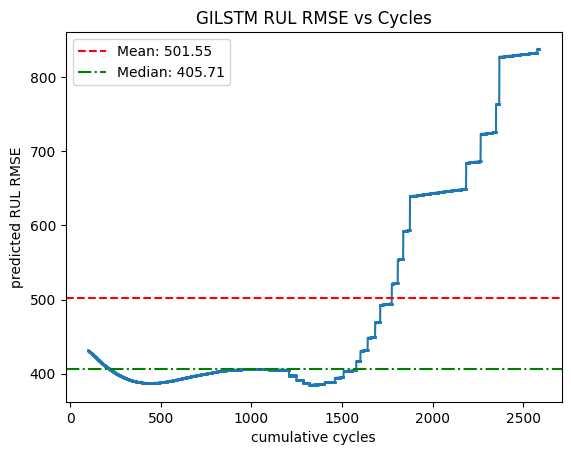

In [82]:
#Plot rmse per cycle use log scale
data = cycle_rmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL RMSE')
plt.title('GILSTM RUL RMSE vs Cycles')
#plt.yscale('symlog')
plt.grid(False)
# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

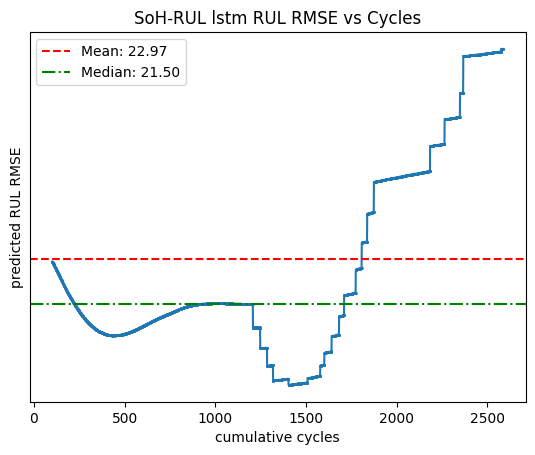

In [83]:
#Plot rmse per cycle use log scale
data = cycle_nrmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL RMSE')
plt.title('SoH-RUL lstm RUL RMSE vs Cycles')
plt.yscale('symlog')
plt.grid(False)
# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

In [84]:
cycle_rmse[100],cycle_nrmse[100]

(431.2555864453316, 22.871109714274244)

In [85]:
#save SoH to RUL rmse results
with open('GILSTM_2_rmse_results.pkl', 'wb') as file:
    pickle.dump([cycle_rmse,cycle_nrmse], file)

In [86]:
## Use NNs from BatteryML but the input is a particular length of cycles eg 100 (similar to BatteryML) or 500, 1000 to improve the accuracy and the output is k,a and b. Here usage of dy/dx may be crucial.


## 3c. LSTMs that predict SoH from SoH then pass the predicted curve through a gompertz fitting model and calculate rul using the inverse gompertz eqn 

In [87]:
## use models from 2b to accomplish this.

In [88]:
def df_to_X_y_tensor(df, window_size=5,output_size=5,I=0):
    '''
    Converts a time series into (X, y) tensors for LSTM training.
    
    X shape: (num_samples, window_size, 1)
    y shape: (num_samples, 1)
    '''
    X, y, X1 = [], [],[]
    
    if len(df) > window_size+I+1:
        X.append(list(df['SoH'])[I:window_size+I])
        y.append(list(df['rul'])[:1])
        X1.append(list(df['SoH'])[:window_size+I])
        # X.append(list(df['SoH'])[I:window_size+I])
        # y.append(list(df['rul'])[window_size+I:1+I+window_size])
    else:
        pass
    X,y,X1 = np.array(X),np.array(y),np.array(X1)
    X_tensor = torch.tensor(X, dtype=torch.float32)
    X1_tensor = torch.tensor(X1, dtype=torch.float32)
    y_tensor = torch.tensor(y, dtype=torch.float32)
    return X_tensor, y_tensor,X1_tensor

def get_x_y_lists(paths):
    X_list,y_list,X1_list = [],[],[]
    for path in paths:
        #print(path)
        df = pd.read_csv(path)
        df['Cycle number'] = df['Cycle number']/10000
        df['rul'] = df['rul']/10000
        #normalize SoH
        df['SoH'] =  df['SoH']/soh_normalization_constant
        df.index = df['Cycle number']
        #SoH = df[model_columns]
        X, y, X1 = df_to_X_y_tensor(df, window_size=WINDOW_SIZE,output_size=OUTPUT_SIZE,I=I)
        X_list.append(X)
        y_list.append(y)
        X1_list.append(X1)
    return X_list,y_list,X1_list

def give_paths_get_loaders(paths,data_type,shuffle=False):
        X_list, y_list, X1_list = get_x_y_lists(paths)
    
        if INPUT_SIZE == 1:
            # Concatenate all X and y
            X_1,y_1,X_2 = torch.cat(X_list, dim=0).unsqueeze(-1),torch.cat(y_list, dim=0).view(-1,INPUT_SIZE),torch.cat(X1_list, dim=0).unsqueeze(-1)
        else:
            X_1,y_1 = torch.cat(X_list, dim=0).squeeze(2),torch.cat(y_list, dim=0).view(-1,INPUT_SIZE)
        
        #print(f"X_{data_type} , y_{data_type} shapes : ",X_1.shape, y_1.shape)
        
        #DataLoader
        #print("load : ")
        loader = DataLoader(TensorDataset(X_1, y_1,X_2), batch_size=32, shuffle=shuffle)
        #print(f"{data_type}loader lengths : ",loader.__len__())
        return loader,X_1,y_1,X_2

def forecast_RUL(loader,X_test,y_test,model):
    ## A function to handle the model's recursive nature and compute RUL
    all_step_predictions = []
    current_window = X_test.clone() # Start with the initial X from loader
    
    # Number of steps you want to forecast into the future
    forecast_steps = 3000 
    
    for _ in range(forecast_steps):
        # 1. Get prediction for current window
        # y_pred shape: [Batch, 1] (Next Capacity)
        y_pred = model(current_window)
        
        # Store for evaluation
        all_step_predictions.append(y_pred.detach())
    
        # 2. UPDATE ALL BATCHES AT ONCE
        # Assuming the value you append is the 1st column of your prediction
        # or the only column if predicting capacity directly.
        next_val = y_pred[:, 0:1].unsqueeze(1) # Shape: [Batch, 1, 1]
        
        # Drop index 0, append new value to end
        current_window = torch.cat((current_window[:, 1:, :], next_val.detach()), dim=1)
    
    # Now current_window is updated for the next iteration
    
    # 1. Stack into a single tensor: [Steps, Batch, Features]
    # We want to analyze feature 0 (Capacity)
    all_preds_tensor = torch.stack(all_step_predictions) 
    capacity_forecasts = all_preds_tensor[:, :, 0] # Shape: [Steps, Batch]
    
    # 2. Create a boolean mask where Capacity <= 0.7
    # Shape: [Steps, Batch]
    is_failed = capacity_forecasts <= 0.7
    
    # 3. Find the first occurrence of True along the 'Steps' dimension (dim 0)
    # torch.argmax returns the index of the first 'True' it finds.
    # If a cell never hits 0.7, it returns 0 (we will handle this below).
    steps_to_failure = torch.argmax(is_failed.to(torch.int), dim=0)
    
    # 4. Handle cells that never reached the threshold
    # argmax returns 0 if no True is found. We check if the value at that 
    # index is actually <= 0.7 to verify it really failed.
    never_failed = ~is_failed.any(dim=0)
    steps_to_failure[never_failed] = len(all_step_predictions) # Assign max steps if no failure
    
    # 5. Convert to list or print results
    failure_steps_list = steps_to_failure.tolist()
    RUL_steps = []
    for i, steps in enumerate(failure_steps_list):
        status = "REACHED EoL" if not never_failed[i] else "STILL HEALTHY"
        #print(f"Cell {i}: {steps+WINDOW_SIZE+I} steps to reach 0.7 ({status})")
        RUL_steps.append(steps+WINDOW_SIZE+I)
    return RUL_steps

In [89]:
INPUT_SIZE, OUTPUT_SIZE = 1,1
soh_normalization_constant = 1.0
cutoff_soh = 0.70/soh_normalization_constant #set cutoff soh wrt to normalizer
WINDOW_SIZE = 100
I = 0
model_columns = ['SoH']
test_loader,X_test,y_test,X1_test = give_paths_get_loaders(test_paths,'test')

In [90]:
## NNs from BatteryML but the input is a particular length of cycles eg 100 (similar to BatteryML)
#initialize model
class LSTMModel(nn.Module):
    def __init__(self, input_size=5, hidden_size=64, output_size=5):
        super(LSTMModel, self).__init__()
        
        # LSTM: input_size=5 match your features
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        
        # Linear Layer: Maps hidden_size (64) -> output_size (5)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # x shape: [32, 10, 5]
        
        # Run LSTM
        # lstm_out shape: [32, 10, 64]
        lstm_out, _ = self.lstm(x)
        
        # Take the last time step only
        last_time_step = lstm_out[:, -1, :] 
        # last_time_step shape: [32, 64]
        
        # Project to 5 output features
        prediction = self.fc(last_time_step)
        # prediction shape: [32, 5]
        
        return prediction
        
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = LSTMModel(input_size=INPUT_SIZE, output_size=OUTPUT_SIZE).to(device)
#load model
model.load_state_dict(torch.load(f"models/SoH-to-SoH-best_lstm_model-window-100.pth",map_location=torch.device(device)))
#generate test_loader
test_rmse = 0
for X_test, y_test,X1_test in test_loader:
    X_test = X_test.to(device)
    X1_test = X1_test.to(device)
    y_pred = model(X_test)
    #print(y_pred,'\n',y_test)
    #inference for test results
    test_rmse += root_mean_squared_error(y_test, y_pred.cpu().detach().numpy())

#print('\n Test RMSE for SoH to SoH prediction : ',test_rmse/len(test_loader))

In [91]:
RUL_steps = forecast_RUL(test_loader,X_test,y_test,model)

In [92]:
all_step_predictions = []
current_window = X_test.clone() # Start with the initial X from loader

# Number of steps you want to forecast into the future
forecast_steps = 3000 

for _ in range(forecast_steps):
    # 1. Get prediction for current window
    # y_pred shape: [Batch, 1] (Next Capacity)
    y_pred = model(current_window)
    
    # Store for evaluation
    all_step_predictions.append(y_pred.detach())

    # 2. UPDATE ALL BATCHES AT ONCE
    # Assuming the value you append is the 1st column of your prediction
    # or the only column if predicting capacity directly.
    next_val = y_pred[:, 0:1].unsqueeze(1) # Shape: [Batch, 1, 1]
    
    # Drop index 0, append new value to end
    current_window = torch.cat((current_window[:, 1:, :], next_val.detach()), dim=1)

# Now current_window is updated for the next iteration

In [93]:
# 1. Stack the list into a single tensor: [Steps, Batch, 4]
from scipy.optimize import minimize


# Define the loss function
def loss_function(params, x, d):
    k , a, b = params  # Parameters to optimize
    predicted_d = gompertz_func(x,k,a,b) # Equation model
    return np.sum((predicted_d - d) ** 2)
                  
#Gompertz func
def gompertz_func(x,k,a,b):
    return k*np.exp(-np.exp(a-(b*x)))

all_preds_tensor = torch.stack(all_step_predictions) 

for i in range(0,len(all_step_predictions[-1])):
    # 2. Extract the 1st feature (Capacity) for the 1st battery in the batch (Index 0)
    # Shape will be [Steps]
    first_battery_forecast = all_preds_tensor[:, i, 0].cpu().numpy()
    
    # 3. Create a time/cycle axis for the forecast
    start_cycle = 101 # Assuming your window was 100
    cycles = range(start_cycle, start_cycle + len(first_battery_forecast))

    
    
    x_data = np.concatenate((np.array(range(1,start_cycle)),np.array(cycles[:RUL_steps[i]])))/10000.0
    y_data = np.concatenate((X1_test[i,:,0].cpu().numpy(),np.array(first_battery_forecast[:RUL_steps[i]])))
    
    

    # Initial guess for a, b, c
    initial_guess = [1, 1, 1]
    
    # Perform optimization
    result = minimize(loss_function, initial_guess, args=(x_data, y_data))
    
    #popt = np.array(p0)#,# _ = curve_fit(gompertz, x_data, y_data, p0=p0, maxfev=10000)
    # Predict
    x_future = np.linspace(0, 1, 3000)
    
    op_k, op_a, op_b = result.x
    #print(op_k, op_a, op_b,np.round(inverse_gompertz_func(y=0.7, k=op_k, a=op_a, b=op_b), decimals=4),RUL_steps[i],y_test[i,:].cpu().numpy())
    # y_pred = gompertz_func(x_future, op_k, op_a, op_b)
    # # Plot
    # plt.plot(x_data, y_data, label='Observed')
    # plt.plot(x_future, y_pred, '-', label='Gompertz Fit')
    # # plt.axhline(0.02, color='red', linestyle='--', label='Threshold')
    # # plt.legend()
    # plt.xlabel("Normalized Cycles")
    # plt.ylabel("SoH")
    # plt.axhline(y=0.7, color='r', linestyle='--', label=f'Failure Threshold (0.7 SoH)')
    # plt.title("Gompertz Fit Real Time")
    # plt.grid(False)
    # plt.legend()
    # plt.show()

In [94]:
x_data, y_data, x_future

(array([1.000e-04, 2.000e-04, 3.000e-04, ..., 1.968e-01, 1.969e-01,
        1.970e-01]),
 array([0.95944697, 0.9313317 , 0.9323254 , ..., 0.690241  , 0.6901652 ,
        0.69008976], dtype=float32),
 array([0.00000000e+00, 3.33444481e-04, 6.66888963e-04, ...,
        9.99333111e-01, 9.99666556e-01, 1.00000000e+00]))

In [95]:
X1_test[i,:,0].shape

torch.Size([100])

In [96]:
#Gompertz func
def gompertz_func(x,k,a,b):
    return k*np.exp(-np.exp(a-(b*x)))

def confirm_SoH_SoH_via_Gompertz(test_loader,X_test,y_test,model,I,X1_test):
    
    all_step_predictions = []
    current_window = X_test.clone() # Start with the initial X from loader
    
    # Number of steps you want to forecast into the future
    forecast_steps = 3000 
    
    for _ in range(forecast_steps):
        # 1. Get prediction for current window
        # y_pred shape: [Batch, 1] (Next Capacity)
        y_pred = model(current_window)
        
        # Store for evaluation
        all_step_predictions.append(y_pred.detach())
    
        # 2. UPDATE ALL BATCHES AT ONCE
        # Assuming the value you append is the 1st column of your prediction
        # or the only column if predicting capacity directly.
        next_val = y_pred[:, 0:1].unsqueeze(1) # Shape: [Batch, 1, 1]
        
        # Drop index 0, append new value to end
        current_window = torch.cat((current_window[:, 1:, :], next_val.detach()), dim=1)
        
    RUL_steps = forecast_RUL(test_loader,X_test,y_test,model)
    
    all_preds_tensor = torch.stack(all_step_predictions) 
    gompertz_predictions = []
    for i in range(0,len(all_step_predictions[-1])):
        # 2. Extract the 1st feature (Capacity) for the 1st battery in the batch (Index 0)
        # Shape will be [Steps]
        first_battery_forecast = all_preds_tensor[:, i, 0].cpu().numpy()
        
        # 3. Create a time/cycle axis for the forecast
        start_cycle = 101+I # start cycle from 100
        cycles = range(start_cycle, start_cycle + len(first_battery_forecast))
    
        
        
        x_data = np.concatenate((np.array(range(1,start_cycle)),np.array(cycles[:RUL_steps[i]])))/10000.0
        y_data = np.concatenate((X1_test[i,:,0].cpu().numpy(),np.array(first_battery_forecast[:RUL_steps[i]])))
        
        
    
        # Initial guess for a, b, c
        initial_guess = [1, 1, 1]
        
        # Perform optimization
        result = minimize(loss_function, initial_guess, args=(x_data, y_data))
        
        #popt = np.array(p0)#,# _ = curve_fit(gompertz, x_data, y_data, p0=p0, maxfev=10000)
        # Predict
        x_future = np.linspace(0, 1, 3000)
        
        op_k, op_a, op_b = result.x
        #print(op_k, op_a, op_b,np.round(inverse_gompertz_func(y=0.7, k=op_k, a=op_a, b=op_b), decimals=4),RUL_steps[i],y_test[i,:].cpu().numpy())
        gompertz_predictions.append(inverse_gompertz_func(y=0.7, k=op_k, a=op_a, b=op_b))
    return gompertz_predictions#,y_test[i,:].cpu().numpy()

In [97]:
cycle_rmse = {}
cycle_nrmse = {}

#test on per cycle basis
for I in range(WINDOW_SIZE,MAX_WINDOW):
    I -= 100
    test_rmse = 0
    test_loader,X_test,y_test,X1_test = give_paths_get_loaders(test_paths,'test')
    if len(test_loader) > 0:  
        for X_test, y_test,X1_test in test_loader:
            X_test = X_test.to(device)
            X1_test = X1_test.to(device)
            break
        y_preds = confirm_SoH_SoH_via_Gompertz(test_loader,X_test,y_test,model,I,X1_test)#forecast_RUL(test_loader,X_test,y_test,model)
        test_rmse = 10000*(root_mean_squared_error(y_test, y_preds)/len(test_loader))#multiply by 10,000 because cycle numers had been normalized using 10000
        
        I += 100
        print(f'RMSE for cycle {I} is {test_rmse}') #,{y_test, y_preds}')
    
    
        cycle_rmse[I] = test_rmse
        cycle_nrmse[I] = test_rmse/(np.mean(y_test.cpu().detach().numpy())*10000)*100
    #break

RMSE for cycle 100 is 338.8472895714459
RMSE for cycle 101 is 338.7655413875505
RMSE for cycle 102 is 338.6796187008238
RMSE for cycle 103 is 338.63096121057777
RMSE for cycle 104 is 338.2988516055368
RMSE for cycle 105 is 337.77960105224395
RMSE for cycle 106 is 337.49410055052005
RMSE for cycle 107 is 337.33499015448587
RMSE for cycle 108 is 336.77134287313714
RMSE for cycle 109 is 336.69579451323335
RMSE for cycle 110 is 336.3831736072432
RMSE for cycle 111 is 336.4414238675449
RMSE for cycle 112 is 336.91007441863377
RMSE for cycle 113 is 336.61226535351545
RMSE for cycle 114 is 336.755430253608
RMSE for cycle 115 is 336.77336074107933
RMSE for cycle 116 is 336.79020099138666
RMSE for cycle 117 is 336.8880989444165
RMSE for cycle 118 is 336.8737459532018
RMSE for cycle 119 is 337.1004959042621
RMSE for cycle 120 is 337.07356766040243
RMSE for cycle 121 is 336.7650362404638
RMSE for cycle 122 is 336.07621044617383
RMSE for cycle 123 is 335.99220308408934
RMSE for cycle 124 is 335.74

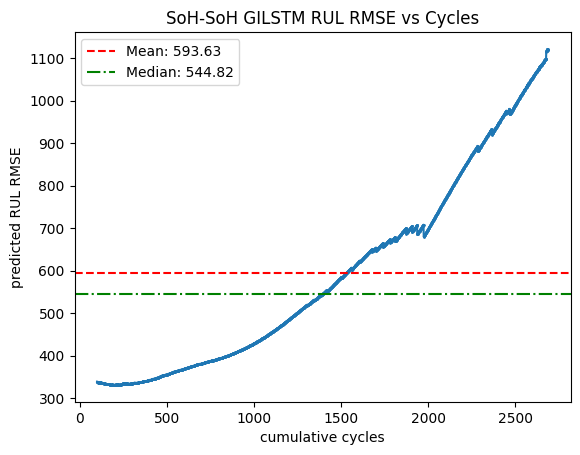

In [98]:
#Plot rmse per cycle use log scale
data = cycle_rmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL RMSE')
plt.title('SoH-SoH GILSTM RUL RMSE vs Cycles')
#plt.yscale('symlog')
plt.grid(False)
# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

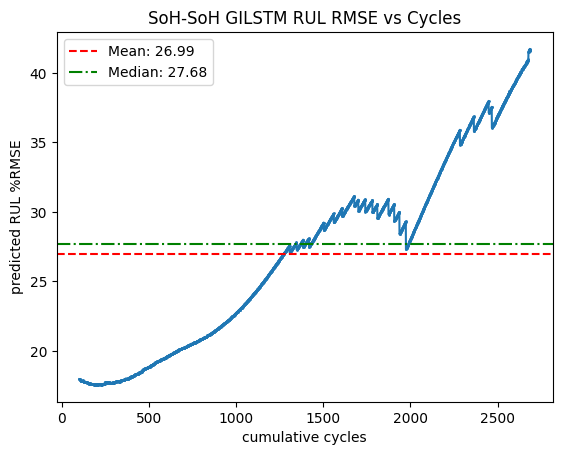

In [99]:
#Plot rmse per cycle use log scale
data = cycle_nrmse

# Extract x and y values
x = list(data.keys())
y = list(data.values())

# Plot
plt.plot(x, y, marker='o',markersize=1)
plt.xlabel('cumulative cycles')
plt.ylabel('predicted RUL %RMSE')
plt.title('SoH-SoH GILSTM RUL RMSE vs Cycles')
#plt.yscale('symlog')
plt.grid(False)
# Calculate Mean and Median
mean_val = np.mean(y)
median_val = np.median(y)
# Add lines for mean and median
plt.axhline(y=mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(y=median_val, color='g', linestyle='-.', label=f'Median: {median_val:.2f}')
plt.legend()
plt.show()

In [100]:
cycle_rmse[100],cycle_nrmse[100]

(338.8472895714459, 17.970349323591673)

In [101]:
#save SoH to RUL rmse results
with open('GILSTM_3_rmse_results.pkl', 'wb') as file:
    pickle.dump([cycle_rmse,cycle_nrmse], file)

In [107]:
#cycle_rmse

In [103]:
file_list = ["gompertz_rmse_results.pkl","SOH_to_RUL_rmse_results.pkl","SOH_to_SoH_RUL_rmse_results.pkl","GILSTM_1_rmse_results.pkl","GILSTM_2_rmse_results.pkl","GILSTM_3_rmse_results.pkl"]
models_names_list = ["Gompertz","LSTM1","LSTM2","GILSTM1","GILSTM2","GILSTM3"]
# A list to store the contents of all files
all_contents = []

for file_path in file_list:
    try:
        with open(file_path, 'rb') as f:
            data = pickle.load(f)
            all_contents.append(data)
            print(f"Successfully loaded {file_path}")
    except (FileNotFoundError, pickle.UnpicklingError) as e:
        print(f"Error loading {file_path}: {e}")

# Now all_contents contains the data from every file
cycle_rmses = {name : content[0] for name, content in zip(models_names_list, all_contents)}
cycle_nrmses = cycle_rmses = {name : content[1] for name, content in zip(models_names_list, all_contents)} #percentage of mean

Successfully loaded gompertz_rmse_results.pkl
Successfully loaded SOH_to_RUL_rmse_results.pkl
Successfully loaded SOH_to_SoH_RUL_rmse_results.pkl
Successfully loaded GILSTM_1_rmse_results.pkl
Successfully loaded GILSTM_2_rmse_results.pkl
Successfully loaded GILSTM_3_rmse_results.pkl


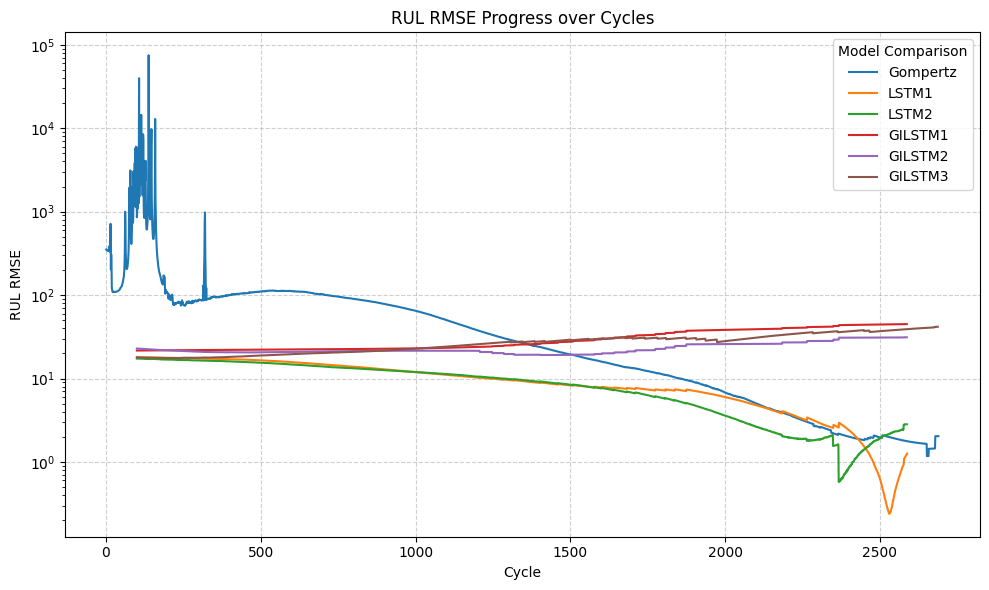

<Figure size 640x480 with 0 Axes>

In [104]:
#cycle rmses

plt.figure(figsize=(10, 6))

# 2. Iterate and plot each one
for label, data_dict in cycle_rmses.items():
    # Sorting keys (cycles) to ensure the line is drawn correctly
    sorted_cycles = sorted(data_dict.keys())
    rmse_values = [data_dict[c] for c in sorted_cycles]
    
    plt.plot(sorted_cycles, rmse_values, linestyle='-', label=label)

# 3. Add formatting
plt.xlabel('Cycle')
plt.ylabel('RUL RMSE')
plt.yscale('log')
plt.title('RUL RMSE Progress over Cycles')
plt.legend(title="Model Comparison") # Displays the labels
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()

# 4. Show or Save the plot
plt.show()
plt.savefig('rmse_comparison.png')

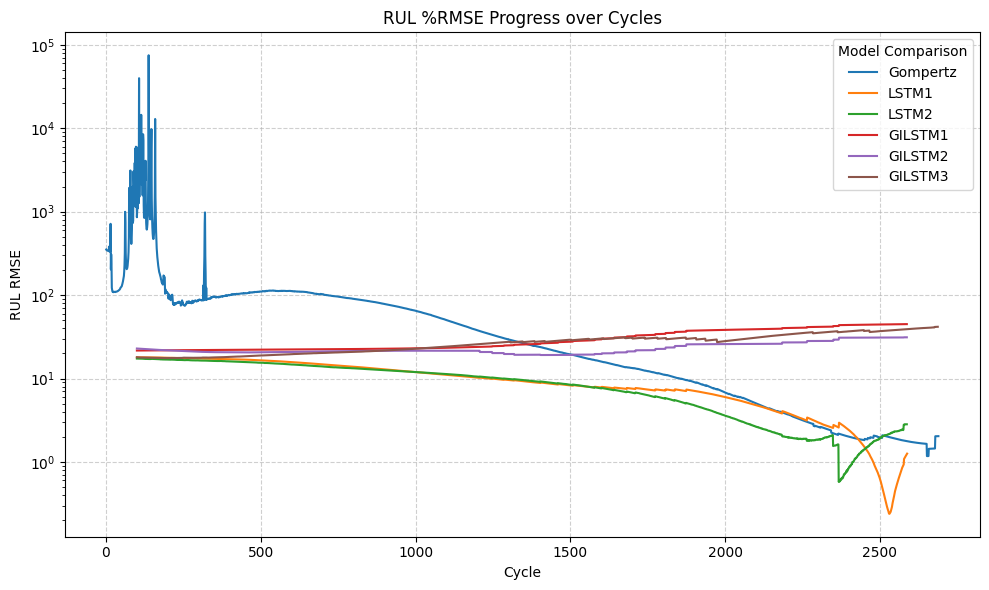

<Figure size 640x480 with 0 Axes>

In [105]:
#cycle nrmses

plt.figure(figsize=(10, 6))

# 2. Iterate and plot each one
for label, data_dict in cycle_nrmses.items():
    # Sorting keys (cycles) to ensure the line is drawn correctly
    sorted_cycles = sorted(data_dict.keys())
    rmse_values = [data_dict[c] for c in sorted_cycles]
    
    plt.plot(sorted_cycles, rmse_values, linestyle='-', label=label)

# 3. Add formatting
plt.xlabel('Cycle')
plt.ylabel('RUL RMSE')
plt.yscale('log')
plt.title('RUL %RMSE Progress over Cycles')
plt.legend(title="Model Comparison") # Displays the labels
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()

# 4. Show or Save the plot
plt.show()
plt.savefig('nrmse_comparison.png')

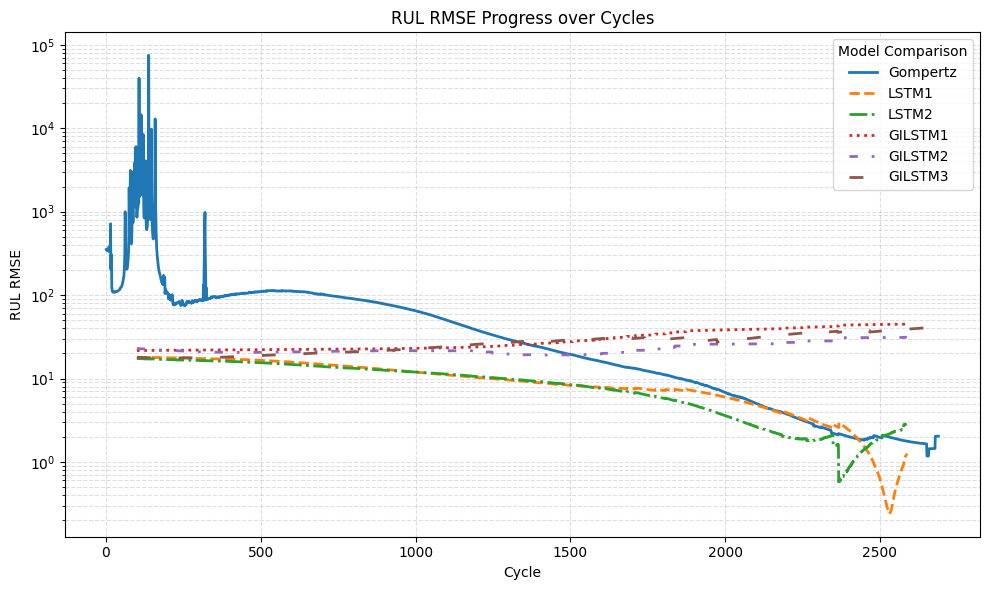